In [1]:
import numpy as np
import matplotlib.pyplot as plt
import barcode_methods as bcm 
import os
import Levenshtein

In [2]:
if not 'path' in globals():
    path = os.getcwd()
print('path: ' + path)

file1 = os.path.join(path, 'fastq/merged_r1.fastq.gz')
file2 = os.path.join(path, 'fastq/merged_r2.fastq.gz')



path: /drive3/Cyrille/Gelbeads


In [3]:
# all three barcode blocks are derived from the same 8nt edit distance 4 set
with open(os.path.join(path, 'gelbarcodes'), 'r') as f:
    bc_list = [line.strip().split(':')[1] for line in f][1:]

bc_list_comp = []
for i in bc_list:
    bc_list_comp.append(bcm.rev_comp(i))


In [4]:
# create the sequencing experiment instance
temp_dat = bcm.seq_experiment([bc_list, bc_list, bc_list], bcerror_tolerance=1)

# define the common barcode structure for the beads
barcode_seq = 'NNNNNNNNAACCNNNNNNNNACAGNNNNNNNN'

# start collecting barcode sequences from reads
temp_dat.process_barcodes(file1, file2, barcode_seq,  verbose=True, rev_complement_s2=True, 
                          ligation_scar='CCTATTCGAG')

total reads processed: 5887069
reads with ambigous barcodes: 33792
reads failed barcode error threshold: 153599
total flawless reads: 5617919
total corrected reads: 81759


In [5]:
cells = []
for i in temp_dat.bc_groups.values():
    cells.append(len(i))

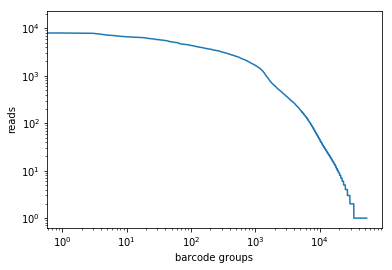

In [7]:
try:
    os.makedirs("qc_output")
except OSError:
    pass

plt.plot(np.sort(cells)[::-1])
plt.yscale('log')
plt.xscale('log')
plt.xlabel('barcode groups')
plt.ylabel('reads')
plt.savefig('qc_output/kneeplot.png', dpi=600)

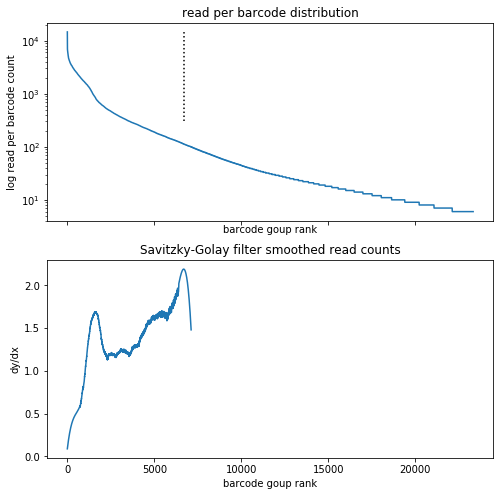

In [8]:
temp_dat.call_cells()

In [10]:
barcodes = []
for i in temp_dat.bc_groups.keys():
    barcodes.append(i)
barcodes = np.sort(barcodes)

with open(os.path.join(path, 'cell_barcodes_amplicon.csv'), 'w') as f:
    for i in barcodes:
        f.write(i + ', ' + str(len(temp_dat.bc_groups[i])) + '\n')

In [11]:
len(temp_dat.cell_barcodes)

6692

In [12]:
try:
    os.makedirs("Cells/fastq")
except OSError:
    pass

temp_dat.write_interleaved_fastq(path+'/Cells/fastq') #barcodes=list(set(temp_dat.cell_barcodes)-already_written)

['AACAACCGAACAACCGAAGGATCC.fastq.gz',
 'AACAACCGAACACGACAGCTTACC.fastq.gz',
 'AACAACCGAACACGACCCAACGAT.fastq.gz',
 'AACAACCGAACCTCTCACTTCGGT.fastq.gz',
 'AACAACCGAACCTCTCCAACCTAG.fastq.gz',
 'AACAACCGAACCTCTCGACCATAC.fastq.gz',
 'AACAACCGAACGGAAGAACGGAAG.fastq.gz',
 'AACAACCGAACGGAAGCCTGGAAT.fastq.gz',
 'AACAACCGAACGGAAGTCCTTCAC.fastq.gz',
 'AACAACCGAAGACTGGGTACACCA.fastq.gz',
 'AACAACCGAAGGATCCAGGTAGAG.fastq.gz',
 'AACAACCGAAGGATCCCTCACAGT.fastq.gz',
 'AACAACCGAATCGCCTAGGTAGAG.fastq.gz',
 'AACAACCGAATGCAGCCTCACAGT.fastq.gz',
 'AACAACCGAATGCAGCTGTCAGTG.fastq.gz',
 'AACAACCGACAAGAGGAATGCAGC.fastq.gz',
 'AACAACCGACAATGCCACCTGTTG.fastq.gz',
 'AACAACCGACAATGCCATGTTGGC.fastq.gz',
 'AACAACCGACAGCACTAGCTTACC.fastq.gz',
 'AACAACCGACAGCACTGATCGGTA.fastq.gz',
 'AACAACCGACCGAATCCGGAATTG.fastq.gz',
 'AACAACCGACCGAATCGCTATTCG.fastq.gz',
 'AACAACCGACCGCTAAACCTAGCA.fastq.gz',
 'AACAACCGACCGCTAACGCCTTAA.fastq.gz',
 'AACAACCGACCGCTAACTAAGCTC.fastq.gz',
 'AACAACCGACCGCTAATCGAACCA.fastq.gz',
 'AACAACCGAC

In [14]:
try:
    os.makedirs("fastq_out")
except OSError:
    pass

temp_dat.write_r1_fastq(path+'/fastq_out')

In [15]:
temp_dat.write_r2_fastq(path+'/fastq_out')

In [16]:
# run part of the DAb-seq pipeline. Please cite: 
# Demaree and Delley et al. "Joint profiling of proteins and DNA in single cells reveals proteogenomic decoupling in leukemia"
# instead of running this commands through the jupyter notebook, it can also be run in the shell

!python genotype.py Gelbeads amplicon.cfg

Initializing pipeline...    


###################################################################################
Step 4: count read alignments to inserts
###################################################################################

Settings:
  Output files: "/drive3/Cyrille/Gelbeads/temp/inserts.*.bt2"
  Line rate: 6 (line is 64 bytes)
  Lines per side: 1 (side is 64 bytes)
  Offset rate: 4 (one in 16)
  FTable chars: 10
  Strings: unpacked
  Max bucket size: default
  Max bucket size, sqrt multiplier: default
  Max bucket size, len divisor: 4
  Difference-cover sample period: 1024
  Endianness: little
  Actual local endianness: little
  Sanity checking: disabled
  Assertions: disabled
  Random seed: 0
  Sizeofs: void*:8, int:4, long:8, size_t:8
Input files DNA, FASTA:
  /drive3/Cyrille/Gelbeads/temp/amplicons.fasta
Building a SMALL index
Reading reference sizes
  Time reading reference sizes: 00:00:00
Calculating joined length
Writing header
Reserving space for joined string


Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CAGTCGAAATGCCACACAGTCGAA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CAGTCGAAATGCCACACAGTCGAA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CTTCCTTCCTCACAGTGTACACCA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CTTCCTTCCTCACAGTGTACACCA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AACAACCGACCTGTTGTCCGTAGT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AACAACCGACCTGTTGTCCGTAGT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/TCGAACCATCCTTCACTGAGGATG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/TCGAACCATCCTTCACTGAGGATG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jarUsing GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsam

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AAGGATCCACCTGTTGCGACAAGA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AAGGATCCACCTGTTGCGACAAGA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GCTATTCGGTGGTCTTGGATTGTC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GCTATTCGGTGGTCTTGGATTGTC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

[August 18, 2020 9:39:33 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.12 minutes.
Runtime.totalMemory()=2063597568
[August 18, 2020 9:39:35 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.17 minutes.
Runtime.totalMemory()=2385510400
[August 18, 2020 9:39:35 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.16 minutes.
Runtime.totalMemory()=2256535552
[August 18, 2020 9:39:35 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.12 minutes.
Runtime.totalMemory()=2145910784
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1

[August 18, 2020 9:39:38 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.20 minutes.
Runtime.totalMemory()=2144337920
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GAATCACGATGTTGGCGGATTGTC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GAATCACGATGTTGGCGGATTGTC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qual

[August 18, 2020 9:39:40 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.20 minutes.
Runtime.totalMemory()=2280128512
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CAACCTAGACAAGAGGAGGTAGAG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CAACCTAGACAAGAGGAGGTAGAG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qual

[August 18, 2020 9:39:43 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.29 minutes.
Runtime.totalMemory()=2446852096
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AGAGTTCGCCATACTGTACGGTCT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AGAGTTCGCCATACTGTACGGTCT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qual

[August 18, 2020 9:39:45 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.27 minutes.
Runtime.totalMemory()=2207252480
[August 18, 2020 9:39:45 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.27 minutes.
Runtime.totalMemory()=2135949312
[August 18, 2020 9:39:46 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.29 minutes.
Runtime.totalMemory()=2291138560
[August 18, 2020 9:39:46 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.24 minutes.
Runtime.totalMemory()=2341994496
[August 18, 2020 9:39:46 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.30 minutes.
Runtime.totalMemory()=2441609216
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_s

Runtime.totalMemory()=2375548928Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GCAAGCAAGTCAGAACACTGACGA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GCAAGCAAGTCAGAACACTGACGA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3

[August 18, 2020 9:39:50 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.32 min

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CCTCATCTAAGGATCCGTGTAACC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CCTCATCTAAGGATCCGTGTAACC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 9:39:54 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.35 minutes.
Runtime.totalMemory()=22864

[August 18, 2020 9:40:00 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.41 minutes.
Runtime.totalMemory()=2174746624
[August 18, 2020 9:40:00 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.16 minutes.
Runtime.totalMemory()=2217213952
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CAGTCGAACGACTCTTGGTCTACA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CAGTCGAACGACTCTTGGTCTACA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --

[August 18, 2020 9:40:05 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.50 minutes.
Runtime.totalMemory()=2189426688

Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GTGGTCTTCTTCTCGAACCGAATC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GTGGTCTTCTTCTCGAACCGAATC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 9:40:05 AM PDT] org.broadinstitute.hellbender.tool

[August 18, 2020 9:40:09 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.23 minutes.
Runtime.totalMemory()=2208825344
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CCTCATCTCAAGACCTGGTCTACA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CCTCATCTCAAGACCTGGTCTACA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qual

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GGCTCAATAACACGACCTTCCTTC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GGCTCAATAACACGACCTTCCTTC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CAGAACACTCGCATTCAAGACTGG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CAGAACACTCGCATTCAAGACTGG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

[August 18, 2020 9:40:23 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.21 minutes.
Runtime.totalMemory()=2366636032
[August 18, 2020 9:40:23 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.33 minutes.
Runtime.totalMemory()=2474639360
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CTAAGCTCCAGAACACAATCGCCT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CTAAGCTCCAGAACACAATCGCCT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CGACAAGAGTGTAACCCGGAATTG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CGACAAGAGTGTAACCCGGAATTG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AACCTCTCCAGTCGAACAAGACCT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AACCTCTCCAGTCGAACAAGACCT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 9:40:33 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.67 minutes.
Runtime.totalMemory()=24688

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACCGAATCTGAGGATGGACTTGAG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACCGAATCTGAGGATGGACTTGAG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 9:40:40 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.48 minutes.
Runtime.totalMemory()=24935

[August 18, 2020 9:40:44 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.27 minutes.
Runtime.totalMemory()=2419589120
[August 18, 2020 9:40:44 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.21 minutes.
Runtime.totalMemory()=2298478592
[August 18, 2020 9:40:44 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.31 minutes.
Runtime.totalMemory()=2366636032
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GGATTGTCATACGTGCGGACGTA

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CCGATGTAATATCCGGGGATTGTC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CCGATGTAATATCCGGGGATTGTC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

[August 18, 2020 9:40:51 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.22 minutes.
Runtime.totalMemory()=2373976064
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AACGGAAGACCTGTTGGCAAGCAA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AACGGAAGACCTGTTGGCAAGCAA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qual

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CAACCTAGTCGCATTCTTCTGAGG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CAACCTAGTCGCATTCTTCTGAGG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GGCTCAATATTGGCTGAAGGATCC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GGCTCAATATTGGCTGAAGGATCC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

[August 18, 2020 9:41:04 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.67 minutes.
Runtime.totalMemory()=2671771648
[August 18, 2020 9:41:04 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.18 minutes.
Runtime.totalMemory()=2330460160
[August 18, 2020 9:41:04 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.12 minutes.
Runtime.totalMemory()=2311061504
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AGCTTACCCTTAGTGGCAGTAAG

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AAGAGGCAACAAGAGGATGCCACA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AAGAGGCAACAAGAGGATGCCACA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

[August 18, 2020 9:41:13 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.30 minutes.
Runtime.totalMemory()=2252865536
[August 18, 2020 9:41:13 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.27 minutes.
Runtime.totalMemory()=2476736512
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CTCACAGTATTGGCTGACAAGAGG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CTCACAGTATTGGCTGACAAGAGG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GAACTGCTGCAAGCAACACTTCCA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GAACTGCTGCAAGCAACACTTCCA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CGGAATTGTGTCAGTGACTTCGGT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CGGAATTGTGTCAGTGACTTCGGT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

[August 18, 2020 9:41:28 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.19 minutes.
Runtime.totalMemory()=2061500416
[August 18, 2020 9:41:28 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.27 minutes.
Runtime.totalMemory()=2471493632
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CCATACTGAGGTAGAGACACCGTA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CCATACTGAGGTAGAGACACCGTA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/TGAGGATGATATCCGGCTTCCTTC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/TGAGGATGATATCCGGCTTCCTTC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

[August 18, 2020 9:41:37 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.49 minutes.
Runtime.totalMemory()=2534408192
[August 18, 2020 9:41:37 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.21 minutes.
Runtime.totalMemory()=2162163712
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GGACGTATACTTCGGTCTATGGAG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GGACGTATACTTCGGTCTATGGAG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CCTGGAATTTCTGAGGGGATTGTC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CCTGGAATTTCTGAGGGGATTGTC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

[August 18, 2020 9:41:48 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.48 minutes.
Runtime.totalMemory()=2527068160
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GAACTGCTTCCGTAGTGCGTTATG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GAACTGCTTCCGTAGTGCGTTATG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qual

[August 18, 2020 9:41:51 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.11 minutes.
Runtime.totalMemory()=2167406592
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AACCAGGTGTGGTCTTATGCCACA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AACCAGGTGTGGTCTTATGCCACA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qual

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GTTCCAAGGGACGTATATATCCGG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GTTCCAAGGGACGTATATATCCGG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

[August 18, 2020 9:42:01 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.72 minutes.
Runtime.totalMemory()=2491940864
[August 18, 2020 9:42:01 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.23 minutes.
Runtime.totalMemory()=2177368064
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ATGTTGGCACACTCAGACACCGTA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ATGTTGGCACACTCAGACACCGTA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --

[August 18, 2020 9:42:05 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.81 minutes.
Runtime.totalMemory()=2430599168
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GTGGTCTTGTTCCAAGATATCCGG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GTGGTCTTGTTCCAAGATATCCGG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qual

[August 18, 2020 9:42:10 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.35 minutes.
Runtime.totalMemory()=2426929152
[August 18, 2020 9:42:10 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.18 minutes.
Runtime.totalMemory()=2160066560
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AGGAACGTATTGGCTGGCAAGCAA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AGGAACGTATTGGCTGGCAAGCAA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --

[August 18, 2020 9:42:13 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.16 minutes.
Runtime.totalMemory()=2333081600
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AATCGCCTAATCGCCTATACGTGC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AATCGCCTAATCGCCTATACGTGC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qual

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GCAAGCAAAATGCAGCAAGAGGCA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GCAAGCAAAATGCAGCAAGAGGCA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

[August 18, 2020 9:42:26 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.18 minutes.
Runtime.totalMemory()=2379218944
[August 18, 2020 9:42:26 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.50 minutes.
Runtime.totalMemory()=2472542208
[August 18, 2020 9:42:26 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.34 minutes.
Runtime.totalMemory()=2531262464
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GGCAATCTCTATGGAGAGTGGTA

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CTCACAGTGGACGTATAACAACCG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CTCACAGTGGACGTATAACAACCG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 9:42:29 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 1.83 minutes.
Runtime.totalMemory()=24379

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GCGTTATGGTGTAACCTGTCAGTG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GCGTTATGGTGTAACCTGTCAGTG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AACCTCTCAATGCAGCAACAACCG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AACCTCTCAATGCAGCAACAACCG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

[August 18, 2020 9:42:41 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.25 minutes.
Runtime.totalMemory()=2198863872
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AAGACTGGCGTAGGTTCTCGTGAT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AAGACTGGCGTAGGTTCTCGTGAT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qual

[August 18, 2020 9:42:46 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.44 minutes.Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GGCTCAATCGACTCTTCAAGGTGA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GGCTCAATCGACTCTTCAAGGTGA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3

Runtime.totalMemory()=24783


Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CCTCATCTAGTGGTACAGCATGGA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CCTCATCTAGTGGTACAGCATGGA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 9:42:51 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.31 minutes.
Runtime.totalMemory()=2391277568
[August 18, 2020 9:42:52 AM PDT] org.broadinstitute.hellbender.tool

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AATGCAGCCGACTCTTCTCACAGT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AATGCAGCCGACTCTTCTCACAGT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 9:42:56 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.34 minutes.
Runtime.totalMemory()=24998

[August 18, 2020 9:42:59 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.28 minutes.
Runtime.totalMemory()=2295857152
[August 18, 2020 9:43:00 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.21 minutes.
Runtime.totalMemory()=2237661184
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACAATGCCTCATGCGTCAGTAAGG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACAATGCCTCATGCGTCAGTAAGG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --

Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACTGACGAGATGACTCCTTAGTGG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACTGACGAGATGACTCCTTAGTGG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3

Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar Haplot

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACACTCAGGACCATACCTTCTCGA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACACTCAGGACCATACCTTCTCGA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 9:43:13 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 1.62 minutes.
Runtime.totalMemory()=26062

[August 18, 2020 9:43:16 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.13 minutes.
Runtime.totalMemory()=2181038080
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GATCGGTATCCGTAGTGGCTCAAT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GATCGGTATCCGTAGTGGCTCAAT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qual

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CAACCTAGCCTGGAATTGTGTGCT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CAACCTAGCCTGGAATTGTGTGCT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 9:43:20 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.41 minutes.[August 18, 2020 9:43:20 AM 

[August 18, 2020 9:43:23 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.29 minutes.
Runtime.totalMemory()=2427453440
[August 18, 2020 9:43:24 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.29 minutes.
Runtime.totalMemory()=2094006272
[August 18, 2020 9:43:24 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.39 minutes.
Runtime.totalMemory()=2329935872
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CCAGTTACCCAGTTACCCAGTTA

[August 18, 2020 9:43:27 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.25 minutes.
Runtime.totalMemory()=2351955968
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CCTCATCTTGTGTGCTATATCCGG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CCTCATCTTGTGTGCTATATCCGG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qual

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CAACCTAGACACTCAGAGCTTACC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CAACCTAGACACTCAGAGCTTACC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 9:43:31 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.19 minutes.
Runtime.totalMemory()=23362

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CCAACGATTCGAACCAAACAACCG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CCAACGATTCGAACCAAACAACCG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

[August 18, 2020 9:43:41 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.22 minutes.
Runtime.totalMemory()=2435842048
[August 18, 2020 9:43:41 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.49 minutes.
Runtime.totalMemory()=2426404864
[August 18, 2020 9:43:42 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.37 minutes.
Runtime.totalMemory()=2291662848
[August 18, 2020 9:43:42 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.23 minutes.
Runtime.totalMemory()=2392326144
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1

[August 18, 2020 9:43:45 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.28 minutes.
Runtime.totalMemory()=2430599168
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACACTCAGGACTTGAGAGCACATG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACACTCAGGACTTGAGAGCACATG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qual

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACCTGTTGTGAGGATGCAAGACCT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACCTGTTGTGAGGATGCAAGACCT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACCGCTAAGACCATACAGTGGTAC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACCGCTAAGACCATACAGTGGTAC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 9:43:54 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.28 minutes.
Runtime.totalMemory()=21726

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GCGTTATGACCGCTAAAGCTTACC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GCGTTATGACCGCTAAAGCTTACC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GCTATTCGTGTGTGCTATACGTGC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GCTATTCGTGTGTGCTATACGTGC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

[August 18, 2020 9:44:06 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.18 minutes.
Runtime.totalMemory()=2372927488
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AGGTAGAGCTCACAGTGATCGGTA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AGGTAGAGCTCACAGTGATCGGTA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qual

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AGCATGGACGTGCATACAAGACCT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AGCATGGACGTGCATACAAGACCT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CAGTAAGGGAGAGAGTACAGCACT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CAGTAAGGGAGAGAGTACAGCACT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 9:44:14 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.22 minutes.
Runtime.totalMemory()=22062

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ATTGGCTGTGTGTGCTTTCCGCTT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ATTGGCTGTGTGTGCTTTCCGCTT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 9:44:20 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.23 minutes.
Runtime.totalMemory()=23357

[August 18, 2020 9:44:25 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.31 minutes.
Runtime.totalMemory()=2311061504
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/TCCTTCACGATCGGTAAGGAACGT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/TCCTTCACGATCGGTAAGGAACGT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qual

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GTGTAACCAGCTTACCCGGAATTG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GTGTAACCAGCTTACCCGGAATTG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

[August 18, 2020 9:44:30 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.35 minutes.
Runtime.totalMemory()=2601517056
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CTGGTTCAGCGTTATGCTTAGTGG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CTGGTTCAGCGTTATGCTTAGTGG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qual

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/TTAACGCGTCCTTCACGTGTAACC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/TTAACGCGTCCTTCACGTGTAACC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CCGATGTACAAGGTGATTGTTCCG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CCGATGTACAAGGTGATTGTTCCG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

[August 18, 2020 9:44:44 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.25 minutes.
Runtime.totalMemory()=2199388160
[August 18, 2020 9:44:44 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.12 minutes.
Runtime.totalMemory()=2473590784
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GATGACTCATACGTGCAGCTTACC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GATGACTCATACGTGCAGCTTACC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/TCCGTAGTGTGTAACCCTATGGAG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/TCCGTAGTGTGTAACCCTATGGAG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GGTCTACAGCTATTCGACTTCGGT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GGTCTACAGCTATTCGACTTCGGT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 9:44:54 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.14 minutes.
Runtime.totalMemory()=21946

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AAGACTGGAGCATGGAACGCTTGT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AAGACTGGAGCATGGAACGCTTGT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CTTAGTGGCTTAGTGGACTTCGGT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CTTAGTGGCTTAGTGGACTTCGGT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CGTGCATAAGGAACGTACAATGCC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CGTGCATAAGGAACGTACAATGCC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 9:45:04 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.11 minutes.
Runtime.totalMemory()=22680

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ATTGGCTGCAAGGTGACAGTAAGG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ATTGGCTGCAAGGTGACAGTAAGG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 9:45:08 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.48 minutes.
Runtime.totalMemory()=24814

[August 18, 2020 9:45:14 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.15 minutes.
Runtime.totalMemory()=2322071552
[August 18, 2020 9:45:14 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.27 minutes.
Runtime.totalMemory()=2381840384
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACACCGTATACGGTCTAGCTTACC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACACCGTATACGGTCTAGCTTACC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CTTAGTGGCGACAAGAAAGACTGG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CTTAGTGGCGACAAGAAAGACTGG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 9:45:16 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.17 minutes.
Runtime.totalMemory()=23440

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/TCATGCGTAGCACATGCGTGCATA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/TCATGCGTAGCACATGCGTGCATA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 9:45:21 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.29 minutes.
Runtime.totalMemory()=23267

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GACCATACCGACAAGAAGTGGTAC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GACCATACCGACAAGAAGTGGTAC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

[August 18, 2020 9:45:28 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.37 minutes.
Runtime.totalMemory()=2164260864
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GTACACCACTTCCTTCAACCAGGT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GTACACCACTTCCTTCAACCAGGT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qual

[August 18, 2020 9:45:33 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.21 minutes.
Runtime.totalMemory()=2394947584
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CAACCTAGGAATCACGTTCTGAGG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CAACCTAGGAATCACGTTCTGAGG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qual

[August 18, 2020 9:45:39 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.31 minutes.
Runtime.totalMemory()=2458910720
[August 18, 2020 9:45:39 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.35 minutes.
Runtime.totalMemory()=2250244096
[August 18, 2020 9:45:39 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.19 minutes.
Runtime.totalMemory()=2119172096
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACTTCGGTTGTCAGTGTACGGTC

Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AGGAACGTGGCTCAATGGCTCAAT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AGGAACGTGGCTCAATGGCTCAAT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AGGAACGTCAGTAAGGCAGTAAGG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AGGAACGTCAGTAAGGCAGTAAGG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

[August 18, 2020 9:45:49 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.63 minutes.
Runtime.totalMemory()=2326265856
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/TCCTTCACGTTCCAAGGATCGGTA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/TCCTTCACGTTCCAAGGATCGGTA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qual

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACGTCAACCTCGTGATGATGACTC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACGTCAACCTCGTGATGATGACTC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 9:45:56 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.22 minutes.
Runtime.totalMemory()=22203

[August 18, 2020 9:46:02 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.26 minutes.
Runtime.totalMemory()=2346188800
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GTGGTCTTCCATACTGCTTAGTGG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GTGGTCTTCCATACTGCTTAGTGG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qual

Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ATGTTGGCGAACTGCTATGTTGGC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ATGTTGGCGAACTGCTATGTTGGC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level

[August 18, 2020 9:46:10 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.64 minutes.
Runtime.totalMemory()=2549088256
[August 18, 2020 9:46:10 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.42 minutes.
Runtime.totalMemory()=2560622592
[August 18, 2020 9:46:10 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.34 minutes.
Runtime.totalMemory()=2548563968
[August 18, 2020 9:46:10 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.72 minutes.
Runtime.totalMemory()=2501378048
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CACTTCCATTGTTCCGCCGATGTA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CACTTCCATTGTTCCGCCGATGTA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

[August 18, 2020 9:46:15 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.19 minutes.
Runtime.totalMemory()=2337800192
[August 18, 2020 9:46:15 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.33 minutes.Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AAGACTGGGGCAATCTAATGCAGC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AAGACTGGGGCAATCTAATGCAGC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-

[August 18, 2020 9:46:21 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.54 minutes.
Runtime.totalMemory()=2468872192
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CGACTCTTCTATGGAGTTCTGAGG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CGACTCTTCTATGGAGTTCTGAGG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qual

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GGCAATCTTCATGCGTTCGCATTC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GGCAATCTTCATGCGTTCGCATTC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 9:46:27 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.27 minutes.
Runtime.totalMemory()=22539

[August 18, 2020 9:46:31 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.20 minutes.
Runtime.totalMemory()=2140667904
[August 18, 2020 9:46:31 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.32 minutes.
Runtime.totalMemory()=2355101696
[August 18, 2020 9:46:32 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.33 minutes.
Runtime.totalMemory()=2451570688
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AGCACATGCGCCTTAATCGAACC

[August 18, 2020 9:46:35 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.33 minutes.
Runtime.totalMemory()=2612527104
[August 18, 2020 9:46:35 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.25 minutes.
Runtime.totalMemory()=2319450112
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACAATGCCCAGTCGAACGTAGGTT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACAATGCCCAGTCGAACGTAGGTT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --

Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CCAACGATGGATTGTCCTTAGTGG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CCAACGATGGATTGTCCTTAGTGG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CCTGGAATTTCCGCTTACAAGAGG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CCTGGAATTTCCGCTTACAAGAGG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 9:46:42 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.23 minutes.
Runtime.totalMemory()=22581

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GAACTGCTGGTCTACAACACTCAG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GAACTGCTGGTCTACAACACTCAG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

[August 18, 2020 9:46:53 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.23 minutes.
Runtime.totalMemory()=2161115136
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GCTATTCGGAGAGAGTTTGTTCCG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GCTATTCGGAGAGAGTTTGTTCCG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qual

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACAGCACTACCTAGCATCCGTAGT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACAGCACTACCTAGCATCCGTAGT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 9:46:56 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.27 minutes.
Runtime.totalMemory()=22948

[August 18, 2020 9:47:00 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.27 minutes.
Runtime.totalMemory()=2511863808
[August 18, 2020 9:47:00 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.21 minutes.
Runtime.totalMemory()=2252865536
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CTCGTGATTTAACGCGAGCACATG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CTCGTGATTTAACGCGAGCACATG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AACAACCGATACGTGCAACCTCTC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AACAACCGATACGTGCAACCTCTC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 9:47:07 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.57 minutes.
Runtime.totalMemory()=24468

[August 18, 2020 9:47:10 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.23 minutes.
Runtime.totalMemory()=2175270912
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CTCGTGATACACCGTACAAGACCT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CTCGTGATACACCGTACAAGACCT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qual

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CGGAATTGGGCTCAATATTGGCTG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CGGAATTGGGCTCAATATTGGCTG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CGGAATTGACAAGAGGTTGTTCCG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CGGAATTGACAAGAGGTTGTTCCG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 9:47:19 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.23 minutes.
Runtime.totalMemory()=23163

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ATTGGCTGTGTGTGCTCTTCCTTC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ATTGGCTGTGTGTGCTCTTCCTTC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 9:47:22 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.21 minutes.
Runtime.totalMemory()=21265

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AAGAGGCAACGTCAACAGGAACGT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AAGAGGCAACGTCAACAGGAACGT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CTCACAGTAAGGATCCCCTCATCT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CTCACAGTAAGGATCCCCTCATCT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 9:47:26 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.36 minutes.
Runtime.totalMemory()=23571

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACACTCAGTACGGTCTCCTGGAAT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACACTCAGTACGGTCTCCTGGAAT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CTAAGCTCCTAAGCTCAGGTAGAG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CTAAGCTCCTAAGCTCAGGTAGAG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 9:47:36 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.21 minutes.
Runtime.totalMemory()=23026

[August 18, 2020 9:47:41 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.21 minutes.
Runtime.totalMemory()=2347761664
[August 18, 2020 9:47:41 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.42 minutes.
Runtime.totalMemory()=2566389760
[August 18, 2020 9:47:41 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.12 minutes.
Runtime.totalMemory()=2304770048
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CCTCATCTCTTCCTTCGGTCTAC

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACGTCAACATGTTGGCAGTGGTAC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACGTCAACATGTTGGCAGTGGTAC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

[August 18, 2020 9:47:46 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.27 minutes.
Runtime.totalMemory()=2318401536
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/TTAACGCGGGCTCAATTTAACGCG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/TTAACGCGGGCTCAATTTAACGCG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qual

[August 18, 2020 9:47:52 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.39 minutes.
Runtime.totalMemory()=2319450112
[August 18, 2020 9:47:54 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.19 minutes.
Runtime.totalMemory()=2275409920
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACACCGTATTGTTCCGCTATGGAG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACACCGTATTGTTCCGCTATGGAG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACAGCACTGACCATACCCGATGTA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACAGCACTGACCATACCCGATGTA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 9:47:57 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.30 minutes.
Runtime.totalMemory()=23288

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CCTCATCTGATGACTCCAACCTAG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CCTCATCTGATGACTCCAACCTAG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 9:48:02 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.65 minutes.
Runtime.totalMemory()=24573

[August 18, 2020 9:48:07 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.18 minutes.
Runtime.totalMemory()=2290614272
[August 18, 2020 9:48:07 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.33 minutes.
Runtime.totalMemory()=2437414912
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AATCGCCTGCTATTCGCACTTCCA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AATCGCCTGCTATTCGCACTTCCA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --

[August 18, 2020 9:48:10 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.23 minutes.
Runtime.totalMemory()=2317352960
[August 18, 2020 9:48:10 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.24 minutes.
Runtime.totalMemory()=2125463552
[August 18, 2020 9:48:10 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.21 minutes.
Runtime.totalMemory()=2109734912
[August 18, 2020 9:48:11 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.33 minutes.
Runtime.totalMemory()=2519728128
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1

[August 18, 2020 9:48:13 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.26 minutes.
Runtime.totalMemory()=2273312768
[August 18, 2020 9:48:13 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.23 minutes.
Runtime.totalMemory()=2261778432
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/TCGCATTCATGTTGGCGGATTGTC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/TCGCATTCATGTTGGCGGATTGTC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --

[August 18, 2020 9:48:16 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.24 minutes.
Runtime.totalMemory()=2398617600
[August 18, 2020 9:48:16 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.29 minutes.
Runtime.totalMemory()=2241331200
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GCTATTCGCAGTAAGGTCCTTCAC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GCTATTCGCAGTAAGGTCCTTCAC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --

[August 18, 2020 9:48:20 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.10 minutes.
Runtime.totalMemory()=2469920768
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACACCGTACCTGGAATGAATCACG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACACCGTACCTGGAATGAATCACG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qual

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACCGAATCCTTCCTTCCTCACAGT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACCGAATCCTTCCTTCCTCACAGT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GTGGTCTTACAGCACTAATGCAGC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GTGGTCTTACAGCACTAATGCAGC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 9:48:33 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.53 minutes.
Runtime.totalMemory()=27336

[August 18, 2020 9:48:35 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.28 minutes.[August 18, 2020 9:48:35 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.79 minutes.
Runtime.totalMemory()=2575826944
[August 18, 2020 9:48:35 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.11 minutes.
Runtime.totalMemory()=2512912384

Runtime.totalMemory()=2247098368
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/TGTCAGTGACCTAGCACTCACAG

[August 18, 2020 9:48:37 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.20 minutes.
Runtime.totalMemory()=2303197184
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CTCACAGTACACTCAGCAGTCGAA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CTCACAGTACACTCAGCAGTCGAA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qual

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jarUsing GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CCATACTGCCATACTGGAATCACG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CCATACTGCCATACTGGAATCACG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3

Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CTTAGTGGCGTAGGTTAAGACTGG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CTTAGTGGCGTAGGTTAAGACTGG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 9:48:45 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 1.30 minutes.
Runtime.totalMemory()=23341

[August 18, 2020 9:48:49 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.59 minutes.
Runtime.totalMemory()=2486697984
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AACAACCGCCAGTTACCTCACAGT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AACAACCGCCAGTTACCTCACAGT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qual

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CCTGGAATCGACAAGATTAACGCG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CCTGGAATCGACAAGATTAACGCG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 9:48:54 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.24 minutes.
Runtime.totalMemory()=23655

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AATGCAGCATATCCGGGGCAATCT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AATGCAGCATATCCGGGGCAATCT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/TGAGGATGAACAACCGCACTTCCA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/TGAGGATGAACAACCGCACTTCCA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 9:49:04 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.17 minutes.
Runtime.totalMemory()=22748

[August 18, 2020 9:49:07 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.23 minutes.
Runtime.totalMemory()=2379218944
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AGCATGGAGAATCACGGACCATAC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AGCATGGAGAATCACGGACCATAC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qual

[August 18, 2020 9:49:10 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.14 minutes.
Runtime.totalMemory()=2393374720
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CTTAGTGGAATCGCCTCGGAATTG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CTTAGTGGAATCGCCTCGGAATTG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qual

[August 18, 2020 9:49:13 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.27 minutes.
Runtime.totalMemory()=2131755008
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CCATACTGAAGGATCCAGGTCCTA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CCATACTGAAGGATCCAGGTCCTA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qual

[August 18, 2020 9:49:20 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.58 minutes.
Runtime.totalMemory()=2389704704
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACAGCACTCGCCTTAAGTTCCAAG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACAGCACTCGCCTTAAGTTCCAAG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qual

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GAACTGCTCCGATGTACACTTCCA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GAACTGCTCCGATGTACACTTCCA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 9:49:27 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.74 minutes.
Runtime.totalMemory()=26885

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GATCGGTACCATACTGCAGTAAGG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GATCGGTACCATACTGCAGTAAGG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

[August 18, 2020 9:49:33 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.22 minutes.
Runtime.totalMemory()=2240282624
[August 18, 2020 9:49:33 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.22 minutes.
Runtime.totalMemory()=2307915776
[August 18, 2020 9:49:33 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.63 minutes.
Runtime.totalMemory()=2395996160
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACCGAATCGAACTGCTCAACCTA

[August 18, 2020 9:49:37 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.46 minutes.
Runtime.totalMemory()=2413821952
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AGTGGTACAACGGAAGTACGGTCT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AGTGGTACAACGGAAGTACGGTCT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qual

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CGACAAGACAAGACCTCGTAGGTT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CGACAAGACAAGACCTCGTAGGTT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 9:49:43 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.34 minutes.
Runtime.totalMemory()=25333

[August 18, 2020 9:49:46 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.70 minutes.
Runtime.totalMemory()=2530738176
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ATACGTGCATGCCACAATGCCACA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ATACGTGCATGCCACAATGCCACA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qual

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GACTTGAGGCGTTATGCTCGTGAT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GACTTGAGGCGTTATGCTCGTGAT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

[August 18, 2020 9:49:51 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.80 minutes.
Runtime.totalMemory()=2445279232
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ATACGTGCATGTTGGCTTGTTCCG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ATACGTGCATGTTGGCTTGTTCCG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qual

[August 18, 2020 9:49:58 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.33 minutes.
Runtime.totalMemory()=2291138560
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ATGTTGGCACGCTTGTCAGAACAC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ATGTTGGCACGCTTGTCAGAACAC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qual

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AACCAGGTATATCCGGGACTTGAG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AACCAGGTATATCCGGGACTTGAG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/TTCCGCTTCCGATGTAGTTCCAAG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/TTCCGCTTCCGATGTAGTTCCAAG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GTGGTCTTGTGTAACCCTAAGCTC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GTGGTCTTGTGTAACCCTAAGCTC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AAGGATCCTGTCAGTGTCGCATTC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AAGGATCCTGTCAGTGTCGCATTC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

[August 18, 2020 9:50:18 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.26 minutes.
Runtime.totalMemory()=2443706368
[August 18, 2020 9:50:18 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 1.93 minutes.
Runtime.totalMemory()=2367160320
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AATCGCCTCGTGCATAAAGACTGG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AATCGCCTCGTGCATAAAGACTGG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --

[August 18, 2020 9:50:23 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.29 minutes.
Runtime.totalMemory()=2196766720
[August 18, 2020 9:50:23 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.18 minutes.
Runtime.totalMemory()=2161115136
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ATGCCACAACGTCAACGTACACCA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ATGCCACAACGTCAACGTACACCA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --

[August 18, 2020 9:50:28 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.17 minutes.
Runtime.totalMemory()=2221408256
[August 18, 2020 9:50:29 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.36 minutes.
Runtime.totalMemory()=2475163648
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AACCAGGTTCATGCGTGCTATTCG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AACCAGGTTCATGCGTGCTATTCG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AAGAGGCACACTTCCACGACTCTT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AAGAGGCACACTTCCACGACTCTT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CTTCTCGAATGCCACACTTAGTGG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CTTCTCGAATGCCACACTTAGTGG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACACCGTAACAATGCCACAGCACT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACACCGTAACAATGCCACAGCACT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 9:50:39 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.15 minutes.
Runtime.totalMemory()=22785

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACTGACGAAGGTCCTAACACTCAG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACTGACGAAGGTCCTAACACTCAG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

[August 18, 2020 9:50:45 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.25 minutes.
Runtime.totalMemory()=2384461824
[August 18, 2020 9:50:46 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.19 minutes.
Runtime.totalMemory()=2427977728
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CTCACAGTCAGAACACACACTCAG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CTCACAGTCAGAACACACACTCAG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --

[August 18, 2020 9:50:52 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.34 minutes.
Runtime.totalMemory()=2107113472
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CGTGCATAAGGAACGTACGCTTGT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CGTGCATAAGGAACGTACGCTTGT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qual

[August 18, 2020 9:50:55 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.32 minutes.
Runtime.totalMemory()=2484600832
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AACACGACGAATCACGGTGTAACC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AACACGACGAATCACGGTGTAACC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qual

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar[August 18, 2020 9:50:56 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.23 minutes.
Runtime.totalMemory()=2317352960
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AGCATGGAGGCAATCTGGACGTAT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AGCATGGAGGCAATCTGGACGTAT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-rea

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GATCGGTACCGATGTACTGGTTCA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GATCGGTACCGATGTACTGGTTCA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

[August 18, 2020 9:51:04 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.22 minutes.
Runtime.totalMemory()=2149056512
[August 18, 2020 9:51:04 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.23 minutes.
Runtime.totalMemory()=2434269184
[August 18, 2020 9:51:04 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.16 minutes.
Runtime.totalMemory()=2303721472
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jarUsing GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFast

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ATACGTGCAAGACTGGAGCACATG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ATACGTGCAAGACTGGAGCACATG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

[August 18, 2020 9:51:12 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.18 minutes.
Runtime.totalMemory()=2466250752
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GATGACTCGATCGGTAGCTATTCG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GATGACTCGATCGGTAGCTATTCG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qual

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CCGATGTATTAACGCGAACAACCG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CCGATGTATTAACGCGAACAACCG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACACCGTAAGGTCCTAAGCACATG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACACCGTAAGGTCCTAAGCACATG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 9:51:21 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.25 minutes.
Runtime.totalMemory()=23482

[August 18, 2020 9:51:24 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.25 minutes.
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CTAAGCTCCTTAGTGGAACACGAC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CTAAGCTCCTTAGTGGAACACGAC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Runtime.totalMemory()=24494

Runtime.totalMemory()=2451046400
[August 18, 2020 9:51:28 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.28 minutes.
Runtime.totalMemory()=2344615936
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACAAGAGGATGCCACAACACCGTA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACAAGAGGATGCCACAACACCGTA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACTTCGGTACCGCTAACGCCTTAA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACTTCGGTACCGCTAACGCCTTAA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 9:51:32 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.29 minutes.
Runtime.totalMemory()=22974

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACCGCTAACCAGTTACCACTTCCA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACCGCTAACCAGTTACCACTTCCA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 9:51:35 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.30 minutes.
Runtime.totalMemory()=20352

[August 18, 2020 9:51:39 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.29 minutes.
Runtime.totalMemory()=2415394816
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/TTCCGCTTAGCACATGCCTCATCT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/TTCCGCTTAGCACATGCCTCATCT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qual

[August 18, 2020 9:51:41 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.27 minutes.
Runtime.totalMemory()=2405433344
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CACTTCCATCCGTAGTGTGGTCTT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CACTTCCATCCGTAGTGTGGTCTT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qual

[August 18, 2020 9:51:45 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.69 minutes.
Runtime.totalMemory()=2339373056
[August 18, 2020 9:51:46 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.14 minutes.
Runtime.totalMemory()=2198863872
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GAACTGCTACAATGCCCCTCATCT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GAACTGCTACAATGCCCCTCATCT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CTTAGTGGAAGACTGGCCAACGAT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CTTAGTGGAAGACTGGCCAACGAT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 9:51:52 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.19 minutes.
Runtime.totalMemory()=21579

[August 18, 2020 9:51:55 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.26 minutes.
Runtime.totalMemory()=2284847104
[August 18, 2020 9:51:55 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 1.15 minutes.
Runtime.totalMemory()=2507669504
[August 18, 2020 9:51:55 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.21 minutes.
Runtime.totalMemory()=2211971072
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CTCGTGATACGTCAACGGCTCAA

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACAATGCCGATCGGTAAGGAACGT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACAATGCCGATCGGTAAGGAACGT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

[August 18, 2020 9:52:00 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.26 minutes.
Runtime.totalMemory()=2207776768
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AGTGGTACGGCAATCTACCTAGCA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AGTGGTACGGCAATCTACCTAGCA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qual

[August 18, 2020 9:52:05 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.27 minutes.
Runtime.totalMemory()=2306867200
[August 18, 2020 9:52:06 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.28 minutes.
Runtime.totalMemory()=2383937536
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CCTCATCTAGCTTACCAGCACATG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CCTCATCTAGCTTACCAGCACATG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACCTAGCACCAACGATTTCCGCTT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACCTAGCACCAACGATTTCCGCTT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 9:52:10 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.29 minutes.
Runtime.totalMemory()=23713

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AAGAGGCAAATGCAGCTCGAACCA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AAGAGGCAAATGCAGCTCGAACCA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/TGTGTGCTCCATACTGCACTTCCA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/TGTGTGCTCCATACTGCACTTCCA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GTGTAACCAACACGACGACCATAC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GTGTAACCAACACGACGACCATAC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/TTAACGCGCTATGGAGCTGGTTCA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/TTAACGCGCTATGGAGCTGGTTCA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

[August 18, 2020 9:52:32 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.23 minutes.
Runtime.totalMemory()=2166882304
[August 18, 2020 9:52:33 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.19 minutes.
Runtime.totalMemory()=2333081600
[August 18, 2020 9:52:33 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.20 minutes.
Runtime.totalMemory()=2313158656
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/TCCTTCACCAGTCGAACAGTCGA

[August 18, 2020 9:52:36 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.28 minutes.
Runtime.totalMemory()=2214068224
[August 18, 2020 9:52:37 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.24 minutes.
Runtime.totalMemory()=2456289280
[August 18, 2020 9:52:37 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.33 minutes.
Runtime.totalMemory()=2405433344
[August 18, 2020 9:52:37 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.42 minutes.
Runtime.totalMemory()=2484600832
[August 18, 2020 9:52:37 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.34 minutes.
Runtime.totalMemory()=2382888960
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_s

[August 18, 2020 9:52:39 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.30 minutes.
Runtime.totalMemory()=2255486976
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jarUsing GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CGACAAGAGACCATACCAGTCGAA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CGACAAGAGACCATACCAGTCGAA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-rea

[August 18, 2020 9:52:42 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.15 minutes.
Runtime.totalMemory()=2329411584
[August 18, 2020 9:52:42 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.22 minutes.
Runtime.totalMemory()=2362441728
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AACACGACATGTTGGCGACCATAC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AACACGACATGTTGGCGACCATAC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ATGTTGGCAAGACTGGGGCAATCT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ATGTTGGCAAGACTGGGGCAATCT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 9:52:48 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.23 minutes.
Runtime.totalMemory()=24793

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACACTCAGAACAACCGAACAACCG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACACTCAGAACAACCGAACAACCG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 9:52:55 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.40 minutes.
Runtime.totalMemory()=25380

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACACTCAGCTTCTCGAACCGCTAA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACACTCAGCTTCTCGAACCGCTAA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 9:52:59 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.98 minutes.
Runtime.totalMemory()=27089

[August 18, 2020 9:53:01 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.50 minutes.
Runtime.totalMemory()=2352480256
[August 18, 2020 9:53:02 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.57 minutes.
Runtime.totalMemory()=2431647744
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CGTGCATACCGATGTAGAGAGAGT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CGTGCATACCGATGTAGAGAGAGT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GACCATACCTCGTGATAACCTCTC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GACCATACCTCGTGATAACCTCTC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ATACGTGCCTATGGAGTTCCGCTT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ATACGTGCCTATGGAGTTCCGCTT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 9:53:07 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.26 minutes.
Runtime.totalMemory()=23655

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CGTGCATAGGCTCAATCAGAACAC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CGTGCATAGGCTCAATCAGAACAC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 9:53:11 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 1.03 minutes.
Runtime.totalMemory()=23703

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACCGAATCTACGGTCTTGTCAGTG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACCGAATCTACGGTCTTGTCAGTG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/TCGCATTCTCGCATTCCGCCTTAA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/TCGCATTCTCGCATTCCGCCTTAA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GAATCACGCGTAGGTTCGACTCTT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GAATCACGCGTAGGTTCGACTCTT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 9:53:24 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.15 minutes.
Runtime.totalMemory()=23063

[August 18, 2020 9:53:28 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.25 minutes.
Runtime.totalMemory()=2220883968[August 18, 2020 9:53:28 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.28 minutes.
Runtime.totalMemory()=2229272576

[August 18, 2020 9:53:28 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.21 minutes.
Runtime.totalMemory()=2134376448
[August 18, 2020 9:53:29 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.55 minutes.
Runtime.totalMemory()=2438463488
[August 18, 2020 9:53:29 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.26 minutes.
Runtime.totalMemory()=2269642752
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_s

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACACTCAGAGGAACGTAACCAGGT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACACTCAGAGGAACGTAACCAGGT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 9:53:31 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.20 minutes.
Runtime.totalMemory()=23928

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ATGCCACAGATGACTCACACCGTA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ATGCCACAGATGACTCACACCGTA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

[August 18, 2020 9:53:40 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 1.04 minutes.
Runtime.totalMemory()=2465202176
[August 18, 2020 9:53:40 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.19 minutes.
Runtime.totalMemory()=2247098368
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACGCTTGTACCTGTTGCAAGACCT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACGCTTGTACCTGTTGCAAGACCT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACGTCAACGCAAGCAATCCGTAGT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACGTCAACGCAAGCAATCCGTAGT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AGGTCCTAAGTGGTACGTACACCA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AGGTCCTAAGTGGTACGTACACCA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 9:53:49 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.23 minutes.
Runtime.totalMemory()=22670

[August 18, 2020 9:53:54 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.71 minutes.
Runtime.totalMemory()=2530213888
[August 18, 2020 9:53:54 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.18 minutes.
Runtime.totalMemory()=2332557312
[August 18, 2020 9:53:55 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.47 minutes.
Runtime.totalMemory()=2303721472
[August 18, 2020 9:53:55 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.25 minutes.
Runtime.totalMemory()=2240282624
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1

[August 18, 2020 9:53:58 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.18 minutes.
Runtime.totalMemory()=2351431680
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACGTCAACGACCATACAGCTTACC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACGTCAACGACCATACAGCTTACC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qual

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/TGAGGATGGTTCCAAGACACCGTA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/TGAGGATGGTTCCAAGACACCGTA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 9:54:02 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.32 minutes.
Runtime.totalMemory()=23451

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CTAAGCTCTCCGTAGTGTTCCAAG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CTAAGCTCTCCGTAGTGTTCCAAG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 9:54:06 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.41 minutes.
Runtime.totalMemory()=23624

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AGGTAGAGCTTAGTGGGCAAGCAA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AGGTAGAGCTTAGTGGGCAAGCAA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 9:54:12 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.20 minutes.
Runtime.totalMemory()=22680

[August 18, 2020 9:54:16 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.20 minutes.
Runtime.totalMemory()=2260729856
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CAAGGTGAGGCAATCTACAAGAGG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CAAGGTGAGGCAATCTACAAGAGG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qual

[August 18, 2020 9:54:20 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.24 minutes.
Runtime.totalMemory()=2296905728
[August 18, 2020 9:54:20 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.21 minutes.
Runtime.totalMemory()=2138570752
[August 18, 2020 9:54:20 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.21 minutes.
Runtime.totalMemory()=2195193856
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/TTCCGCTTACAAGAGGGAATCAC

[August 18, 2020 9:54:24 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.21 minutes.
Runtime.totalMemory()=2189950976
[August 18, 2020 9:54:24 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.97 minutes.
Runtime.totalMemory()=2654994432
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACAGCACTCAGTAAGGGTGTAACC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACAGCACTCAGTAAGGGTGTAACC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --

[August 18, 2020 9:54:28 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.52 minutes.
Runtime.totalMemory()=2603614208
[August 18, 2020 9:54:28 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 1.22 minutes.
Runtime.totalMemory()=2627207168
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GTGTAACCCTCGTGATGACCATAC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GTGTAACCCTCGTGATGACCATAC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --

[August 18, 2020 9:54:30 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.27 minutes.
Runtime.totalMemory()=2210398208
[August 18, 2020 9:54:31 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.24 minutes.
Runtime.totalMemory()=2427977728
[August 18, 2020 9:54:31 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.25 minutes.
Runtime.totalMemory()=2227175424
[August 18, 2020 9:54:31 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.26 minutes.
Runtime.totalMemory()=2384986112
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/TCGCATTCAACCTCTCATGTTGGC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/TCGCATTCAACCTCTCATGTTGGC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AGGTCCTAAATGCAGCCCTCATCT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AGGTCCTAAATGCAGCCCTCATCT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CGCCTTAATCGCATTCAACAACCG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CGCCTTAATCGCATTCAACAACCG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 9:54:43 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.15 minutes.
Runtime.totalMemory()=24022

[August 18, 2020 9:54:47 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.16 minutes.
Runtime.totalMemory()=2051538944
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AGCTTACCACTGACGAATTGGCTG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AGCTTACCACTGACGAATTGGCTG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qual

[August 18, 2020 9:54:52 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.15 minutes.
Runtime.totalMemory()=2321022976
[August 18, 2020 9:54:52 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.31 minutes.
Runtime.totalMemory()=2300051456
[August 18, 2020 9:54:52 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.18 minutes.
Runtime.totalMemory()=2289041408
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CTTCTCGAGAACTGCTCTGGTTC

[August 18, 2020 9:54:54 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.40 minutes.
Runtime.totalMemory()=2479882240
[August 18, 2020 9:54:55 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.18 minutes.
Runtime.totalMemory()=2278031360
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ATACGTGCATACGTGCGCGTTATG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ATACGTGCATACGTGCGCGTTATG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --

[August 18, 2020 9:54:59 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.13 minutes.
Runtime.totalMemory()=2133852160
[August 18, 2020 9:54:59 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.46 minutes.
Runtime.totalMemory()=2521825280
[August 18, 2020 9:54:59 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.21 minutes.
Runtime.totalMemory()=2225602560
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CCATACTGTACGGTCTGAACTGC

[August 18, 2020 9:55:01 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.21 minutes.
Runtime.totalMemory()=2250768384
[August 18, 2020 9:55:01 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.25 minutes.
Runtime.totalMemory()=2226126848
[August 18, 2020 9:55:02 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.22 minutes.
Runtime.totalMemory()=2298478592
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AACCTCTCCAAGGTGACGTAGGT

[August 18, 2020 9:55:04 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.20 minutes.
Runtime.totalMemory()=2313682944
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACACCGTAGGCTCAATCCATACTG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACACCGTAGGCTCAATCCATACTG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qual

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACCTAGCAGGCTCAATGGTCTACA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACCTAGCAGGCTCAATGGTCTACA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/TGTGTGCTACGTCAACTCCGTAGT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/TGTGTGCTACGTCAACTCCGTAGT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/TGAGGATGAAGACTGGACTGACGA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/TGAGGATGAAGACTGGACTGACGA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

[August 18, 2020 9:55:21 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.15 minutes.
Runtime.totalMemory()=2157969408
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACACCGTATCCTTCACACAATGCC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACACCGTATCCTTCACACAATGCC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qual

[August 18, 2020 9:55:24 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.21 minutes.
Runtime.totalMemory()=2183135232
[August 18, 2020 9:55:24 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.22 minutes.
Runtime.totalMemory()=2374500352
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AAGGATCCATGCCACAGAATCACG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AAGGATCCATGCCACAGAATCACG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --

[August 18, 2020 9:55:27 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.24 minutes.
Runtime.totalMemory()=2056257536
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CTTCTCGAACCGCTAAACACTCAG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CTTCTCGAACCGCTAAACACTCAG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qual

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACTTCGGTCTTCCTTCTCGCATTC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACTTCGGTCTTCCTTCTCGCATTC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

[August 18, 2020 9:55:37 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.22 minutes.
Runtime.totalMemory()=2127560704
[August 18, 2020 9:55:37 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.27 minutes.
Runtime.totalMemory()=2239234048
[August 18, 2020 9:55:37 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.19 minutes.
Runtime.totalMemory()=2210398208
[August 18, 2020 9:55:37 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.13 minutes.
Runtime.totalMemory()=2208301056
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1

[August 18, 2020 9:55:40 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.20 minutes.
Runtime.totalMemory()=2480930816
[August 18, 2020 9:55:41 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.19 minutes.
Runtime.totalMemory()=2349334528
[August 18, 2020 9:55:41 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.21 minutes.
Runtime.totalMemory()=2173173760
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CAAGGTGAGAACTGCTACCGCTA

[August 18, 2020 9:55:44 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.22 minutes.
Runtime.totalMemory()=2329411584
[August 18, 2020 9:55:44 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.26 minutes.
Runtime.totalMemory()=2385510400
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GTCAGAACCTAAGCTCCGCCTTAA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GTCAGAACCTAAGCTCCGCCTTAA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CCGATGTACTCGTGATCTTCCTTC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CCGATGTACTCGTGATCTTCCTTC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GAATCACGGGACGTATGTTCCAAG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GAATCACGGGACGTATGTTCCAAG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

[August 18, 2020 9:55:55 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.23 minutes.
Runtime.totalMemory()=2110783488
[August 18, 2020 9:55:55 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.24 minutes.[August 18, 2020 9:55:55 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.27 minutes.
Runtime.totalMemory()=2232418304

Runtime.totalMemory()=2444754944
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACCTAGCAAGTGGTACACAAGAG

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GAACTGCTCTTCCTTCTTAACGCG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GAACTGCTCTTCCTTCTTAACGCG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ATATCCGGGACTTGAGACACTCAG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ATATCCGGGACTTGAGACACTCAG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 9:56:03 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.29 minutes.
Runtime.totalMemory()=23430

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACGCTTGTGGATTGTCACAATGCC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACGCTTGTGGATTGTCACAATGCC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

[August 18, 2020 9:56:13 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.21 minutes.
Runtime.totalMemory()=2355625984
[August 18, 2020 9:56:14 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.15 minutes.
Runtime.totalMemory()=2563768320
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GACCATACGGACGTATTACGGTCT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GACCATACGGACGTATTACGGTCT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --

[August 18, 2020 9:56:16 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.56 minutes.
Runtime.totalMemory()=2354577408
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACTGACGAAATCGCCTCCTGGAAT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACTGACGAAATCGCCTCCTGGAAT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qual

[August 18, 2020 9:56:21 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.27 minutes.
Runtime.totalMemory()=2289041408
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CAGTAAGGAGTGGTACCCATACTG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CAGTAAGGAGTGGTACCCATACTG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qual

[August 18, 2020 9:56:24 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.21 minutes.
Runtime.totalMemory()=2203058176
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AAGACTGGGTACACCAACAAGAGG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AAGACTGGGTACACCAACAAGAGG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qual

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GACCATACTCCGTAGTGTACACCA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GACCATACTCCGTAGTGTACACCA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 9:56:27 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.79 minutes.
Runtime.totalMemory()=23886

[August 18, 2020 9:56:32 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.22 minutes.
Runtime.totalMemory()=2494562304
[August 18, 2020 9:56:32 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.32 minutes.
Runtime.totalMemory()=2483552256
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AAGACTGGAGTGGTACGACCATAC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AAGACTGGAGTGGTACGACCATAC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/TTCTGAGGGATCGGTAACACTCAG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/TTCTGAGGGATCGGTAACACTCAG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AGTGGTACTCCGTAGTACAGCACT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AGTGGTACTCCGTAGTACAGCACT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

[August 18, 2020 9:56:46 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.19 minutes.
Runtime.totalMemory()=2409103360
[August 18, 2020 9:56:46 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.23 minutes.
Runtime.totalMemory()=2331508736
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AGCTTACCATGCCACAGAGAGAGT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AGCTTACCATGCCACAGAGAGAGT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --

[August 18, 2020 9:56:50 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.18 minutes.
Runtime.totalMemory()=2123366400
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GGCAATCTGCGTTATGCTCACAGT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GGCAATCTGCGTTATGCTCACAGT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qual

[August 18, 2020 9:56:52 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.26 minutes.
Runtime.totalMemory()=2430599168
[August 18, 2020 9:56:53 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.14 minutes.
Runtime.totalMemory()=2360344576
[August 18, 2020 9:56:53 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.23 minutes.
Runtime.totalMemory()=2207776768
[August 18, 2020 9:56:53 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.22 minutes.
Runtime.totalMemory()=2334130176
[August 18, 2020 9:56:53 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.25 minutes.
Runtime.totalMemory()=2189426688
[August 18, 2020 9:56:53 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elaps

[August 18, 2020 9:56:55 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.20 minutes.
Runtime.totalMemory()=2359296000
[August 18, 2020 9:56:55 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.19 minutes.
Runtime.totalMemory()=2278555648
[August 18, 2020 9:56:55 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.23 minutes.
Runtime.totalMemory()=2355101696
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACTTCGGTACCTAGCAACAGCAC

[August 18, 2020 9:57:00 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.42 minutes.
Runtime.totalMemory()=2349858816
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/TCCTTCACGATCGGTAAATGCAGC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/TCCTTCACGATCGGTAAATGCAGC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qual

[August 18, 2020 9:57:04 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.21 minutes.
Runtime.totalMemory()=2366111744
[August 18, 2020 9:57:04 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.45 minutes.
Runtime.totalMemory()=2483552256
[August 18, 2020 9:57:04 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.21 minutes.
Runtime.totalMemory()=2044198912
[August 18, 2020 9:57:04 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.22 minutes.
Runtime.totalMemory()=2346713088
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GATCGGTATCCTTCACAATGCAGC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GATCGGTATCCTTCACAATGCAGC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 9:57:07 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.21 minutes.
Runtime.totalMemory()=23220

[August 18, 2020 9:57:12 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.22 minutes.
Runtime.totalMemory()=2301100032
[August 18, 2020 9:57:12 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 1.04 minutes.
Runtime.totalMemory()=2793930752
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AGCATGGAGTCAGAACGCAAGCAA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AGCATGGAGTCAGAACGCAAGCAA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --

[August 18, 2020 9:57:15 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.24 minutes.
Runtime.totalMemory()=2325741568
[August 18, 2020 9:57:15 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.25 minutes.
Runtime.totalMemory()=2398093312
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GCTATTCGAATGCAGCGCTATTCG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GCTATTCGAATGCAGCGCTATTCG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACCTAGCAAGCTTACCTTCCGCTT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACCTAGCAAGCTTACCTTCCGCTT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

[August 18, 2020 9:57:22 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.25 minutes.
Runtime.totalMemory()=2037907456
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GAATCACGCGTAGGTTGACTTGAG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GAATCACGCGTAGGTTGACTTGAG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qual

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AGGAACGTAGAGTTCGAAGACTGG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AGGAACGTAGAGTTCGAAGACTGG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

[August 18, 2020 9:57:31 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.26 minutes.
Runtime.totalMemory()=2242904064
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CTTCCTTCGAATCACGGTGTAACC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CTTCCTTCGAATCACGGTGTAACC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qual

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GTACACCACCGATGTAGACCATAC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GTACACCACCGATGTAGACCATAC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CAGTAAGGATGCCACATGAGGATG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CAGTAAGGATGCCACATGAGGATG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

[August 18, 2020 9:57:43 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.22 minutes.[August 18, 2020 9:57:43 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.23 minutes.
Runtime.totalMemory()=2394947584

Runtime.totalMemory()=2211446784
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACAAGAGGCAGTAAGGGGCAATCT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACAAGAGGCAGTAAGGGGCAATCT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --

[August 18, 2020 9:57:48 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.20 minutes.
Runtime.totalMemory()=2340945920
[August 18, 2020 9:57:48 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.15 minutes.
Runtime.totalMemory()=2267021312
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AGTGGTACAAGGATCCAACCTCTC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AGTGGTACAAGGATCCAACCTCTC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --

[August 18, 2020 9:57:51 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.23 minutes.
Runtime.totalMemory()=2255486976
[August 18, 2020 9:57:51 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.24 minutes.
Runtime.totalMemory()=2142765056
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AACGGAAGACACCGTAAACCTCTC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AACGGAAGACACCGTAAACCTCTC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --

[August 18, 2020 9:57:53 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.18 minutes.
Runtime.totalMemory()=2477260800
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AAGACTGGAACACGACAATGCAGC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AAGACTGGAACACGACAATGCAGC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qual

Runtime.totalMemory()=2439512064
[August 18, 2020 9:57:56 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.26 minutes.
Runtime.totalMemory()=2332557312
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GGTCTACAACTTCGGTGAACTGCT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GGTCTACAACTTCGGTGAACTGCT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate

Runtime.totalMemory()=2326790144
[August 18, 2020 9:58:02 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.21 minutes.
Runtime.totalMemory()=2132803584
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/TACGGTCTGAACTGCTTGTCAGTG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/TACGGTCTGAACTGCTTGTCAGTG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GGCTCAATCAGTCGAAAACGGAAG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GGCTCAATCAGTCGAAAACGGAAG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 9:58:06 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.35 minutes.
Runtime.totalMemory()=23419

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AACGGAAGGATGACTCAACCTCTC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AACGGAAGGATGACTCAACCTCTC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 9:58:10 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.22 minutes.
Runtime.totalMemory()=22911

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACTTCGGTACAGCACTGATCGGTA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACTTCGGTACAGCACTGATCGGTA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 9:58:13 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.23 minutes.
Runtime.totalMemory()=23231

[August 18, 2020 9:58:17 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.39 minutes.
Runtime.totalMemory()=2468347904
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AGGTCCTAGGCTCAATTGAGGATG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AGGTCCTAGGCTCAATTGAGGATG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qual

[August 18, 2020 9:58:21 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.32 minutes.
Runtime.totalMemory()=2447376384
[August 18, 2020 9:58:21 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.16 minutes.
Runtime.totalMemory()=2345664512
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACCTAGCAACACTCAGCAAGGTGA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACCTAGCAACACTCAGCAAGGTGA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --

[August 18, 2020 9:58:24 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.29 minutes.
Runtime.totalMemory()=2261254144
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACGCTTGTTTGTTCCGGAACTGCT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACGCTTGTTTGTTCCGGAACTGCT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qual

[August 18, 2020 9:58:27 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.16 minutes.
Runtime.totalMemory()=2427977728
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GGACGTATGCAAGCAAACAATGCC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GGACGTATGCAAGCAAACAATGCC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qual

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CCTCATCTATTGGCTGAGGAACGT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CCTCATCTATTGGCTGAGGAACGT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CTAAGCTCACTTCGGTTCCTTCAC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CTAAGCTCACTTCGGTTCCTTCAC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 9:58:37 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.14 minutes.
Runtime.totalMemory()=21453

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GCTATTCGCAAGACCTACACCGTA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GCTATTCGCAAGACCTACACCGTA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

[August 18, 2020 9:58:44 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.22 minutes.
Runtime.totalMemory()=2225602560
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ATGTTGGCGTGGTCTTGATCGGTA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ATGTTGGCGTGGTCTTGATCGGTA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qual

[August 18, 2020 9:58:49 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.31 minutes.
Runtime.totalMemory()=2214068224
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GCAAGCAACTAAGCTCCTTCCTTC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GCAAGCAACTAAGCTCCTTCCTTC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qual

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CAGAACACAGCACATGCCAGTTAC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CAGAACACAGCACATGCCAGTTAC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 9:58:51 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.23 minutes.
Runtime.totalMemory()=23168

[August 18, 2020 9:58:57 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.24 minutes.
Runtime.totalMemory()=2320498688
[August 18, 2020 9:58:57 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.25 minutes.
Runtime.totalMemory()=2289041408
[August 18, 2020 9:58:58 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.27 minutes.
Runtime.totalMemory()=2308440064
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CGACTCTTAGCATGGACCAACGA

[August 18, 2020 9:59:01 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.69 minutes.
Runtime.totalMemory()=2628255744
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CAGTCGAAAAGACTGGCTCGTGAT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CAGTCGAAAAGACTGGCTCGTGAT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qual

[August 18, 2020 9:59:05 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.33 minutes.
Runtime.totalMemory()=2489843712
[August 18, 2020 9:59:06 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.20 minutes.
Runtime.totalMemory()=2189426688
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ATGTTGGCGAGAGAGTCCGATGTA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ATGTTGGCGAGAGAGTCCGATGTA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AATCGCCTACCTAGCAACACCGTA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AATCGCCTACCTAGCAACACCGTA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

[August 18, 2020 9:59:16 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.18 minutes.
Runtime.totalMemory()=2305294336
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ATGCCACAGAGAGAGTTACGGTCT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ATGCCACAGAGAGAGTTACGGTCT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qual

[August 18, 2020 9:59:20 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.31 minutes.
Runtime.totalMemory()=2136473600
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CCTCATCTAGGTCCTAGGCAATCT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CCTCATCTAGGTCCTAGGCAATCT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qual

[August 18, 2020 9:59:26 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.27 minutes.
Runtime.totalMemory()=2571632640
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CGTAGGTTGTTCCAAGGGTCTACA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CGTAGGTTGTTCCAAGGGTCTACA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qual

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CGGAATTGTCGAACCACGTGCATA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CGGAATTGTCGAACCACGTGCATA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AACCTCTCACCGCTAAGGCAATCT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AACCTCTCACCGCTAAGGCAATCT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

[August 18, 2020 9:59:39 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.22 minutes.
Runtime.totalMemory()=2229272576
[August 18, 2020 9:59:40 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.18 minutes.
Runtime.totalMemory()=2259156992
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GGATTGTCGATCGGTAGTACACCA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GGATTGTCGATCGGTAGTACACCA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --

[August 18, 2020 9:59:44 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.30 minutes.
Runtime.totalMemory()=2521300992
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CAACCTAGCGTAGGTTACCGCTAA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CAACCTAGCGTAGGTTACCGCTAA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qual

[August 18, 2020 9:59:48 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.50 minutes.
Runtime.totalMemory()=2747793408
[August 18, 2020 9:59:48 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.94 minutes.
Runtime.totalMemory()=2736783360
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AATCGCCTCGTGCATAACCGAATC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AATCGCCTCGTGCATAACCGAATC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --

[August 18, 2020 9:59:52 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.24 minutes.
Runtime.totalMemory()=2243952640
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACACTCAGCGCCTTAAGGCTCAAT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACACTCAGCGCCTTAAGGCTCAAT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qual

Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AATCGCCTAGCACATGTCGAACCA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AATCGCCTAGCACATGTCGAACCA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 9:59:57 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.20 minutes.
Runtime.totalMemory()=2273312768
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-loca

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GGACGTATTACGGTCTGGACGTAT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GGACGTATTACGGTCTGGACGTAT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:00:00 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.12 minutes.
Runtime.totalMemory()=2243

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CCTCATCTCGTAGGTTGATGACTC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CCTCATCTCGTAGGTTGATGACTC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CTGGTTCACGACTCTTTTAACGCG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CTGGTTCACGACTCTTTTAACGCG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

[August 18, 2020 10:00:14 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.87 minutes.
Runtime.totalMemory()=2354053120
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GAATCACGTACGGTCTGTGTAACC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GAATCACGTACGGTCTGTGTAACC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

[August 18, 2020 10:00:18 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.65 minutes.
Runtime.totalMemory()=2569011200
[August 18, 2020 10:00:18 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.12 minutes.
Runtime.totalMemory()=2117074944
[August 18, 2020 10:00:18 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.26 minutes.
Runtime.totalMemory()=2086666240
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jarUsing GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeF

[August 18, 2020 10:00:24 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 1.27 minutes.
Runtime.totalMemory()=2571108352
[August 18, 2020 10:00:24 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.26 minutes.
Runtime.totalMemory()=2152202240
[August 18, 2020 10:00:24 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.44 minutes.
Runtime.totalMemory()=2452094976
[August 18, 2020 10:00:25 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.44 minutes.
Runtime.totalMemory()=2474115072
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jarUsing GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -

[August 18, 2020 10:00:28 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.30 minutes.
Runtime.totalMemory()=2162163712
[August 18, 2020 10:00:28 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.20 minutes.
Runtime.totalMemory()=2341994496
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CCTGGAATCGACTCTTATTGGCTG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CCTGGAATCGACTCTTATTGGCTG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF 

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CTATGGAGTACGGTCTAACCTCTC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CTATGGAGTACGGTCTAACCTCTC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

[August 18, 2020 10:00:35 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.17 minutes.
Runtime.totalMemory()=2252865536
[August 18, 2020 10:00:35 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.18 minutes.
Runtime.totalMemory()=2319974400
[August 18, 2020 10:00:36 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.78 minutes.
Runtime.totalMemory()=2632450048
[August 18, 2020 10:00:36 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.21 minutes.
Runtime.totalMemory()=2322595840
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ATATCCGGAGCTTACCGGCTCAAT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ATATCCGGAGCTTACCGGCTCAAT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:00:42 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.39 minutes.
Runtime.totalMemory()=2378

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CAAGACCTCTTCCTTCTTAACGCG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CAAGACCTCTTCCTTCTTAACGCG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:00:46 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.22 minutes.
Runtime.totalMemory()=2233

[August 18, 2020 10:00:49 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.30 minutes.
Runtime.totalMemory()=2388131840
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/TCGAACCAATATCCGGCCAGTTAC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/TCGAACCAATATCCGGCCAGTTAC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

[August 18, 2020 10:00:54 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.73 minutes.
Runtime.totalMemory()=2429026304
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AGGTAGAGTTGTTCCGGCAAGCAA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AGGTAGAGTTGTTCCGGCAAGCAA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

[August 18, 2020 10:00:58 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.33 minutes.
Runtime.totalMemory()=2282225664
[August 18, 2020 10:00:58 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.43 minutes.
Runtime.totalMemory()=2242904064
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GAATCACGAAGGATCCAGTGGTAC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GAATCACGAAGGATCCAGTGGTAC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF 

[August 18, 2020 10:01:02 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.30 minutes.
Runtime.totalMemory()=2200961024
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CACTTCCACTGGTTCACTCACAGT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CACTTCCACTGGTTCACTCACAGT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

[August 18, 2020 10:01:07 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.36 minutes.
Runtime.totalMemory()=2436890624
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AGCATGGAAACACGACCTAAGCTC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AGCATGGAAACACGACCTAAGCTC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GATCGGTAGAGAGAGTATATCCGG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GATCGGTAGAGAGAGTATATCCGG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:01:14 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.19 minutes.Using GATK jar /usr/local/b

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jarUsing GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AGCTTACCAACACGACATATCCGG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AGCTTACCAACACGACATATCCGG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3

Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CAAGACCTCTCGTGATGACCATAC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CAAGACCTCTCGTGATGACCATAC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CCTCATCTCTAAGCTCACCGAATC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CCTCATCTCTAAGCTCACCGAATC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:01:27 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.63 minutes.
Runtime.totalMemory()=2392

[August 18, 2020 10:01:31 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.73 minutes.
Runtime.totalMemory()=2361917440
[August 18, 2020 10:01:32 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.40 minutes.
Runtime.totalMemory()=2392326144
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AGCATGGACGACAAGAGAACTGCT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AGCATGGACGACAAGAGAACTGCT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF 

    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GAATCACGTCGAACCAAGGTCCTA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GAATCACGTCGAACCAAGGTCCTA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:01:39 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.22 minutes.
Runtime.totalMemory()=2305818624
[August 18, 2020 10:01:39 AM PDT] org.broadinstitute.hellbender.tools.walker

[August 18, 2020 10:01:42 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.20 minutes.
Runtime.totalMemory()=2271215616
[August 18, 2020 10:01:42 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.46 minutes.
Runtime.totalMemory()=2353004544
[August 18, 2020 10:01:42 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.21 minutes.
Runtime.totalMemory()=2193096704
[August 18, 2020 10:01:42 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.94 minutes.
Runtime.totalMemory()=2675965952
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package

[August 18, 2020 10:01:45 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.15 minutes.
Runtime.totalMemory()=2362441728
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AGGAACGTAGGTCCTACACTTCCA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AGGAACGTAGGTCCTACACTTCCA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

[August 18, 2020 10:01:48 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.18 minutes.
Runtime.totalMemory()=2152726528
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AAGGATCCCAAGACCTGATCGGTA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AAGGATCCCAAGACCTGATCGGTA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

[August 18, 2020 10:01:51 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.28 minutes.
Runtime.totalMemory()=2249195520
[August 18, 2020 10:01:52 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.18 minutes.
Runtime.totalMemory()=2360868864
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACAGCACTTCATGCGTTCCGTAGT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACAGCACTTCATGCGTTCCGTAGT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF 

[August 18, 2020 10:01:57 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.83 minutes.
[August 18, 2020 10:01:57 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.40 minutes.
Runtime.totalMemory()=2480930816
Runtime.totalMemory()=2427453440
[August 18, 2020 10:01:57 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.21 minutes.
Runtime.totalMemory()=2194145280
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACAATGCCGAGAGAGTGCGT

[August 18, 2020 10:02:01 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.16 minutes.
Runtime.totalMemory()=2138046464
[August 18, 2020 10:02:01 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.18 minutes.
Runtime.totalMemory()=2489843712
[August 18, 2020 10:02:01 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.91 minutes.
Runtime.totalMemory()=2637168640
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CCGATGTAAAGAGGCAAGGT

[August 18, 2020 10:02:03 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.27 minutes.
Runtime.totalMemory()=2204106752
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GGCTCAATCTAAGCTCTCGCATTC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GGCTCAATCTAAGCTCTCGCATTC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AAGACTGGACCTGTTGATGTTGGC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AAGACTGGACCTGTTGATGTTGGC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

[August 18, 2020 10:02:12 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.38 minutes.
Runtime.totalMemory()=2468872192
[August 18, 2020 10:02:13 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.30 minutes.
Runtime.totalMemory()=2300051456
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GTCAGAACGGCTCAATGAGAGAGT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GTCAGAACGGCTCAATGAGAGAGT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF 

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/TACGGTCTAGCTTACCCTCACAGT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/TACGGTCTAGCTTACCCTCACAGT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:02:16 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.27 minutes.
Runtime.totalMemory()=2211

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACGTCAACTCGCATTCGAACTGCT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACGTCAACTCGCATTCGAACTGCT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACCGCTAACAACCTAGCGACAAGA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACCGCTAACAACCTAGCGACAAGA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GAACTGCTCGCCTTAAGCTATTCG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GAACTGCTCGCCTTAAGCTATTCG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

[August 18, 2020 10:02:33 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.25 minutes.
Runtime.totalMemory()=2354053120
[August 18, 2020 10:02:33 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.12 minutes.
Runtime.totalMemory()=2291138560
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACACCGTATCCTTCACACCTGTTG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACACCGTATCCTTCACACCTGTTG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF 

[August 18, 2020 10:02:39 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.19 minutes.
Runtime.totalMemory()=2327314432
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACACTCAGGAACTGCTAACAACCG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACACTCAGGAACTGCTAACAACCG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CCTGGAATACCTGTTGGATGACTC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CCTGGAATACCTGTTGGATGACTC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:02:43 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.30 minutes.
Runtime.totalMemory()=2305

[August 18, 2020 10:02:47 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.50 minutes.
Runtime.totalMemory()=2518679552
[August 18, 2020 10:02:47 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.22 minutes.
Runtime.totalMemory()=2256535552
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CTGGTTCAACAGCACTAAGGATCC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CTGGTTCAACAGCACTAAGGATCC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF 

[August 18, 2020 10:02:52 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.19 minutes.
Runtime.totalMemory()=2274361344
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CGACAAGATCGCATTCAACGGAAG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CGACAAGATCGCATTCAACGGAAG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

[August 18, 2020 10:02:55 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.37 minutes.
Runtime.totalMemory()=2444230656
[August 18, 2020 10:02:56 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.46 minutes.
Runtime.totalMemory()=2578448384
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AACCAGGTACTTCGGTCCGATGTA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AACCAGGTACTTCGGTCCGATGTA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF 

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GATCGGTAAACCTCTCTACGGTCT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GATCGGTAAACCTCTCTACGGTCT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACAGCACTTTCCGCTTAACAACCG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACAGCACTTTCCGCTTAACAACCG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:03:06 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.54 minutes.
Runtime.totalMemory()=2248

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/TTCTGAGGCAGTAAGGGATGACTC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/TTCTGAGGCAGTAAGGGATGACTC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AACCTCTCATTGGCTGACAGCACT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AACCTCTCATTGGCTGACAGCACT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

[August 18, 2020 10:03:20 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.31 minutes.
[August 18, 2020 10:03:20 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.25 minutes.
Runtime.totalMemory()=2434793472
Runtime.totalMemory()=2389704704
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CAGTAAGGGGATTGTCCTTAGTGG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CAGTAAGGGGATTGTCCTTAGTGG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF 

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AGCATGGATGTGTGCTAGCTTACC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AGCATGGATGTGTGCTAGCTTACC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:03:24 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.41 minutes.
Runtime.totalMemory()=2333

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACCTGTTGCAGTCGAAGAGAGAGT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACCTGTTGCAGTCGAAGAGAGAGT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:03:28 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.39 minutes.
Runtime.totalMemory()=2254

[August 18, 2020 10:03:32 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.35 minutes.
Runtime.totalMemory()=2256011264
[August 18, 2020 10:03:33 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.33 minutes.
Runtime.totalMemory()=2281177088
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AATGCAGCCAGTCGAACAGAACAC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AATGCAGCCAGTCGAACAGAACAC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF 

[August 18, 2020 10:03:36 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.44 minutes.
Runtime.totalMemory()=2362441728
[August 18, 2020 10:03:36 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.50 minutes.
Runtime.totalMemory()=2461007872
[August 18, 2020 10:03:36 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.52 minutes.
Runtime.totalMemory()=2738880512
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CCGATGTATCCTTCACCTTC

[August 18, 2020 10:03:41 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.56 minutes.
Runtime.totalMemory()=2584215552
[August 18, 2020 10:03:41 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.18 minutes.
Runtime.totalMemory()=2242379776
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACGTCAACGCTATTCGACCGAATC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACGTCAACGCTATTCGACCGAATC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF 

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CAAGACCTATTGGCTGCAAGACCT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CAAGACCTATTGGCTGCAAGACCT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

[August 18, 2020 10:03:47 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.89 minutes.
Runtime.totalMemory()=2570584064
[August 18, 2020 10:03:47 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.81 minutes.
Runtime.totalMemory()=2517630976
[August 18, 2020 10:03:47 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.24 minutes.Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CCGATGTAAATGCAGCCGTGCATA.fastq.gz.bam -O /drive3/Cyril

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ATATCCGGAATCGCCTCGCCTTAA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ATATCCGGAATCGCCTCGCCTTAA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:03:55 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.17 minutes.
Runtime.totalMemory()=2353

[August 18, 2020 10:03:59 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.25 minutes.
Runtime.totalMemory()=2376073216
[August 18, 2020 10:03:59 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.16 minutes.
Runtime.totalMemory()=2183659520
[August 18, 2020 10:03:59 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.20 minutes.
Runtime.totalMemory()=2228224000
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CCTCATCTCGTGCATAAGAG

[August 18, 2020 10:04:03 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.32 minutes.
Runtime.totalMemory()=2461007872
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AGGTCCTAATGCCACATCGCATTC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AGGTCCTAATGCCACATCGCATTC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACAATGCCGGCAATCTTTGTTCCG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACAATGCCGGCAATCTTTGTTCCG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:04:08 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.33 minutes.
Runtime.totalMemory()=2226

[August 18, 2020 10:04:12 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.26 minutes.
Runtime.totalMemory()=2250768384
[August 18, 2020 10:04:12 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.43 minutes.
Runtime.totalMemory()=2363490304
[August 18, 2020 10:04:13 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.21 minutes.
Runtime.totalMemory()=2476212224
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CGACTCTTTCGAACCATGAG

[August 18, 2020 10:04:17 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.41 minutes.
Runtime.totalMemory()=2526543872
[August 18, 2020 10:04:17 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.12 minutes.
Runtime.totalMemory()=2250768384
[August 18, 2020 10:04:17 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.22 minutes.
Runtime.totalMemory()=2337275904
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CCATACTGCTTAGTGGCTAA

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACACCGTAGGCAATCTAAGACTGG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACACCGTAGGCAATCTAAGACTGG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:04:22 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.65 minutes.
Runtime.totalMemory()=2457

[August 18, 2020 10:04:25 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.19 minutes.
Runtime.totalMemory()=2215641088
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CCGATGTATCGCATTCGATCGGTA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CCGATGTATCGCATTCGATCGGTA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

[August 18, 2020 10:04:29 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.21 minutes.
Runtime.totalMemory()=2221408256
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACCGCTAAGGTCTACAAACACGAC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACCGCTAAGGTCTACAAACACGAC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

[August 18, 2020 10:04:34 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.22 minutes.
Runtime.totalMemory()=2436890624
[August 18, 2020 10:04:35 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.18 minutes.
Runtime.totalMemory()=2371354624
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CGTGCATAGACCATACTTCTGAGG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CGTGCATAGACCATACTTCTGAGG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF 

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AATCGCCTAACACGACACCTAGCA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AATCGCCTAACACGACACCTAGCA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:04:43 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.52 minutes.
Runtime.totalMemory()=2222

[August 18, 2020 10:04:48 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.41 minutes.
Runtime.totalMemory()=2696413184
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GTACACCACAGTCGAAACAATGCC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GTACACCACAGTCGAAACAATGCC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

[August 18, 2020 10:04:52 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.43 minutes.
Runtime.totalMemory()=2455240704
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACCGCTAAGTTCCAAGTTCCGCTT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACCGCTAAGTTCCAAGTTCCGCTT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GGATTGTCCTTCCTTCACACCGTA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GGATTGTCCTTCCTTCACACCGTA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:04:55 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.28 minutes.
Runtime.totalMemory()=2268594176
[August 18, 2020 10:04:55 AM PDT] org.broadinstitute.hellbender.tools.walker

[August 18, 2020 10:04:59 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.26 minutes.
Runtime.totalMemory()=2191523840
[August 18, 2020 10:04:59 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.17 minutes.
Runtime.totalMemory()=2227699712
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CCAGTTACCGTAGGTTGTTCCAAG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CCAGTTACCGTAGGTTGTTCCAAG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF 

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CCAACGATTACGGTCTCAGTAAGG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CCAACGATTACGGTCTCAGTAAGG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:05:05 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.29 minutes.
Runtime.totalMemory()=2228

[August 18, 2020 10:05:10 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.32 minutes.
Runtime.totalMemory()=2213019648
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GGCAATCTCAGAACACCCATACTG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GGCAATCTCAGAACACCCATACTG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

[August 18, 2020 10:05:14 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.22 minutes.
Runtime.totalMemory()=2361917440
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AGAGTTCGCCAGTTACAAGGATCC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AGAGTTCGCCAGTTACAAGGATCC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

[August 18, 2020 10:05:18 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.23 minutes.
Runtime.totalMemory()=2515533824
[August 18, 2020 10:05:19 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.25 minutes.
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GGATTGTCCTCGTGATAAGACTGG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GGATTGTCCTCGTGATAAGACTGG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-h

[August 18, 2020 10:05:22 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.54 minutes.
Runtime.totalMemory()=2349858816
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GTTCCAAGACGCTTGTGCTATTCG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GTTCCAAGACGCTTGTGCTATTCG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

[August 18, 2020 10:05:27 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.23 minutes.
Runtime.totalMemory()=2520252416
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CCATACTGACAGCACTAGCTTACC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CCATACTGACAGCACTAGCTTACC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

[August 18, 2020 10:05:32 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.19 minutes.
Runtime.totalMemory()=2316304384
[August 18, 2020 10:05:32 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.20 minutes.
Runtime.totalMemory()=2195718144
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GGACGTATACTTCGGTAGTGGTAC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GGACGTATACTTCGGTAGTGGTAC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF 

[August 18, 2020 10:05:36 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.28 minutes.
Runtime.totalMemory()=2133852160
[August 18, 2020 10:05:37 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.09 minutes.
Runtime.totalMemory()=2175795200
[August 18, 2020 10:05:37 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.31 minutes.
Runtime.totalMemory()=2524446720
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GACCATACATATCCGGTCGC

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GTGGTCTTCGACAAGAGATGACTC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GTGGTCTTCGACAAGAGATGACTC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CTGGTTCACTATGGAGCTATGGAG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CTGGTTCACTATGGAGCTATGGAG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CTGGTTCAAAGGATCCAATGCAGC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CTGGTTCAAAGGATCCAATGCAGC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:05:50 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.27 minutes.
Runtime.totalMemory()=2373

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACCGAATCCCATACTGATTGGCTG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACCGAATCCCATACTGATTGGCTG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GTACACCACGTAGGTTGTTCCAAG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GTACACCACGTAGGTTGTTCCAAG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/TCCGTAGTCGACTCTTGTTCCAAG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/TCCGTAGTCGACTCTTGTTCCAAG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CCTCATCTTCGCATTCCAAGACCT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CCTCATCTTCGCATTCCAAGACCT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:06:03 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.20 minutes.
Runtime.totalMemory()=2077

[August 18, 2020 10:06:12 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.31 minutes.
Runtime.totalMemory()=2416967680
[August 18, 2020 10:06:12 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.29 minutes.
Runtime.totalMemory()=2427453440
[August 18, 2020 10:06:12 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.24 minutes.
Runtime.totalMemory()=2384461824
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CACTTCCATTAACGCGACCG

[August 18, 2020 10:06:14 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 2.09 minutes.
Runtime.totalMemory()=2611478528
[August 18, 2020 10:06:15 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.26 minutes.
Runtime.totalMemory()=2419064832
[August 18, 2020 10:06:15 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.29 minutes.
Runtime.totalMemory()=2511863808
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACACCGTACCATACTGGACT

[August 18, 2020 10:06:17 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.82 minutes.
Runtime.totalMemory()=2493513728
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GGCAATCTCTGGTTCACGTGCATA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GGCAATCTCTGGTTCACGTGCATA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

[August 18, 2020 10:06:21 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.23 minutes.
Runtime.totalMemory()=2249195520
[August 18, 2020 10:06:21 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.19 minutes.[August 18, 2020 10:06:21 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.11 minutes.
Runtime.totalMemory()=2248146944

Runtime.totalMemory()=2271739904
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CGACTCTTAGAGTTCGAGAG

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACCGAATCTTAACGCGTCCTTCAC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACCGAATCTTAACGCGTCCTTCAC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/TGAGGATGTTGTTCCGAGCACATG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/TGAGGATGTTGTTCCGAGCACATG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

[August 18, 2020 10:06:36 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.22 minutes.
Runtime.totalMemory()=2326265856
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CTAAGCTCACCTAGCACTATGGAG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CTAAGCTCACCTAGCACTATGGAG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CTTCTCGATCCTTCACAGGAACGT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CTTCTCGATCCTTCACAGGAACGT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

[August 18, 2020 10:06:45 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.44 minutes.
Runtime.totalMemory()=2534932480
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACACCGTACGACTCTTAGCTTACC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACACCGTACGACTCTTAGCTTACC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

[August 18, 2020 10:06:48 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.23 minutes.
Runtime.totalMemory()=2305818624
[August 18, 2020 10:06:49 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.12 minutes.
Runtime.totalMemory()=2373976064
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GTGGTCTTAGTGGTACACCGAATC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GTGGTCTTAGTGGTACACCGAATC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF 

[August 18, 2020 10:06:55 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.38 minutes.
Runtime.totalMemory()=2523398144
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CGACTCTTGCTATTCGTACGGTCT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CGACTCTTGCTATTCGTACGGTCT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CTCGTGATGATCGGTAAATGCAGC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CTCGTGATGATCGGTAAATGCAGC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

[August 18, 2020 10:07:00 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.10 minutes.
Runtime.totalMemory()=2455240704
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CAAGACCTACAATGCCTCCGTAGT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CAAGACCTACAATGCCTCCGTAGT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ATTGGCTGTCGAACCACAGTCGAA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ATTGGCTGTCGAACCACAGTCGAA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:07:05 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.69 minutes.
Runtime.totalMemory()=2592

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACCTGTTGAGGTAGAGCCTGGAAT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACCTGTTGAGGTAGAGCCTGGAAT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

[August 18, 2020 10:07:16 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.16 minutes.
Runtime.totalMemory()=2324692992
[August 18, 2020 10:07:16 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 2.47 minutes.
Runtime.totalMemory()=2662334464
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CTTCTCGACAAGGTGATGTGTGCT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CTTCTCGACAAGGTGATGTGTGCT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF 

[August 18, 2020 10:07:19 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.36 minutes.
Runtime.totalMemory()=2539651072
[August 18, 2020 10:07:19 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.41 minutes.[August 18, 2020 10:07:19 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.19 minutes.
Runtime.totalMemory()=2189950976

Runtime.totalMemory()=2597322752
[August 18, 2020 10:07:20 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.59 minutes.
Runtime.totalMemory()=2683830272
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package

[August 18, 2020 10:07:24 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.37 minutes.
Runtime.totalMemory()=2504523776
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AGGTAGAGAGGAACGTAACCTCTC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AGGTAGAGAGGAACGTAACCTCTC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

[August 18, 2020 10:07:27 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.25 minutes.
Runtime.totalMemory()=2284322816
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ATACGTGCCAACCTAGACGCTTGT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ATACGTGCCAACCTAGACGCTTGT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

[August 18, 2020 10:07:30 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.18 minutes.
Runtime.totalMemory()=2388131840
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/TCGAACCACAAGGTGAGTGTAACC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/TCGAACCACAAGGTGAGTGTAACC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CTTCTCGATGAGGATGTGTGTGCT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CTTCTCGATGAGGATGTGTGTGCT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

[August 18, 2020 10:07:41 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.20 minutes.
Runtime.totalMemory()=2436366336
[August 18, 2020 10:07:41 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.17 minutes.
Runtime.totalMemory()=2442657792
[August 18, 2020 10:07:42 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.21 minutes.
Runtime.totalMemory()=2337275904
[August 18, 2020 10:07:42 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.22 minutes.
Runtime.totalMemory()=2253914112
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package

[August 18, 2020 10:07:44 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.13 minutes.
Runtime.totalMemory()=2125463552
[August 18, 2020 10:07:44 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.14 minutes.
Runtime.totalMemory()=2333605888
[August 18, 2020 10:07:44 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.10 minutes.
Runtime.totalMemory()=2405433344
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CAGAACACAAGACTGGACCG

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACACTCAGCTTAGTGGAGAGTTCG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACACTCAGCTTAGTGGAGAGTTCG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:07:47 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.22 minutes.
Runtime.totalMemory()=2287

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CTTCCTTCAGCATGGAGAACTGCT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CTTCCTTCAGCATGGAGAACTGCT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

[August 18, 2020 10:07:56 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.16 minutes.
Runtime.totalMemory()=2494038016
[August 18, 2020 10:07:56 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.22 minutes.
Runtime.totalMemory()=2237136896
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GACTTGAGTCATGCGTAGGTCCTA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GACTTGAGTCATGCGTAGGTCCTA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF 

[August 18, 2020 10:08:03 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.16 minutes.
Runtime.totalMemory()=2328887296
[August 18, 2020 10:08:03 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.13 minutes.
Runtime.totalMemory()=2247622656
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CTGGTTCACTTCCTTCTTCTGAGG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CTGGTTCACTTCCTTCTTCTGAGG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF 

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AGCTTACCAAGGATCCGCAAGCAA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AGCTTACCAAGGATCCGCAAGCAA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:08:07 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.41 minutes.
Runtime.totalMemory()=2437

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AGCACATGGCAAGCAAAACAACCG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AGCACATGGCAAGCAAAACAACCG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:08:11 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.43 minutes.
Runtime.totalMemory()=2492

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACTTCGGTGAATCACGTCATGCGT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACTTCGGTGAATCACGTCATGCGT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

[August 18, 2020 10:08:19 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.30 minutes.
Runtime.totalMemory()=2389704704
[August 18, 2020 10:08:19 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.32 minutes.
Runtime.totalMemory()=2185756672
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/TCCGTAGTAACGGAAGCAGTAAGG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/TCCGTAGTAACGGAAGCAGTAAGG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF 

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/TTAACGCGAATGCAGCGACTTGAG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/TTAACGCGAATGCAGCGACTTGAG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

[August 18, 2020 10:08:30 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.19 minutes.
Runtime.totalMemory()=2305818624
[August 18, 2020 10:08:30 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.18 minutes.
Runtime.totalMemory()=2319974400
[August 18, 2020 10:08:30 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.19 minutes.
Runtime.totalMemory()=2237661184
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AATCGCCTTTCTGAGGCGTA

    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AACAACCGCTTAGTGGGGCAATCT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AACAACCGCTTAGTGGGGCAATCT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:08:34 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.23 minutes.
Runtime.totalMemory()=2265972736
[August 18, 2020 10:08:34 AM PDT] org.broadinstitute.hellbender.tools.walker

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AATGCAGCCGTGCATACGGAATTG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AATGCAGCCGTGCATACGGAATTG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:08:40 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.21 minutes.
Runtime.totalMemory()=2316

[August 18, 2020 10:08:42 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.18 minutes.
Runtime.totalMemory()=2070937600
[August 18, 2020 10:08:42 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.11 minutes.
Runtime.totalMemory()=2287992832
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AGGAACGTCTTCCTTCGGCAATCT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AGGAACGTCTTCCTTCGGCAATCT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF 

[August 18, 2020 10:08:45 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.20 minutes.
Runtime.totalMemory()=2427977728
[August 18, 2020 10:08:45 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.12 minutes.
Runtime.totalMemory()=2148532224
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GGATTGTCCAGTCGAAATTGGCTG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GGATTGTCCAGTCGAAATTGGCTG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF 

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AGCATGGAAACCTCTCATTGGCTG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AGCATGGAAACCTCTCATTGGCTG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:08:49 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 1.02 minutes.[August 18, 2020 10:08:49 A

[August 18, 2020 10:08:55 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.22 minutes.
Runtime.totalMemory()=2204631040
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/TCGCATTCATTGGCTGTCGCATTC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/TCGCATTCATTGGCTGTCGCATTC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/TGAGGATGATACGTGCTCCTTCAC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/TGAGGATGATACGTGCTCCTTCAC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:09:00 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.23 minutes.
Runtime.totalMemory()=2161

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GAATCACGTTAACGCGATATCCGG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GAATCACGTTAACGCGATATCCGG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

[August 18, 2020 10:09:07 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.19 minutes.
Runtime.totalMemory()=2354577408
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AGGTCCTATCCTTCACGGCTCAAT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AGGTCCTATCCTTCACGGCTCAAT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACCGAATCGGCAATCTGACTTGAG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACCGAATCGGCAATCTGACTTGAG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:09:13 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.19 minutes.
Runtime.totalMemory()=2257

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AACAACCGGTGGTCTTGCAAGCAA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AACAACCGGTGGTCTTGCAAGCAA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AAGAGGCAAGTGGTACTTGTTCCG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AAGAGGCAAGTGGTACTTGTTCCG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:09:22 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.18 minutes.
Runtime.totalMemory()=2290

[August 18, 2020 10:09:26 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.23 minutes.
Runtime.totalMemory()=2405433344
[August 18, 2020 10:09:27 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.29 minutes.
Runtime.totalMemory()=2058878976
[August 18, 2020 10:09:27 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.24 minutes.
Runtime.totalMemory()=2437414912
[August 18, 2020 10:09:27 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.24 minutes.
Runtime.totalMemory()=2282749952
[August 18, 2020 10:09:27 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.35 minutes.
Runtime.totalMemory()=2297430016
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_r

[August 18, 2020 10:09:31 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.23 minutes.
Runtime.totalMemory()=2458910720
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AAGAGGCAGTTCCAAGTCCTTCAC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AAGAGGCAGTTCCAAGTCCTTCAC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

[August 18, 2020 10:09:35 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.26 minutes.
Runtime.totalMemory()=2405433344
[August 18, 2020 10:09:36 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.29 minutes.
Runtime.totalMemory()=2558001152
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AGCACATGAGTGGTACACAGCACT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AGCACATGAGTGGTACACAGCACT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF 

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACTTCGGTCGACTCTTGGACGTAT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACTTCGGTCGACTCTTGGACGTAT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:09:40 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 1.33 minutes.
Runtime.totalMemory()=2411

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ATTGGCTGTTCCGCTTATGTTGGC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ATTGGCTGTTCCGCTTATGTTGGC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:09:44 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.30 minutes.
Runtime.totalMemory()=2409

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACAATGCCAACGGAAGAGGAACGT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACAATGCCAACGGAAGAGGAACGT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:09:47 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.46 minutes.
Runtime.totalMemory()=2425

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ATTGGCTGACCTAGCACCTGGAAT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ATTGGCTGACCTAGCACCTGGAAT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

[August 18, 2020 10:09:55 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.28 minutes.
Runtime.totalMemory()=2114977792
[August 18, 2020 10:09:55 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.29 minutes.
Runtime.totalMemory()=2205155328
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/TCATGCGTTCCTTCACAGCTTACC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/TCATGCGTTCCTTCACAGCTTACC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF 

[August 18, 2020 10:10:00 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.24 minutes.
Runtime.totalMemory()=2437939200
[August 18, 2020 10:10:00 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.17 minutes.
Runtime.totalMemory()=2525495296
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CAAGGTGAACGCTTGTATTGGCTG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CAAGGTGAACGCTTGTATTGGCTG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF 

[August 18, 2020 10:10:04 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.30 minutes.
Runtime.totalMemory()=2351431680
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CCTGGAATAGGAACGTCAGAACAC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CCTGGAATAGGAACGTCAGAACAC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/TCGAACCATGAGGATGCTTCCTTC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/TCGAACCATGAGGATGCTTCCTTC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:10:08 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.10 minutes.
Runtime.totalMemory()=2462

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CAAGGTGAAACCTCTCGGCAATCT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CAAGGTGAAACCTCTCGGCAATCT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:10:16 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.40 minutes.Using GATK jar /usr/local/b

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GTGTAACCCCAACGATCAGAACAC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GTGTAACCCCAACGATCAGAACAC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GCGTTATGCAAGGTGATGTGTGCT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GCGTTATGCAAGGTGATGTGTGCT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:10:20 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.26 minutes.
Runtime.totalMemory()=2372

[August 18, 2020 10:10:26 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.48 minutes.
Runtime.totalMemory()=2457337856
[August 18, 2020 10:10:26 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.24 minutes.
Runtime.totalMemory()=2088763392
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GGACGTATCTAAGCTCAGCTTACC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GGACGTATCTAAGCTCAGCTTACC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF 

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GAACTGCTTCCTTCACTCCGTAGT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GAACTGCTTCCTTCACTCCGTAGT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

[August 18, 2020 10:10:33 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.26 minutes.
Runtime.totalMemory()=2359296000
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GTTCCAAGACAATGCCAGAGTTCG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GTTCCAAGACAATGCCAGAGTTCG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AGGAACGTACACCGTAGATGACTC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AGGAACGTACACCGTAGATGACTC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/TCCTTCACCTTCCTTCCCTCATCT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/TCCTTCACCTTCCTTCCCTCATCT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

[August 18, 2020 10:10:46 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.20 minutes.
Runtime.totalMemory()=2239234048
[August 18, 2020 10:10:47 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.16 minutes.
Runtime.totalMemory()=2284322816
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/TACGGTCTCCGATGTAAGGTCCTA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/TACGGTCTCCGATGTAAGGTCCTA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF 

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CCTCATCTGACTTGAGAGTGGTAC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CCTCATCTGACTTGAGAGTGGTAC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:10:50 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.22 minutes.
Runtime.totalMemory()=2352

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CGTGCATACCAGTTACCCAGTTAC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CGTGCATACCAGTTACCCAGTTAC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

[August 18, 2020 10:11:00 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.46 minutes.
Runtime.totalMemory()=2527068160
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CCATACTGCAGTCGAAAGCTTACC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CCATACTGCAGTCGAAAGCTTACC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

[August 18, 2020 10:11:05 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.19 minutes.
Runtime.totalMemory()=2330984448
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CCGATGTAAGAGTTCGCTGGTTCA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CCGATGTAAGAGTTCGCTGGTTCA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

[August 18, 2020 10:11:09 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.13 minutes.
Runtime.totalMemory()=2236612608
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/TGAGGATGTTCTGAGGCAACCTAG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/TGAGGATGTTCTGAGGCAACCTAG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

[August 18, 2020 10:11:12 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.25 minutes.
Runtime.totalMemory()=2174222336
[August 18, 2020 10:11:12 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.27 minutes.
Runtime.totalMemory()=2238185472
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACGCTTGTACGCTTGTAAGGATCC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACGCTTGTACGCTTGTAAGGATCC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF 

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CGACAAGAGGATTGTCCTTAGTGG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CGACAAGAGGATTGTCCTTAGTGG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:11:19 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.25 minutes.
Runtime.totalMemory()=2138

[August 18, 2020 10:11:22 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 6.70 minutes.
Runtime.totalMemory()=2791309312
[August 18, 2020 10:11:22 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.28 minutes.
Runtime.totalMemory()=2142240768
[August 18, 2020 10:11:23 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.19 minutes.
Runtime.totalMemory()=2402811904
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AACACGACTCCTTCACAACA

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CGACTCTTAGGAACGTTCCTTCAC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CGACTCTTAGGAACGTTCCTTCAC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

[August 18, 2020 10:11:32 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.45 minutes.
Runtime.totalMemory()=2144862208
[August 18, 2020 10:11:33 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.48 minutes.
Runtime.totalMemory()=2315780096
[August 18, 2020 10:11:33 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.26 minutes.
Runtime.totalMemory()=2184183808
[August 18, 2020 10:11:34 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.23 minutes.
Runtime.totalMemory()=2146959360
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GAATCACGTTGTTCCGACGCTTGT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GAATCACGTTGTTCCGACGCTTGT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CCTGGAATGAACTGCTCTAAGCTC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CCTGGAATGAACTGCTCTAAGCTC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/TGTGTGCTAGTGGTACGATCGGTA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/TGTGTGCTAGTGGTACGATCGGTA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CTTCTCGATTCTGAGGCTGGTTCA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CTTCTCGATTCTGAGGCTGGTTCA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:11:49 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.99 minutes.
Runtime.totalMemory()=2498

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CGACAAGAAAGGATCCTCATGCGT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CGACAAGAAAGGATCCTCATGCGT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GGACGTATGTACACCACTGGTTCA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GGACGTATGTACACCACTGGTTCA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GGACGTATACCTGTTGATATCCGG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GGACGTATACCTGTTGATATCCGG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:12:03 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.28 minutes.
Runtime.totalMemory()=2246

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CAGAACACACCGAATCGTACACCA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CAGAACACACCGAATCGTACACCA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:12:07 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.32 minutes.
Runtime.totalMemory()=2487

[August 18, 2020 10:12:10 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.29 minutes.
Runtime.totalMemory()=2221932544
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CGTAGGTTGATGACTCACACTCAG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CGTAGGTTGATGACTCACACTCAG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GTGGTCTTATACGTGCAGAGTTCG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GTGGTCTTATACGTGCAGAGTTCG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:12:15 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.29 minutes.
Runtime.totalMemory()=2371

[August 18, 2020 10:12:19 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.20 minutes.
Runtime.totalMemory()=2188902400
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CAACCTAGCACTTCCACTTAGTGG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CAACCTAGCACTTCCACTTAGTGG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

[August 18, 2020 10:12:24 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.48 minutes.
Runtime.totalMemory()=2264924160
[August 18, 2020 10:12:25 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.21 minutes.
Runtime.totalMemory()=2238185472
[August 18, 2020 10:12:26 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.29 minutes.
Runtime.totalMemory()=2248146944
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CGACAAGACGCCTTAAACTT

[August 18, 2020 10:12:29 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.29 minutes.
Runtime.totalMemory()=2417491968
[August 18, 2020 10:12:29 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.22 minutes.
Runtime.totalMemory()=2315255808
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AGGTCCTATTCTGAGGCCATACTG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AGGTCCTATTCTGAGGCCATACTG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF 

[August 18, 2020 10:12:37 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.28 minutes.
Runtime.totalMemory()=2328363008
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CTCGTGATACGTCAACCGACAAGA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CTCGTGATACGTCAACCGACAAGA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

[August 18, 2020 10:12:40 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.19 minutes.
Runtime.totalMemory()=2193096704
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AAGGATCCCTTAGTGGGACTTGAG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AAGGATCCCTTAGTGGGACTTGAG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACGCTTGTGGACGTATGCTATTCG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACGCTTGTGGACGTATGCTATTCG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:12:44 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.25 minutes.
Runtime.totalMemory()=2340

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CAGTCGAACGGAATTGAGGAACGT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CAGTCGAACGGAATTGAGGAACGT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:12:48 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.53 minutes.
Runtime.totalMemory()=2560

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GACCATACGACCATACACGCTTGT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GACCATACGACCATACACGCTTGT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

[August 18, 2020 10:12:57 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.32 minutes.
Runtime.totalMemory()=2371878912
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACAGCACTATGCCACAACAAGAGG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACAGCACTATGCCACAACAAGAGG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

[August 18, 2020 10:13:01 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.26 minutes.
Runtime.totalMemory()=2302672896
[August 18, 2020 10:13:01 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.28 minutes.
Runtime.totalMemory()=2550661120
[August 18, 2020 10:13:01 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.21 minutes.
Runtime.totalMemory()=2324692992
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AACCTCTCGAACTGCTATGC

[August 18, 2020 10:13:07 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.21 minutes.
Runtime.totalMemory()=2439512064
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/TGTGTGCTCTGGTTCAATTGGCTG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/TGTGTGCTCTGGTTCAATTGGCTG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AGGAACGTTACGGTCTCTAAGCTC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AGGAACGTTACGGTCTCTAAGCTC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CGTAGGTTACACCGTACAGTAAGG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CGTAGGTTACACCGTACAGTAAGG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:13:15 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.27 minutes.
Runtime.totalMemory()=2142

[August 18, 2020 10:13:19 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.19 minutes.
Runtime.totalMemory()=2313158656
[August 18, 2020 10:13:19 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.18 minutes.
Runtime.totalMemory()=2268594176
[August 18, 2020 10:13:19 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.23 minutes.
Runtime.totalMemory()=2384461824
[August 18, 2020 10:13:19 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.23 minutes.
Runtime.totalMemory()=2412249088
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CTGGTTCAATGCCACAATATCCGG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CTGGTTCAATGCCACAATATCCGG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:13:23 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.12 minutes.
Runtime.totalMemory()=2190

[August 18, 2020 10:13:27 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.52 minutes.
Runtime.totalMemory()=2604662784
[August 18, 2020 10:13:28 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.14 minutes.
Runtime.totalMemory()=2221408256
[August 18, 2020 10:13:28 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.28 minutes.
Runtime.totalMemory()=2190475264
[August 18, 2020 10:13:28 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.23 minutes.
Runtime.totalMemory()=2323644416
[August 18, 2020 10:13:28 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.36 minutes.
Runtime.totalMemory()=2371354624
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_r

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GATCGGTAAATCGCCTTGTCAGTG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GATCGGTAAATCGCCTTGTCAGTG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:13:31 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.44 minutes.
Runtime.totalMemory()=2096

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACGCTTGTTCGCATTCACCGAATC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACGCTTGTTCGCATTCACCGAATC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:13:37 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.15 minutes.
Runtime.totalMemory()=2313

[August 18, 2020 10:13:39 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.23 minutes.
Runtime.totalMemory()=2254438400
[August 18, 2020 10:13:39 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.39 minutes.
Runtime.totalMemory()=2327314432
[August 18, 2020 10:13:39 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 1.10 minutes.
Runtime.totalMemory()=2388131840
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CTCGTGATAGGTCCTAACAA

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/TCCGTAGTACCTAGCAAAGACTGG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/TCCGTAGTACCTAGCAAAGACTGG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:13:41 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 1.17 minutes.
Runtime.totalMemory()=2425

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AGGTAGAGACAGCACTCAAGACCT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AGGTAGAGACAGCACTCAAGACCT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

[August 18, 2020 10:13:52 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.23 minutes.
Runtime.totalMemory()=2268069888
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/TCGAACCAAAGACTGGGATGACTC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/TCGAACCAAAGACTGGGATGACTC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CAGAACACACGTCAACCGTAGGTT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CAGAACACACGTCAACCGTAGGTT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:13:56 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.46 minutes.
Runtime.totalMemory()=2471

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CTGGTTCACGCCTTAATCGAACCA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CTGGTTCACGCCTTAATCGAACCA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:14:00 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.21 minutes.
Runtime.totalMemory()=2304

[August 18, 2020 10:14:03 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.25 minutes.
Runtime.totalMemory()=2082996224
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CAAGGTGAGAACTGCTAGCACATG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CAAGGTGAGAACTGCTAGCACATG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CCATACTGCGTAGGTTTCGAACCA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CCATACTGCGTAGGTTTCGAACCA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:14:08 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.18 minutes.
Runtime.totalMemory()=2248

[August 18, 2020 10:14:13 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.21 minutes.
Runtime.totalMemory()=2354577408
[August 18, 2020 10:14:13 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.94 minutes.
Runtime.totalMemory()=2473066496
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CGTGCATAACTTCGGTTTCCGCTT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CGTGCATAACTTCGGTTTCCGCTT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF 

[August 18, 2020 10:14:17 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.12 minutes.
Runtime.totalMemory()=2267021312
[August 18, 2020 10:14:17 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 1.81 minutes.
Runtime.totalMemory()=2664955904
[August 18, 2020 10:14:17 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.23 minutes.
Runtime.totalMemory()=2117074944
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACCTAGCAGACCATACATAC

[August 18, 2020 10:14:20 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.25 minutes.
Runtime.totalMemory()=2477785088
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AGGAACGTTTCCGCTTCAGTCGAA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AGGAACGTTTCCGCTTCAGTCGAA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/TCCTTCACACTTCGGTCAACCTAG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/TCCTTCACACTTCGGTCAACCTAG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:14:24 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.26 minutes.
Runtime.totalMemory()=2207

[August 18, 2020 10:14:26 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.37 minutes.
Runtime.totalMemory()=2275934208
[August 18, 2020 10:14:27 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.23 minutes.
Runtime.totalMemory()=2118123520
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CCAACGATTCCGTAGTGATGACTC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CCAACGATTCCGTAGTGATGACTC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF 

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CTAAGCTCTCCGTAGTAACCTCTC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CTAAGCTCTCCGTAGTAACCTCTC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

[August 18, 2020 10:14:34 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.10 minutes.
Runtime.totalMemory()=2211971072
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CCGATGTATCGAACCAACCTAGCA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CCGATGTATCGAACCAACCTAGCA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

[August 18, 2020 10:14:38 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.11 minutes.
Runtime.totalMemory()=2119696384
[August 18, 2020 10:14:38 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.15 minutes.
Runtime.totalMemory()=2202533888
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/TTCTGAGGGCAAGCAAGGACGTAT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/TTCTGAGGGCAAGCAAGGACGTAT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF 

[August 18, 2020 10:14:43 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.29 minutes.
Runtime.totalMemory()=2262302720
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GTGTAACCTCGAACCAAGCACATG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GTGTAACCTCGAACCAAGCACATG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

[August 18, 2020 10:14:47 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.27 minutes.
Runtime.totalMemory()=2596274176
[August 18, 2020 10:14:48 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.27 minutes.
Runtime.totalMemory()=2467299328
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CACTTCCATCGCATTCGTGGTCTT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CACTTCCATCGCATTCGTGGTCTT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF 

[August 18, 2020 10:14:54 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.36 minutes.
Runtime.totalMemory()=2434793472
[August 18, 2020 10:14:54 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.32 minutes.
Runtime.totalMemory()=2128609280
[August 18, 2020 10:14:54 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.18 minutes.
Runtime.totalMemory()=2404384768
[August 18, 2020 10:14:55 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.25 minutes.
Runtime.totalMemory()=2339897344
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package

[August 18, 2020 10:14:57 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.32 minutes.
Runtime.totalMemory()=2373976064
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACCGAATCCAGTCGAAAGGTCCTA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACCGAATCCAGTCGAAAGGTCCTA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/TGTCAGTGTGAGGATGCGTAGGTT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/TGTCAGTGTGAGGATGCGTAGGTT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

[August 18, 2020 10:15:03 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.70 minutes.
Runtime.totalMemory()=2481455104
[August 18, 2020 10:15:04 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.20 minutes.
Runtime.totalMemory()=2251816960
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CGTGCATAATACGTGCAGTGGTAC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CGTGCATAATACGTGCAGTGGTAC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF 

[August 18, 2020 10:15:09 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.18 minutes.
Runtime.totalMemory()=2183659520
[August 18, 2020 10:15:09 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.21 minutes.
Runtime.totalMemory()=2231369728
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACACCGTAGTGTAACCCAAGACCT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACACCGTAGTGTAACCCAAGACCT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF 

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CACTTCCACGTGCATAGTACACCA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CACTTCCACGTGCATAGTACACCA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

[August 18, 2020 10:15:18 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.51 minutes.
Runtime.totalMemory()=2409103360
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CAAGGTGAACCTAGCAGCAAGCAA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CAAGGTGAACCTAGCAGCAAGCAA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACCTGTTGCAAGGTGACAGAACAC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACCTGTTGCAAGGTGACAGAACAC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:15:21 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.22 minutes.
Runtime.totalMemory()=2307

[August 18, 2020 10:15:22 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.89 minutes.
Runtime.totalMemory()=2606235648
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ATATCCGGGACCATACTTAACGCG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ATATCCGGGACCATACTTAACGCG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GCTATTCGCAGTCGAATCCTTCAC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GCTATTCGCAGTCGAATCCTTCAC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/TGTCAGTGAGCATGGAAGCACATG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/TGTCAGTGAGCATGGAAGCACATG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:15:33 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.65 minutes.
Runtime.totalMemory()=2745

[August 18, 2020 10:15:37 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.26 minutes.
Runtime.totalMemory()=2244476928
[August 18, 2020 10:15:37 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.21 minutes.
Runtime.totalMemory()=2251292672
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACTTCGGTGCTATTCGAAGACTGG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACTTCGGTGCTATTCGAAGACTGG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF 

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AACACGACTTAACGCGCTTCTCGA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AACACGACTTAACGCGCTTCTCGA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:15:42 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.33 minutes.
Runtime.totalMemory()=2216

[August 18, 2020 10:15:45 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.19 minutes.
Runtime.totalMemory()=2371354624
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CAGTAAGGTTGTTCCGAACCTCTC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CAGTAAGGTTGTTCCGAACCTCTC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

[August 18, 2020 10:15:51 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.69 minutes.
Runtime.totalMemory()=2588409856
[August 18, 2020 10:15:51 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.24 minutes.
Runtime.totalMemory()=2407006208
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GAGAGAGTACAAGAGGAACCTCTC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GAGAGAGTACAAGAGGAACCTCTC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF 

[August 18, 2020 10:15:54 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.46 minutes.
Runtime.totalMemory()=2389180416
[August 18, 2020 10:15:55 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.18 minutes.
Runtime.totalMemory()=2324692992
[August 18, 2020 10:15:55 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.36 minutes.
Runtime.totalMemory()=2479882240
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GTGGTCTTAGCACATGGTGG

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACCTGTTGAAGAGGCACTGGTTCA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACCTGTTGAAGAGGCACTGGTTCA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:15:59 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.40 minutes.
Runtime.totalMemory()=2553

[August 18, 2020 10:16:05 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.17 minutes.
Runtime.totalMemory()=2223505408
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CCAGTTACACCTAGCAGCGTTATG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CCAGTTACACCTAGCAGCGTTATG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CTAAGCTCCAGAACACATGCCACA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CTAAGCTCCAGAACACATGCCACA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:16:11 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.40 minutes.
Runtime.totalMemory()=2130

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CAACCTAGACTGACGAATTGGCTG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CAACCTAGACTGACGAATTGGCTG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

[August 18, 2020 10:16:19 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.24 minutes.
Runtime.totalMemory()=2300575744
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/TTCCGCTTAGGTCCTAATGCCACA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/TTCCGCTTAGGTCCTAATGCCACA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CAGAACACCGCCTTAATTCTGAGG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CAGAACACCGCCTTAATTCTGAGG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:16:24 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.18 minutes.
Runtime.totalMemory()=2412

    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AAGAGGCAAGTGGTACCAGAACAC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AAGAGGCAAGTGGTACCAGAACAC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /

[August 18, 2020 10:16:32 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.36 minutes.
Runtime.totalMemory()=2473066496
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACACCGTAAGAGTTCGACACTCAG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACACCGTAAGAGTTCGACACTCAG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/TCGCATTCAATCGCCTTTCCGCTT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/TCGCATTCAATCGCCTTTCCGCTT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:16:36 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.42 minutes.
Runtime.totalMemory()=2144

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CACTTCCAAAGAGGCATTCTGAGG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CACTTCCAAAGAGGCATTCTGAGG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:16:42 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 1.03 minutes.Using GATK jar /usr/local/b

[August 18, 2020 10:16:46 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.41 minutes.
Runtime.totalMemory()=2307915776
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/TCGCATTCCTTAGTGGCCATACTG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/TCGCATTCCTTAGTGGCCATACTG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GAATCACGAAGAGGCAAAGAGGCA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GAATCACGAAGAGGCAAAGAGGCA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CGTAGGTTCTTCTCGACGACTCTT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CGTAGGTTCTTCTCGACGACTCTT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

[August 18, 2020 10:17:01 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.19 minutes.
Runtime.totalMemory()=2184183808
[August 18, 2020 10:17:01 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.25 minutes.
Runtime.totalMemory()=2160066560
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GCAAGCAAAGAGTTCGACAATGCC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GCAAGCAAAGAGTTCGACAATGCC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF 

[August 18, 2020 10:17:05 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.21 minutes.
Runtime.totalMemory()=2227699712
[August 18, 2020 10:17:05 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.27 minutes.
Runtime.totalMemory()=2369781760
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CGGAATTGGGATTGTCCTTCTCGA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CGGAATTGGGATTGTCCTTCTCGA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF 

[August 18, 2020 10:17:08 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.19 minutes.
Runtime.totalMemory()=2353528832
[August 18, 2020 10:17:08 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.43 minutes.
Runtime.totalMemory()=2568486912
[August 18, 2020 10:17:08 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.74 minutes.
Runtime.totalMemory()=2574778368
[August 18, 2020 10:17:08 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.72 minutes.
Runtime.totalMemory()=2518679552
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package

[August 18, 2020 10:17:12 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.36 minutes.
Runtime.totalMemory()=2489319424
[August 18, 2020 10:17:12 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.17 minutes.
Runtime.totalMemory()=2446327808
[August 18, 2020 10:17:12 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.17 minutes.
Runtime.totalMemory()=2387083264
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/TTCCGCTTTTGTTCCGGACC

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/TCGAACCAAAGACTGGTGTCAGTG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/TCGAACCAAAGACTGGTGTCAGTG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

[August 18, 2020 10:17:20 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.28 minutes.
Runtime.totalMemory()=2178940928
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CCTCATCTGTCAGAACCTTCCTTC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CCTCATCTGTCAGAACCTTCCTTC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACTGACGAGGCAATCTCTTCCTTC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACTGACGAGGCAATCTCTTCCTTC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:17:24 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.16 minutes.
Runtime.totalMemory()=2234

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AGGAACGTACACTCAGGCGTTATG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AGGAACGTACACTCAGGCGTTATG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:17:29 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 1.18 minutes.
Runtime.totalMemory()=2560

[August 18, 2020 10:17:31 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.32 minutes.
Runtime.totalMemory()=2406481920
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACCGAATCTGAGGATGTCGAACCA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACCGAATCTGAGGATGTCGAACCA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

[August 18, 2020 10:17:36 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.21 minutes.
Runtime.totalMemory()=2264924160
[August 18, 2020 10:17:36 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.18 minutes.
Runtime.totalMemory()=2240806912
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACAATGCCATATCCGGCGACTCTT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACAATGCCATATCCGGCGACTCTT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF 

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/TCCGTAGTAGAGTTCGTTGTTCCG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/TCCGTAGTAGAGTTCGTTGTTCCG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:17:41 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.44 minutes.
Runtime.totalMemory()=2481

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACACTCAGAACGGAAGATTGGCTG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACACTCAGAACGGAAGATTGGCTG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:17:46 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.15 minutes.
Runtime.totalMemory()=2357

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AACCAGGTGGACGTATCGACAAGA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AACCAGGTGGACGTATCGACAAGA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACCGAATCTGTCAGTGACCTGTTG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACCGAATCTGTCAGTGACCTGTTG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:17:56 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.19 minutes.
Runtime.totalMemory()=2323

[August 18, 2020 10:18:00 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.19 minutes.
Runtime.totalMemory()=2239234048
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GTGGTCTTCTCACAGTGCGTTATG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GTGGTCTTCTCACAGTGCGTTATG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AATCGCCTTGTGTGCTAACAACCG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AATCGCCTTGTGTGCTAACAACCG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:18:04 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.37 minutes.
Runtime.totalMemory()=2292

[August 18, 2020 10:18:06 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.24 minutes.
Runtime.totalMemory()=2216165376
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACTTCGGTCGTGCATATCCTTCAC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACTTCGGTCGTGCATATCCTTCAC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/TGTCAGTGTCGAACCAGTTCCAAG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/TGTCAGTGTCGAACCAGTTCCAAG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CAACCTAGCCTCATCTCTTCCTTC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CAACCTAGCCTCATCTCTTCCTTC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

[August 18, 2020 10:18:25 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.38 minutes.
Runtime.totalMemory()=2507145216
[August 18, 2020 10:18:25 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.15 minutes.
Runtime.totalMemory()=2401763328
[August 18, 2020 10:18:25 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.29 minutes.
Runtime.totalMemory()=2267021312
[August 18, 2020 10:18:25 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.73 minutes.
Runtime.totalMemory()=2501902336
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package

[August 18, 2020 10:18:31 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.32 minutes.
Runtime.totalMemory()=2502426624
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar[August 18, 2020 10:18:31 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.80 minutes.
Runtime.totalMemory()=2414346240

Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACAAGAGGGGACGTATAGCACATG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACAAGAGGGGACGTATAGCACATG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF 

[August 18, 2020 10:18:34 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.29 minutes.
Runtime.totalMemory()=2157969408
[August 18, 2020 10:18:34 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.48 minutes.
Runtime.totalMemory()=2437939200
[August 18, 2020 10:18:34 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 1.56 minutes.
Runtime.totalMemory()=2444754944
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GGATTGTCACAAGAGGCGTA

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CAAGACCTCGACTCTTGGCAATCT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CAAGACCTCGACTCTTGGCAATCT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:18:38 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.52 minutes.
Runtime.totalMemory()=2425

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/TTCTGAGGGTTCCAAGACCGAATC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/TTCTGAGGGTTCCAAGACCGAATC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:18:42 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.12 minutes.
Runtime.totalMemory()=2303

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jarUsing GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/TTGTTCCGAGTGGTACCAAGACCT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/TTGTTCCGAGTGGTACCAAGACCT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3

Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GACCATACCCAGTTACAGGAACGT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GACCATACCCAGTTACAGGAACGT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

[August 18, 2020 10:18:54 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.21 minutes.
Runtime.totalMemory()=2261778432
[August 18, 2020 10:18:55 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.25 minutes.
Runtime.totalMemory()=2245525504
[August 18, 2020 10:18:55 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.53 minutes.
Runtime.totalMemory()=2352480256
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AATGCAGCGAGAGAGTCAAG

[August 18, 2020 10:18:59 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 1.45 minutes.
Runtime.totalMemory()=2702704640
[August 18, 2020 10:18:59 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.17 minutes.
Runtime.totalMemory()=2334654464
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GAACTGCTCTCGTGATAGAGTTCG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GAACTGCTCTCGTGATAGAGTTCG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF 

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ATTGGCTGCTATGGAGAACCTCTC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ATTGGCTGCTATGGAGAACCTCTC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

[August 18, 2020 10:19:06 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.29 minutes.
Runtime.totalMemory()=2479357952
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACAGCACTATACGTGCGGATTGTC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACAGCACTATACGTGCGGATTGTC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

[August 18, 2020 10:19:10 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.81 minutes.
Runtime.totalMemory()=2427977728
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AATGCAGCGGCTCAATCAAGACCT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AATGCAGCGGCTCAATCAAGACCT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

[August 18, 2020 10:19:13 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.20 minutes.
Runtime.totalMemory()=2189950976
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CGTAGGTTAACAACCGGCGTTATG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CGTAGGTTAACAACCGGCGTTATG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

[August 18, 2020 10:19:16 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.23 minutes.
Runtime.totalMemory()=2346713088
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GAATCACGACAATGCCTCCTTCAC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GAATCACGACAATGCCTCCTTCAC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

[August 18, 2020 10:19:20 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.17 minutes.
Runtime.totalMemory()=2004877312
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GTCAGAACCAAGACCTCTGGTTCA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GTCAGAACCAAGACCTCTGGTTCA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CAAGGTGAACCGAATCATACGTGC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CAAGGTGAACCGAATCATACGTGC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:19:26 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.39 minutes.
Runtime.totalMemory()=2485

[August 18, 2020 10:19:32 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.34 minutes.
Runtime.totalMemory()=2504523776
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GAACTGCTCGACTCTTACACTCAG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GAACTGCTCGACTCTTACACTCAG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ATATCCGGTTGTTCCGCCAACGAT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ATATCCGGTTGTTCCGCCAACGAT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:19:35 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.13 minutes.
Runtime.totalMemory()=2277

[August 18, 2020 10:19:39 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.18 minutes.
Runtime.totalMemory()=2239234048
[August 18, 2020 10:19:39 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.21 minutes.
Runtime.totalMemory()=2265972736
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AAGGATCCCAAGGTGAATACGTGC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AAGGATCCCAAGGTGAATACGTGC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF 

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/TTAACGCGAAGAGGCAGAGAGAGT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/TTAACGCGAAGAGGCAGAGAGAGT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:19:44 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.43 minutes.
Runtime.totalMemory()=2440

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CTCACAGTGGATTGTCCCGATGTA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CTCACAGTGGATTGTCCCGATGTA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:19:48 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.19 minutes.
Runtime.totalMemory()=2257

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AAGGATCCTCCGTAGTCTCACAGT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AAGGATCCTCCGTAGTCTCACAGT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

Runtime.totalMemory()=2117599232
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CCTCATCTCCTGGAATCTTCCTTC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CCTCATCTCCTGGAATCTTCCTTC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:19:57 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.25 mi

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CAACCTAGAACAACCGATGTTGGC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CAACCTAGAACAACCGATGTTGGC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:19:59 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.42 minutes.
Runtime.totalMemory()=2316

[August 18, 2020 10:20:02 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.45 minutes.
Runtime.totalMemory()=2187329536
[August 18, 2020 10:20:02 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.46 minutes.
Runtime.totalMemory()=2490368000
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CACTTCCATTAACGCGCAGTCGAA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CACTTCCATTAACGCGCAGTCGAA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF 

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GGTCTACAACAAGAGGGTGTAACC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GGTCTACAACAAGAGGGTGTAACC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:20:07 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.50 minutes.
Runtime.totalMemory()=2265

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AGAGTTCGCTTCTCGACAGTAAGG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AGAGTTCGCTTCTCGACAGTAAGG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:20:14 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.32 minutes.
Runtime.totalMemory()=2273

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GGCTCAATTGTGTGCTAGGAACGT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GGCTCAATTGTGTGCTAGGAACGT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:20:17 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.25 minutes.
Runtime.totalMemory()=2305

[August 18, 2020 10:20:22 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.27 minutes.
Runtime.totalMemory()=2159542272
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AGGTCCTAACCTAGCACTAAGCTC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AGGTCCTAACCTAGCACTAAGCTC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

[August 18, 2020 10:20:27 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.24 minutes.
Runtime.totalMemory()=2188378112
[August 18, 2020 10:20:27 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.35 minutes.
Runtime.totalMemory()=2434269184
[August 18, 2020 10:20:27 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.30 minutes.
Runtime.totalMemory()=2500853760
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/TCATGCGTCCAACGATGGTC

[August 18, 2020 10:20:30 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.34 minutes.
Runtime.totalMemory()=2485649408
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GAGAGAGTTCATGCGTCGCCTTAA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GAGAGAGTTCATGCGTCGCCTTAA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

[August 18, 2020 10:20:34 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.25 minutes.
Runtime.totalMemory()=2539126784
[August 18, 2020 10:20:34 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.39 minutes.
Runtime.totalMemory()=2306342912
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ATATCCGGACGTCAACAACCAGGT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ATATCCGGACGTCAACAACCAGGT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF 

[August 18, 2020 10:20:36 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.20 minutes.
Runtime.totalMemory()=2155347968
[August 18, 2020 10:20:36 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.28 minutes.
Runtime.totalMemory()=2395996160
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar[August 18, 2020 10:20:36 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.19 minutes.
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CCTCATCTTCCGTAGTAACGGAAG.fastq.gz.bam -O /drive3/Cyril

    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GGCTCAATAGGTCCTACGACAAGA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GGCTCAATAGGTCCTACGACAAGA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:20:40 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.38 minutes.
Runtime.totalMemory()=2268594176
[August 18, 2020 10:20:40 AM PDT] org.broadinstitute.hellbender.tools.walker

[August 18, 2020 10:20:45 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.30 minutes.
Runtime.totalMemory()=2218786816
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACAATGCCCTATGGAGTTCCGCTT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACAATGCCCTATGGAGTTCCGCTT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GATCGGTAAAGACTGGCTTAGTGG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GATCGGTAAAGACTGGCTTAGTGG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:20:51 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.91 minutes.
Runtime.totalMemory()=2595

[August 18, 2020 10:20:54 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.19 minutes.
Runtime.totalMemory()=2283274240
[August 18, 2020 10:20:54 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.76 minutes.
Runtime.totalMemory()=2536505344
[August 18, 2020 10:20:55 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.15 minutes.
Runtime.totalMemory()=2282225664
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CACTTCCAGTTCCAAGAAGA

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACCGCTAAAACCAGGTACACTCAG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACCGCTAAAACCAGGTACACTCAG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:20:59 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.30 minutes.
Runtime.totalMemory()=2359

[August 18, 2020 10:21:02 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.13 minutes.
Runtime.totalMemory()=2326790144
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ATTGGCTGATGTTGGCCCTCATCT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ATTGGCTGATGTTGGCCCTCATCT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/TCATGCGTACGCTTGTCTCACAGT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/TCATGCGTACGCTTGTCTCACAGT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:21:09 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.21 minutes.
Runtime.totalMemory()=2259

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AATCGCCTACACTCAGTCCGTAGT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AATCGCCTACACTCAGTCCGTAGT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:21:13 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.34 minutes.[August 18, 2020 10:21:13 A

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACACCGTACCAGTTACCCTCATCT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACACCGTACCAGTTACCCTCATCT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:21:17 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.20 minutes.
Runtime.totalMemory()=2206

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CGACAAGATCCGTAGTGAATCACG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CGACAAGATCCGTAGTGAATCACG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

[August 18, 2020 10:21:26 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.21 minutes.
Runtime.totalMemory()=2376073216
[August 18, 2020 10:21:26 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.18 minutes.
Runtime.totalMemory()=2140143616
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AGAGTTCGACGTCAACAACCTCTC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AGAGTTCGACGTCAACAACCTCTC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF 

[August 18, 2020 10:21:31 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.22 minutes.
Runtime.totalMemory()=2203058176
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AACAACCGACCGCTAAACCTAGCA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AACAACCGACCGCTAAACCTAGCA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

[August 18, 2020 10:21:33 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.29 minutes.
Runtime.totalMemory()=2370306048
[August 18, 2020 10:21:34 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.24 minutes.
Runtime.totalMemory()=2393374720
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CAACCTAGACCTAGCACACTTCCA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CAACCTAGACCTAGCACACTTCCA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF 

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CGGAATTGGATGACTCCGTGCATA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CGGAATTGGATGACTCCGTGCATA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

[August 18, 2020 10:21:44 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.18 minutes.
Runtime.totalMemory()=2409627648
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GATCGGTAATATCCGGCGGAATTG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GATCGGTAATATCCGGCGGAATTG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

[August 18, 2020 10:21:48 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.33 minutes.
Runtime.totalMemory()=2278031360
[August 18, 2020 10:21:48 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.11 minutes.
Runtime.totalMemory()=2261254144
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CGGAATTGACAATGCCGAACTGCT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CGGAATTGACAATGCCGAACTGCT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF 

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CCATACTGAGCTTACCCGACAAGA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CCATACTGAGCTTACCCGACAAGA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:21:54 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.19 minutes.
Runtime.totalMemory()=2317

[August 18, 2020 10:21:59 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.15 minutes.
Runtime.totalMemory()=2291662848
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CGACAAGAAGCTTACCAATGCAGC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CGACAAGAAGCTTACCAATGCAGC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

[August 18, 2020 10:22:04 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.29 minutes.
Runtime.totalMemory()=2350907392
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CACTTCCACTTCTCGAATATCCGG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CACTTCCACTTCTCGAATATCCGG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

[August 18, 2020 10:22:09 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.21 minutes.
Runtime.totalMemory()=2346713088
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GAACTGCTATATCCGGGAGAGAGT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GAACTGCTATATCCGGGAGAGAGT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACGCTTGTGGCTCAATCAGAACAC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACGCTTGTGGCTCAATCAGAACAC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:22:12 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.29 minutes.
Runtime.totalMemory()=2245

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACCTAGCAAGCTTACCACCGCTAA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACCTAGCAAGCTTACCACCGCTAA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:22:16 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.22 minutes.
Runtime.totalMemory()=2397

[August 18, 2020 10:22:20 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.23 minutes.
Runtime.totalMemory()=2355625984
[August 18, 2020 10:22:20 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.24 minutes.
Runtime.totalMemory()=2403860480
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACACCGTAGCTATTCGAAGAGGCA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACACCGTAGCTATTCGAAGAGGCA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF 

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AGCACATGCACTTCCACCATACTG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AGCACATGCACTTCCACCATACTG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:22:26 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.42 minutes.
Runtime.totalMemory()=2405

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CAGTCGAATGAGGATGTCCTTCAC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CAGTCGAATGAGGATGTCCTTCAC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

[August 18, 2020 10:22:38 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.39 minutes.
Runtime.totalMemory()=2548563968
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACGCTTGTACGTCAACAACCAGGT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACGCTTGTACGTCAACAACCAGGT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

[August 18, 2020 10:22:42 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.40 minutes.
Runtime.totalMemory()=2292711424
[August 18, 2020 10:22:42 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.13 minutes.
Runtime.totalMemory()=2437939200
[August 18, 2020 10:22:42 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.23 minutes.
Runtime.totalMemory()=2313682944
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACACTCAGATTGGCTGGGCA

[August 18, 2020 10:22:45 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.34 minutes.
Runtime.totalMemory()=2503475200
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AAGGATCCAACACGACAACACGAC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AAGGATCCAACACGACAACACGAC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CAACCTAGACAAGAGGGTGTAACC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CAACCTAGACAAGAGGGTGTAACC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:22:49 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.28 minutes.
Runtime.totalMemory()=2258

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CGACAAGAAACAACCGGCAAGCAA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CGACAAGAAACAACCGGCAAGCAA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:22:52 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.59 minutes.
Runtime.totalMemory()=2465

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GGATTGTCATTGGCTGTACGGTCT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GGATTGTCATTGGCTGTACGGTCT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:22:56 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.33 minutes.
Runtime.totalMemory()=2418

[August 18, 2020 10:23:00 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.69 minutes.
Runtime.totalMemory()=2505572352
[August 18, 2020 10:23:00 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.19 minutes.
Runtime.totalMemory()=2307915776
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACCGAATCCTGGTTCACAAGGTGA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACCGAATCCTGGTTCACAAGGTGA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF 

Runtime.totalMemory()=2291662848
[August 18, 2020 10:23:06 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.11 minutes.
Runtime.totalMemory()=2368208896
[August 18, 2020 10:23:06 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.15 minutes.
Runtime.totalMemory()=2224029696
[August 18, 2020 10:23:06 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.38 minutes.
Runtime.totalMemory()=2368208896
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbea

[August 18, 2020 10:23:10 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.33 minutes.
Runtime.totalMemory()=2442657792
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GGATTGTCAAGGATCCACCTGTTG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GGATTGTCAAGGATCCACCTGTTG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

[August 18, 2020 10:23:17 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.19 minutes.
Runtime.totalMemory()=2036334592
[August 18, 2020 10:23:18 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.17 minutes.
Runtime.totalMemory()=2342518784
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACACCGTAAACGGAAGAGCACATG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACACCGTAAACGGAAGAGCACATG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF 

[August 18, 2020 10:23:20 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.29 minutes.
Runtime.totalMemory()=2384461824
[August 18, 2020 10:23:20 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.11 minutes.
Runtime.totalMemory()=2377646080
[August 18, 2020 10:23:20 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.31 minutes.
Runtime.totalMemory()=2239758336
[August 18, 2020 10:23:20 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.20 minutes.
Runtime.totalMemory()=2334654464
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CAGAACACCTTCCTTCCAAGGTGA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CAGAACACCTTCCTTCCAAGGTGA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:23:23 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.17 minutes.
Runtime.totalMemory()=2366

[August 18, 2020 10:23:29 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.33 minutes.
Runtime.totalMemory()=2257584128
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AGGTAGAGGATCGGTAAGCTTACC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AGGTAGAGGATCGGTAAGCTTACC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CAGTAAGGCAAGGTGAATGCCACA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CAGTAAGGCAAGGTGAATGCCACA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:23:33 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.20 minutes.
Runtime.totalMemory()=2416

[August 18, 2020 10:23:40 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.28 minutes.
Runtime.totalMemory()=2227699712
[August 18, 2020 10:23:40 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.25 minutes.
Runtime.totalMemory()=2263875584
[August 18, 2020 10:23:40 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.18 minutes.
Runtime.totalMemory()=2262302720
[August 18, 2020 10:23:40 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.56 minutes.
Runtime.totalMemory()=2448424960
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package

[August 18, 2020 10:23:42 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.22 minutes.
Runtime.totalMemory()=2407006208
[August 18, 2020 10:23:43 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.32 minutes.
Runtime.totalMemory()=2245001216
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GCTATTCGCAGTCGAACCTGGAAT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GCTATTCGCAGTCGAACCTGGAAT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF 

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/TTCTGAGGGCGTTATGAACGGAAG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/TTCTGAGGGCGTTATGAACGGAAG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

[August 18, 2020 10:23:49 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.26 minutes.
Runtime.totalMemory()=2415919104
[August 18, 2020 10:23:49 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.38 minutes.
Runtime.totalMemory()=2340945920
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CTAAGCTCAACCTCTCGAACTGCT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CTAAGCTCAACCTCTCGAACTGCT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF 

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CTTCTCGAACCGAATCACCGAATC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CTTCTCGAACCGAATCACCGAATC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CTCACAGTTTCTGAGGTTGTTCCG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CTCACAGTTTCTGAGGTTGTTCCG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:24:00 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.25 minutes.[August 18, 2020 10:24:00 A

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/TCCTTCACACCGAATCGCAAGCAA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/TCCTTCACACCGAATCGCAAGCAA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:24:04 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.19 minutes.
Runtime.totalMemory()=2241

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACAATGCCACCGAATCATATCCGG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACAATGCCACCGAATCATATCCGG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

[August 18, 2020 10:24:14 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.17 minutes.
Runtime.totalMemory()=2325741568
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AACACGACCTAAGCTCACACTCAG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AACACGACCTAAGCTCACACTCAG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

[August 18, 2020 10:24:17 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.16 minutes.
Runtime.totalMemory()=2334654464
[August 18, 2020 10:24:17 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.20 minutes.
Runtime.totalMemory()=2388656128
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GCGTTATGAGCACATGAACCTCTC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GCGTTATGAGCACATGAACCTCTC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF 

[August 18, 2020 10:24:23 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.17 minutes.
Runtime.totalMemory()=2278555648
[August 18, 2020 10:24:24 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.36 minutes.
Runtime.totalMemory()=2413821952
[August 18, 2020 10:24:24 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.18 minutes.
Runtime.totalMemory()=1979187200
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GCGTTATGGTACACCAAGGT

[August 18, 2020 10:24:26 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.18 minutes.
Runtime.totalMemory()=2225078272
[August 18, 2020 10:24:27 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.25 minutes.
Runtime.totalMemory()=2128609280
[August 18, 2020 10:24:27 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.86 minutes.
Runtime.totalMemory()=2257584128
[August 18, 2020 10:24:27 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.12 minutes.
Runtime.totalMemory()=2346713088
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package

[August 18, 2020 10:24:31 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.42 minutes.
Runtime.totalMemory()=2359296000
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CCGATGTAACAGCACTCGACTCTT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CCGATGTAACAGCACTCGACTCTT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AACGGAAGGCGTTATGGATGACTC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AACGGAAGGCGTTATGGATGACTC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:24:35 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 1.32 minutes.
Runtime.totalMemory()=2358

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CCAACGATTTGTTCCGATTGGCTG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CCAACGATTTGTTCCGATTGGCTG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

[August 18, 2020 10:24:44 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.20 minutes.[August 18, 2020 10:24:44 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.49 minutes.

Runtime.totalMemory()=2559049728
Runtime.totalMemory()=2062024704
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GTGTAACCAGGTAGAGAACACGAC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GTGTAACCAGGTAGAGAACACGAC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF 

[August 18, 2020 10:24:49 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.26 minutes.
Runtime.totalMemory()=2514485248
[August 18, 2020 10:24:49 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.19 minutes.
Runtime.totalMemory()=2279604224
[August 18, 2020 10:24:49 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.99 minutes.
Runtime.totalMemory()=2575302656
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CACTTCCATCGAACCACAGA

[August 18, 2020 10:24:53 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.34 minutes.
Runtime.totalMemory()=2359820288
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AGAGTTCGCTGGTTCATGTCAGTG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AGAGTTCGCTGGTTCATGTCAGTG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GTTCCAAGCTCGTGATAGGAACGT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GTTCCAAGCTCGTGATAGGAACGT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AAGAGGCAAACACGACAACCAGGT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AAGAGGCAAACACGACAACCAGGT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:25:01 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.17 minutes.
Runtime.totalMemory()=2336

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACTTCGGTAGCACATGATATCCGG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACTTCGGTAGCACATGATATCCGG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CTCACAGTACGTCAACACACTCAG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CTCACAGTACGTCAACACACTCAG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/TCGCATTCCAGTAAGGAACGGAAG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/TCGCATTCCAGTAAGGAACGGAAG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/TGAGGATGCCTGGAATCAAGACCT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/TGAGGATGCCTGGAATCAAGACCT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GGTCTACACTCGTGATAGCACATG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GGTCTACACTCGTGATAGCACATG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:25:22 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.26 minutes.
Runtime.totalMemory()=2492

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AATCGCCTTCGCATTCGAGAGAGT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AATCGCCTTCGCATTCGAGAGAGT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/TGTCAGTGAACCAGGTAGCTTACC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/TGTCAGTGAACCAGGTAGCTTACC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

Runtime.totalMemory()=2379743232
[August 18, 2020 10:25:34 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.55 minutes.
Runtime.totalMemory()=2527592448
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CGACTCTTCCATACTGCAAGACCT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CGACTCTTCCATACTGCAAGACCT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternat

[August 18, 2020 10:25:37 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.19 minutes.
Runtime.totalMemory()=2200961024
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GGACGTATATGTTGGCAGTGGTAC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GGACGTATATGTTGGCAGTGGTAC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

[August 18, 2020 10:25:39 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.31 minutes.
Runtime.totalMemory()=2263351296
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GCTATTCGAACCTCTCACCTGTTG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GCTATTCGAACCTCTCACCTGTTG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CACTTCCAAGGAACGTCTAAGCTC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CACTTCCAAGGAACGTCTAAGCTC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:25:46 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.13 minutes.
Runtime.totalMemory()=2128

[August 18, 2020 10:25:50 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.76 minutes.
Runtime.totalMemory()=2569535488
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/TTGTTCCGAACGGAAGTCGCATTC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/TTGTTCCGAACGGAAGTCGCATTC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

[August 18, 2020 10:25:55 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.26 minutes.
Runtime.totalMemory()=2237661184
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AGGAACGTCCAGTTACTTCTGAGG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AGGAACGTCCAGTTACTTCTGAGG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AAGAGGCAGCTATTCGCGTAGGTT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AAGAGGCAGCTATTCGCGTAGGTT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:26:00 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.12 minutes.
Runtime.totalMemory()=2273

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GATGACTCAGCACATGCTAAGCTC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GATGACTCAGCACATGCTAAGCTC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:26:05 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.52 minutes.
Runtime.totalMemory()=2314

[August 18, 2020 10:26:11 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.18 minutes.
Runtime.totalMemory()=2306867200
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACCTAGCAGTCAGAACGCAAGCAA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACCTAGCAGTCAGAACGCAAGCAA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

[August 18, 2020 10:26:15 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.52 minutes.
Runtime.totalMemory()=2658664448
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CCGATGTAGAGAGAGTAGCATGGA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CCGATGTAGAGAGAGTAGCATGGA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

[August 18, 2020 10:26:19 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.21 minutes.
Runtime.totalMemory()=2186280960
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACTGACGAGCTATTCGGAATCACG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACTGACGAGCTATTCGGAATCACG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

[August 18, 2020 10:26:22 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.22 minutes.
Runtime.totalMemory()=2441609216
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AACCAGGTCACTTCCACTATGGAG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AACCAGGTCACTTCCACTATGGAG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GAGAGAGTGTACACCACGACTCTT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GAGAGAGTGTACACCACGACTCTT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:26:27 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.29 minutes.
Runtime.totalMemory()=2407

[August 18, 2020 10:26:32 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.19 minutes.
Runtime.totalMemory()=2152726528
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AGCATGGAAAGAGGCAATTGGCTG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AGCATGGAAAGAGGCAATTGGCTG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/TTAACGCGACCGCTAAACGCTTGT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/TTAACGCGACCGCTAAACGCTTGT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:26:39 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.28 minutes.
Runtime.totalMemory()=2561

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACCTGTTGACAATGCCCAACCTAG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACCTGTTGACAATGCCCAACCTAG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:26:43 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 1.04 minutes.
Runtime.totalMemory()=2398

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AAGAGGCACGTAGGTTCTCACAGT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AAGAGGCACGTAGGTTCTCACAGT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/TACGGTCTCGTGCATATCATGCGT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/TACGGTCTCGTGCATATCATGCGT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:26:53 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.23 minutes.
Runtime.totalMemory()=2175

[August 18, 2020 10:26:56 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.90 minutes.
Runtime.totalMemory()=2553282560
[August 18, 2020 10:26:56 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.16 minutes.
Runtime.totalMemory()=2302148608
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GGCTCAATGGTCTACAGATGACTC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GGCTCAATGGTCTACAGATGACTC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF 

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CACTTCCAACCGAATCCGACAAGA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CACTTCCAACCGAATCCGACAAGA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

[August 18, 2020 10:27:04 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.22 minutes.
Runtime.totalMemory()=2188902400
[August 18, 2020 10:27:05 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 1.87 minutes.
Runtime.totalMemory()=2527592448
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACGTCAACAATGCAGCCCTCATCT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACGTCAACAATGCAGCCCTCATCT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF 

[August 18, 2020 10:27:09 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.26 minutes.
Runtime.totalMemory()=2462580736
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CTTCCTTCGGCTCAATAACGGAAG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CTTCCTTCGGCTCAATAACGGAAG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACACTCAGGCAAGCAAGTGTAACC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACACTCAGGCAAGCAAGTGTAACC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:27:13 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.49 minutes.
Runtime.totalMemory()=2723

[August 18, 2020 10:27:17 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.29 minutes.
Runtime.totalMemory()=2138046464
[August 18, 2020 10:27:17 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.12 minutes.
Runtime.totalMemory()=2118123520
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CGACTCTTGGACGTATCTTCTCGA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CGACTCTTGGACGTATCTTCTCGA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF 

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GTCAGAACAACAACCGGTTCCAAG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GTCAGAACAACAACCGGTTCCAAG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

[August 18, 2020 10:27:23 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.25 minutes.
Runtime.totalMemory()=2528116736
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ATTGGCTGCGTAGGTTGGCTCAAT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ATTGGCTGCGTAGGTTGGCTCAAT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AAGAGGCACGACTCTTACCGCTAA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AAGAGGCACGACTCTTACCGCTAA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:27:28 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.23 minutes.
Runtime.totalMemory()=2041

[August 18, 2020 10:27:31 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.21 minutes.
Runtime.totalMemory()=2287468544
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ATGTTGGCGGACGTATAACAACCG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ATGTTGGCGGACGTATAACAACCG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACCTAGCACAGTAAGGATGCCACA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACCTAGCACAGTAAGGATGCCACA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jarUsing GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsam

[August 18, 2020 10:27:42 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.24 minutes.
Runtime.totalMemory()=2112356352
[August 18, 2020 10:27:42 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.17 minutes.
Runtime.totalMemory()=2365587456
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AGGAACGTACACCGTACTTAGTGG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AGGAACGTACACCGTACTTAGTGG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF 

[August 18, 2020 10:27:44 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.26 minutes.
Runtime.totalMemory()=2274361344
[August 18, 2020 10:27:44 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.18 minutes.
Runtime.totalMemory()=2352480256
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GAATCACGCAACCTAGAGCATGGA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GAATCACGCAACCTAGAGCATGGA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF 

[August 18, 2020 10:27:47 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.33 minutes.
Runtime.totalMemory()=2404909056
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CAACCTAGCTTCTCGAGTGGTCTT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CAACCTAGCTTCTCGAGTGGTCTT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/TTCCGCTTATGTTGGCCCATACTG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/TTCCGCTTATGTTGGCCCATACTG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:27:52 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.18 minutes.
Runtime.totalMemory()=2100

[August 18, 2020 10:28:00 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.13 minutes.
Runtime.totalMemory()=2322071552
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CCTGGAATGATCGGTATCCTTCAC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CCTGGAATGATCGGTATCCTTCAC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

[August 18, 2020 10:28:06 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.40 minutes.
Runtime.totalMemory()=2217738240
[August 18, 2020 10:28:06 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.36 minutes.
Runtime.totalMemory()=2470969344
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CCAACGATCAAGACCTACCTGTTG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CCAACGATCAAGACCTACCTGTTG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF 

[August 18, 2020 10:28:09 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.40 minutes.
Runtime.totalMemory()=2413297664
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACTTCGGTAAGACTGGCCTGGAAT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACTTCGGTAAGACTGGCCTGGAAT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

[August 18, 2020 10:28:13 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.31 minutes.
Runtime.totalMemory()=2260729856
[August 18, 2020 10:28:13 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.69 minutes.
Runtime.totalMemory()=2591031296
[August 18, 2020 10:28:13 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.85 minutes.
Runtime.totalMemory()=2468347904
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AGCATGGAGTCAGAACCAGA

[August 18, 2020 10:28:16 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.20 minutes.
Runtime.totalMemory()=2567438336
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CAACCTAGCTGGTTCATTCCGCTT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CAACCTAGCTGGTTCATTCCGCTT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CCTCATCTATGTTGGCAAGAGGCA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CCTCATCTATGTTGGCAAGAGGCA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:28:21 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.19 minutes.
Runtime.totalMemory()=2059

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CTTAGTGGCCTCATCTACTTCGGT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CTTAGTGGCCTCATCTACTTCGGT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:28:26 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.13 minutes.
Runtime.totalMemory()=2362

[August 18, 2020 10:28:28 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.15 minutes.
Runtime.totalMemory()=2031091712
[August 18, 2020 10:28:29 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.33 minutes.
Runtime.totalMemory()=2213019648
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CGACAAGAATACGTGCACCGAATC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CGACAAGAATACGTGCACCGAATC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF 

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/TACGGTCTACAGCACTGTCAGAAC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/TACGGTCTACAGCACTGTCAGAAC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACTTCGGTAGGAACGTACAGCACT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACTTCGGTAGGAACGTACAGCACT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

[August 18, 2020 10:28:38 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.41 minutes.
Runtime.totalMemory()=2448424960
[August 18, 2020 10:28:38 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.21 minutes.
Runtime.totalMemory()=2211446784
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACACTCAGTTGTTCCGACAAGAGG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACACTCAGTTGTTCCGACAAGAGG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF 

[August 18, 2020 10:28:46 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.14 minutes.
Runtime.totalMemory()=2309488640
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CAAGACCTACCTGTTGACACCGTA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CAAGACCTACCTGTTGACACCGTA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GCTATTCGCTTAGTGGCTTCTCGA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GCTATTCGCTTAGTGGCTTCTCGA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:28:51 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.39 minutes.
Runtime.totalMemory()=2276

[August 18, 2020 10:28:56 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.22 minutes.
Runtime.totalMemory()=2345664512
[August 18, 2020 10:28:56 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.21 minutes.
Runtime.totalMemory()=2429550592
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ATACGTGCACACCGTAAACCTCTC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ATACGTGCACACCGTAAACCTCTC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF 

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GCTATTCGCGACAAGAATTGGCTG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GCTATTCGCGACAAGAATTGGCTG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

[August 18, 2020 10:29:03 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.17 minutes.
Runtime.totalMemory()=2394423296
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GATCGGTACTCGTGATCGACTCTT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GATCGGTACTCGTGATCGACTCTT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GAACTGCTTCATGCGTGTACACCA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GAACTGCTTCATGCGTGTACACCA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ATGTTGGCGGATTGTCCTATGGAG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ATGTTGGCGGATTGTCCTATGGAG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:29:15 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.19 minutes.
Runtime.totalMemory()=2478

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CTTAGTGGCGTGCATACTTCTCGA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CTTAGTGGCGTGCATACTTCTCGA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CCAGTTACAGGTCCTACGTGCATA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CCAGTTACAGGTCCTACGTGCATA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

[August 18, 2020 10:29:29 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.27 minutes.
Runtime.totalMemory()=2420637696
[August 18, 2020 10:29:29 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.29 minutes.
Runtime.totalMemory()=2254438400
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GATGACTCTCATGCGTAACCAGGT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GATGACTCTCATGCGTAACCAGGT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF 

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/TCGCATTCATGCCACATTCTGAGG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/TCGCATTCATGCCACATTCTGAGG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

[August 18, 2020 10:29:37 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.26 minutes.
Runtime.totalMemory()=2554855424
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACCTGTTGGTGTAACCCCATACTG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACCTGTTGGTGTAACCCCATACTG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

[August 18, 2020 10:29:41 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.11 minutes.
Runtime.totalMemory()=2242379776
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACACTCAGAGAGTTCGAGGAACGT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACACTCAGAGAGTTCGAGGAACGT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GGCAATCTAGTGGTACGAATCACG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GGCAATCTAGTGGTACGAATCACG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:29:47 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.93 minutes.
Runtime.totalMemory()=2715

[August 18, 2020 10:29:51 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.18 minutes.
Runtime.totalMemory()=2373976064
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/TCCGTAGTAAGGATCCCAAGGTGA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/TCCGTAGTAAGGATCCCAAGGTGA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AAGACTGGGTACACCAAACAACCG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AAGACTGGGTACACCAAACAACCG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

[August 18, 2020 10:29:59 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.36 minutes.
Runtime.totalMemory()=2302148608
[August 18, 2020 10:29:59 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.18 minutes.
Runtime.totalMemory()=2206203904
[August 18, 2020 10:29:59 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.22 minutes.
Runtime.totalMemory()=2189950976
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/TGTCAGTGTTAACGCGTCCT

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACCTAGCACTTAGTGGACGTCAAC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACCTAGCACTTAGTGGACGTCAAC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/TGAGGATGCAACCTAGTCGCATTC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/TGAGGATGCAACCTAGTCGCATTC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CCTCATCTATGTTGGCATATCCGG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CCTCATCTATGTTGGCATATCCGG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:30:11 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.12 minutes.
Runtime.totalMemory()=2283

[August 18, 2020 10:30:15 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.20 minutes.
Runtime.totalMemory()=2128609280
[August 18, 2020 10:30:15 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 1.39 minutes.
Runtime.totalMemory()=2681733120
[August 18, 2020 10:30:15 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.32 minutes.
Runtime.totalMemory()=2193096704
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACAAGAGGAATCGCCTAGCT

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GTACACCAACCGAATCAACACGAC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GTACACCAACCGAATCAACACGAC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:30:20 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.13 minutes.
Runtime.totalMemory()=2306

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AACGGAAGGGATTGTCCTGGTTCA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AACGGAAGGGATTGTCCTGGTTCA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

[August 18, 2020 10:30:33 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.17 minutes.
Runtime.totalMemory()=2236612608
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CGTAGGTTCTCGTGATCAAGGTGA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CGTAGGTTCTCGTGATCAAGGTGA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GTCAGAACGTGGTCTTATACGTGC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GTCAGAACGTGGTCTTATACGTGC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CTATGGAGACACCGTACACTTCCA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CTATGGAGACACCGTACACTTCCA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:30:40 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.37 minutes.
Runtime.totalMemory()=2241

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AAGACTGGGATCGGTACGCCTTAA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AAGACTGGGATCGGTACGCCTTAA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:30:45 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.31 minutes.
Runtime.totalMemory()=2241

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AAGAGGCACGCCTTAAGACCATAC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AAGAGGCACGCCTTAAGACCATAC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:30:49 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.17 minutes.
Runtime.totalMemory()=2238

[August 18, 2020 10:30:51 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.41 minutes.
Runtime.totalMemory()=2270167040
[August 18, 2020 10:30:51 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.26 minutes.
Runtime.totalMemory()=2517106688
[August 18, 2020 10:30:52 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.35 minutes.
Runtime.totalMemory()=2319974400
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GCGTTATGAGGTCCTATCCG

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACTGACGAGAGAGAGTTTCCGCTT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACTGACGAGAGAGAGTTTCCGCTT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:30:55 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.89 minutes.
Runtime.totalMemory()=2318

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CGTAGGTTCCAGTTACTTCTGAGG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CGTAGGTTCCAGTTACTTCTGAGG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

[August 18, 2020 10:31:03 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.18 minutes.
Runtime.totalMemory()=2165833728
[August 18, 2020 10:31:03 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.20 minutes.
Runtime.totalMemory()=2225602560
[August 18, 2020 10:31:03 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.21 minutes.
Runtime.totalMemory()=2334654464
[August 18, 2020 10:31:03 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 1.19 minutes.
Runtime.totalMemory()=2478833664
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package

[August 18, 2020 10:31:07 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.26 minutes.
Runtime.totalMemory()=2307391488
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACGCTTGTCGCCTTAACAGTCGAA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACGCTTGTCGCCTTAACAGTCGAA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

[August 18, 2020 10:31:14 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.21 minutes.
Runtime.totalMemory()=2283798528
[August 18, 2020 10:31:14 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.19 minutes.
Runtime.totalMemory()=2410676224
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AATGCAGCAATCGCCTCAGTAAGG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AATGCAGCAATCGCCTCAGTAAGG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF 

[August 18, 2020 10:31:20 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.21 minutes.
Runtime.totalMemory()=2200436736
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GGCTCAATCCGATGTAAACAACCG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GGCTCAATCCGATGTAAACAACCG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

[August 18, 2020 10:31:25 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.31 minutes.
Runtime.totalMemory()=2338324480
[August 18, 2020 10:31:25 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.25 minutes.
Runtime.totalMemory()=2304770048
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AACACGACACAATGCCTCGAACCA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AACACGACACAATGCCTCGAACCA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF 

[August 18, 2020 10:31:28 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.37 minutes.
Runtime.totalMemory()=2416443392
[August 18, 2020 10:31:29 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.18 minutes.
Runtime.totalMemory()=2391277568
[August 18, 2020 10:31:29 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.18 minutes.
Runtime.totalMemory()=2107637760
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AACACGACCTCGTGATGTAC

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AATGCAGCAATCGCCTAGGTCCTA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AATGCAGCAATCGCCTAGGTCCTA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:31:35 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.28 minutes.
Runtime.totalMemory()=2455

[August 18, 2020 10:31:41 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.19 minutes.
Runtime.totalMemory()=2274361344
[August 18, 2020 10:31:42 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.34 minutes.
Runtime.totalMemory()=2268069888
[August 18, 2020 10:31:42 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.34 minutes.
Runtime.totalMemory()=2406481920
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CTCACAGTAATGCAGCATAC

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AGAGTTCGGGATTGTCGCGTTATG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AGAGTTCGGGATTGTCGCGTTATG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AGAGTTCGACCGCTAAAGGAACGT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AGAGTTCGACCGCTAAAGGAACGT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

[August 18, 2020 10:31:52 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.79 minutes.
Runtime.totalMemory()=2498756608
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACCTAGCAAGCATGGACGTAGGTT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACCTAGCAAGCATGGACGTAGGTT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CGCCTTAAAAGGATCCGGTCTACA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CGCCTTAAAAGGATCCGGTCTACA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:31:58 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.71 minutes.
Runtime.totalMemory()=2717

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GGCAATCTGTTCCAAGGATGACTC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GGCAATCTGTTCCAAGGATGACTC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

[August 18, 2020 10:32:06 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.27 minutes.
Runtime.totalMemory()=2528116736
[August 18, 2020 10:32:07 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.36 minutes.
Runtime.totalMemory()=2187853824
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CAGTCGAAAATCGCCTACTGACGA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CAGTCGAAAATCGCCTACTGACGA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF 

[August 18, 2020 10:32:12 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.31 minutes.
Runtime.totalMemory()=2170552320
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACCTGTTGCTATGGAGAGGTCCTA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACCTGTTGCTATGGAGAGGTCCTA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

[August 18, 2020 10:32:14 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.22 minutes.
Runtime.totalMemory()=2176319488
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACACCGTATCATGCGTACTTCGGT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACACCGTATCATGCGTACTTCGGT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

[August 18, 2020 10:32:19 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.84 minutes.
Runtime.totalMemory()=2465202176
[August 18, 2020 10:32:19 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.22 minutes.
Runtime.totalMemory()=2226126848
[August 18, 2020 10:32:19 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 1.18 minutes.
Runtime.totalMemory()=2619342848
[August 18, 2020 10:32:19 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.28 minutes.
Runtime.totalMemory()=2168455168
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACCGCTAAGCTATTCGAATCGCCT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACCGCTAAGCTATTCGAATCGCCT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

[August 18, 2020 10:32:25 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.39 minutes.
Runtime.totalMemory()=2177892352
[August 18, 2020 10:32:25 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.50 minutes.
Runtime.totalMemory()=2659713024
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AAGAGGCAACTGACGATTCTGAGG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AAGAGGCAACTGACGATTCTGAGG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF 

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/TCCGTAGTTCATGCGTACAATGCC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/TCCGTAGTTCATGCGTACAATGCC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:32:30 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.42 minutes.
Runtime.totalMemory()=2491

[August 18, 2020 10:32:35 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.23 minutes.
Runtime.totalMemory()=2256535552
[August 18, 2020 10:32:35 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.19 minutes.
Runtime.totalMemory()=2198863872
[August 18, 2020 10:32:36 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.26 minutes.
Runtime.totalMemory()=2498232320
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CTGGTTCAACCTAGCAAGCA

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACCGAATCGTACACCAAAGGATCC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACCGAATCGTACACCAAAGGATCC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:32:43 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.25 minutes.
Runtime.totalMemory()=2448

[August 18, 2020 10:32:44 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 1.40 minutes.
Runtime.totalMemory()=2666528768
[August 18, 2020 10:32:45 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.25 minutes.
Runtime.totalMemory()=2431123456
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CGTGCATAAACGGAAGGGATTGTC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CGTGCATAAACGGAAGGGATTGTC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF 

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AACGGAAGTGTGTGCTAGGTCCTA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AACGGAAGTGTGTGCTAGGTCCTA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:32:52 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.19 minutes.
Runtime.totalMemory()=2410

[August 18, 2020 10:32:55 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.29 minutes.
Runtime.totalMemory()=2280128512
[August 18, 2020 10:32:56 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.19 minutes.
Runtime.totalMemory()=2161115136
[August 18, 2020 10:32:56 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.82 minutes.
Runtime.totalMemory()=2505572352
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jarUsing GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeF

[August 18, 2020 10:33:00 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.26 minutes.
Runtime.totalMemory()=2333605888
[August 18, 2020 10:33:00 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.19 minutes.
Runtime.totalMemory()=2264399872
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACCTGTTGCGCCTTAAGCTATTCG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACCTGTTGCGCCTTAAGCTATTCG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF 

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GATCGGTACAGTCGAAACAAGAGG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GATCGGTACAGTCGAAACAAGAGG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:33:05 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.21 minutes.
Runtime.totalMemory()=2252

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GTCAGAACGACCATACAGGAACGT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GTCAGAACGACCATACAGGAACGT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CAGTCGAAGATCGGTAACACTCAG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CAGTCGAAGATCGGTAACACTCAG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:33:16 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.36 minutes.
Runtime.totalMemory()=2402

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AATCGCCTAGGTCCTAAGGTAGAG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AATCGCCTAGGTCCTAAGGTAGAG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/TGTGTGCTAGGTCCTAAACCTCTC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/TGTGTGCTAGGTCCTAAACCTCTC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

[August 18, 2020 10:33:31 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.36 minutes.
Runtime.totalMemory()=2270167040
[August 18, 2020 10:33:31 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.20 minutes.
Runtime.totalMemory()=2342518784
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/TTCTGAGGCCAACGATCTCGTGAT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/TTCTGAGGCCAACGATCTCGTGAT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF 

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AGAGTTCGAGAGTTCGAAGGATCC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AGAGTTCGAGAGTTCGAAGGATCC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:33:35 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.29 minutes.
Runtime.totalMemory()=2173


Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AGCACATGATTGGCTGGGTCTACA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AGCACATGATTGGCTGGGTCTACA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_leve

[August 18, 2020 10:33:43 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.22 minutes.
Runtime.totalMemory()=2302672896
[August 18, 2020 10:33:43 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.97 minutes.
Runtime.totalMemory()=2426404864
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACAGCACTGCGTTATGTTGTTCCG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACAGCACTGCGTTATGTTGTTCCG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF 

[August 18, 2020 10:33:50 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.33 minutes.
Runtime.totalMemory()=2605187072
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AGGAACGTAATCGCCTACAAGAGG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AGGAACGTAATCGCCTACAAGAGG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jarUsing GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CCATACTGCGTAGGTTGCTATTCG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CCATACTGCGTAGGTTGCTATTCG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3

Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

[August 18, 2020 10:33:57 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.19 minutes.
Runtime.totalMemory()=2009071616
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CTAAGCTCCTTCCTTCCAGAACAC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CTAAGCTCCTTCCTTCCAGAACAC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CTGGTTCAGTCAGAACAGCATGGA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CTGGTTCAGTCAGAACAGCATGGA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACCGAATCACGTCAACCGACTCTT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACCGAATCACGTCAACCGACTCTT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:34:04 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.12 minutes.
Runtime.totalMemory()=2315

[August 18, 2020 10:34:08 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.99 minutes.
Runtime.totalMemory()=2542272512
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CAGTAAGGCGGAATTGAACCTCTC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CAGTAAGGCGGAATTGAACCTCTC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

[August 18, 2020 10:34:13 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.48 minutes.
Runtime.totalMemory()=2479882240
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GCTATTCGACGTCAACACTGACGA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GCTATTCGACGTCAACACTGACGA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CTCACAGTAGTGGTACCAACCTAG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CTCACAGTAGTGGTACCAACCTAG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:34:18 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.16 minutes.
Runtime.totalMemory()=2374

    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AACAACCGTCGAACCAACACTCAG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AACAACCGTCGAACCAACACTCAG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:34:24 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.21 minutes.
Runtime.totalMemory()=2281177088
[August 18, 2020 10:34:25 AM PDT] org.broadinstitute.hellbender.tools.walker

[August 18, 2020 10:34:30 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 1.17 minutes.
Runtime.totalMemory()=2636644352
[August 18, 2020 10:34:30 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.32 minutes.
Runtime.totalMemory()=2405433344
[August 18, 2020 10:34:30 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.44 minutes.
Runtime.totalMemory()=2533883904
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CTTAGTGGCTCGTGATGACT

[August 18, 2020 10:34:34 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.43 minutes.
Runtime.totalMemory()=2220359680
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CTAAGCTCGTTCCAAGGAATCACG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CTAAGCTCGTTCCAAGGAATCACG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

[August 18, 2020 10:34:38 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.35 minutes.
Runtime.totalMemory()=2398617600
[August 18, 2020 10:34:38 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.18 minutes.
Runtime.totalMemory()=2409103360
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GTACACCACGTGCATACTGGTTCA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GTACACCACGTGCATACTGGTTCA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF 

[August 18, 2020 10:34:41 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.26 minutes.
Runtime.totalMemory()=2215641088
[August 18, 2020 10:34:41 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.20 minutes.
Runtime.totalMemory()=2329411584
[August 18, 2020 10:34:41 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.33 minutes.
Runtime.totalMemory()=2407530496
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
[August 18, 2020 10:34:41 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.34 minutes.    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller

[August 18, 2020 10:34:43 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.34 minutes.
Runtime.totalMemory()=2293235712
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CAAGACCTCTGGTTCACGGAATTG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CAAGACCTCTGGTTCACGGAATTG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

[August 18, 2020 10:34:48 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.31 minutes.
Runtime.totalMemory()=2521300992
[August 18, 2020 10:34:48 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.46 minutes.
Runtime.totalMemory()=2274885632
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CCTCATCTTTCTGAGGCAACCTAG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CCTCATCTTTCTGAGGCAACCTAG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF 

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/ACCTGTTGCTTCCTTCGTACACCA.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/ACCTGTTGCTTCCTTCGTACACCA.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
[August 18, 2020 10:34:52 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.15 minutes.
Runtime.totalMemory()=2376

[August 18, 2020 10:34:58 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.22 minutes.
Runtime.totalMemory()=2237136896
[August 18, 2020 10:34:58 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.19 minutes.
Runtime.totalMemory()=2292711424
[August 18, 2020 10:34:58 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.26 minutes.
Runtime.totalMemory()=2332033024
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GTACACCAACAAGAGGCGGA

[August 18, 2020 10:35:03 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.13 minutes.
Runtime.totalMemory()=2182086656
[August 18, 2020 10:35:03 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.24 minutes.
Runtime.totalMemory()=2199388160
[August 18, 2020 10:35:03 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.19 minutes.
Runtime.totalMemory()=2394947584
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AGCACATGATTGGCTGCGTA

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/TTCTGAGGACCTGTTGGTGGTCTT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/TTCTGAGGACCTGTTGGTGGTCTT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools

[August 18, 2020 10:35:12 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.26 minutes.
Runtime.totalMemory()=2498232320
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/GAACTGCTACCGCTAACGGAATTG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/GAACTGCTACCGCTAACGGAATTG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

[August 18, 2020 10:35:16 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.38 minutes.
Runtime.totalMemory()=2520252416
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/CTAAGCTCCTCACAGTGTTCCAAG.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/CTAAGCTCCTCACAGTGTTCCAAG.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

Runtime.totalMemory()=2320498688
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/AGGAACGTAACCAGGTAAGGATCC.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/AGGAACGTAACCAGGTAAGGATCC.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-quality 3
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Ds

[August 18, 2020 10:35:25 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.26 minutes.
Runtime.totalMemory()=2222456832
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar HaplotypeCaller -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -I /drive3/Cyrille/Gelbeads/Cells/bam/TTCTGAGGCAAGACCTTACGGTCT.fastq.gz.bam -O /drive3/Cyrille/Gelbeads/Cells/gvcf/TTCTGAGGCAAGACCTTACGGTCT.fastq.gz.g.vcf -L /drive3/Cyrille/Gelbeads/amplicon_regions/AML.bed --emit-ref-confidence GVCF --verbosity ERROR --native-pair-hmm-threads 1 --standard-min-confidence-threshold-for-calling 0 --max-reads-per-alignment-start 0 --max-alternate-alleles 2 --minimum-mapping-qua

[August 18, 2020 10:35:41 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.65 minutes.
Runtime.totalMemory()=2499805184
[August 18, 2020 10:35:41 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.53 minutes.
Runtime.totalMemory()=2357198848
[August 18, 2020 10:35:42 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.19 minutes.
Runtime.totalMemory()=2542272512
[August 18, 2020 10:35:42 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.10 minutes.
Runtime.totalMemory()=2449997824
[August 18, 2020 10:35:42 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done. Elapsed time: 0.74 minutes.
Runtime.totalMemory()=2575826944
[August 18, 2020 10:35:42 AM PDT] org.broadinstitute.hellbender.tools.walkers.haplotypecaller.HaplotypeCaller done.

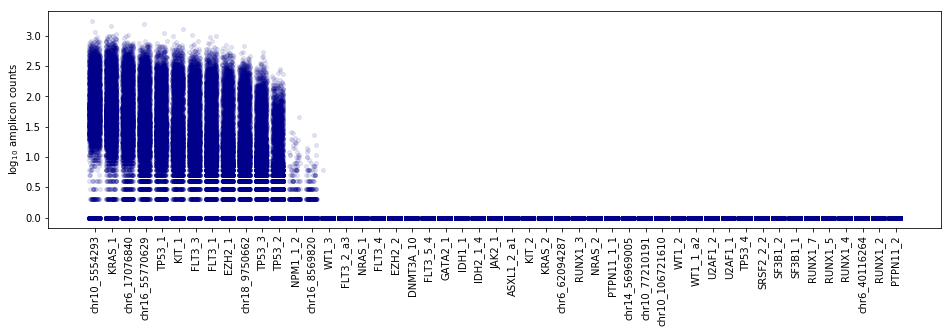

In [21]:
# check the panel amplification uniformity

panel_performance = os.path.join(path,'barcodes/Gelbeads.all.tsv')

with open(panel_performance, 'r') as f:
    raw_counts = [line.strip().split() for line in f]
headers = raw_counts[0]
bc = [i[0] for i in raw_counts[1:]]
table = np.array([i[1:] for i in raw_counts[1:]]).astype(int)
idx = np.argsort(np.mean(table, axis=0))[::-1]    
table = table[:,idx]


x = []
for j, i in enumerate(table[:,:-1].T):
    x.append(np.random.rand(len(i))/1.5+j)

y = table[:,:-1].T.ravel()
x = np.ravel(x)

fig, ax = plt.subplots(1,1,figsize=(16,4))
ax.scatter(x,np.log10(1+y), facecolor='darkblue', edgecolor=None, s= 15, alpha=.1, rasterized=True)
ax.set_xticks(np.arange(len(idx)-1)+.4)
ax.set_xticklabels(np.array(headers[1:])[idx], rotation=90)
ax.set_ylabel('log$_1$$_0$ amplicon counts')
plt.savefig('qc_output/log10_amplicon_uniformity.svg', dpi=600)
plt.show()

In [18]:
print('median amplicon count per cell is: {}'.format(np.median(table[:,:-1].sum(axis=1))))
print('median detected loci per cell is: {}'.format(np.median(np.sum(table[:,:-1]>0, axis=1))))

median amplicon count per cell is: 286.0
median detected loci per cell is: 12.0


In [19]:
# again, a code part fro the DAb-seq pipeline. This can also be run in a shell

!python genotype_cohort.py Gelbeads amplicon.cfg

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -Xmx4g -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar GenomicsDBImport --genomicsdb-workspace-path /drive3/Cyrille/Gelbeads/genotyping/dbs/FLT3_2_a3.genomics.db --batch-size 50 --reader-threads 2 --validate-sample-name-map true -L chr13:28608191-28608368 --sample-name-map /drive3/Cyrille/Gelbeads/genotyping/genotyping.sample_map.tsv
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -Xmx4g -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar GenomicsDBImport --genomicsdb-workspace-path /drive3/Cyrille/Gelbeads/genotyping/db

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -Xmx4g -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar GenomicsDBImport --genomicsdb-workspace-path /drive3/Cyrille/Gelbeads/genotyping/dbs/KIT_2.genomics.db --batch-size 50 --reader-threads 2 --validate-sample-name-map true -L chr4:55589607-55589829 --sample-name-map /drive3/Cyrille/Gelbeads/genotyping/genotyping.sample_map.tsv
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -Xmx4g -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar GenomicsDBImport --genomicsdb-workspace-path /drive3/Cyrille/Gelbeads/genotyping/dbs/PTP

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -Xmx4g -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar GenomicsDBImport --genomicsdb-workspace-path /drive3/Cyrille/Gelbeads/genotyping/dbs/FLT3_1.genomics.db --batch-size 50 --reader-threads 2 --validate-sample-name-map true -L chr13:28592494-28592723 --sample-name-map /drive3/Cyrille/Gelbeads/genotyping/genotyping.sample_map.tsv
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -Xmx4g -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar GenomicsDBImport --genomicsdb-workspace-path /drive3/Cyrille/Gelbeads/genotyping/dbs/F

10:41:58.536 INFO  NativeLibraryLoader - Loading libgkl_compression.so from jar:file:/usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar!/com/intel/gkl/native/libgkl_compression.so
10:41:58.609 INFO  NativeLibraryLoader - Loading libgkl_compression.so from jar:file:/usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar!/com/intel/gkl/native/libgkl_compression.so
10:41:58.653 INFO  NativeLibraryLoader - Loading libgkl_compression.so from jar:file:/usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar!/com/intel/gkl/native/libgkl_compression.so
10:41:58.965 INFO  NativeLibraryLoader - Loading libgkl_compression.so from jar:file:/usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar!/com/intel/gkl/native/libgkl_compression.so
10:41:59.055 INFO  NativeLibraryLoader - Loading libgkl_compression.so from jar:file:/usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar!/com/intel/gkl/native/libgkl_compression.so
10:41:59.058 INFO  NativeLibraryLoader - Loading libgkl_comp

10:42:01.040 INFO  NativeLibraryLoader - Loading libgkl_compression.so from jar:file:/usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar!/com/intel/gkl/native/libgkl_compression.so
10:42:01.053 INFO  NativeLibraryLoader - Loading libgkl_compression.so from jar:file:/usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar!/com/intel/gkl/native/libgkl_compression.so
10:42:01.072 INFO  NativeLibraryLoader - Loading libgkl_compression.so from jar:file:/usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar!/com/intel/gkl/native/libgkl_compression.so
10:42:01.073 INFO  NativeLibraryLoader - Loading libgkl_compression.so from jar:file:/usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar!/com/intel/gkl/native/libgkl_compression.so
10:42:01.135 INFO  NativeLibraryLoader - Loading libgkl_compression.so from jar:file:/usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar!/com/intel/gkl/native/libgkl_compression.so
Aug 18, 2020 10:42:01 AM shaded.cloud_nio.com.google.auth.oa

10:42:01.522 INFO  NativeLibraryLoader - Loading libgkl_compression.so from jar:file:/usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar!/com/intel/gkl/native/libgkl_compression.so
10:42:01.569 INFO  NativeLibraryLoader - Loading libgkl_compression.so from jar:file:/usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar!/com/intel/gkl/native/libgkl_compression.so
10:42:01.680 INFO  NativeLibraryLoader - Loading libgkl_compression.so from jar:file:/usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar!/com/intel/gkl/native/libgkl_compression.so
10:42:01.693 INFO  NativeLibraryLoader - Loading libgkl_compression.so from jar:file:/usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar!/com/intel/gkl/native/libgkl_compression.so
10:42:01.701 INFO  IntervalArgumentCollection - Processing 227 bp from intervals
10:42:01.705 INFO  GenomicsDBImport - Done initializing engine
10:42:01.732 INFO  NativeLibraryLoader - Loading libgkl_compression.so from jar:file:/usr/local/bin/gatk

10:42:02.197 INFO  NativeLibraryLoader - Loading libgkl_compression.so from jar:file:/usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar!/com/intel/gkl/native/libgkl_compression.so
Aug 18, 2020 10:42:02 AM shaded.cloud_nio.com.google.auth.oauth2.ComputeEngineCredentials runningOnComputeEngine
INFO: Failed to detect whether we are running on Google Compute Engine.
10:42:02.214 INFO  GenomicsDBImport - ------------------------------------------------------------
10:42:02.214 INFO  GenomicsDBImport - The Genome Analysis Toolkit (GATK) v4.1.3.0
10:42:02.214 INFO  GenomicsDBImport - For support and documentation go to https://software.broadinstitute.org/gatk/
10:42:02.215 INFO  GenomicsDBImport - Executing as cyrille@greyhound on Linux v4.15.0-96-generic amd64
10:42:02.215 INFO  GenomicsDBImport - Java runtime: Java HotSpot(TM) 64-Bit Server VM v1.8.0_201-b09
10:42:02.216 INFO  GenomicsDBImport - Start Date/Time: August 18, 2020 10:41:59 AM PDT
10:42:02.216 INFO  GenomicsDBImport - -

10:42:02.494 INFO  NativeLibraryLoader - Loading libgkl_compression.so from jar:file:/usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar!/com/intel/gkl/native/libgkl_compression.so
10:42:02.511 INFO  NativeLibraryLoader - Loading libgkl_compression.so from jar:file:/usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar!/com/intel/gkl/native/libgkl_compression.so
Aug 18, 2020 10:42:02 AM shaded.cloud_nio.com.google.auth.oauth2.ComputeEngineCredentials runningOnComputeEngine
INFO: Failed to detect whether we are running on Google Compute Engine.
10:42:02.599 INFO  IntervalArgumentCollection - Processing 223 bp from intervals
10:42:02.600 INFO  GenomicsDBImport - ------------------------------------------------------------
10:42:02.601 INFO  GenomicsDBImport - The Genome Analysis Toolkit (GATK) v4.1.3.0
10:42:02.601 INFO  GenomicsDBImport - For support and documentation go to https://software.broadinstitute.org/gatk/
10:42:02.602 INFO  GenomicsDBImport - Executing as cyrille@gr

10:42:02.742 INFO  GenomicsDBImport - Done initializing engine
10:42:02.765 INFO  GenomicsDBImport - Starting batch input file preload
10:42:02.768 INFO  GenomicsDBImport - Vid Map JSON file will be written to /drive3/Cyrille/Gelbeads/genotyping/dbs/KIT_1.genomics.db/vidmap.json
10:42:02.768 INFO  GenomicsDBImport - Callset Map JSON file will be written to /drive3/Cyrille/Gelbeads/genotyping/dbs/KIT_1.genomics.db/callset.json
10:42:02.768 INFO  GenomicsDBImport - Complete VCF Header will be written to /drive3/Cyrille/Gelbeads/genotyping/dbs/KIT_1.genomics.db/vcfheader.vcf
10:42:02.768 INFO  GenomicsDBImport - Importing to array - /drive3/Cyrille/Gelbeads/genotyping/dbs/KIT_1.genomics.db/genomicsdb_array
10:42:02.770 INFO  ProgressMeter - Starting traversal
10:42:02.771 INFO  ProgressMeter -        Current Locus  Elapsed Minutes     Batches Processed   Batches/Minute
Aug 18, 2020 10:42:02 AM shaded.cloud_nio.com.google.auth.oauth2.ComputeEngineCredentials runningOnComputeEngine
INFO: Fa

Aug 18, 2020 10:42:03 AM shaded.cloud_nio.com.google.auth.oauth2.ComputeEngineCredentials runningOnComputeEngine
INFO: Failed to detect whether we are running on Google Compute Engine.
10:42:03.135 INFO  GenomicsDBImport - Vid Map JSON file will be written to /drive3/Cyrille/Gelbeads/genotyping/dbs/chr6_62094287.genomics.db/vidmap.json
10:42:03.135 INFO  GenomicsDBImport - Callset Map JSON file will be written to /drive3/Cyrille/Gelbeads/genotyping/dbs/chr6_62094287.genomics.db/callset.json
10:42:03.135 INFO  GenomicsDBImport - Complete VCF Header will be written to /drive3/Cyrille/Gelbeads/genotyping/dbs/chr6_62094287.genomics.db/vcfheader.vcf
10:42:03.135 INFO  GenomicsDBImport - Importing to array - /drive3/Cyrille/Gelbeads/genotyping/dbs/chr6_62094287.genomics.db/genomicsdb_array
10:42:03.137 INFO  ProgressMeter - Starting traversal
10:42:03.137 INFO  ProgressMeter -        Current Locus  Elapsed Minutes     Batches Processed   Batches/Minute
10:42:03.137 INFO  GenomicsDBImport - -

Aug 18, 2020 10:42:03 AM shaded.cloud_nio.com.google.auth.oauth2.ComputeEngineCredentials runningOnComputeEngine
INFO: Failed to detect whether we are running on Google Compute Engine.
10:42:03.434 INFO  GenomicsDBImport - ------------------------------------------------------------
Aug 18, 2020 10:42:03 AM shaded.cloud_nio.com.google.auth.oauth2.ComputeEngineCredentials runningOnComputeEngine
INFO: Failed to detect whether we are running on Google Compute Engine.
10:42:03.438 INFO  GenomicsDBImport - The Genome Analysis Toolkit (GATK) v4.1.3.0
10:42:03.438 INFO  GenomicsDBImport - For support and documentation go to https://software.broadinstitute.org/gatk/
10:42:03.439 INFO  GenomicsDBImport - Executing as cyrille@greyhound on Linux v4.15.0-96-generic amd64
10:42:03.440 INFO  GenomicsDBImport - Java runtime: Java HotSpot(TM) 64-Bit Server VM v1.8.0_201-b09
10:42:03.440 INFO  GenomicsDBImport - Start Date/Time: August 18, 2020 10:42:01 AM PDT
10:42:03.440 INFO  GenomicsDBImport - ----

Aug 18, 2020 10:42:03 AM shaded.cloud_nio.com.google.auth.oauth2.ComputeEngineCredentials runningOnComputeEngine
INFO: Failed to detect whether we are running on Google Compute Engine.
10:42:03.543 INFO  GenomicsDBImport - ------------------------------------------------------------
10:42:03.544 INFO  GenomicsDBImport - The Genome Analysis Toolkit (GATK) v4.1.3.0
10:42:03.544 INFO  GenomicsDBImport - For support and documentation go to https://software.broadinstitute.org/gatk/
10:42:03.544 INFO  GenomicsDBImport - Executing as cyrille@greyhound on Linux v4.15.0-96-generic amd64
10:42:03.545 INFO  GenomicsDBImport - Java runtime: Java HotSpot(TM) 64-Bit Server VM v1.8.0_201-b09
10:42:03.545 INFO  GenomicsDBImport - Start Date/Time: August 18, 2020 10:42:01 AM PDT
10:42:03.545 INFO  GenomicsDBImport - ------------------------------------------------------------
10:42:03.545 INFO  GenomicsDBImport - ------------------------------------------------------------
10:42:03.546 INFO  GenomicsDB

Aug 18, 2020 10:42:03 AM shaded.cloud_nio.com.google.auth.oauth2.ComputeEngineCredentials runningOnComputeEngine
INFO: Failed to detect whether we are running on Google Compute Engine.
10:42:03.719 INFO  GenomicsDBImport - ------------------------------------------------------------
10:42:03.720 INFO  GenomicsDBImport - The Genome Analysis Toolkit (GATK) v4.1.3.0
10:42:03.720 INFO  GenomicsDBImport - For support and documentation go to https://software.broadinstitute.org/gatk/
10:42:03.721 INFO  GenomicsDBImport - Executing as cyrille@greyhound on Linux v4.15.0-96-generic amd64
10:42:03.721 INFO  GenomicsDBImport - Java runtime: Java HotSpot(TM) 64-Bit Server VM v1.8.0_201-b09
10:42:03.722 INFO  GenomicsDBImport - Start Date/Time: August 18, 2020 10:42:01 AM PDT
10:42:03.722 INFO  GenomicsDBImport - ------------------------------------------------------------
10:42:03.722 INFO  GenomicsDBImport - ------------------------------------------------------------
10:42:03.723 INFO  GenomicsDB

10:42:03.902 INFO  GenomicsDBImport - Inflater: IntelInflater
10:42:03.902 INFO  GenomicsDBImport - HTSJDK Defaults.USE_ASYNC_IO_READ_FOR_SAMTOOLS : false
10:42:03.902 INFO  GenomicsDBImport - GCS max retries/reopens: 20
10:42:03.902 INFO  GenomicsDBImport - HTSJDK Defaults.USE_ASYNC_IO_WRITE_FOR_SAMTOOLS : true
10:42:03.902 INFO  GenomicsDBImport - Requester pays: disabled
10:42:03.902 INFO  GenomicsDBImport - HTSJDK Defaults.USE_ASYNC_IO_WRITE_FOR_TRIBBLE : false
10:42:03.902 INFO  GenomicsDBImport - Initializing engine
10:42:03.902 INFO  GenomicsDBImport - Deflater: IntelDeflater
10:42:03.902 INFO  GenomicsDBImport - Inflater: IntelInflater
10:42:03.903 INFO  GenomicsDBImport - GCS max retries/reopens: 20
10:42:03.903 INFO  GenomicsDBImport - Requester pays: disabled
10:42:03.903 INFO  GenomicsDBImport - Initializing engine
10:42:03.896 INFO  GenomicsDBImport - Picard Version: 2.20.5
10:42:03.905 INFO  GenomicsDBImport - HTSJDK Defaults.COMPRESSION_LEVEL : 2
10:42:03.905 INFO  Genom

10:42:04.179 INFO  GenomicsDBImport - Java runtime: Java HotSpot(TM) 64-Bit Server VM v1.8.0_201-b09
10:42:04.180 INFO  GenomicsDBImport - Start Date/Time: August 18, 2020 10:42:02 AM PDT
10:42:04.180 INFO  GenomicsDBImport - ------------------------------------------------------------
10:42:04.180 INFO  GenomicsDBImport - ------------------------------------------------------------
10:42:04.182 INFO  GenomicsDBImport - HTSJDK Version: 2.20.1
10:42:04.182 INFO  GenomicsDBImport - Picard Version: 2.20.5
10:42:04.182 INFO  GenomicsDBImport - HTSJDK Defaults.COMPRESSION_LEVEL : 2
10:42:04.182 INFO  GenomicsDBImport - HTSJDK Defaults.USE_ASYNC_IO_READ_FOR_SAMTOOLS : false
10:42:04.182 INFO  GenomicsDBImport - HTSJDK Defaults.USE_ASYNC_IO_WRITE_FOR_SAMTOOLS : true
10:42:04.182 INFO  GenomicsDBImport - HTSJDK Defaults.USE_ASYNC_IO_WRITE_FOR_TRIBBLE : false
10:42:04.182 INFO  GenomicsDBImport - Deflater: IntelDeflater
10:42:04.183 INFO  GenomicsDBImport - Inflater: IntelInflater
10:42:04.188 

10:42:04.739 INFO  IntervalArgumentCollection - Processing 196 bp from intervals
10:42:04.743 INFO  GenomicsDBImport - Done initializing engine
10:42:04.769 INFO  GenomicsDBImport - Finished batch preload
10:42:04.769 INFO  GenomicsDBImport - Importing batch 1 with 50 samples
10:42:04.769 INFO  GenomicsDBImport - Vid Map JSON file will be written to /drive3/Cyrille/Gelbeads/genotyping/dbs/RUNX1_3.genomics.db/vidmap.json
10:42:04.770 INFO  GenomicsDBImport - Callset Map JSON file will be written to /drive3/Cyrille/Gelbeads/genotyping/dbs/RUNX1_3.genomics.db/callset.json
10:42:04.770 INFO  GenomicsDBImport - Complete VCF Header will be written to /drive3/Cyrille/Gelbeads/genotyping/dbs/RUNX1_3.genomics.db/vcfheader.vcf
10:42:04.770 INFO  GenomicsDBImport - Importing to array - /drive3/Cyrille/Gelbeads/genotyping/dbs/RUNX1_3.genomics.db/genomicsdb_array
10:42:04.771 INFO  ProgressMeter - Starting traversal
10:42:04.772 INFO  ProgressMeter -        Current Locus  Elapsed Minutes     Batche

10:42:05.822 INFO  GenomicsDBImport - Starting batch input file preload
10:42:05.900 INFO  GenomicsDBImport - Vid Map JSON file will be written to /drive3/Cyrille/Gelbeads/genotyping/dbs/chr14_56969005.genomics.db/vidmap.json
10:42:05.900 INFO  GenomicsDBImport - Callset Map JSON file will be written to /drive3/Cyrille/Gelbeads/genotyping/dbs/chr14_56969005.genomics.db/callset.json
10:42:05.900 INFO  GenomicsDBImport - Complete VCF Header will be written to /drive3/Cyrille/Gelbeads/genotyping/dbs/chr14_56969005.genomics.db/vcfheader.vcf
10:42:05.900 INFO  GenomicsDBImport - Importing to array - /drive3/Cyrille/Gelbeads/genotyping/dbs/chr14_56969005.genomics.db/genomicsdb_array
10:42:05.901 INFO  ProgressMeter - Starting traversal
10:42:05.917 INFO  GenomicsDBImport - Starting batch input file preload
10:42:05.919 INFO  ProgressMeter -        Current Locus  Elapsed Minutes     Batches Processed   Batches/Minute
10:42:05.974 INFO  IntervalArgumentCollection - Processing 227 bp from inter

10:42:06.453 INFO  GenomicsDBImport - Finished batch preload
10:42:06.453 INFO  GenomicsDBImport - Importing batch 1 with 50 samples
10:42:06.454 INFO  GenomicsDBImport - Finished batch preload
10:42:06.454 INFO  GenomicsDBImport - Importing batch 1 with 50 samples
10:42:06.468 INFO  GenomicsDBImport - Vid Map JSON file will be written to /drive3/Cyrille/Gelbeads/genotyping/dbs/NRAS_2.genomics.db/vidmap.json
10:42:06.475 INFO  GenomicsDBImport - Callset Map JSON file will be written to /drive3/Cyrille/Gelbeads/genotyping/dbs/NRAS_2.genomics.db/callset.json
10:42:06.475 INFO  GenomicsDBImport - Complete VCF Header will be written to /drive3/Cyrille/Gelbeads/genotyping/dbs/NRAS_2.genomics.db/vcfheader.vcf
10:42:06.475 INFO  GenomicsDBImport - Importing to array - /drive3/Cyrille/Gelbeads/genotyping/dbs/NRAS_2.genomics.db/genomicsdb_array
10:42:06.477 INFO  ProgressMeter - Starting traversal
10:42:06.487 INFO  ProgressMeter -        Current Locus  Elapsed Minutes     Batches Processed   B

10:42:07.836 INFO  GenomicsDBImport - Starting batch input file preload
10:42:07.845 INFO  GenomicsDBImport - Vid Map JSON file will be written to /drive3/Cyrille/Gelbeads/genotyping/dbs/KIT_2.genomics.db/vidmap.json
10:42:07.856 INFO  GenomicsDBImport - Callset Map JSON file will be written to /drive3/Cyrille/Gelbeads/genotyping/dbs/KIT_2.genomics.db/callset.json
10:42:07.857 INFO  GenomicsDBImport - Complete VCF Header will be written to /drive3/Cyrille/Gelbeads/genotyping/dbs/KIT_2.genomics.db/vcfheader.vcf
10:42:07.857 INFO  GenomicsDBImport - Importing to array - /drive3/Cyrille/Gelbeads/genotyping/dbs/KIT_2.genomics.db/genomicsdb_array
10:42:07.858 INFO  ProgressMeter - Starting traversal
10:42:07.867 INFO  GenomicsDBImport - Starting batch input file preload
10:42:07.887 INFO  ProgressMeter -        Current Locus  Elapsed Minutes     Batches Processed   Batches/Minute
10:42:07.939 INFO  GenomicsDBImport - Vid Map JSON file will be written to /drive3/Cyrille/Gelbeads/genotyping/d

10:42:12.192 INFO  GenomicsDBImport - Finished batch preload
10:42:12.195 INFO  GenomicsDBImport - Importing batch 1 with 50 samples
10:42:12.261 INFO  GenomicsDBImport - Finished batch preload
10:42:12.261 INFO  GenomicsDBImport - Importing batch 2 with 50 samples
10:42:12.333 INFO  GenomicsDBImport - Finished batch preload
10:42:12.334 INFO  GenomicsDBImport - Importing batch 1 with 50 samples
10:42:12.350 INFO  GenomicsDBImport - Finished batch preload
10:42:12.352 INFO  GenomicsDBImport - Importing batch 1 with 50 samples
10:42:12.521 INFO  GenomicsDBImport - Finished batch preload
10:42:12.522 INFO  GenomicsDBImport - Importing batch 1 with 50 samples
10:42:12.532 INFO  GenomicsDBImport - Done importing batch 1/134
10:42:12.534 INFO  GenomicsDBImport - Starting batch input file preload
10:42:12.800 INFO  GenomicsDBImport - Finished batch preload
10:42:12.800 INFO  GenomicsDBImport - Importing batch 2 with 50 samples
10:42:12.895 INFO  GenomicsDBImport - Done importing batch 1/134


10:42:18.344 INFO  GenomicsDBImport - Finished batch preload
10:42:18.345 INFO  GenomicsDBImport - Importing batch 2 with 50 samples
10:42:18.360 INFO  GenomicsDBImport - Finished batch preload
10:42:18.361 INFO  GenomicsDBImport - Importing batch 3 with 50 samples
10:42:18.938 INFO  ProgressMeter -        chr6:40116164              0.2                     1              4.7
10:42:18.939 INFO  GenomicsDBImport - Done importing batch 1/134
10:42:18.940 INFO  GenomicsDBImport - Starting batch input file preload
10:42:19.002 INFO  GenomicsDBImport - Finished batch preload
10:42:19.002 INFO  GenomicsDBImport - Importing batch 2 with 50 samples
10:42:19.228 INFO  ProgressMeter -       chr13:28609547              0.2                     1              4.8
10:42:19.228 INFO  GenomicsDBImport - Done importing batch 1/134
10:42:19.229 INFO  GenomicsDBImport - Starting batch input file preload
10:42:19.231 INFO  ProgressMeter -       chr2:198266761              0.2                     1         

10:42:24.156 INFO  GenomicsDBImport - Finished batch preload
10:42:24.156 INFO  GenomicsDBImport - Importing batch 2 with 50 samples
10:42:24.170 INFO  GenomicsDBImport - Finished batch preload
10:42:24.170 INFO  GenomicsDBImport - Importing batch 3 with 50 samples
10:42:24.180 INFO  GenomicsDBImport - Finished batch preload
10:42:24.180 INFO  GenomicsDBImport - Importing batch 2 with 50 samples
10:42:24.182 INFO  GenomicsDBImport - Finished batch preload
10:42:24.183 INFO  GenomicsDBImport - Importing batch 2 with 50 samples
10:42:24.403 INFO  ProgressMeter -       chr21:44514700              0.3                     1              3.8
10:42:24.403 INFO  GenomicsDBImport - Done importing batch 1/134
10:42:24.404 INFO  GenomicsDBImport - Starting batch input file preload
10:42:24.407 INFO  ProgressMeter -       chr1:115256324              0.4                     2              5.6
10:42:24.407 INFO  GenomicsDBImport - Done importing batch 2/134
10:42:24.407 INFO  GenomicsDBImport - Star

10:42:29.560 INFO  GenomicsDBImport - Finished batch preload
10:42:29.560 INFO  GenomicsDBImport - Importing batch 4 with 50 samples
10:42:29.574 INFO  GenomicsDBImport - Finished batch preload
10:42:29.574 INFO  GenomicsDBImport - Importing batch 3 with 50 samples
10:42:29.588 INFO  GenomicsDBImport - Finished batch preload
10:42:29.589 INFO  GenomicsDBImport - Importing batch 3 with 50 samples
10:42:30.054 INFO  ProgressMeter -        chr6:40116164              0.4                     2              5.0
10:42:30.054 INFO  GenomicsDBImport - Done importing batch 2/134
10:42:30.055 INFO  GenomicsDBImport - Starting batch input file preload
10:42:30.129 INFO  GenomicsDBImport - Finished batch preload
10:42:30.129 INFO  GenomicsDBImport - Importing batch 3 with 50 samples
10:42:30.172 INFO  ProgressMeter -       chr10:77210083              0.4                     2              4.8
10:42:30.172 INFO  GenomicsDBImport - Done importing batch 2/134
10:42:30.173 INFO  GenomicsDBImport - Star

10:42:30.544 INFO  GenomicsDBImport - Finished batch preload
10:42:30.544 INFO  GenomicsDBImport - Importing batch 3 with 50 samples
10:42:30.546 INFO  GenomicsDBImport - Finished batch preload
10:42:30.546 INFO  GenomicsDBImport - Importing batch 4 with 50 samples
10:42:30.556 INFO  GenomicsDBImport - Finished batch preload
10:42:30.556 INFO  GenomicsDBImport - Importing batch 3 with 50 samples
10:42:30.565 INFO  GenomicsDBImport - Finished batch preload
10:42:30.566 INFO  GenomicsDBImport - Importing batch 4 with 50 samples
10:42:30.567 INFO  GenomicsDBImport - Finished batch preload
10:42:30.567 INFO  GenomicsDBImport - Importing batch 3 with 50 samples
10:42:30.574 INFO  GenomicsDBImport - Finished batch preload
10:42:30.575 INFO  GenomicsDBImport - Importing batch 3 with 50 samples
10:42:30.587 INFO  GenomicsDBImport - Finished batch preload
10:42:30.587 INFO  GenomicsDBImport - Importing batch 4 with 50 samples
10:42:30.590 INFO  GenomicsDBImport - Finished batch preload
10:42:30

10:42:39.875 INFO  GenomicsDBImport - Finished batch preload
10:42:39.875 INFO  GenomicsDBImport - Importing batch 5 with 50 samples
10:42:39.881 INFO  GenomicsDBImport - Finished batch preload
10:42:39.881 INFO  GenomicsDBImport - Importing batch 5 with 50 samples
10:42:39.883 INFO  GenomicsDBImport - Finished batch preload
10:42:39.883 INFO  GenomicsDBImport - Importing batch 5 with 50 samples
10:42:39.887 INFO  GenomicsDBImport - Finished batch preload
10:42:39.887 INFO  GenomicsDBImport - Importing batch 5 with 50 samples
10:42:39.888 INFO  GenomicsDBImport - Finished batch preload
10:42:39.888 INFO  GenomicsDBImport - Importing batch 4 with 50 samples
10:42:39.888 INFO  GenomicsDBImport - Finished batch preload
10:42:39.888 INFO  GenomicsDBImport - Importing batch 4 with 50 samples
10:42:39.888 INFO  GenomicsDBImport - Finished batch preload
10:42:39.888 INFO  GenomicsDBImport - Importing batch 5 with 50 samples
10:42:39.894 INFO  GenomicsDBImport - Finished batch preload
10:42:39

10:42:40.556 INFO  ProgressMeter -        chr16:8569720              0.6                     4              6.3
10:42:40.557 INFO  GenomicsDBImport - Done importing batch 4/134
10:42:40.557 INFO  GenomicsDBImport - Starting batch input file preload
10:42:40.602 INFO  GenomicsDBImport - Finished batch preload
10:42:40.602 INFO  GenomicsDBImport - Importing batch 5 with 50 samples
10:42:41.162 INFO  ProgressMeter -        chr6:40116164              0.6                     4              6.9
10:42:41.162 INFO  GenomicsDBImport - Done importing batch 4/134
10:42:41.162 INFO  GenomicsDBImport - Starting batch input file preload
10:42:41.165 INFO  ProgressMeter -       chr14:56968905              0.6                     4              6.8
10:42:41.165 INFO  GenomicsDBImport - Done importing batch 4/134
10:42:41.165 INFO  ProgressMeter -        chr18:9750561              0.6                     3              4.8
10:42:41.165 INFO  GenomicsDBImport - Done importing batch 3/134
10:42:41.165 IN

10:42:46.347 INFO  ProgressMeter -      chr10:106721508              0.7                     4              6.0
10:42:46.348 INFO  GenomicsDBImport - Done importing batch 4/134
10:42:46.348 INFO  GenomicsDBImport - Done importing batch 4/134
10:42:46.348 INFO  GenomicsDBImport - Starting batch input file preload
10:42:46.350 INFO  GenomicsDBImport - Starting batch input file preload
10:42:46.352 INFO  GenomicsDBImport - Done importing batch 5/134
10:42:46.352 INFO  GenomicsDBImport - Done importing batch 4/134
10:42:46.353 INFO  GenomicsDBImport - Starting batch input file preload
10:42:46.353 INFO  GenomicsDBImport - Starting batch input file preload
10:42:46.355 INFO  GenomicsDBImport - Done importing batch 5/134
10:42:46.356 INFO  GenomicsDBImport - Starting batch input file preload
10:42:46.356 INFO  GenomicsDBImport - Starting batch input file preload
10:42:46.357 INFO  GenomicsDBImport - Done importing batch 5/134
10:42:46.357 INFO  GenomicsDBImport - Done importing batch 5/134
1

10:42:49.733 INFO  GenomicsDBImport - Finished batch preload
10:42:49.733 INFO  GenomicsDBImport - Importing batch 5 with 50 samples
10:42:49.735 INFO  GenomicsDBImport - Finished batch preload
10:42:49.735 INFO  GenomicsDBImport - Importing batch 5 with 50 samples
10:42:49.799 INFO  GenomicsDBImport - Done importing batch 4/134
10:42:49.799 INFO  GenomicsDBImport - Starting batch input file preload
10:42:49.843 INFO  GenomicsDBImport - Finished batch preload
10:42:49.843 INFO  GenomicsDBImport - Importing batch 5 with 50 samples
10:42:51.592 INFO  ProgressMeter -       chr3:128202723              0.8                     6              7.5
10:42:51.592 INFO  GenomicsDBImport - Done importing batch 6/134
10:42:51.593 INFO  GenomicsDBImport - Starting batch input file preload
10:42:51.593 INFO  GenomicsDBImport - Done importing batch 5/134
10:42:51.594 INFO  GenomicsDBImport - Starting batch input file preload
10:42:51.594 INFO  ProgressMeter -       chr1:115256324              0.8      

10:42:51.734 INFO  GenomicsDBImport - Finished batch preload
10:42:51.735 INFO  GenomicsDBImport - Importing batch 7 with 50 samples
10:42:51.735 INFO  ProgressMeter -       chr5:170837412              0.7                     5              7.0
10:42:51.736 INFO  GenomicsDBImport - Finished batch preload
10:42:51.736 INFO  GenomicsDBImport - Done importing batch 5/134
10:42:51.736 INFO  GenomicsDBImport - Importing batch 6 with 50 samples
10:42:51.737 INFO  GenomicsDBImport - Starting batch input file preload
10:42:51.741 INFO  GenomicsDBImport - Finished batch preload
10:42:51.741 INFO  GenomicsDBImport - Importing batch 8 with 50 samples
10:42:51.750 INFO  GenomicsDBImport - Finished batch preload
10:42:51.750 INFO  GenomicsDBImport - Importing batch 7 with 50 samples
10:42:51.758 INFO  GenomicsDBImport - Finished batch preload
10:42:51.758 INFO  GenomicsDBImport - Importing batch 7 with 50 samples
10:42:51.761 INFO  GenomicsDBImport - Finished batch preload
10:42:51.761 INFO  Genomi

10:43:00.974 INFO  GenomicsDBImport - Finished batch preload
10:43:00.975 INFO  GenomicsDBImport - Importing batch 7 with 50 samples
10:43:01.029 INFO  GenomicsDBImport - Done importing batch 6/134
10:43:01.029 INFO  GenomicsDBImport - Done importing batch 6/134
10:43:01.029 INFO  GenomicsDBImport - Starting batch input file preload
10:43:01.030 INFO  GenomicsDBImport - Done importing batch 7/134
10:43:01.030 INFO  GenomicsDBImport - Starting batch input file preload
10:43:01.030 INFO  GenomicsDBImport - Starting batch input file preload
10:43:01.031 INFO  GenomicsDBImport - Done importing batch 6/134
10:43:01.032 INFO  GenomicsDBImport - Starting batch input file preload
10:43:01.033 INFO  ProgressMeter -      chr10:106721508              0.9                     6              6.6
10:43:01.033 INFO  GenomicsDBImport - Done importing batch 6/134
10:43:01.033 INFO  GenomicsDBImport - Done importing batch 6/134
10:43:01.034 INFO  GenomicsDBImport - Starting batch input file preload
10:43

10:43:01.418 INFO  GenomicsDBImport - Finished batch preload
10:43:01.420 INFO  GenomicsDBImport - Importing batch 8 with 50 samples
10:43:01.427 INFO  GenomicsDBImport - Finished batch preload
10:43:01.427 INFO  GenomicsDBImport - Importing batch 8 with 50 samples
10:43:01.433 INFO  GenomicsDBImport - Finished batch preload
10:43:01.433 INFO  GenomicsDBImport - Importing batch 7 with 50 samples
10:43:01.434 INFO  GenomicsDBImport - Finished batch preload
10:43:01.434 INFO  GenomicsDBImport - Importing batch 9 with 50 samples
10:43:01.453 INFO  GenomicsDBImport - Finished batch preload
10:43:01.453 INFO  GenomicsDBImport - Importing batch 8 with 50 samples
10:43:01.549 INFO  GenomicsDBImport - Done importing batch 6/134
10:43:01.550 INFO  GenomicsDBImport - Starting batch input file preload
10:43:01.603 INFO  GenomicsDBImport - Finished batch preload
10:43:01.604 INFO  GenomicsDBImport - Importing batch 7 with 50 samples
10:43:02.141 INFO  GenomicsDBImport - Done importing batch 7/134


10:43:07.565 INFO  GenomicsDBImport - Finished batch preload
10:43:07.566 INFO  GenomicsDBImport - Importing batch 8 with 50 samples
10:43:07.566 INFO  GenomicsDBImport - Finished batch preload
10:43:07.566 INFO  GenomicsDBImport - Importing batch 8 with 50 samples
10:43:07.568 INFO  GenomicsDBImport - Finished batch preload
10:43:07.568 INFO  GenomicsDBImport - Importing batch 9 with 50 samples
10:43:07.568 INFO  GenomicsDBImport - Finished batch preload
10:43:07.569 INFO  GenomicsDBImport - Importing batch 8 with 50 samples
10:43:07.572 INFO  GenomicsDBImport - Finished batch preload
10:43:07.572 INFO  GenomicsDBImport - Importing batch 8 with 50 samples
10:43:07.572 INFO  GenomicsDBImport - Finished batch preload
10:43:07.573 INFO  GenomicsDBImport - Importing batch 8 with 50 samples
10:43:07.582 INFO  GenomicsDBImport - Finished batch preload
10:43:07.583 INFO  GenomicsDBImport - Importing batch 9 with 50 samples
10:43:07.618 INFO  ProgressMeter -        chr6:40116164              

10:43:07.782 INFO  GenomicsDBImport - Finished batch preload
10:43:07.782 INFO  GenomicsDBImport - Importing batch 9 with 50 samples
10:43:07.783 INFO  GenomicsDBImport - Finished batch preload
10:43:07.783 INFO  GenomicsDBImport - Importing batch 9 with 50 samples
10:43:07.783 INFO  GenomicsDBImport - Finished batch preload
10:43:07.783 INFO  GenomicsDBImport - Importing batch 9 with 50 samples
10:43:07.792 INFO  GenomicsDBImport - Finished batch preload
10:43:07.792 INFO  GenomicsDBImport - Importing batch 8 with 50 samples
10:43:07.796 INFO  GenomicsDBImport - Finished batch preload
10:43:07.796 INFO  GenomicsDBImport - Importing batch 8 with 50 samples
10:43:07.797 INFO  GenomicsDBImport - Finished batch preload
10:43:07.797 INFO  GenomicsDBImport - Importing batch 8 with 50 samples
10:43:07.809 INFO  GenomicsDBImport - Finished batch preload
10:43:07.809 INFO  GenomicsDBImport - Importing batch 8 with 50 samples
10:43:07.810 INFO  GenomicsDBImport - Finished batch preload
10:43:07

10:43:17.341 INFO  GenomicsDBImport - Finished batch preload
10:43:17.341 INFO  GenomicsDBImport - Importing batch 9 with 50 samples
10:43:17.345 INFO  GenomicsDBImport - Finished batch preload
10:43:17.346 INFO  GenomicsDBImport - Importing batch 10 with 50 samples
10:43:17.349 INFO  GenomicsDBImport - Finished batch preload
10:43:17.350 INFO  GenomicsDBImport - Importing batch 9 with 50 samples
10:43:17.376 INFO  GenomicsDBImport - Finished batch preload
10:43:17.376 INFO  GenomicsDBImport - Importing batch 10 with 50 samples
10:43:17.388 INFO  GenomicsDBImport - Done importing batch 8/134
10:43:17.389 INFO  GenomicsDBImport - Finished batch preload
10:43:17.389 INFO  GenomicsDBImport - Importing batch 10 with 50 samples
10:43:17.390 INFO  GenomicsDBImport - Starting batch input file preload
10:43:17.393 INFO  GenomicsDBImport - Done importing batch 8/134
10:43:17.393 INFO  GenomicsDBImport - Finished batch preload
10:43:17.393 INFO  GenomicsDBImport - Importing batch 10 with 50 samp

10:43:18.525 INFO  GenomicsDBImport - Done importing batch 10/134
10:43:18.525 INFO  GenomicsDBImport - Starting batch input file preload
10:43:18.566 INFO  GenomicsDBImport - Finished batch preload
10:43:18.566 INFO  GenomicsDBImport - Importing batch 10 with 50 samples
10:43:18.572 INFO  GenomicsDBImport - Finished batch preload
10:43:18.572 INFO  GenomicsDBImport - Importing batch 11 with 50 samples
10:43:18.584 INFO  GenomicsDBImport - Finished batch preload
10:43:18.584 INFO  GenomicsDBImport - Importing batch 11 with 50 samples
10:43:18.585 INFO  GenomicsDBImport - Finished batch preload
10:43:18.585 INFO  GenomicsDBImport - Importing batch 10 with 50 samples
10:43:18.591 INFO  GenomicsDBImport - Finished batch preload
10:43:18.591 INFO  GenomicsDBImport - Importing batch 10 with 50 samples
10:43:18.595 INFO  GenomicsDBImport - Finished batch preload
10:43:18.596 INFO  GenomicsDBImport - Importing batch 11 with 50 samples
10:43:18.598 INFO  GenomicsDBImport - Finished batch prelo

10:43:27.733 INFO  GenomicsDBImport - Finished batch preload
10:43:27.734 INFO  GenomicsDBImport - Importing batch 10 with 50 samples
10:43:27.738 INFO  GenomicsDBImport - Finished batch preload
10:43:27.738 INFO  GenomicsDBImport - Importing batch 10 with 50 samples
10:43:27.742 INFO  GenomicsDBImport - Finished batch preload
10:43:27.742 INFO  GenomicsDBImport - Importing batch 11 with 50 samples
10:43:27.743 INFO  GenomicsDBImport - Finished batch preload
10:43:27.743 INFO  GenomicsDBImport - Importing batch 11 with 50 samples
10:43:27.745 INFO  GenomicsDBImport - Finished batch preload
10:43:27.746 INFO  GenomicsDBImport - Importing batch 10 with 50 samples
10:43:27.749 INFO  GenomicsDBImport - Finished batch preload
10:43:27.750 INFO  GenomicsDBImport - Importing batch 11 with 50 samples
10:43:27.751 INFO  GenomicsDBImport - Finished batch preload
10:43:27.751 INFO  GenomicsDBImport - Importing batch 10 with 50 samples
10:43:27.753 INFO  GenomicsDBImport - Finished batch preload
1

10:43:28.501 INFO  GenomicsDBImport - Finished batch preload
10:43:28.502 INFO  GenomicsDBImport - Importing batch 11 with 50 samples
10:43:28.505 INFO  GenomicsDBImport - Finished batch preload
10:43:28.505 INFO  GenomicsDBImport - Importing batch 11 with 50 samples
10:43:28.820 INFO  GenomicsDBImport - Done importing batch 10/134
10:43:28.820 INFO  GenomicsDBImport - Starting batch input file preload
10:43:28.872 INFO  GenomicsDBImport - Finished batch preload
10:43:28.872 INFO  GenomicsDBImport - Importing batch 11 with 50 samples
10:43:29.397 INFO  GenomicsDBImport - Done importing batch 10/134
10:43:29.397 INFO  GenomicsDBImport - Done importing batch 11/134
10:43:29.397 INFO  GenomicsDBImport - Starting batch input file preload
10:43:29.398 INFO  GenomicsDBImport - Starting batch input file preload
10:43:29.398 INFO  GenomicsDBImport - Done importing batch 10/134
10:43:29.399 INFO  GenomicsDBImport - Starting batch input file preload
10:43:29.401 INFO  GenomicsDBImport - Done imp

10:43:32.421 INFO  GenomicsDBImport - Finished batch preload
10:43:32.421 INFO  GenomicsDBImport - Importing batch 9 with 50 samples
10:43:32.424 INFO  GenomicsDBImport - Finished batch preload
10:43:32.424 INFO  GenomicsDBImport - Importing batch 11 with 50 samples
10:43:32.428 INFO  GenomicsDBImport - Finished batch preload
10:43:32.428 INFO  GenomicsDBImport - Importing batch 10 with 50 samples
10:43:32.584 INFO  ProgressMeter -        chr17:7578086              1.4                     8              5.5
10:43:32.584 INFO  GenomicsDBImport - Done importing batch 8/134
10:43:32.585 INFO  ProgressMeter -        chr17:7578384              1.5                     9              6.2
10:43:32.585 INFO  GenomicsDBImport - Starting batch input file preload
10:43:32.585 INFO  GenomicsDBImport - Done importing batch 9/134
10:43:32.585 INFO  GenomicsDBImport - Starting batch input file preload
10:43:32.629 INFO  GenomicsDBImport - Finished batch preload
10:43:32.629 INFO  GenomicsDBImport - Im

10:43:34.762 INFO  GenomicsDBImport - Finished batch preload
10:43:34.762 INFO  GenomicsDBImport - Importing batch 12 with 50 samples
10:43:34.777 INFO  GenomicsDBImport - Finished batch preload
10:43:34.777 INFO  GenomicsDBImport - Importing batch 13 with 50 samples
10:43:34.778 INFO  GenomicsDBImport - Finished batch preload
10:43:34.779 INFO  GenomicsDBImport - Importing batch 13 with 50 samples
10:43:34.789 INFO  GenomicsDBImport - Finished batch preload
10:43:34.790 INFO  GenomicsDBImport - Importing batch 12 with 50 samples
10:43:34.791 INFO  GenomicsDBImport - Finished batch preload
10:43:34.791 INFO  GenomicsDBImport - Finished batch preload
10:43:34.791 INFO  GenomicsDBImport - Importing batch 13 with 50 samples
10:43:34.792 INFO  GenomicsDBImport - Importing batch 13 with 50 samples
10:43:34.798 INFO  GenomicsDBImport - Finished batch preload
10:43:34.799 INFO  GenomicsDBImport - Importing batch 12 with 50 samples
10:43:34.807 INFO  GenomicsDBImport - Finished batch preload
1

10:43:39.963 INFO  GenomicsDBImport - Finished batch preload
10:43:39.964 INFO  GenomicsDBImport - Importing batch 13 with 50 samples
10:43:39.966 INFO  GenomicsDBImport - Finished batch preload
10:43:39.966 INFO  GenomicsDBImport - Importing batch 12 with 50 samples
10:43:40.146 INFO  ProgressMeter -       chr14:56968905              1.6                    13              8.3
10:43:40.146 INFO  GenomicsDBImport - Done importing batch 13/134
10:43:40.146 INFO  GenomicsDBImport - Done importing batch 12/134
10:43:40.146 INFO  GenomicsDBImport - Starting batch input file preload
10:43:40.146 INFO  GenomicsDBImport - Starting batch input file preload
10:43:40.149 INFO  GenomicsDBImport - Done importing batch 12/134
10:43:40.150 INFO  GenomicsDBImport - Starting batch input file preload
10:43:40.152 INFO  GenomicsDBImport - Done importing batch 12/134
10:43:40.153 INFO  GenomicsDBImport - Starting batch input file preload
10:43:40.156 INFO  GenomicsDBImport - Done importing batch 12/134
10

10:43:40.452 INFO  GenomicsDBImport - Finished batch preload
10:43:40.452 INFO  GenomicsDBImport - Importing batch 14 with 50 samples
10:43:40.456 INFO  GenomicsDBImport - Finished batch preload
10:43:40.456 INFO  GenomicsDBImport - Importing batch 13 with 50 samples
10:43:40.456 INFO  GenomicsDBImport - Finished batch preload
10:43:40.456 INFO  GenomicsDBImport - Importing batch 14 with 50 samples
10:43:40.459 INFO  GenomicsDBImport - Finished batch preload
10:43:40.459 INFO  GenomicsDBImport - Importing batch 15 with 50 samples
10:43:40.461 INFO  GenomicsDBImport - Finished batch preload
10:43:40.462 INFO  GenomicsDBImport - Importing batch 14 with 50 samples
10:43:40.466 INFO  GenomicsDBImport - Finished batch preload
10:43:40.466 INFO  GenomicsDBImport - Importing batch 14 with 50 samples
10:43:40.474 INFO  GenomicsDBImport - Finished batch preload
10:43:40.474 INFO  GenomicsDBImport - Importing batch 13 with 50 samples
10:43:43.083 INFO  ProgressMeter -        chr10:5554192       

10:43:48.659 INFO  GenomicsDBImport - Done importing batch 14/134
10:43:48.660 INFO  GenomicsDBImport - Starting batch input file preload
10:43:48.660 INFO  GenomicsDBImport - Done importing batch 14/134
10:43:48.660 INFO  GenomicsDBImport - Done importing batch 14/134
10:43:48.661 INFO  GenomicsDBImport - Starting batch input file preload
10:43:48.661 INFO  GenomicsDBImport - Starting batch input file preload
10:43:48.661 INFO  ProgressMeter -       chr1:115258553              1.7                    13              7.6
10:43:48.661 INFO  GenomicsDBImport - Done importing batch 13/134
10:43:48.662 INFO  GenomicsDBImport - Starting batch input file preload
10:43:48.662 INFO  ProgressMeter -       chr11:32413415              1.7                    13              7.8
10:43:48.662 INFO  GenomicsDBImport - Done importing batch 13/134
10:43:48.663 INFO  GenomicsDBImport - Starting batch input file preload
10:43:48.664 INFO  ProgressMeter -       chr21:44524279              1.7              

10:43:50.984 INFO  ProgressMeter -       chr10:77210083              1.8                    14              7.9
10:43:50.984 INFO  ProgressMeter -        chr4:55589607              1.7                    14              8.1
10:43:50.984 INFO  GenomicsDBImport - Done importing batch 14/134
10:43:50.984 INFO  GenomicsDBImport - Done importing batch 14/134
10:43:50.984 INFO  GenomicsDBImport - Starting batch input file preload
10:43:50.984 INFO  GenomicsDBImport - Starting batch input file preload
10:43:50.985 INFO  ProgressMeter -        chr6:62094187              1.8                    15              8.3
10:43:50.986 INFO  GenomicsDBImport - Done importing batch 15/134
10:43:50.986 INFO  GenomicsDBImport - Starting batch input file preload
10:43:50.987 INFO  ProgressMeter -       chr5:170837412              1.7                    14              8.2
10:43:50.987 INFO  GenomicsDBImport - Done importing batch 14/134
10:43:50.987 INFO  GenomicsDBImport - Starting batch input file preload


10:43:51.078 INFO  GenomicsDBImport - Finished batch preload
10:43:51.078 INFO  GenomicsDBImport - Importing batch 16 with 50 samples
10:43:51.079 INFO  GenomicsDBImport - Finished batch preload
10:43:51.080 INFO  GenomicsDBImport - Importing batch 16 with 50 samples
10:43:51.080 INFO  GenomicsDBImport - Finished batch preload
10:43:51.080 INFO  GenomicsDBImport - Importing batch 16 with 50 samples
10:43:51.086 INFO  GenomicsDBImport - Finished batch preload
10:43:51.087 INFO  GenomicsDBImport - Importing batch 16 with 50 samples
10:43:51.088 INFO  GenomicsDBImport - Finished batch preload
10:43:51.088 INFO  GenomicsDBImport - Importing batch 16 with 50 samples
10:43:51.088 INFO  GenomicsDBImport - Finished batch preload
10:43:51.088 INFO  GenomicsDBImport - Importing batch 16 with 50 samples
10:43:51.089 INFO  GenomicsDBImport - Finished batch preload
10:43:51.090 INFO  GenomicsDBImport - Importing batch 16 with 50 samples
10:43:51.090 INFO  GenomicsDBImport - Finished batch preload
1

10:44:01.218 INFO  ProgressMeter -       chr2:209112898              1.9                    16              8.2
10:44:01.218 INFO  GenomicsDBImport - Done importing batch 16/134
10:44:01.219 INFO  GenomicsDBImport - Starting batch input file preload
10:44:01.219 INFO  ProgressMeter -        chr6:40116164              1.9                    16              8.4
10:44:01.219 INFO  GenomicsDBImport - Done importing batch 16/134
10:44:01.220 INFO  GenomicsDBImport - Starting batch input file preload
10:44:01.224 INFO  ProgressMeter -       chr13:28608191              2.0                    16              8.2
10:44:01.224 INFO  GenomicsDBImport - Done importing batch 16/134
10:44:01.224 INFO  ProgressMeter -       chr21:36171482              1.9                    15              7.9
10:44:01.225 INFO  GenomicsDBImport - Starting batch input file preload
10:44:01.225 INFO  GenomicsDBImport - Done importing batch 15/134
10:44:01.227 INFO  GenomicsDBImport - Starting batch input file preload


10:44:01.415 INFO  GenomicsDBImport - Finished batch preload
10:44:01.415 INFO  GenomicsDBImport - Importing batch 15 with 50 samples
10:44:04.461 INFO  ProgressMeter -       chr13:28592494              2.0                    13              6.4
10:44:04.461 INFO  GenomicsDBImport - Done importing batch 13/134
10:44:04.461 INFO  GenomicsDBImport - Starting batch input file preload
10:44:04.463 INFO  ProgressMeter -       chr13:28602179              2.0                    12              6.1
10:44:04.463 INFO  GenomicsDBImport - Done importing batch 12/134
10:44:04.464 INFO  GenomicsDBImport - Starting batch input file preload
10:44:04.489 INFO  GenomicsDBImport - Finished batch preload
10:44:04.490 INFO  GenomicsDBImport - Importing batch 14 with 50 samples
10:44:04.501 INFO  GenomicsDBImport - Finished batch preload
10:44:04.501 INFO  GenomicsDBImport - Importing batch 13 with 50 samples
10:44:04.753 INFO  ProgressMeter -       chr12:25398183              2.0                    13    

10:44:06.989 INFO  GenomicsDBImport - Starting batch input file preload
10:44:06.989 INFO  GenomicsDBImport - Starting batch input file preload
10:44:06.990 INFO  GenomicsDBImport - Starting batch input file preload
10:44:06.992 INFO  GenomicsDBImport - Done importing batch 17/134
10:44:06.993 INFO  GenomicsDBImport - Done importing batch 16/134
10:44:06.993 INFO  GenomicsDBImport - Starting batch input file preload
10:44:06.993 INFO  GenomicsDBImport - Starting batch input file preload
10:44:06.998 INFO  GenomicsDBImport - Done importing batch 17/134
10:44:07.001 INFO  GenomicsDBImport - Starting batch input file preload
10:44:07.010 INFO  GenomicsDBImport - Done importing batch 17/134
10:44:07.012 INFO  GenomicsDBImport - Starting batch input file preload
10:44:07.015 INFO  GenomicsDBImport - Finished batch preload
10:44:07.016 INFO  GenomicsDBImport - Importing batch 18 with 50 samples
10:44:07.026 INFO  GenomicsDBImport - Finished batch preload
10:44:07.026 INFO  GenomicsDBImport -

10:44:10.660 INFO  GenomicsDBImport - Done importing batch 14/134
10:44:10.660 INFO  GenomicsDBImport - Starting batch input file preload
10:44:10.687 INFO  GenomicsDBImport - Finished batch preload
10:44:10.687 INFO  GenomicsDBImport - Importing batch 15 with 50 samples
10:44:10.920 INFO  ProgressMeter -        chr4:55599231              2.1                    14              6.6
10:44:10.920 INFO  GenomicsDBImport - Done importing batch 14/134
10:44:10.920 INFO  GenomicsDBImport - Starting batch input file preload
10:44:10.951 INFO  GenomicsDBImport - Finished batch preload
10:44:10.951 INFO  GenomicsDBImport - Importing batch 15 with 50 samples
10:44:12.477 INFO  ProgressMeter -       chr10:77210083              2.1                    17              8.0
10:44:12.477 INFO  GenomicsDBImport - Done importing batch 17/134
10:44:12.477 INFO  GenomicsDBImport - Starting batch input file preload
10:44:12.478 INFO  ProgressMeter -       chr1:115256324              2.2                    18

10:44:12.535 INFO  GenomicsDBImport - Finished batch preload
10:44:12.535 INFO  GenomicsDBImport - Importing batch 18 with 50 samples
10:44:12.538 INFO  GenomicsDBImport - Finished batch preload
10:44:12.538 INFO  GenomicsDBImport - Importing batch 19 with 50 samples
10:44:12.545 INFO  ProgressMeter -         chr9:5073563              2.2                    18              8.4
10:44:12.545 INFO  GenomicsDBImport - Done importing batch 18/134
10:44:12.554 INFO  GenomicsDBImport - Finished batch preload
10:44:12.555 INFO  GenomicsDBImport - Importing batch 19 with 50 samples
10:44:12.556 INFO  GenomicsDBImport - Done importing batch 14/134
10:44:12.563 INFO  GenomicsDBImport - Finished batch preload
10:44:12.563 INFO  GenomicsDBImport - Importing batch 19 with 50 samples
10:44:12.564 INFO  GenomicsDBImport - Finished batch preload
10:44:12.564 INFO  GenomicsDBImport - Importing batch 18 with 50 samples
10:44:12.572 INFO  GenomicsDBImport - Starting batch input file preload
10:44:12.588 I

10:44:17.801 INFO  GenomicsDBImport - Done importing batch 19/134
10:44:17.801 INFO  GenomicsDBImport - Done importing batch 19/134
10:44:17.801 INFO  GenomicsDBImport - Done importing batch 18/134
10:44:17.802 INFO  GenomicsDBImport - Starting batch input file preload
10:44:17.802 INFO  GenomicsDBImport - Done importing batch 19/134
10:44:17.802 INFO  GenomicsDBImport - Starting batch input file preload
10:44:17.802 INFO  GenomicsDBImport - Starting batch input file preload
10:44:17.802 INFO  GenomicsDBImport - Done importing batch 18/134
10:44:17.802 INFO  GenomicsDBImport - Starting batch input file preload
10:44:17.802 INFO  GenomicsDBImport - Done importing batch 20/134
10:44:17.803 INFO  GenomicsDBImport - Starting batch input file preload
10:44:17.804 INFO  GenomicsDBImport - Starting batch input file preload
10:44:17.804 INFO  GenomicsDBImport - Done importing batch 19/134
10:44:17.805 INFO  GenomicsDBImport - Starting batch input file preload
10:44:17.805 INFO  GenomicsDBImpor

10:44:17.969 INFO  GenomicsDBImport - Finished batch preload
10:44:17.969 INFO  GenomicsDBImport - Importing batch 20 with 50 samples
10:44:17.973 INFO  GenomicsDBImport - Finished batch preload
10:44:17.973 INFO  GenomicsDBImport - Importing batch 20 with 50 samples
10:44:17.977 INFO  GenomicsDBImport - Finished batch preload
10:44:17.977 INFO  GenomicsDBImport - Importing batch 20 with 50 samples
10:44:17.980 INFO  GenomicsDBImport - Finished batch preload
10:44:17.980 INFO  GenomicsDBImport - Importing batch 20 with 50 samples
10:44:17.980 INFO  GenomicsDBImport - Finished batch preload
10:44:17.980 INFO  GenomicsDBImport - Importing batch 20 with 50 samples
10:44:17.982 INFO  GenomicsDBImport - Finished batch preload
10:44:17.982 INFO  GenomicsDBImport - Importing batch 18 with 50 samples
10:44:20.406 INFO  ProgressMeter -        chr17:7578086              2.2                    14              6.2
10:44:20.406 INFO  GenomicsDBImport - Done importing batch 14/134
10:44:20.407 INFO 

10:44:23.180 INFO  GenomicsDBImport - Done importing batch 17/134
10:44:23.170 INFO  GenomicsDBImport - Starting batch input file preload
10:44:23.172 INFO  ProgressMeter -       chr2:198267156              2.3                    19              8.3
10:44:23.181 INFO  GenomicsDBImport - Done importing batch 19/134
10:44:23.183 INFO  ProgressMeter -         chr9:5073563              2.3                    20              8.6
10:44:23.183 INFO  GenomicsDBImport - Done importing batch 20/134
10:44:23.184 INFO  GenomicsDBImport - Starting batch input file preload
10:44:23.187 INFO  ProgressMeter -       chr13:28608191              2.3                    20              8.6
10:44:23.187 INFO  GenomicsDBImport - Starting batch input file preload
10:44:23.187 INFO  GenomicsDBImport - Done importing batch 20/134
10:44:23.187 INFO  GenomicsDBImport - Done importing batch 17/134
10:44:23.188 INFO  GenomicsDBImport - Starting batch input file preload
10:44:23.187 INFO  ProgressMeter -       chr13

10:44:26.027 INFO  GenomicsDBImport - Done importing batch 16/134
10:44:26.028 INFO  GenomicsDBImport - Starting batch input file preload
10:44:26.067 INFO  GenomicsDBImport - Finished batch preload
10:44:26.068 INFO  GenomicsDBImport - Importing batch 17 with 50 samples
10:44:26.108 INFO  ProgressMeter -        chr4:55599231              2.4                    16              6.7
10:44:26.108 INFO  GenomicsDBImport - Done importing batch 16/134
10:44:26.109 INFO  GenomicsDBImport - Starting batch input file preload
10:44:26.110 INFO  GenomicsDBImport - Done importing batch 16/134
10:44:26.110 INFO  GenomicsDBImport - Starting batch input file preload
10:44:26.134 INFO  GenomicsDBImport - Finished batch preload
10:44:26.134 INFO  GenomicsDBImport - Importing batch 17 with 50 samples
10:44:26.144 INFO  GenomicsDBImport - Finished batch preload
10:44:26.144 INFO  GenomicsDBImport - Importing batch 17 with 50 samples
10:44:31.537 INFO  GenomicsDBImport - Done importing batch 20/134
10:44:

10:44:32.186 INFO  GenomicsDBImport - Done importing batch 21/134
10:44:32.187 INFO  GenomicsDBImport - Starting batch input file preload
10:44:32.192 INFO  GenomicsDBImport - Done importing batch 21/134
10:44:32.192 INFO  GenomicsDBImport - Starting batch input file preload
10:44:32.217 INFO  GenomicsDBImport - Finished batch preload
10:44:32.217 INFO  GenomicsDBImport - Importing batch 22 with 50 samples
10:44:32.224 INFO  GenomicsDBImport - Finished batch preload
10:44:32.225 INFO  GenomicsDBImport - Importing batch 22 with 50 samples
10:44:32.257 INFO  GenomicsDBImport - Done importing batch 21/134
10:44:32.258 INFO  GenomicsDBImport - Starting batch input file preload
10:44:32.262 INFO  GenomicsDBImport - Done importing batch 21/134
10:44:32.263 INFO  GenomicsDBImport - Done importing batch 19/134
10:44:32.263 INFO  GenomicsDBImport - Starting batch input file preload
10:44:32.263 INFO  GenomicsDBImport - Done importing batch 21/134
10:44:32.263 INFO  GenomicsDBImport - Starting b

10:44:34.042 INFO  GenomicsDBImport - Starting batch input file preload
10:44:34.042 INFO  ProgressMeter -       chr3:128202723              2.5                    22              8.8
10:44:34.043 INFO  GenomicsDBImport - Done importing batch 22/134
10:44:34.044 INFO  ProgressMeter -       chr1:115258553              2.5                    21              8.5
10:44:34.044 INFO  GenomicsDBImport - Done importing batch 21/134
10:44:34.044 INFO  GenomicsDBImport - Starting batch input file preload
10:44:34.045 INFO  GenomicsDBImport - Starting batch input file preload
10:44:34.045 INFO  GenomicsDBImport - Starting batch input file preload
10:44:34.046 INFO  ProgressMeter -       chr13:28608191              2.5                    22              8.8
10:44:34.046 INFO  GenomicsDBImport - Done importing batch 22/134
10:44:34.046 INFO  ProgressMeter -      chr10:106721508              2.5                    21              8.5
10:44:34.046 INFO  GenomicsDBImport - Done importing batch 21/134


10:44:36.593 INFO  ProgressMeter -       chr7:148504654              2.5                    17              6.7
10:44:36.593 INFO  GenomicsDBImport - Done importing batch 17/134
10:44:36.593 INFO  GenomicsDBImport - Starting batch input file preload
10:44:36.615 INFO  GenomicsDBImport - Finished batch preload
10:44:36.615 INFO  GenomicsDBImport - Importing batch 18 with 50 samples
10:44:36.742 INFO  ProgressMeter -        chr6:17076739              2.6                    17              6.6
10:44:36.742 INFO  ProgressMeter -        chr17:7578086              2.5                    16              6.4
10:44:36.743 INFO  GenomicsDBImport - Done importing batch 16/134
10:44:36.743 INFO  GenomicsDBImport - Done importing batch 17/134
10:44:36.743 INFO  GenomicsDBImport - Starting batch input file preload
10:44:36.743 INFO  GenomicsDBImport - Starting batch input file preload
10:44:36.776 INFO  GenomicsDBImport - Finished batch preload
10:44:36.777 INFO  GenomicsDBImport - Importing batch 1

10:44:43.863 INFO  GenomicsDBImport - Starting batch input file preload
10:44:43.863 INFO  GenomicsDBImport - Starting batch input file preload
10:44:43.865 INFO  GenomicsDBImport - Done importing batch 23/134
10:44:43.866 INFO  GenomicsDBImport - Done importing batch 22/134
10:44:43.866 INFO  GenomicsDBImport - Starting batch input file preload
10:44:43.866 INFO  GenomicsDBImport - Done importing batch 23/134
10:44:43.867 INFO  GenomicsDBImport - Done importing batch 23/134
10:44:43.867 INFO  GenomicsDBImport - Starting batch input file preload
10:44:43.862 INFO  GenomicsDBImport - Starting batch input file preload
10:44:43.869 INFO  GenomicsDBImport - Starting batch input file preload
10:44:43.869 INFO  GenomicsDBImport - Done importing batch 21/134
10:44:43.870 INFO  GenomicsDBImport - Starting batch input file preload
10:44:43.870 INFO  GenomicsDBImport - Starting batch input file preload
10:44:43.886 INFO  GenomicsDBImport - Done importing batch 22/134
10:44:43.887 INFO  GenomicsD

10:44:49.607 INFO  GenomicsDBImport - Starting batch input file preload
10:44:49.607 INFO  GenomicsDBImport - Starting batch input file preload
10:44:49.608 INFO  GenomicsDBImport - Starting batch input file preload
10:44:49.607 INFO  GenomicsDBImport - Starting batch input file preload
10:44:49.609 INFO  GenomicsDBImport - Starting batch input file preload
10:44:49.611 INFO  GenomicsDBImport - Starting batch input file preload
10:44:49.615 INFO  ProgressMeter -       chr17:74732882              2.8                    24              8.7
10:44:49.617 INFO  GenomicsDBImport - Done importing batch 24/134
10:44:49.621 INFO  ProgressMeter -       chr21:36171482              2.7                    23              8.5
10:44:49.622 INFO  GenomicsDBImport - Done importing batch 23/134
10:44:49.625 INFO  ProgressMeter -       chr11:32417765              2.7                    23              8.4
10:44:49.626 INFO  GenomicsDBImport - Done importing batch 23/134
10:44:49.627 INFO  GenomicsDBImpor

10:44:52.476 INFO  GenomicsDBImport - Finished batch preload
10:44:52.476 INFO  GenomicsDBImport - Importing batch 20 with 50 samples
10:44:52.478 INFO  GenomicsDBImport - Finished batch preload
10:44:52.479 INFO  GenomicsDBImport - Importing batch 21 with 50 samples
10:44:52.530 INFO  GenomicsDBImport - Done importing batch 21/134
10:44:52.530 INFO  GenomicsDBImport - Starting batch input file preload
10:44:52.563 INFO  GenomicsDBImport - Finished batch preload
10:44:52.563 INFO  GenomicsDBImport - Importing batch 22 with 50 samples
10:44:54.644 INFO  GenomicsDBImport - Done importing batch 25/134
10:44:54.644 INFO  GenomicsDBImport - Starting batch input file preload
10:44:54.687 INFO  GenomicsDBImport - Finished batch preload
10:44:54.688 INFO  GenomicsDBImport - Importing batch 26 with 50 samples
10:44:54.773 INFO  GenomicsDBImport - Done importing batch 24/134
10:44:54.773 INFO  GenomicsDBImport - Starting batch input file preload
10:44:54.774 INFO  GenomicsDBImport - Done importi

10:44:55.093 INFO  GenomicsDBImport - Done importing batch 24/134
10:44:55.097 INFO  GenomicsDBImport - Starting batch input file preload
10:44:55.104 INFO  GenomicsDBImport - Finished batch preload
10:44:55.105 INFO  GenomicsDBImport - Importing batch 25 with 50 samples
10:44:55.109 INFO  GenomicsDBImport - Finished batch preload
10:44:55.109 INFO  GenomicsDBImport - Finished batch preload
10:44:55.109 INFO  GenomicsDBImport - Importing batch 26 with 50 samples
10:44:55.109 INFO  GenomicsDBImport - Importing batch 26 with 50 samples
10:44:55.111 INFO  GenomicsDBImport - Finished batch preload
10:44:55.111 INFO  GenomicsDBImport - Importing batch 25 with 50 samples
10:44:55.123 INFO  GenomicsDBImport - Finished batch preload
10:44:55.123 INFO  GenomicsDBImport - Importing batch 26 with 50 samples
10:44:55.123 INFO  GenomicsDBImport - Finished batch preload
10:44:55.124 INFO  GenomicsDBImport - Importing batch 21 with 50 samples
10:44:55.128 INFO  GenomicsDBImport - Finished batch prelo

10:45:00.415 INFO  GenomicsDBImport - Starting batch input file preload
10:45:00.415 INFO  ProgressMeter -       chr2:198267156              2.9                    25              8.6
10:45:00.415 INFO  GenomicsDBImport - Done importing batch 25/134
10:45:00.415 INFO  ProgressMeter -      chr12:112926848              2.9                    26              8.9
10:45:00.415 INFO  GenomicsDBImport - Starting batch input file preload
10:45:00.415 INFO  GenomicsDBImport - Done importing batch 26/134
10:45:00.416 INFO  GenomicsDBImport - Starting batch input file preload
10:45:00.416 INFO  GenomicsDBImport - Starting batch input file preload
10:45:00.416 INFO  GenomicsDBImport - Starting batch input file preload
10:45:00.417 INFO  ProgressMeter -       chr21:36206705              2.9                    26              8.9
10:45:00.417 INFO  GenomicsDBImport - Done importing batch 26/134
10:45:00.417 INFO  ProgressMeter -       chr20:31022369              2.9                    26            

10:45:00.586 INFO  GenomicsDBImport - Finished batch preload
10:45:00.586 INFO  GenomicsDBImport - Importing batch 26 with 50 samples
10:45:00.613 INFO  GenomicsDBImport - Finished batch preload
10:45:00.613 INFO  GenomicsDBImport - Importing batch 26 with 50 samples
10:45:00.637 INFO  GenomicsDBImport - Finished batch preload
10:45:00.638 INFO  GenomicsDBImport - Importing batch 26 with 50 samples
10:45:00.645 INFO  GenomicsDBImport - Finished batch preload
10:45:00.645 INFO  GenomicsDBImport - Importing batch 27 with 50 samples
10:45:02.950 INFO  GenomicsDBImport - Done importing batch 24/134
10:45:02.950 INFO  GenomicsDBImport - Starting batch input file preload
10:45:02.982 INFO  GenomicsDBImport - Finished batch preload
10:45:02.982 INFO  GenomicsDBImport - Importing batch 25 with 50 samples
10:45:03.293 INFO  GenomicsDBImport - Done importing batch 22/134
10:45:03.293 INFO  GenomicsDBImport - Starting batch input file preload
10:45:03.316 INFO  GenomicsDBImport - Finished batch p

10:45:10.193 INFO  GenomicsDBImport - Finished batch preload
10:45:10.193 INFO  GenomicsDBImport - Importing batch 28 with 50 samples
10:45:10.198 INFO  GenomicsDBImport - Finished batch preload
10:45:10.199 INFO  GenomicsDBImport - Importing batch 27 with 50 samples
10:45:10.207 INFO  GenomicsDBImport - Finished batch preload
10:45:10.207 INFO  GenomicsDBImport - Importing batch 27 with 50 samples
10:45:10.224 INFO  GenomicsDBImport - Finished batch preload
10:45:10.224 INFO  GenomicsDBImport - Importing batch 28 with 50 samples
10:45:10.225 INFO  GenomicsDBImport - Finished batch preload
10:45:10.225 INFO  GenomicsDBImport - Importing batch 28 with 50 samples
10:45:10.229 INFO  GenomicsDBImport - Finished batch preload
10:45:10.230 INFO  GenomicsDBImport - Importing batch 28 with 50 samples
10:45:10.253 INFO  GenomicsDBImport - Done importing batch 26/134
10:45:10.254 INFO  GenomicsDBImport - Starting batch input file preload
10:45:10.254 INFO  GenomicsDBImport - Done importing batch

10:45:11.379 INFO  GenomicsDBImport - Finished batch preload
10:45:11.379 INFO  GenomicsDBImport - Importing batch 24 with 50 samples
10:45:11.385 INFO  GenomicsDBImport - Finished batch preload
10:45:11.385 INFO  GenomicsDBImport - Importing batch 28 with 50 samples
10:45:11.390 INFO  GenomicsDBImport - Finished batch preload
10:45:11.390 INFO  GenomicsDBImport - Importing batch 29 with 50 samples
10:45:11.407 INFO  GenomicsDBImport - Finished batch preload
10:45:11.407 INFO  GenomicsDBImport - Importing batch 24 with 50 samples
10:45:14.224 INFO  ProgressMeter -        chr6:17076739              3.2                    22              6.9
10:45:14.224 INFO  GenomicsDBImport - Done importing batch 22/134
10:45:14.225 INFO  GenomicsDBImport - Starting batch input file preload
10:45:14.246 INFO  GenomicsDBImport - Finished batch preload
10:45:14.246 INFO  GenomicsDBImport - Importing batch 23 with 50 samples
10:45:14.672 INFO  ProgressMeter -        chr10:5554192              3.2        

10:45:16.589 INFO  GenomicsDBImport - Starting batch input file preload
10:45:16.598 INFO  GenomicsDBImport - Finished batch preload
10:45:16.598 INFO  GenomicsDBImport - Importing batch 28 with 50 samples
10:45:16.598 INFO  GenomicsDBImport - Finished batch preload
10:45:16.598 INFO  GenomicsDBImport - Importing batch 28 with 50 samples
10:45:16.603 INFO  GenomicsDBImport - Finished batch preload
10:45:16.604 INFO  GenomicsDBImport - Importing batch 28 with 50 samples
10:45:16.609 INFO  GenomicsDBImport - Finished batch preload
10:45:16.609 INFO  GenomicsDBImport - Importing batch 29 with 50 samples
10:45:16.612 INFO  GenomicsDBImport - Finished batch preload
10:45:16.613 INFO  GenomicsDBImport - Importing batch 30 with 50 samples
10:45:16.614 INFO  GenomicsDBImport - Finished batch preload
10:45:16.614 INFO  GenomicsDBImport - Finished batch preload
10:45:16.614 INFO  GenomicsDBImport - Importing batch 28 with 50 samples
10:45:16.614 INFO  GenomicsDBImport - Importing batch 29 with 5

10:45:21.656 INFO  GenomicsDBImport - Finished batch preload
10:45:21.656 INFO  GenomicsDBImport - Importing batch 24 with 50 samples
10:45:21.763 INFO  ProgressMeter -       chr11:32417765              3.3                    28              8.6
10:45:21.764 INFO  GenomicsDBImport - Done importing batch 28/134
10:45:21.764 INFO  GenomicsDBImport - Starting batch input file preload
10:45:21.794 INFO  GenomicsDBImport - Finished batch preload
10:45:21.794 INFO  GenomicsDBImport - Importing batch 29 with 50 samples
10:45:21.892 INFO  ProgressMeter -       chr2:209112898              3.3                    30              9.1
10:45:21.892 INFO  GenomicsDBImport - Done importing batch 30/134
10:45:21.892 INFO  GenomicsDBImport - Done importing batch 29/134
10:45:21.892 INFO  GenomicsDBImport - Starting batch input file preload
10:45:21.893 INFO  GenomicsDBImport - Starting batch input file preload
10:45:21.893 INFO  GenomicsDBImport - Done importing batch 29/134
10:45:21.894 INFO  GenomicsD

10:45:22.001 INFO  GenomicsDBImport - Finished batch preload
10:45:22.001 INFO  GenomicsDBImport - Importing batch 30 with 50 samples
10:45:22.002 INFO  GenomicsDBImport - Finished batch preload
10:45:22.002 INFO  GenomicsDBImport - Importing batch 29 with 50 samples
10:45:22.003 INFO  GenomicsDBImport - Finished batch preload
10:45:22.004 INFO  GenomicsDBImport - Importing batch 30 with 50 samples
10:45:22.004 INFO  GenomicsDBImport - Finished batch preload
10:45:22.004 INFO  GenomicsDBImport - Finished batch preload
10:45:22.004 INFO  GenomicsDBImport - Importing batch 30 with 50 samples
10:45:22.004 INFO  GenomicsDBImport - Importing batch 30 with 50 samples
10:45:22.010 INFO  GenomicsDBImport - Finished batch preload
10:45:22.010 INFO  GenomicsDBImport - Importing batch 31 with 50 samples
10:45:22.016 INFO  GenomicsDBImport - Finished batch preload
10:45:22.016 INFO  GenomicsDBImport - Importing batch 30 with 50 samples
10:45:22.020 INFO  GenomicsDBImport - Finished batch preload
1

10:45:27.382 INFO  GenomicsDBImport - Finished batch preload
10:45:27.382 INFO  GenomicsDBImport - Importing batch 30 with 50 samples
10:45:27.386 INFO  GenomicsDBImport - Finished batch preload
10:45:27.387 INFO  GenomicsDBImport - Importing batch 32 with 50 samples
10:45:27.392 INFO  GenomicsDBImport - Finished batch preload
10:45:27.392 INFO  GenomicsDBImport - Importing batch 30 with 50 samples
10:45:27.392 INFO  GenomicsDBImport - Finished batch preload
10:45:27.392 INFO  GenomicsDBImport - Importing batch 32 with 50 samples
10:45:27.400 INFO  GenomicsDBImport - Finished batch preload
10:45:27.400 INFO  GenomicsDBImport - Importing batch 31 with 50 samples
10:45:27.402 INFO  GenomicsDBImport - Finished batch preload
10:45:27.402 INFO  GenomicsDBImport - Importing batch 32 with 50 samples
10:45:27.403 INFO  GenomicsDBImport - Finished batch preload
10:45:27.403 INFO  GenomicsDBImport - Importing batch 30 with 50 samples
10:45:27.405 INFO  GenomicsDBImport - Finished batch preload
1

10:45:32.303 INFO  GenomicsDBImport - Finished batch preload
10:45:32.304 INFO  GenomicsDBImport - Importing batch 31 with 50 samples
10:45:32.304 INFO  GenomicsDBImport - Finished batch preload
10:45:32.305 INFO  GenomicsDBImport - Importing batch 30 with 50 samples
10:45:32.308 INFO  GenomicsDBImport - Finished batch preload
10:45:32.309 INFO  GenomicsDBImport - Importing batch 31 with 50 samples
10:45:32.309 INFO  GenomicsDBImport - Finished batch preload
10:45:32.309 INFO  GenomicsDBImport - Importing batch 31 with 50 samples
10:45:32.309 INFO  GenomicsDBImport - Finished batch preload
10:45:32.309 INFO  GenomicsDBImport - Importing batch 31 with 50 samples
10:45:32.312 INFO  GenomicsDBImport - Finished batch preload
10:45:32.313 INFO  GenomicsDBImport - Importing batch 31 with 50 samples
10:45:32.318 INFO  GenomicsDBImport - Finished batch preload
10:45:32.319 INFO  GenomicsDBImport - Importing batch 31 with 50 samples
10:45:32.319 INFO  GenomicsDBImport - Finished batch preload
1

10:45:32.672 INFO  GenomicsDBImport - Finished batch preload
10:45:32.673 INFO  GenomicsDBImport - Importing batch 31 with 50 samples
10:45:32.681 INFO  GenomicsDBImport - Finished batch preload
10:45:32.681 INFO  GenomicsDBImport - Importing batch 32 with 50 samples
10:45:35.801 INFO  ProgressMeter -       chr13:28602179              3.5                    24              6.9
10:45:35.801 INFO  GenomicsDBImport - Done importing batch 24/134
10:45:35.801 INFO  GenomicsDBImport - Starting batch input file preload
10:45:35.846 INFO  GenomicsDBImport - Finished batch preload
10:45:35.846 INFO  GenomicsDBImport - Importing batch 25 with 50 samples
10:45:35.982 INFO  ProgressMeter -        chr10:5554192              3.6                    27              7.6
10:45:35.982 INFO  GenomicsDBImport - Done importing batch 27/134
10:45:35.983 INFO  GenomicsDBImport - Starting batch input file preload
10:45:35.984 INFO  ProgressMeter -        chr18:9750561              3.5                    26    

10:45:38.044 INFO  ProgressMeter -       chr2:198267156              3.5                    31              8.8
10:45:38.045 INFO  GenomicsDBImport - Done importing batch 31/134
10:45:38.045 INFO  GenomicsDBImport - Done importing batch 30/134
10:45:38.045 INFO  GenomicsDBImport - Starting batch input file preload
10:45:38.045 INFO  GenomicsDBImport - Starting batch input file preload
10:45:38.045 INFO  GenomicsDBImport - Done importing batch 30/134
10:45:38.045 INFO  ProgressMeter -        chr17:7576953              3.6                    32              8.9
10:45:38.045 INFO  GenomicsDBImport - Done importing batch 32/134
10:45:38.045 INFO  GenomicsDBImport - Starting batch input file preload
10:45:38.045 INFO  GenomicsDBImport - Starting batch input file preload
10:45:38.045 INFO  GenomicsDBImport - Starting batch input file preload
10:45:38.046 INFO  GenomicsDBImport - Starting batch input file preload
10:45:38.047 INFO  ProgressMeter -       chr20:31022899              3.6        

10:45:41.373 INFO  GenomicsDBImport - Finished batch preload
10:45:41.373 INFO  GenomicsDBImport - Importing batch 28 with 50 samples
10:45:41.472 INFO  GenomicsDBImport - Done importing batch 25/134
10:45:41.473 INFO  GenomicsDBImport - Starting batch input file preload
10:45:41.473 INFO  ProgressMeter -        chr6:17076739              3.6                    26              7.1
10:45:41.473 INFO  GenomicsDBImport - Done importing batch 26/134
10:45:41.474 INFO  GenomicsDBImport - Starting batch input file preload
10:45:41.504 INFO  GenomicsDBImport - Finished batch preload
10:45:41.504 INFO  GenomicsDBImport - Importing batch 26 with 50 samples
10:45:41.506 INFO  GenomicsDBImport - Finished batch preload
10:45:41.506 INFO  GenomicsDBImport - Importing batch 27 with 50 samples
10:45:43.117 INFO  ProgressMeter -       chr1:115258553              3.6                    32              8.9
10:45:43.118 INFO  GenomicsDBImport - Done importing batch 32/134
10:45:43.118 INFO  ProgressMeter

10:45:43.455 INFO  GenomicsDBImport - Starting batch input file preload
10:45:43.464 INFO  GenomicsDBImport - Finished batch preload
10:45:43.465 INFO  GenomicsDBImport - Finished batch preload
10:45:43.465 INFO  GenomicsDBImport - Importing batch 34 with 50 samples
10:45:43.465 INFO  GenomicsDBImport - Importing batch 34 with 50 samples
10:45:43.467 INFO  GenomicsDBImport - Finished batch preload
10:45:43.468 INFO  GenomicsDBImport - Importing batch 34 with 50 samples
10:45:43.468 INFO  GenomicsDBImport - Finished batch preload
10:45:43.469 INFO  GenomicsDBImport - Importing batch 33 with 50 samples
10:45:43.469 INFO  GenomicsDBImport - Finished batch preload
10:45:43.469 INFO  GenomicsDBImport - Importing batch 32 with 50 samples
10:45:43.472 INFO  GenomicsDBImport - Finished batch preload
10:45:43.473 INFO  GenomicsDBImport - Importing batch 33 with 50 samples
10:45:43.475 INFO  GenomicsDBImport - Finished batch preload
10:45:43.475 INFO  GenomicsDBImport - Importing batch 35 with 5

10:45:48.802 INFO  GenomicsDBImport - Finished batch preload
10:45:48.802 INFO  GenomicsDBImport - Importing batch 34 with 50 samples
10:45:48.803 INFO  GenomicsDBImport - Finished batch preload
10:45:48.803 INFO  GenomicsDBImport - Importing batch 35 with 50 samples
10:45:48.803 INFO  GenomicsDBImport - Finished batch preload
10:45:48.803 INFO  GenomicsDBImport - Importing batch 34 with 50 samples
10:45:48.806 INFO  GenomicsDBImport - Finished batch preload
10:45:48.806 INFO  GenomicsDBImport - Importing batch 33 with 50 samples
10:45:48.811 INFO  GenomicsDBImport - Finished batch preload
10:45:48.811 INFO  GenomicsDBImport - Importing batch 34 with 50 samples
10:45:48.812 INFO  GenomicsDBImport - Finished batch preload
10:45:48.812 INFO  GenomicsDBImport - Importing batch 36 with 50 samples
10:45:48.817 INFO  GenomicsDBImport - Finished batch preload
10:45:48.817 INFO  GenomicsDBImport - Importing batch 34 with 50 samples
10:45:49.324 INFO  ProgressMeter -       chr13:28609547       

10:45:53.242 INFO  GenomicsDBImport - Finished batch preload
10:45:53.243 INFO  GenomicsDBImport - Importing batch 34 with 50 samples
10:45:53.243 INFO  GenomicsDBImport - Finished batch preload
10:45:53.243 INFO  GenomicsDBImport - Importing batch 34 with 50 samples
10:45:53.245 INFO  GenomicsDBImport - Finished batch preload
10:45:53.245 INFO  GenomicsDBImport - Importing batch 35 with 50 samples
10:45:53.249 INFO  GenomicsDBImport - Finished batch preload
10:45:53.249 INFO  GenomicsDBImport - Importing batch 33 with 50 samples
10:45:53.252 INFO  GenomicsDBImport - Finished batch preload
10:45:53.252 INFO  GenomicsDBImport - Importing batch 36 with 50 samples
10:45:53.253 INFO  GenomicsDBImport - Finished batch preload
10:45:53.253 INFO  GenomicsDBImport - Importing batch 35 with 50 samples
10:45:53.254 INFO  GenomicsDBImport - Finished batch preload
10:45:53.254 INFO  GenomicsDBImport - Importing batch 35 with 50 samples
10:45:53.303 INFO  GenomicsDBImport - Finished batch preload
1

10:45:58.845 INFO  GenomicsDBImport - Finished batch preload
10:45:58.846 INFO  GenomicsDBImport - Importing batch 35 with 50 samples
10:45:58.846 INFO  GenomicsDBImport - Finished batch preload
10:45:58.847 INFO  GenomicsDBImport - Importing batch 35 with 50 samples
10:45:59.036 INFO  ProgressMeter -       chr11:32413415              3.8                    34              8.9
10:45:59.037 INFO  GenomicsDBImport - Done importing batch 34/134
10:45:59.037 INFO  GenomicsDBImport - Starting batch input file preload
10:45:59.037 INFO  GenomicsDBImport - Done importing batch 35/134
10:45:59.038 INFO  GenomicsDBImport - Done importing batch 33/134
10:45:59.038 INFO  GenomicsDBImport - Starting batch input file preload
10:45:59.038 INFO  ProgressMeter -       chr21:36206705              3.9                    34              8.7
10:45:59.038 INFO  GenomicsDBImport - Done importing batch 34/134
10:45:59.038 INFO  GenomicsDBImport - Starting batch input file preload
10:45:59.038 INFO  GenomicsD

10:46:01.809 INFO  GenomicsDBImport - Done importing batch 30/134
10:46:01.810 INFO  GenomicsDBImport - Starting batch input file preload
10:46:01.811 INFO  GenomicsDBImport - Done importing batch 28/134
10:46:01.811 INFO  GenomicsDBImport - Starting batch input file preload
10:46:01.812 INFO  ProgressMeter -       chr12:25398183              3.9                    31              7.9
10:46:01.812 INFO  GenomicsDBImport - Done importing batch 31/134
10:46:01.813 INFO  GenomicsDBImport - Starting batch input file preload
10:46:01.813 INFO  GenomicsDBImport - Done importing batch 29/134
10:46:01.814 INFO  GenomicsDBImport - Starting batch input file preload
10:46:01.835 INFO  GenomicsDBImport - Finished batch preload
10:46:01.835 INFO  GenomicsDBImport - Importing batch 29 with 50 samples
10:46:01.836 INFO  GenomicsDBImport - Finished batch preload
10:46:01.836 INFO  GenomicsDBImport - Finished batch preload
10:46:01.836 INFO  GenomicsDBImport - Importing batch 31 with 50 samples
10:46:0

10:46:08.557 INFO  GenomicsDBImport - Finished batch preload
10:46:08.557 INFO  GenomicsDBImport - Importing batch 38 with 50 samples
10:46:08.559 INFO  GenomicsDBImport - Done importing batch 37/134
10:46:08.560 INFO  GenomicsDBImport - Starting batch input file preload
10:46:08.562 INFO  GenomicsDBImport - Finished batch preload
10:46:08.562 INFO  GenomicsDBImport - Importing batch 36 with 50 samples
10:46:08.563 INFO  GenomicsDBImport - Finished batch preload
10:46:08.563 INFO  GenomicsDBImport - Importing batch 37 with 50 samples
10:46:08.565 INFO  GenomicsDBImport - Finished batch preload
10:46:08.565 INFO  GenomicsDBImport - Importing batch 36 with 50 samples
10:46:08.565 INFO  GenomicsDBImport - Finished batch preload
10:46:08.565 INFO  GenomicsDBImport - Importing batch 37 with 50 samples
10:46:08.570 INFO  GenomicsDBImport - Finished batch preload
10:46:08.570 INFO  GenomicsDBImport - Importing batch 35 with 50 samples
10:46:08.577 INFO  GenomicsDBImport - Finished batch prelo

10:46:13.637 INFO  GenomicsDBImport - Finished batch preload
10:46:13.637 INFO  GenomicsDBImport - Importing batch 33 with 50 samples
10:46:13.645 INFO  GenomicsDBImport - Finished batch preload
10:46:13.645 INFO  GenomicsDBImport - Importing batch 33 with 50 samples
10:46:13.646 INFO  GenomicsDBImport - Finished batch preload
10:46:13.646 INFO  GenomicsDBImport - Importing batch 31 with 50 samples
10:46:13.741 INFO  ProgressMeter -       chr13:28602179              4.1                    29              7.0
10:46:13.741 INFO  GenomicsDBImport - Done importing batch 29/134
10:46:13.741 INFO  GenomicsDBImport - Starting batch input file preload
10:46:13.746 INFO  ProgressMeter -        chr17:7578086              4.1                    29              7.0
10:46:13.746 INFO  GenomicsDBImport - Done importing batch 29/134
10:46:13.746 INFO  GenomicsDBImport - Starting batch input file preload
10:46:13.748 INFO  ProgressMeter -        chr17:7578384              4.1                    30    

10:46:15.576 INFO  GenomicsDBImport - Importing batch 36 with 50 samples
10:46:15.576 INFO  GenomicsDBImport - Done importing batch 36/134
10:46:15.577 INFO  GenomicsDBImport - Starting batch input file preload
10:46:15.586 INFO  GenomicsDBImport - Finished batch preload
10:46:15.586 INFO  GenomicsDBImport - Importing batch 36 with 50 samples
10:46:15.586 INFO  GenomicsDBImport - Finished batch preload
10:46:15.587 INFO  GenomicsDBImport - Importing batch 37 with 50 samples
10:46:15.592 INFO  GenomicsDBImport - Finished batch preload
10:46:15.593 INFO  GenomicsDBImport - Importing batch 36 with 50 samples
10:46:15.594 INFO  GenomicsDBImport - Finished batch preload
10:46:15.594 INFO  GenomicsDBImport - Importing batch 37 with 50 samples
10:46:15.600 INFO  GenomicsDBImport - Finished batch preload
10:46:15.600 INFO  GenomicsDBImport - Importing batch 39 with 50 samples
10:46:15.603 INFO  GenomicsDBImport - Done importing batch 37/134
10:46:15.603 INFO  GenomicsDBImport - Finished batch 

10:46:19.042 INFO  GenomicsDBImport - Done importing batch 31/134
10:46:19.042 INFO  GenomicsDBImport - Starting batch input file preload
10:46:19.044 INFO  GenomicsDBImport - Done importing batch 30/134
10:46:19.044 INFO  GenomicsDBImport - Starting batch input file preload
10:46:19.062 INFO  GenomicsDBImport - Finished batch preload
10:46:19.062 INFO  GenomicsDBImport - Importing batch 32 with 50 samples
10:46:19.068 INFO  GenomicsDBImport - Finished batch preload
10:46:19.068 INFO  GenomicsDBImport - Importing batch 31 with 50 samples
10:46:19.172 INFO  GenomicsDBImport - Done importing batch 30/134
10:46:19.172 INFO  GenomicsDBImport - Starting batch input file preload
10:46:19.245 INFO  GenomicsDBImport - Finished batch preload
10:46:19.245 INFO  GenomicsDBImport - Importing batch 31 with 50 samples
10:46:19.508 INFO  GenomicsDBImport - Done importing batch 31/134
10:46:19.508 INFO  GenomicsDBImport - Starting batch input file preload
10:46:19.530 INFO  GenomicsDBImport - Finished

10:46:25.024 INFO  GenomicsDBImport - Done importing batch 37/134
10:46:25.026 INFO  GenomicsDBImport - Starting batch input file preload
10:46:25.053 INFO  GenomicsDBImport - Finished batch preload
10:46:25.053 INFO  GenomicsDBImport - Importing batch 39 with 50 samples
10:46:25.055 INFO  GenomicsDBImport - Finished batch preload
10:46:25.055 INFO  GenomicsDBImport - Importing batch 41 with 50 samples
10:46:25.055 INFO  GenomicsDBImport - Finished batch preload
10:46:25.055 INFO  GenomicsDBImport - Finished batch preload
10:46:25.056 INFO  GenomicsDBImport - Importing batch 37 with 50 samples
10:46:25.056 INFO  GenomicsDBImport - Importing batch 39 with 50 samples
10:46:25.060 INFO  GenomicsDBImport - Finished batch preload
10:46:25.060 INFO  GenomicsDBImport - Importing batch 38 with 50 samples
10:46:25.066 INFO  GenomicsDBImport - Finished batch preload
10:46:25.066 INFO  GenomicsDBImport - Importing batch 39 with 50 samples
10:46:25.073 INFO  GenomicsDBImport - Finished batch prelo

10:46:30.032 INFO  ProgressMeter -       chr13:28592494              4.4                    32              7.2
10:46:30.032 INFO  GenomicsDBImport - Done importing batch 32/134
10:46:30.033 INFO  GenomicsDBImport - Starting batch input file preload
10:46:30.054 INFO  GenomicsDBImport - Finished batch preload
10:46:30.054 INFO  GenomicsDBImport - Importing batch 33 with 50 samples
10:46:30.209 INFO  ProgressMeter -       chr12:25398183              4.4                    34              7.8
10:46:30.210 INFO  GenomicsDBImport - Done importing batch 34/134
10:46:30.210 INFO  GenomicsDBImport - Starting batch input file preload
10:46:30.216 INFO  ProgressMeter -       chr16:55770529              4.4                    32              7.3
10:46:30.216 INFO  GenomicsDBImport - Done importing batch 32/134
10:46:30.216 INFO  GenomicsDBImport - Starting batch input file preload
10:46:30.218 INFO  ProgressMeter -        chr10:5554192              4.5                    34              7.6
10:4

10:46:35.408 INFO  GenomicsDBImport - Finished batch preload
10:46:35.408 INFO  GenomicsDBImport - Importing batch 41 with 50 samples
10:46:35.413 INFO  GenomicsDBImport - Finished batch preload
10:46:35.413 INFO  GenomicsDBImport - Importing batch 38 with 50 samples
10:46:35.505 INFO  ProgressMeter -      chr10:106721508              4.5                    37              8.2
10:46:35.505 INFO  GenomicsDBImport - Done importing batch 37/134
10:46:35.505 INFO  GenomicsDBImport - Starting batch input file preload
10:46:35.506 INFO  ProgressMeter -        chr4:55589607              4.5                    38              8.5
10:46:35.506 INFO  GenomicsDBImport - Done importing batch 38/134
10:46:35.507 INFO  GenomicsDBImport - Starting batch input file preload
10:46:35.509 INFO  ProgressMeter -         chr9:5073563              4.5                    38              8.4
10:46:35.509 INFO  GenomicsDBImport - Done importing batch 38/134
10:46:35.509 INFO  ProgressMeter -       chr5:17083741

10:46:37.064 INFO  GenomicsDBImport - Done importing batch 41/134
10:46:37.064 INFO  GenomicsDBImport - Done importing batch 40/134
10:46:37.064 INFO  GenomicsDBImport - Starting batch input file preload
10:46:37.065 INFO  GenomicsDBImport - Starting batch input file preload
10:46:37.065 INFO  GenomicsDBImport - Done importing batch 39/134
10:46:37.066 INFO  GenomicsDBImport - Starting batch input file preload
10:46:37.066 INFO  GenomicsDBImport - Done importing batch 39/134
10:46:37.066 INFO  GenomicsDBImport - Done importing batch 40/134
10:46:37.066 INFO  GenomicsDBImport - Done importing batch 40/134
10:46:37.066 INFO  GenomicsDBImport - Done importing batch 41/134
10:46:37.066 INFO  GenomicsDBImport - Done importing batch 38/134
10:46:37.067 INFO  GenomicsDBImport - Starting batch input file preload
10:46:37.067 INFO  GenomicsDBImport - Starting batch input file preload
10:46:37.067 INFO  GenomicsDBImport - Done importing batch 41/134
10:46:37.067 INFO  GenomicsDBImport - Starting

10:46:41.149 INFO  ProgressMeter -        chr4:55599231              4.6                    32              6.9
10:46:41.149 INFO  GenomicsDBImport - Done importing batch 32/134
10:46:41.150 INFO  GenomicsDBImport - Starting batch input file preload
10:46:41.180 INFO  GenomicsDBImport - Finished batch preload
10:46:41.180 INFO  GenomicsDBImport - Importing batch 33 with 50 samples
10:46:41.809 INFO  GenomicsDBImport - Done importing batch 39/134
10:46:41.809 INFO  GenomicsDBImport - Starting batch input file preload
10:46:41.845 INFO  GenomicsDBImport - Finished batch preload
10:46:41.845 INFO  GenomicsDBImport - Importing batch 40 with 50 samples
10:46:41.975 INFO  GenomicsDBImport - Done importing batch 38/134
10:46:41.975 INFO  GenomicsDBImport - Starting batch input file preload
10:46:42.011 INFO  GenomicsDBImport - Finished batch preload
10:46:42.012 INFO  GenomicsDBImport - Importing batch 39 with 50 samples
10:46:42.096 INFO  GenomicsDBImport - Done importing batch 40/134
10:46:

10:46:42.238 INFO  GenomicsDBImport - Finished batch preload
10:46:42.238 INFO  GenomicsDBImport - Importing batch 40 with 50 samples
10:46:44.820 INFO  GenomicsDBImport - Done importing batch 36/134
10:46:44.821 INFO  GenomicsDBImport - Starting batch input file preload
10:46:44.821 INFO  GenomicsDBImport - Done importing batch 34/134
10:46:44.821 INFO  GenomicsDBImport - Starting batch input file preload
10:46:44.822 INFO  GenomicsDBImport - Done importing batch 33/134
10:46:44.822 INFO  GenomicsDBImport - Starting batch input file preload
10:46:44.845 INFO  GenomicsDBImport - Finished batch preload
10:46:44.845 INFO  GenomicsDBImport - Importing batch 35 with 50 samples
10:46:44.855 INFO  GenomicsDBImport - Finished batch preload
10:46:44.855 INFO  GenomicsDBImport - Importing batch 37 with 50 samples
10:46:44.869 INFO  GenomicsDBImport - Finished batch preload
10:46:44.869 INFO  GenomicsDBImport - Importing batch 34 with 50 samples
10:46:44.957 INFO  GenomicsDBImport - Done importi

10:46:51.083 INFO  GenomicsDBImport - Starting batch input file preload
10:46:51.086 INFO  GenomicsDBImport - Finished batch preload
10:46:51.086 INFO  GenomicsDBImport - Importing batch 42 with 50 samples
10:46:51.086 INFO  GenomicsDBImport - Finished batch preload
10:46:51.086 INFO  GenomicsDBImport - Importing batch 42 with 50 samples
10:46:51.093 INFO  GenomicsDBImport - Finished batch preload
10:46:51.094 INFO  GenomicsDBImport - Importing batch 42 with 50 samples
10:46:51.108 INFO  GenomicsDBImport - Finished batch preload
10:46:51.108 INFO  GenomicsDBImport - Importing batch 42 with 50 samples
10:46:51.115 INFO  GenomicsDBImport - Finished batch preload
10:46:51.116 INFO  GenomicsDBImport - Importing batch 43 with 50 samples
10:46:51.117 INFO  GenomicsDBImport - Finished batch preload
10:46:51.117 INFO  GenomicsDBImport - Importing batch 43 with 50 samples
10:46:51.118 INFO  GenomicsDBImport - Finished batch preload
10:46:51.119 INFO  GenomicsDBImport - Importing batch 41 with 5

10:46:53.179 INFO  GenomicsDBImport - Finished batch preload
10:46:53.179 INFO  GenomicsDBImport - Importing batch 43 with 50 samples
10:46:53.179 INFO  GenomicsDBImport - Finished batch preload
10:46:53.179 INFO  GenomicsDBImport - Importing batch 44 with 50 samples
10:46:53.182 INFO  GenomicsDBImport - Finished batch preload
10:46:53.182 INFO  GenomicsDBImport - Importing batch 41 with 50 samples
10:46:53.183 INFO  GenomicsDBImport - Finished batch preload
10:46:53.184 INFO  GenomicsDBImport - Importing batch 43 with 50 samples
10:46:53.184 INFO  GenomicsDBImport - Finished batch preload
10:46:53.184 INFO  GenomicsDBImport - Importing batch 42 with 50 samples
10:46:53.186 INFO  GenomicsDBImport - Done importing batch 42/134
10:46:53.187 INFO  GenomicsDBImport - Starting batch input file preload
10:46:53.187 INFO  GenomicsDBImport - Finished batch preload
10:46:53.187 INFO  GenomicsDBImport - Done importing batch 41/134
10:46:53.187 INFO  GenomicsDBImport - Importing batch 45 with 50 

10:46:56.754 INFO  ProgressMeter -        chr17:7577397              4.9                    37              7.6
10:46:56.754 INFO  GenomicsDBImport - Done importing batch 37/134
10:46:56.755 INFO  GenomicsDBImport - Starting batch input file preload
10:46:56.778 INFO  GenomicsDBImport - Finished batch preload
10:46:56.778 INFO  GenomicsDBImport - Importing batch 38 with 50 samples
10:46:56.873 INFO  ProgressMeter -        chr4:55599231              4.9                    34              6.9
10:46:56.873 INFO  GenomicsDBImport - Done importing batch 34/134
10:46:56.874 INFO  GenomicsDBImport - Starting batch input file preload
10:46:56.906 INFO  GenomicsDBImport - Finished batch preload
10:46:56.906 INFO  GenomicsDBImport - Importing batch 35 with 50 samples
10:46:57.047 INFO  ProgressMeter -       chr7:148504654              4.9                    35              7.2
10:46:57.047 INFO  GenomicsDBImport - Done importing batch 35/134
10:46:57.047 INFO  GenomicsDBImport - Starting batch i

10:46:58.166 INFO  GenomicsDBImport - Importing batch 43 with 50 samples
10:46:58.172 INFO  GenomicsDBImport - Finished batch preload
10:46:58.172 INFO  GenomicsDBImport - Importing batch 43 with 50 samples
10:46:58.173 INFO  GenomicsDBImport - Finished batch preload
10:46:58.173 INFO  GenomicsDBImport - Importing batch 44 with 50 samples
10:46:58.174 INFO  GenomicsDBImport - Finished batch preload
10:46:58.175 INFO  GenomicsDBImport - Importing batch 45 with 50 samples
10:47:00.736 INFO  GenomicsDBImport - Done importing batch 38/134
10:47:00.736 INFO  GenomicsDBImport - Starting batch input file preload
10:47:00.758 INFO  GenomicsDBImport - Finished batch preload
10:47:00.758 INFO  GenomicsDBImport - Importing batch 39 with 50 samples
10:47:00.857 INFO  GenomicsDBImport - Done importing batch 38/134
10:47:00.858 INFO  GenomicsDBImport - Starting batch input file preload
10:47:00.858 INFO  GenomicsDBImport - Done importing batch 37/134
10:47:00.858 INFO  GenomicsDBImport - Starting ba

10:47:07.349 INFO  GenomicsDBImport - Finished batch preload
10:47:07.349 INFO  GenomicsDBImport - Importing batch 46 with 50 samples
10:47:07.352 INFO  GenomicsDBImport - Finished batch preload
10:47:07.352 INFO  GenomicsDBImport - Importing batch 45 with 50 samples
10:47:07.425 INFO  ProgressMeter -        chr2:25457135              5.0                    47              9.4
10:47:07.425 INFO  GenomicsDBImport - Done importing batch 47/134
10:47:07.425 INFO  GenomicsDBImport - Starting batch input file preload
10:47:07.426 INFO  ProgressMeter -        chr4:55589607              5.0                    43              8.6
10:47:07.426 INFO  GenomicsDBImport - Done importing batch 43/134
10:47:07.426 INFO  ProgressMeter -       chr17:74732882              5.1                    44              8.7
10:47:07.426 INFO  GenomicsDBImport - Starting batch input file preload
10:47:07.426 INFO  GenomicsDBImport - Done importing batch 44/134
10:47:07.427 INFO  GenomicsDBImport - Starting batch i

10:47:07.638 INFO  GenomicsDBImport - Finished batch preload
10:47:07.638 INFO  GenomicsDBImport - Importing batch 45 with 50 samples
10:47:07.638 INFO  GenomicsDBImport - Finished batch preload
10:47:07.639 INFO  GenomicsDBImport - Importing batch 45 with 50 samples
10:47:07.647 INFO  GenomicsDBImport - Finished batch preload
10:47:07.648 INFO  GenomicsDBImport - Importing batch 44 with 50 samples
10:47:07.649 INFO  GenomicsDBImport - Finished batch preload
10:47:07.649 INFO  GenomicsDBImport - Importing batch 46 with 50 samples
10:47:07.651 INFO  GenomicsDBImport - Finished batch preload
10:47:07.651 INFO  GenomicsDBImport - Importing batch 45 with 50 samples
10:47:07.901 INFO  ProgressMeter -       chr5:170837412              5.0                    42              8.4
10:47:07.902 INFO  GenomicsDBImport - Done importing batch 42/134
10:47:07.902 INFO  GenomicsDBImport - Starting batch input file preload
10:47:07.933 INFO  GenomicsDBImport - Finished batch preload
10:47:07.933 INFO  

10:47:13.337 INFO  GenomicsDBImport - Done importing batch 47/134
10:47:13.337 INFO  GenomicsDBImport - Starting batch input file preload
10:47:13.339 INFO  GenomicsDBImport - Done importing batch 47/134
10:47:13.339 INFO  GenomicsDBImport - Starting batch input file preload
10:47:13.342 INFO  GenomicsDBImport - Done importing batch 48/134
10:47:13.342 INFO  GenomicsDBImport - Done importing batch 46/134
10:47:13.342 INFO  GenomicsDBImport - Done importing batch 45/134
10:47:13.343 INFO  GenomicsDBImport - Starting batch input file preload
10:47:13.343 INFO  GenomicsDBImport - Starting batch input file preload
10:47:13.343 INFO  GenomicsDBImport - Done importing batch 45/134
10:47:13.343 INFO  GenomicsDBImport - Starting batch input file preload
10:47:13.344 INFO  GenomicsDBImport - Starting batch input file preload
10:47:13.345 INFO  GenomicsDBImport - Done importing batch 46/134
10:47:13.345 INFO  GenomicsDBImport - Done importing batch 45/134
10:47:13.345 INFO  GenomicsDBImport - Do

10:47:16.116 INFO  GenomicsDBImport - Finished batch preload
10:47:16.117 INFO  GenomicsDBImport - Importing batch 39 with 50 samples
10:47:16.118 INFO  GenomicsDBImport - Finished batch preload
10:47:16.118 INFO  GenomicsDBImport - Importing batch 38 with 50 samples
10:47:16.122 INFO  GenomicsDBImport - Finished batch preload
10:47:16.122 INFO  GenomicsDBImport - Importing batch 39 with 50 samples
10:47:16.146 INFO  GenomicsDBImport - Finished batch preload
10:47:16.146 INFO  GenomicsDBImport - Importing batch 39 with 50 samples
10:47:16.236 INFO  GenomicsDBImport - Done importing batch 40/134
10:47:16.237 INFO  GenomicsDBImport - Starting batch input file preload
10:47:16.241 INFO  GenomicsDBImport - Done importing batch 38/134
10:47:16.241 INFO  GenomicsDBImport - Starting batch input file preload
10:47:16.257 INFO  GenomicsDBImport - Finished batch preload
10:47:16.257 INFO  GenomicsDBImport - Importing batch 41 with 50 samples
10:47:16.279 INFO  GenomicsDBImport - Finished batch p

10:47:21.982 INFO  GenomicsDBImport - Finished batch preload
10:47:21.982 INFO  GenomicsDBImport - Importing batch 48 with 50 samples
10:47:21.982 INFO  ProgressMeter -        chr2:25457135              5.3                    49              9.3
10:47:21.982 INFO  GenomicsDBImport - Done importing batch 49/134
10:47:21.983 INFO  GenomicsDBImport - Starting batch input file preload
10:47:21.993 INFO  GenomicsDBImport - Finished batch preload
10:47:21.994 INFO  GenomicsDBImport - Finished batch preload
10:47:21.994 INFO  GenomicsDBImport - Importing batch 47 with 50 samples
10:47:21.994 INFO  GenomicsDBImport - Importing batch 48 with 50 samples
10:47:22.000 INFO  GenomicsDBImport - Finished batch preload
10:47:22.000 INFO  GenomicsDBImport - Importing batch 47 with 50 samples
10:47:22.013 INFO  ProgressMeter -       chr20:31022369              5.3                    48              9.1
10:47:22.013 INFO  GenomicsDBImport - Done importing batch 48/134
10:47:22.014 INFO  GenomicsDBImport 

10:47:24.297 INFO  GenomicsDBImport - Finished batch preload
10:47:24.297 INFO  GenomicsDBImport - Importing batch 48 with 50 samples
10:47:24.302 INFO  GenomicsDBImport - Finished batch preload
10:47:24.303 INFO  GenomicsDBImport - Starting batch input file preload
10:47:24.303 INFO  GenomicsDBImport - Importing batch 50 with 50 samples
10:47:24.303 INFO  GenomicsDBImport - Finished batch preload
10:47:24.304 INFO  GenomicsDBImport - Importing batch 51 with 50 samples
10:47:24.308 INFO  GenomicsDBImport - Done importing batch 46/134
10:47:24.308 INFO  GenomicsDBImport - Finished batch preload
10:47:24.309 INFO  GenomicsDBImport - Importing batch 48 with 50 samples
10:47:24.310 INFO  GenomicsDBImport - Starting batch input file preload
10:47:24.313 INFO  GenomicsDBImport - Finished batch preload
10:47:24.314 INFO  GenomicsDBImport - Importing batch 50 with 50 samples
10:47:24.317 INFO  GenomicsDBImport - Finished batch preload
10:47:24.318 INFO  GenomicsDBImport - Importing batch 49 wi

10:47:27.741 INFO  GenomicsDBImport - Finished batch preload
10:47:27.741 INFO  GenomicsDBImport - Importing batch 39 with 50 samples
10:47:27.744 INFO  GenomicsDBImport - Finished batch preload
10:47:27.744 INFO  GenomicsDBImport - Importing batch 40 with 50 samples
10:47:27.832 INFO  ProgressMeter -        chr6:17076739              5.4                    38              7.0
10:47:27.832 INFO  GenomicsDBImport - Done importing batch 38/134
10:47:27.832 INFO  GenomicsDBImport - Starting batch input file preload
10:47:27.865 INFO  GenomicsDBImport - Finished batch preload
10:47:27.866 INFO  GenomicsDBImport - Importing batch 39 with 50 samples
10:47:27.905 INFO  ProgressMeter -       chr7:148504654              5.4                    39              7.2
10:47:27.905 INFO  GenomicsDBImport - Done importing batch 39/134
10:47:27.906 INFO  GenomicsDBImport - Starting batch input file preload
10:47:27.930 INFO  GenomicsDBImport - Finished batch preload
10:47:27.930 INFO  GenomicsDBImport -

10:47:30.014 INFO  GenomicsDBImport - Finished batch preload
10:47:30.014 INFO  GenomicsDBImport - Importing batch 49 with 50 samples
10:47:30.016 INFO  GenomicsDBImport - Finished batch preload
10:47:30.016 INFO  GenomicsDBImport - Importing batch 49 with 50 samples
10:47:30.018 INFO  GenomicsDBImport - Finished batch preload
10:47:30.018 INFO  GenomicsDBImport - Importing batch 48 with 50 samples
10:47:30.021 INFO  GenomicsDBImport - Finished batch preload
10:47:30.021 INFO  GenomicsDBImport - Importing batch 50 with 50 samples
10:47:30.022 INFO  GenomicsDBImport - Finished batch preload
10:47:30.022 INFO  GenomicsDBImport - Finished batch preload
10:47:30.023 INFO  GenomicsDBImport - Importing batch 50 with 50 samples
10:47:30.023 INFO  GenomicsDBImport - Importing batch 50 with 50 samples
10:47:30.024 INFO  GenomicsDBImport - Finished batch preload
10:47:30.024 INFO  GenomicsDBImport - Importing batch 49 with 50 samples
10:47:30.031 INFO  GenomicsDBImport - Finished batch preload
1

10:47:38.726 INFO  ProgressMeter -       chr21:36171482              5.5                    48              8.7
10:47:38.726 INFO  GenomicsDBImport - Done importing batch 48/134
10:47:38.726 INFO  GenomicsDBImport - Starting batch input file preload
10:47:38.728 INFO  ProgressMeter -       chr1:115258553              5.5                    49              8.8
10:47:38.729 INFO  GenomicsDBImport - Done importing batch 49/134
10:47:38.729 INFO  ProgressMeter -       chr14:56968905              5.5                    50              9.0
10:47:38.729 INFO  GenomicsDBImport - Done importing batch 50/134
10:47:38.729 INFO  ProgressMeter -       chr13:28609547              5.5                    48              8.7
10:47:38.729 INFO  GenomicsDBImport - Starting batch input file preload
10:47:38.729 INFO  GenomicsDBImport - Done importing batch 48/134
10:47:38.729 INFO  GenomicsDBImport - Starting batch input file preload
10:47:38.730 INFO  GenomicsDBImport - Starting batch input file preload


10:47:38.911 INFO  ProgressMeter -       chr15:90631759              5.6                    51              9.1
10:47:38.920 INFO  GenomicsDBImport - Done importing batch 51/134
10:47:38.921 INFO  GenomicsDBImport - Starting batch input file preload
10:47:38.936 INFO  GenomicsDBImport - Finished batch preload
10:47:38.937 INFO  GenomicsDBImport - Importing batch 50 with 50 samples
10:47:38.937 INFO  GenomicsDBImport - Finished batch preload
10:47:38.937 INFO  GenomicsDBImport - Importing batch 51 with 50 samples
10:47:38.939 INFO  GenomicsDBImport - Finished batch preload
10:47:38.939 INFO  GenomicsDBImport - Importing batch 49 with 50 samples
10:47:38.949 INFO  GenomicsDBImport - Finished batch preload
10:47:38.949 INFO  GenomicsDBImport - Importing batch 50 with 50 samples
10:47:38.950 INFO  GenomicsDBImport - Finished batch preload
10:47:38.950 INFO  GenomicsDBImport - Importing batch 51 with 50 samples
10:47:38.954 INFO  GenomicsDBImport - Finished batch preload
10:47:38.954 INFO  

10:47:40.302 INFO  GenomicsDBImport - Finished batch preload
10:47:40.303 INFO  GenomicsDBImport - Importing batch 52 with 50 samples
10:47:40.339 INFO  GenomicsDBImport - Done importing batch 52/134
10:47:40.339 INFO  GenomicsDBImport - Starting batch input file preload
10:47:40.349 INFO  GenomicsDBImport - Done importing batch 51/134
10:47:40.350 INFO  GenomicsDBImport - Starting batch input file preload
10:47:40.391 INFO  GenomicsDBImport - Finished batch preload
10:47:40.391 INFO  GenomicsDBImport - Importing batch 53 with 50 samples
10:47:40.421 INFO  GenomicsDBImport - Finished batch preload
10:47:40.422 INFO  GenomicsDBImport - Importing batch 52 with 50 samples
10:47:42.566 INFO  ProgressMeter -        chr17:7577397              5.7                    43              7.6
10:47:42.567 INFO  GenomicsDBImport - Done importing batch 43/134
10:47:42.567 INFO  GenomicsDBImport - Starting batch input file preload
10:47:42.568 INFO  ProgressMeter -        chr18:9750561              5.7

10:47:46.078 INFO  GenomicsDBImport - Importing batch 52 with 50 samples
10:47:46.081 INFO  GenomicsDBImport - Starting batch input file preload
10:47:46.081 INFO  GenomicsDBImport - Finished batch preload
10:47:46.082 INFO  GenomicsDBImport - Importing batch 54 with 50 samples
10:47:46.083 INFO  GenomicsDBImport - Finished batch preload
10:47:46.083 INFO  GenomicsDBImport - Importing batch 53 with 50 samples
10:47:46.083 INFO  GenomicsDBImport - Finished batch preload
10:47:46.084 INFO  GenomicsDBImport - Importing batch 50 with 50 samples
10:47:46.087 INFO  GenomicsDBImport - Finished batch preload
10:47:46.088 INFO  GenomicsDBImport - Importing batch 51 with 50 samples
10:47:46.088 INFO  GenomicsDBImport - Finished batch preload
10:47:46.088 INFO  GenomicsDBImport - Importing batch 54 with 50 samples
10:47:46.088 INFO  GenomicsDBImport - Finished batch preload
10:47:46.089 INFO  GenomicsDBImport - Importing batch 51 with 50 samples
10:47:46.095 INFO  GenomicsDBImport - Finished batc

10:47:51.209 INFO  GenomicsDBImport - Finished batch preload
10:47:51.209 INFO  GenomicsDBImport - Importing batch 54 with 50 samples
10:47:51.209 INFO  GenomicsDBImport - Finished batch preload
10:47:51.210 INFO  GenomicsDBImport - Importing batch 52 with 50 samples
10:47:51.211 INFO  GenomicsDBImport - Finished batch preload
10:47:51.211 INFO  GenomicsDBImport - Importing batch 55 with 50 samples
10:47:51.213 INFO  GenomicsDBImport - Finished batch preload
10:47:51.213 INFO  GenomicsDBImport - Importing batch 52 with 50 samples
10:47:51.217 INFO  GenomicsDBImport - Finished batch preload
10:47:51.217 INFO  GenomicsDBImport - Importing batch 51 with 50 samples
10:47:51.221 INFO  GenomicsDBImport - Finished batch preload
10:47:51.222 INFO  GenomicsDBImport - Importing batch 52 with 50 samples
10:47:51.408 INFO  ProgressMeter -       chr1:115256324              5.8                    53              9.1
10:47:51.408 INFO  GenomicsDBImport - Done importing batch 53/134
10:47:51.409 INFO 

10:47:51.508 INFO  GenomicsDBImport - Finished batch preload
10:47:51.509 INFO  GenomicsDBImport - Importing batch 52 with 50 samples
10:47:51.509 INFO  GenomicsDBImport - Finished batch preload
10:47:51.509 INFO  GenomicsDBImport - Importing batch 55 with 50 samples
10:47:51.518 INFO  GenomicsDBImport - Finished batch preload
10:47:51.518 INFO  GenomicsDBImport - Importing batch 52 with 50 samples
10:47:51.535 INFO  GenomicsDBImport - Finished batch preload
10:47:51.535 INFO  GenomicsDBImport - Importing batch 54 with 50 samples
10:47:51.547 INFO  GenomicsDBImport - Finished batch preload
10:47:51.548 INFO  GenomicsDBImport - Importing batch 52 with 50 samples
10:47:51.549 INFO  GenomicsDBImport - Finished batch preload
10:47:51.549 INFO  GenomicsDBImport - Importing batch 53 with 50 samples
10:47:51.566 INFO  ProgressMeter -       chr21:44524279              5.7                    51              8.9
10:47:51.566 INFO  GenomicsDBImport - Done importing batch 51/134
10:47:51.567 INFO 

10:48:00.467 INFO  GenomicsDBImport - Starting batch input file preload
10:48:00.468 INFO  GenomicsDBImport - Done importing batch 54/134
10:48:00.468 INFO  GenomicsDBImport - Starting batch input file preload
10:48:00.471 INFO  GenomicsDBImport - Done importing batch 53/134
10:48:00.471 INFO  GenomicsDBImport - Starting batch input file preload
10:48:00.473 INFO  GenomicsDBImport - Finished batch preload
10:48:00.473 INFO  GenomicsDBImport - Importing batch 55 with 50 samples
10:48:00.478 INFO  GenomicsDBImport - Finished batch preload
10:48:00.478 INFO  GenomicsDBImport - Importing batch 53 with 50 samples
10:48:00.486 INFO  GenomicsDBImport - Finished batch preload
10:48:00.486 INFO  GenomicsDBImport - Importing batch 54 with 50 samples
10:48:00.497 INFO  GenomicsDBImport - Finished batch preload
10:48:00.498 INFO  GenomicsDBImport - Importing batch 55 with 50 samples
10:48:00.498 INFO  GenomicsDBImport - Finished batch preload
10:48:00.498 INFO  GenomicsDBImport - Importing batch 5

10:48:02.155 INFO  GenomicsDBImport - Finished batch preload
10:48:02.157 INFO  GenomicsDBImport - Finished batch preload
10:48:02.157 INFO  GenomicsDBImport - Importing batch 55 with 50 samples
10:48:02.158 INFO  GenomicsDBImport - Finished batch preload
10:48:02.158 INFO  GenomicsDBImport - Importing batch 56 with 50 samples
10:48:02.160 INFO  GenomicsDBImport - Finished batch preload
10:48:02.160 INFO  GenomicsDBImport - Importing batch 54 with 50 samples
10:48:02.161 INFO  GenomicsDBImport - Finished batch preload
10:48:02.161 INFO  GenomicsDBImport - Importing batch 55 with 50 samples
10:48:02.162 INFO  GenomicsDBImport - Finished batch preload
10:48:02.162 INFO  GenomicsDBImport - Importing batch 54 with 50 samples
10:48:02.157 INFO  GenomicsDBImport - Importing batch 53 with 50 samples
10:48:02.164 INFO  GenomicsDBImport - Finished batch preload
10:48:02.164 INFO  GenomicsDBImport - Importing batch 54 with 50 samples
10:48:02.165 INFO  GenomicsDBImport - Finished batch preload
1

10:48:02.324 INFO  GenomicsDBImport - Finished batch preload
10:48:02.325 INFO  GenomicsDBImport - Importing batch 53 with 50 samples
10:48:02.333 INFO  GenomicsDBImport - Finished batch preload
10:48:02.333 INFO  GenomicsDBImport - Importing batch 56 with 50 samples
10:48:02.346 INFO  GenomicsDBImport - Finished batch preload
10:48:02.346 INFO  GenomicsDBImport - Importing batch 56 with 50 samples
10:48:02.349 INFO  GenomicsDBImport - Finished batch preload
10:48:02.350 INFO  GenomicsDBImport - Importing batch 57 with 50 samples
10:48:02.357 INFO  GenomicsDBImport - Finished batch preload
10:48:02.357 INFO  GenomicsDBImport - Importing batch 54 with 50 samples
10:48:02.363 INFO  GenomicsDBImport - Finished batch preload
10:48:02.363 INFO  GenomicsDBImport - Importing batch 55 with 50 samples
10:48:02.366 INFO  GenomicsDBImport - Finished batch preload
10:48:02.366 INFO  GenomicsDBImport - Importing batch 57 with 50 samples
10:48:04.791 INFO  GenomicsDBImport - Done importing batch 43/

10:48:11.207 INFO  GenomicsDBImport - Done importing batch 54/134
10:48:11.208 INFO  GenomicsDBImport - Starting batch input file preload
10:48:11.240 INFO  GenomicsDBImport - Finished batch preload
10:48:11.240 INFO  GenomicsDBImport - Importing batch 55 with 50 samples
10:48:11.336 INFO  GenomicsDBImport - Done importing batch 55/134
10:48:11.337 INFO  GenomicsDBImport - Starting batch input file preload
10:48:11.340 INFO  GenomicsDBImport - Done importing batch 57/134
10:48:11.341 INFO  GenomicsDBImport - Starting batch input file preload
10:48:11.341 INFO  GenomicsDBImport - Done importing batch 55/134
10:48:11.342 INFO  GenomicsDBImport - Starting batch input file preload
10:48:11.370 INFO  GenomicsDBImport - Finished batch preload
10:48:11.370 INFO  GenomicsDBImport - Importing batch 58 with 50 samples
10:48:11.370 INFO  GenomicsDBImport - Finished batch preload
10:48:11.370 INFO  GenomicsDBImport - Importing batch 56 with 50 samples
10:48:11.376 INFO  GenomicsDBImport - Finished

10:48:12.945 INFO  ProgressMeter -      chr10:106721508              6.1                    54              8.8
10:48:12.945 INFO  GenomicsDBImport - Done importing batch 54/134
10:48:12.945 INFO  ProgressMeter -      chr12:112926848              6.1                    56              9.1
10:48:12.945 INFO  ProgressMeter -       chr17:74732882              6.1                    56              9.1
10:48:12.945 INFO  GenomicsDBImport - Done importing batch 56/134
10:48:12.945 INFO  GenomicsDBImport - Done importing batch 56/134
10:48:12.945 INFO  GenomicsDBImport - Starting batch input file preload
10:48:12.946 INFO  GenomicsDBImport - Starting batch input file preload
10:48:12.946 INFO  GenomicsDBImport - Starting batch input file preload
10:48:12.947 INFO  ProgressMeter -       chr21:36206705              6.1                    55              9.0
10:48:12.947 INFO  GenomicsDBImport - Done importing batch 55/134
10:48:12.947 INFO  GenomicsDBImport - Starting batch input file preload


10:48:13.083 INFO  GenomicsDBImport - Finished batch preload
10:48:13.083 INFO  GenomicsDBImport - Importing batch 58 with 50 samples
10:48:13.087 INFO  GenomicsDBImport - Finished batch preload
10:48:13.088 INFO  GenomicsDBImport - Importing batch 59 with 50 samples
10:48:13.312 INFO  ProgressMeter -       chr1:115256324              6.2                    57              9.2
10:48:13.312 INFO  GenomicsDBImport - Done importing batch 57/134
10:48:13.313 INFO  GenomicsDBImport - Starting batch input file preload
10:48:13.335 INFO  GenomicsDBImport - Finished batch preload
10:48:13.336 INFO  GenomicsDBImport - Importing batch 58 with 50 samples
10:48:15.883 INFO  ProgressMeter -       chr7:148504654              6.2                    44              7.1
10:48:15.883 INFO  GenomicsDBImport - Done importing batch 44/134
10:48:15.883 INFO  GenomicsDBImport - Starting batch input file preload
10:48:15.912 INFO  GenomicsDBImport - Finished batch preload
10:48:15.912 INFO  GenomicsDBImport -

10:48:18.174 INFO  GenomicsDBImport - Done importing batch 59/134
10:48:18.175 INFO  GenomicsDBImport - Starting batch input file preload
10:48:18.180 INFO  GenomicsDBImport - Done importing batch 56/134
10:48:18.182 INFO  GenomicsDBImport - Starting batch input file preload
10:48:18.196 INFO  GenomicsDBImport - Finished batch preload
10:48:18.196 INFO  GenomicsDBImport - Importing batch 61 with 50 samples
10:48:18.203 INFO  GenomicsDBImport - Finished batch preload
10:48:18.203 INFO  GenomicsDBImport - Importing batch 57 with 50 samples
10:48:18.204 INFO  GenomicsDBImport - Finished batch preload
10:48:18.204 INFO  GenomicsDBImport - Importing batch 59 with 50 samples
10:48:18.204 INFO  GenomicsDBImport - Finished batch preload
10:48:18.205 INFO  GenomicsDBImport - Importing batch 60 with 50 samples
10:48:18.206 INFO  GenomicsDBImport - Finished batch preload
10:48:18.206 INFO  GenomicsDBImport - Importing batch 57 with 50 samples
10:48:18.206 INFO  GenomicsDBImport - Finished batch p

10:48:21.082 INFO  GenomicsDBImport - Finished batch preload
10:48:21.082 INFO  GenomicsDBImport - Importing batch 48 with 50 samples
10:48:21.087 INFO  GenomicsDBImport - Finished batch preload
10:48:21.087 INFO  GenomicsDBImport - Importing batch 46 with 50 samples
10:48:21.090 INFO  GenomicsDBImport - Finished batch preload
10:48:21.090 INFO  GenomicsDBImport - Importing batch 45 with 50 samples
10:48:21.095 INFO  GenomicsDBImport - Finished batch preload
10:48:21.095 INFO  GenomicsDBImport - Importing batch 47 with 50 samples
10:48:21.096 INFO  GenomicsDBImport - Finished batch preload
10:48:21.097 INFO  GenomicsDBImport - Importing batch 46 with 50 samples
10:48:21.185 INFO  GenomicsDBImport - Done importing batch 48/134
10:48:21.186 INFO  GenomicsDBImport - Starting batch input file preload
10:48:21.187 INFO  GenomicsDBImport - Done importing batch 48/134
10:48:21.188 INFO  GenomicsDBImport - Starting batch input file preload
10:48:21.227 INFO  GenomicsDBImport - Finished batch p

10:48:26.637 INFO  GenomicsDBImport - Importing batch 58 with 50 samples
10:48:26.638 INFO  GenomicsDBImport - Finished batch preload
10:48:26.639 INFO  GenomicsDBImport - Importing batch 58 with 50 samples
10:48:26.640 INFO  GenomicsDBImport - Finished batch preload
10:48:26.640 INFO  GenomicsDBImport - Importing batch 59 with 50 samples
10:48:26.641 INFO  GenomicsDBImport - Finished batch preload
10:48:26.642 INFO  GenomicsDBImport - Importing batch 60 with 50 samples
10:48:26.642 INFO  GenomicsDBImport - Finished batch preload
10:48:26.642 INFO  GenomicsDBImport - Importing batch 59 with 50 samples
10:48:26.643 INFO  GenomicsDBImport - Finished batch preload
10:48:26.643 INFO  GenomicsDBImport - Importing batch 59 with 50 samples
10:48:26.644 INFO  GenomicsDBImport - Finished batch preload
10:48:26.644 INFO  GenomicsDBImport - Importing batch 57 with 50 samples
10:48:26.645 INFO  GenomicsDBImport - Finished batch preload
10:48:26.645 INFO  GenomicsDBImport - Importing batch 59 with 

10:48:29.385 INFO  GenomicsDBImport - Done importing batch 58/134
10:48:29.387 INFO  GenomicsDBImport - Starting batch input file preload
10:48:29.388 INFO  GenomicsDBImport - Starting batch input file preload
10:48:29.385 INFO  GenomicsDBImport - Starting batch input file preload
10:48:29.398 INFO  GenomicsDBImport - Done importing batch 59/134
10:48:29.401 INFO  GenomicsDBImport - Starting batch input file preload
10:48:29.401 INFO  GenomicsDBImport - Finished batch preload
10:48:29.402 INFO  GenomicsDBImport - Importing batch 59 with 50 samples
10:48:29.401 INFO  GenomicsDBImport - Done importing batch 58/134
10:48:29.401 INFO  GenomicsDBImport - Done importing batch 59/134
10:48:29.403 INFO  GenomicsDBImport - Starting batch input file preload
10:48:29.405 INFO  GenomicsDBImport - Starting batch input file preload
10:48:29.405 INFO  GenomicsDBImport - Done importing batch 59/134
10:48:29.411 INFO  GenomicsDBImport - Finished batch preload
10:48:29.404 INFO  GenomicsDBImport - Finis

10:48:32.470 INFO  GenomicsDBImport - Finished batch preload
10:48:32.471 INFO  GenomicsDBImport - Importing batch 48 with 50 samples
10:48:32.519 INFO  ProgressMeter -        chr17:7578384              6.5                    46              7.1
10:48:32.519 INFO  GenomicsDBImport - Done importing batch 46/134
10:48:32.519 INFO  GenomicsDBImport - Starting batch input file preload
10:48:32.524 INFO  ProgressMeter -       chr13:28602179              6.4                    45              7.0
10:48:32.524 INFO  GenomicsDBImport - Done importing batch 45/134
10:48:32.524 INFO  GenomicsDBImport - Starting batch input file preload
10:48:32.546 INFO  GenomicsDBImport - Finished batch preload
10:48:32.546 INFO  GenomicsDBImport - Importing batch 47 with 50 samples
10:48:32.555 INFO  GenomicsDBImport - Finished batch preload
10:48:32.555 INFO  GenomicsDBImport - Importing batch 46 with 50 samples
10:48:32.761 INFO  ProgressMeter -        chr6:17076739              6.5                    45    

10:48:38.502 INFO  ProgressMeter -       chr10:77210083              6.6                    61              9.3
10:48:38.502 INFO  GenomicsDBImport - Done importing batch 61/134
10:48:38.502 INFO  ProgressMeter -       chr21:36171482              6.5                    59              9.0
10:48:38.502 INFO  GenomicsDBImport - Done importing batch 59/134
10:48:38.502 INFO  GenomicsDBImport - Starting batch input file preload
10:48:38.503 INFO  GenomicsDBImport - Starting batch input file preload
10:48:38.504 INFO  ProgressMeter -       chr21:44514700              6.5                    60              9.2
10:48:38.504 INFO  GenomicsDBImport - Done importing batch 60/134
10:48:38.505 INFO  GenomicsDBImport - Starting batch input file preload
10:48:38.505 INFO  ProgressMeter -       chr1:115258553              6.5                    60              9.2
10:48:38.506 INFO  GenomicsDBImport - Done importing batch 60/134
10:48:38.506 INFO  ProgressMeter -        chr6:40116164              6.5

10:48:40.175 INFO  GenomicsDBImport - Starting batch input file preload
10:48:40.177 INFO  GenomicsDBImport - Done importing batch 60/134
10:48:40.182 INFO  GenomicsDBImport - Finished batch preload
10:48:40.182 INFO  GenomicsDBImport - Importing batch 61 with 50 samples
10:48:40.186 INFO  GenomicsDBImport - Done importing batch 61/134
10:48:40.187 INFO  GenomicsDBImport - Starting batch input file preload
10:48:40.187 INFO  GenomicsDBImport - Starting batch input file preload
10:48:40.192 INFO  GenomicsDBImport - Finished batch preload
10:48:40.192 INFO  GenomicsDBImport - Importing batch 62 with 50 samples
10:48:40.199 INFO  GenomicsDBImport - Finished batch preload
10:48:40.199 INFO  GenomicsDBImport - Importing batch 62 with 50 samples
10:48:40.201 INFO  GenomicsDBImport - Finished batch preload
10:48:40.202 INFO  GenomicsDBImport - Finished batch preload
10:48:40.203 INFO  GenomicsDBImport - Importing batch 61 with 50 samples
10:48:40.204 INFO  GenomicsDBImport - Finished batch pr

10:48:43.686 INFO  ProgressMeter -        chr17:7578384              6.6                    47              7.1
10:48:43.687 INFO  GenomicsDBImport - Done importing batch 47/134
10:48:43.687 INFO  GenomicsDBImport - Starting batch input file preload
10:48:43.714 INFO  GenomicsDBImport - Finished batch preload
10:48:43.714 INFO  GenomicsDBImport - Importing batch 48 with 50 samples
10:48:45.066 INFO  GenomicsDBImport - Done importing batch 60/134
10:48:45.067 INFO  GenomicsDBImport - Starting batch input file preload
10:48:45.100 INFO  GenomicsDBImport - Finished batch preload
10:48:45.100 INFO  GenomicsDBImport - Importing batch 61 with 50 samples
10:48:45.246 INFO  GenomicsDBImport - Done importing batch 63/134
10:48:45.247 INFO  GenomicsDBImport - Starting batch input file preload
10:48:45.248 INFO  GenomicsDBImport - Done importing batch 62/134
10:48:45.248 INFO  GenomicsDBImport - Done importing batch 62/134
10:48:45.248 INFO  GenomicsDBImport - Starting batch input file preload
10

10:48:45.515 INFO  GenomicsDBImport - Finished batch preload
10:48:45.515 INFO  GenomicsDBImport - Importing batch 52 with 50 samples
10:48:45.516 INFO  GenomicsDBImport - Finished batch preload
10:48:45.516 INFO  GenomicsDBImport - Importing batch 64 with 50 samples
10:48:45.520 INFO  GenomicsDBImport - Finished batch preload
10:48:45.521 INFO  GenomicsDBImport - Importing batch 64 with 50 samples
10:48:45.524 INFO  GenomicsDBImport - Finished batch preload
10:48:45.524 INFO  GenomicsDBImport - Importing batch 63 with 50 samples
10:48:45.533 INFO  GenomicsDBImport - Finished batch preload
10:48:45.533 INFO  GenomicsDBImport - Importing batch 64 with 50 samples
10:48:47.471 INFO  GenomicsDBImport - Done importing batch 48/134
10:48:47.471 INFO  GenomicsDBImport - Starting batch input file preload
10:48:47.498 INFO  GenomicsDBImport - Finished batch preload
10:48:47.498 INFO  GenomicsDBImport - Importing batch 49 with 50 samples
10:48:47.693 INFO  GenomicsDBImport - Done importing batch

10:48:54.527 INFO  ProgressMeter -       chr21:36164785              6.8                    63              9.3
10:48:54.527 INFO  GenomicsDBImport - Done importing batch 63/134
10:48:54.528 INFO  GenomicsDBImport - Starting batch input file preload
10:48:54.532 INFO  ProgressMeter -       chr14:56968905              6.8                    64              9.4
10:48:54.532 INFO  GenomicsDBImport - Done importing batch 64/134
10:48:54.532 INFO  GenomicsDBImport - Starting batch input file preload
10:48:54.532 INFO  ProgressMeter -         chr9:5073563              6.9                    62              9.0
10:48:54.532 INFO  GenomicsDBImport - Done importing batch 62/134
10:48:54.533 INFO  GenomicsDBImport - Starting batch input file preload
10:48:54.534 INFO  ProgressMeter -       chr20:31022369              6.8                    65              9.5
10:48:54.534 INFO  ProgressMeter -        chr16:8569720              6.9                    61              8.9
10:48:54.534 INFO  Genomic

10:48:55.556 INFO  ProgressMeter -        chr17:7577397              6.9                    52              7.6
10:48:55.556 INFO  GenomicsDBImport - Done importing batch 52/134
10:48:55.557 INFO  GenomicsDBImport - Starting batch input file preload
10:48:55.583 INFO  GenomicsDBImport - Finished batch preload
10:48:55.583 INFO  GenomicsDBImport - Importing batch 53 with 50 samples
10:48:55.929 INFO  GenomicsDBImport - Done importing batch 62/134
10:48:55.929 INFO  GenomicsDBImport - Done importing batch 63/134
10:48:55.929 INFO  GenomicsDBImport - Starting batch input file preload
10:48:55.929 INFO  GenomicsDBImport - Starting batch input file preload
10:48:55.933 INFO  GenomicsDBImport - Done importing batch 65/134
10:48:55.933 INFO  GenomicsDBImport - Starting batch input file preload
10:48:55.934 INFO  GenomicsDBImport - Done importing batch 65/134
10:48:55.934 INFO  GenomicsDBImport - Done importing batch 67/134
10:48:55.934 INFO  GenomicsDBImport - Starting batch input file preloa

10:48:59.566 INFO  GenomicsDBImport - Finished batch preload
10:48:59.567 INFO  GenomicsDBImport - Importing batch 50 with 50 samples
10:48:59.576 INFO  GenomicsDBImport - Finished batch preload
10:48:59.576 INFO  GenomicsDBImport - Importing batch 51 with 50 samples
10:48:59.626 INFO  ProgressMeter -       chr7:148504654              6.9                    49              7.1
10:48:59.626 INFO  GenomicsDBImport - Done importing batch 49/134
10:48:59.627 INFO  GenomicsDBImport - Starting batch input file preload
10:48:59.627 INFO  ProgressMeter -       chr13:28602179              6.9                    48              7.0
10:48:59.627 INFO  GenomicsDBImport - Done importing batch 48/134
10:48:59.628 INFO  GenomicsDBImport - Starting batch input file preload
10:48:59.628 INFO  ProgressMeter -        chr17:7578086              6.9                    48              7.0
10:48:59.628 INFO  GenomicsDBImport - Done importing batch 48/134
10:48:59.629 INFO  GenomicsDBImport - Starting batch i

10:49:01.601 INFO  GenomicsDBImport - Finished batch preload
10:49:01.601 INFO  GenomicsDBImport - Importing batch 68 with 50 samples
10:49:01.602 INFO  GenomicsDBImport - Finished batch preload
10:49:01.603 INFO  GenomicsDBImport - Importing batch 65 with 50 samples
10:49:01.603 INFO  GenomicsDBImport - Finished batch preload
10:49:01.603 INFO  GenomicsDBImport - Importing batch 66 with 50 samples
10:49:01.618 INFO  GenomicsDBImport - Finished batch preload
10:49:01.618 INFO  GenomicsDBImport - Importing batch 64 with 50 samples
10:49:01.620 INFO  GenomicsDBImport - Finished batch preload
10:49:01.620 INFO  GenomicsDBImport - Importing batch 66 with 50 samples
10:49:01.634 INFO  GenomicsDBImport - Finished batch preload
10:49:01.635 INFO  GenomicsDBImport - Importing batch 65 with 50 samples
10:49:01.635 INFO  GenomicsDBImport - Finished batch preload
10:49:01.636 INFO  GenomicsDBImport - Importing batch 64 with 50 samples
10:49:01.653 INFO  GenomicsDBImport - Finished batch preload
1

10:49:06.807 INFO  GenomicsDBImport - Finished batch preload
10:49:06.808 INFO  GenomicsDBImport - Importing batch 69 with 50 samples
10:49:06.813 INFO  GenomicsDBImport - Finished batch preload
10:49:06.813 INFO  GenomicsDBImport - Importing batch 66 with 50 samples
10:49:06.815 INFO  GenomicsDBImport - Finished batch preload
10:49:06.816 INFO  GenomicsDBImport - Importing batch 66 with 50 samples
10:49:06.815 INFO  ProgressMeter -       chr3:128202723              7.0                    66              9.4
10:49:06.816 INFO  GenomicsDBImport - Done importing batch 66/134
10:49:06.815 INFO  GenomicsDBImport - Finished batch preload
10:49:06.817 INFO  GenomicsDBImport - Starting batch input file preload
10:49:06.818 INFO  GenomicsDBImport - Finished batch preload
10:49:06.818 INFO  GenomicsDBImport - Importing batch 68 with 50 samples
10:49:06.818 INFO  GenomicsDBImport - Importing batch 68 with 50 samples
10:49:06.819 INFO  GenomicsDBImport - Finished batch preload
10:49:06.819 INFO  

10:49:15.600 INFO  GenomicsDBImport - Finished batch preload
10:49:15.601 INFO  GenomicsDBImport - Importing batch 66 with 50 samples
10:49:15.601 INFO  GenomicsDBImport - Finished batch preload
10:49:15.602 INFO  GenomicsDBImport - Importing batch 68 with 50 samples
10:49:15.602 INFO  GenomicsDBImport - Finished batch preload
10:49:15.603 INFO  GenomicsDBImport - Importing batch 67 with 50 samples
10:49:15.605 INFO  GenomicsDBImport - Finished batch preload
10:49:15.605 INFO  GenomicsDBImport - Importing batch 70 with 50 samples
10:49:15.605 INFO  GenomicsDBImport - Finished batch preload
10:49:15.605 INFO  GenomicsDBImport - Importing batch 66 with 50 samples
10:49:15.605 INFO  GenomicsDBImport - Finished batch preload
10:49:15.606 INFO  GenomicsDBImport - Importing batch 68 with 50 samples
10:49:15.619 INFO  GenomicsDBImport - Finished batch preload
10:49:15.619 INFO  GenomicsDBImport - Importing batch 67 with 50 samples
10:49:15.624 INFO  GenomicsDBImport - Finished batch preload
1

10:49:16.207 INFO  GenomicsDBImport - Done importing batch 55/134
10:49:16.207 INFO  GenomicsDBImport - Starting batch input file preload
10:49:16.213 INFO  ProgressMeter -       chr13:28592494              7.2                    53              7.3
10:49:16.213 INFO  GenomicsDBImport - Done importing batch 53/134
10:49:16.213 INFO  GenomicsDBImport - Starting batch input file preload
10:49:16.238 INFO  GenomicsDBImport - Finished batch preload
10:49:16.238 INFO  GenomicsDBImport - Importing batch 56 with 50 samples
10:49:16.244 INFO  GenomicsDBImport - Finished batch preload
10:49:16.244 INFO  GenomicsDBImport - Importing batch 54 with 50 samples
10:49:17.496 INFO  ProgressMeter -        chr17:7578384              7.2                    52              7.2
10:49:17.497 INFO  ProgressMeter -       chr12:25398183              7.2                    55              7.7
10:49:17.497 INFO  GenomicsDBImport - Done importing batch 52/134
10:49:17.497 INFO  GenomicsDBImport - Done importing b

10:49:17.984 INFO  GenomicsDBImport - Starting batch input file preload
10:49:17.985 INFO  GenomicsDBImport - Finished batch preload
10:49:17.985 INFO  GenomicsDBImport - Importing batch 70 with 50 samples
10:49:17.985 INFO  GenomicsDBImport - Finished batch preload
10:49:17.985 INFO  GenomicsDBImport - Importing batch 71 with 50 samples
10:49:17.988 INFO  GenomicsDBImport - Finished batch preload
10:49:17.988 INFO  GenomicsDBImport - Importing batch 68 with 50 samples
10:49:17.992 INFO  GenomicsDBImport - Finished batch preload
10:49:17.992 INFO  GenomicsDBImport - Importing batch 71 with 50 samples
10:49:17.994 INFO  GenomicsDBImport - Finished batch preload
10:49:17.994 INFO  GenomicsDBImport - Importing batch 69 with 50 samples
10:49:17.994 INFO  GenomicsDBImport - Finished batch preload
10:49:17.995 INFO  GenomicsDBImport - Importing batch 68 with 50 samples
10:49:17.997 INFO  GenomicsDBImport - Finished batch preload
10:49:17.997 INFO  GenomicsDBImport - Importing batch 69 with 5

10:49:22.796 INFO  GenomicsDBImport - Finished batch preload
10:49:22.796 INFO  GenomicsDBImport - Importing batch 70 with 50 samples
10:49:22.851 INFO  ProgressMeter -       chr16:55770529              7.3                    53              7.3
10:49:22.851 INFO  GenomicsDBImport - Done importing batch 53/134
10:49:22.852 INFO  GenomicsDBImport - Starting batch input file preload
10:49:22.852 INFO  GenomicsDBImport - Done importing batch 71/134
10:49:22.853 INFO  GenomicsDBImport - Starting batch input file preload
10:49:22.855 INFO  GenomicsDBImport - Done importing batch 70/134
10:49:22.856 INFO  GenomicsDBImport - Starting batch input file preload
10:49:22.856 INFO  GenomicsDBImport - Done importing batch 68/134
10:49:22.856 INFO  GenomicsDBImport - Done importing batch 69/134
10:49:22.856 INFO  GenomicsDBImport - Starting batch input file preload
10:49:22.857 INFO  GenomicsDBImport - Starting batch input file preload
10:49:22.857 INFO  GenomicsDBImport - Done importing batch 68/13

10:49:22.978 INFO  GenomicsDBImport - Finished batch preload
10:49:22.979 INFO  GenomicsDBImport - Importing batch 70 with 50 samples
10:49:22.983 INFO  GenomicsDBImport - Finished batch preload
10:49:22.984 INFO  GenomicsDBImport - Importing batch 68 with 50 samples
10:49:22.987 INFO  GenomicsDBImport - Finished batch preload
10:49:22.988 INFO  GenomicsDBImport - Importing batch 72 with 50 samples
10:49:22.987 INFO  GenomicsDBImport - Finished batch preload
10:49:22.988 INFO  GenomicsDBImport - Importing batch 70 with 50 samples
10:49:22.991 INFO  GenomicsDBImport - Finished batch preload
10:49:22.991 INFO  GenomicsDBImport - Importing batch 68 with 50 samples
10:49:22.992 INFO  GenomicsDBImport - Finished batch preload
10:49:22.992 INFO  GenomicsDBImport - Finished batch preload
10:49:22.992 INFO  GenomicsDBImport - Importing batch 71 with 50 samples
10:49:22.993 INFO  GenomicsDBImport - Importing batch 69 with 50 samples
10:49:22.994 INFO  GenomicsDBImport - Finished batch preload
1

10:49:31.566 INFO  GenomicsDBImport - Finished batch preload
10:49:31.565 INFO  GenomicsDBImport - Finished batch preload
10:49:31.566 INFO  GenomicsDBImport - Importing batch 70 with 50 samples
10:49:31.566 INFO  GenomicsDBImport - Importing batch 70 with 50 samples
10:49:31.567 INFO  GenomicsDBImport - Finished batch preload
10:49:31.568 INFO  GenomicsDBImport - Importing batch 72 with 50 samples
10:49:31.571 INFO  GenomicsDBImport - Finished batch preload
10:49:31.571 INFO  GenomicsDBImport - Importing batch 71 with 50 samples
10:49:31.575 INFO  GenomicsDBImport - Finished batch preload
10:49:31.575 INFO  GenomicsDBImport - Importing batch 73 with 50 samples
10:49:31.583 INFO  GenomicsDBImport - Finished batch preload
10:49:31.584 INFO  GenomicsDBImport - Importing batch 69 with 50 samples
10:49:31.586 INFO  GenomicsDBImport - Finished batch preload
10:49:31.586 INFO  GenomicsDBImport - Importing batch 68 with 50 samples
10:49:31.591 INFO  GenomicsDBImport - Finished batch preload
1

10:49:33.729 INFO  GenomicsDBImport - Done importing batch 69/134
10:49:33.735 INFO  GenomicsDBImport - Starting batch input file preload
10:49:33.739 INFO  GenomicsDBImport - Finished batch preload
10:49:33.739 INFO  GenomicsDBImport - Importing batch 72 with 50 samples
10:49:33.739 INFO  GenomicsDBImport - Done importing batch 71/134
10:49:33.741 INFO  GenomicsDBImport - Finished batch preload
10:49:33.741 INFO  GenomicsDBImport - Importing batch 71 with 50 samples
10:49:33.744 INFO  GenomicsDBImport - Finished batch preload
10:49:33.745 INFO  GenomicsDBImport - Starting batch input file preload
10:49:33.746 INFO  GenomicsDBImport - Finished batch preload
10:49:33.746 INFO  GenomicsDBImport - Importing batch 71 with 50 samples
10:49:33.746 INFO  GenomicsDBImport - Importing batch 72 with 50 samples
10:49:33.746 INFO  GenomicsDBImport - Finished batch preload
10:49:33.747 INFO  GenomicsDBImport - Importing batch 72 with 50 samples
10:49:33.748 INFO  GenomicsDBImport - Finished batch p

10:49:39.203 INFO  GenomicsDBImport - Done importing batch 74/134
10:49:39.204 INFO  GenomicsDBImport - Starting batch input file preload
10:49:39.206 INFO  GenomicsDBImport - Done importing batch 73/134
10:49:39.206 INFO  GenomicsDBImport - Done importing batch 72/134
10:49:39.206 INFO  GenomicsDBImport - Done importing batch 71/134
10:49:39.207 INFO  GenomicsDBImport - Starting batch input file preload
10:49:39.207 INFO  GenomicsDBImport - Starting batch input file preload
10:49:39.207 INFO  GenomicsDBImport - Done importing batch 70/134
10:49:39.208 INFO  GenomicsDBImport - Starting batch input file preload
10:49:39.210 INFO  GenomicsDBImport - Done importing batch 72/134
10:49:39.211 INFO  GenomicsDBImport - Done importing batch 71/134
10:49:39.211 INFO  GenomicsDBImport - Starting batch input file preload
10:49:39.212 INFO  GenomicsDBImport - Starting batch input file preload
10:49:39.212 INFO  GenomicsDBImport - Starting batch input file preload
10:49:39.213 INFO  GenomicsDBImpor

10:49:41.958 INFO  ProgressMeter -        chr17:7578086              7.6                    55              7.2
10:49:41.958 INFO  GenomicsDBImport - Done importing batch 55/134
10:49:41.958 INFO  GenomicsDBImport - Starting batch input file preload
10:49:41.958 INFO  GenomicsDBImport - Done importing batch 55/134
10:49:41.958 INFO  GenomicsDBImport - Done importing batch 54/134
10:49:41.958 INFO  GenomicsDBImport - Starting batch input file preload
10:49:41.958 INFO  GenomicsDBImport - Starting batch input file preload
10:49:41.961 INFO  GenomicsDBImport - Done importing batch 55/134
10:49:41.961 INFO  GenomicsDBImport - Starting batch input file preload
10:49:41.961 INFO  ProgressMeter -       chr12:25398183              7.6                    59              7.8
10:49:41.961 INFO  GenomicsDBImport - Done importing batch 59/134
10:49:41.962 INFO  GenomicsDBImport - Starting batch input file preload
10:49:41.981 INFO  GenomicsDBImport - Finished batch preload
10:49:41.981 INFO  Genomi

10:49:47.973 INFO  GenomicsDBImport - Finished batch preload
10:49:47.973 INFO  GenomicsDBImport - Importing batch 76 with 50 samples
10:49:47.990 INFO  GenomicsDBImport - Finished batch preload
10:49:47.990 INFO  GenomicsDBImport - Importing batch 73 with 50 samples
10:49:47.990 INFO  GenomicsDBImport - Finished batch preload
10:49:47.991 INFO  GenomicsDBImport - Importing batch 76 with 50 samples
10:49:47.998 INFO  GenomicsDBImport - Finished batch preload
10:49:47.998 INFO  GenomicsDBImport - Importing batch 73 with 50 samples
10:49:47.999 INFO  GenomicsDBImport - Finished batch preload
10:49:48.000 INFO  GenomicsDBImport - Importing batch 74 with 50 samples
10:49:48.002 INFO  GenomicsDBImport - Finished batch preload
10:49:48.003 INFO  GenomicsDBImport - Importing batch 72 with 50 samples
10:49:48.004 INFO  GenomicsDBImport - Finished batch preload
10:49:48.004 INFO  GenomicsDBImport - Importing batch 74 with 50 samples
10:49:48.005 INFO  GenomicsDBImport - Finished batch preload
1

10:49:49.660 INFO  GenomicsDBImport - Starting batch input file preload
10:49:49.663 INFO  GenomicsDBImport - Starting batch input file preload
10:49:49.665 INFO  GenomicsDBImport - Finished batch preload
10:49:49.665 INFO  GenomicsDBImport - Importing batch 76 with 50 samples
10:49:49.667 INFO  GenomicsDBImport - Starting batch input file preload
10:49:49.674 INFO  GenomicsDBImport - Finished batch preload
10:49:49.674 INFO  GenomicsDBImport - Importing batch 76 with 50 samples
10:49:49.674 INFO  GenomicsDBImport - Done importing batch 74/134
10:49:49.678 INFO  GenomicsDBImport - Finished batch preload
10:49:49.678 INFO  GenomicsDBImport - Importing batch 74 with 50 samples
10:49:49.688 INFO  GenomicsDBImport - Finished batch preload
10:49:49.688 INFO  GenomicsDBImport - Importing batch 75 with 50 samples
10:49:49.687 INFO  GenomicsDBImport - Starting batch input file preload
10:49:49.688 INFO  GenomicsDBImport - Finished batch preload
10:49:49.689 INFO  GenomicsDBImport - Importing b

10:49:53.108 INFO  GenomicsDBImport - Finished batch preload
10:49:53.109 INFO  GenomicsDBImport - Importing batch 57 with 50 samples
10:49:53.115 INFO  GenomicsDBImport - Finished batch preload
10:49:53.115 INFO  GenomicsDBImport - Importing batch 57 with 50 samples
10:49:53.190 INFO  GenomicsDBImport - Done importing batch 60/134
10:49:53.190 INFO  GenomicsDBImport - Starting batch input file preload
10:49:53.193 INFO  ProgressMeter -       chr13:28602179              7.8                    55              7.1
10:49:53.193 INFO  GenomicsDBImport - Done importing batch 55/134
10:49:53.194 INFO  GenomicsDBImport - Starting batch input file preload
10:49:53.221 INFO  GenomicsDBImport - Finished batch preload
10:49:53.221 INFO  GenomicsDBImport - Importing batch 56 with 50 samples
10:49:53.231 INFO  GenomicsDBImport - Finished batch preload
10:49:53.231 INFO  GenomicsDBImport - Importing batch 61 with 50 samples
10:49:58.603 INFO  ProgressMeter -       chr2:209112898              7.9    

10:49:58.973 INFO  ProgressMeter -         chr9:5073563              7.9                    74              9.3
10:49:58.973 INFO  GenomicsDBImport - Done importing batch 74/134
10:49:58.973 INFO  ProgressMeter -        chr6:40116164              7.9                    76              9.6
10:49:58.973 INFO  GenomicsDBImport - Done importing batch 76/134
10:49:58.973 INFO  GenomicsDBImport - Starting batch input file preload
10:49:58.973 INFO  GenomicsDBImport - Starting batch input file preload
10:49:58.974 INFO  ProgressMeter -       chr12:25380259              7.9                    77              9.8
10:49:58.974 INFO  GenomicsDBImport - Done importing batch 77/134
10:49:58.974 INFO  ProgressMeter -       chr17:74732882              7.9                    74              9.4
10:49:58.974 INFO  GenomicsDBImport - Starting batch input file preload
10:49:58.975 INFO  GenomicsDBImport - Done importing batch 74/134
10:49:58.975 INFO  GenomicsDBImport - Starting batch input file preload


10:50:05.639 INFO  GenomicsDBImport - Finished batch preload
10:50:05.640 INFO  GenomicsDBImport - Importing batch 58 with 50 samples
10:50:05.669 INFO  ProgressMeter -        chr17:7577397              8.0                    61              7.6
10:50:05.670 INFO  GenomicsDBImport - Done importing batch 61/134
10:50:05.670 INFO  GenomicsDBImport - Starting batch input file preload
10:50:05.706 INFO  GenomicsDBImport - Finished batch preload
10:50:05.706 INFO  GenomicsDBImport - Importing batch 62 with 50 samples
10:50:05.810 INFO  ProgressMeter -       chr13:28592494              8.0                    60              7.5
10:50:05.810 INFO  GenomicsDBImport - Done importing batch 60/134
10:50:05.810 INFO  ProgressMeter -        chr6:17076739              8.1                    57              7.1
10:50:05.811 INFO  GenomicsDBImport - Done importing batch 57/134
10:50:05.811 INFO  GenomicsDBImport - Starting batch input file preload
10:50:05.811 INFO  GenomicsDBImport - Starting batch i

10:50:06.004 INFO  GenomicsDBImport - Finished batch preload
10:50:06.005 INFO  GenomicsDBImport - Importing batch 77 with 50 samples
10:50:06.010 INFO  GenomicsDBImport - Finished batch preload
10:50:06.010 INFO  GenomicsDBImport - Importing batch 77 with 50 samples
10:50:06.011 INFO  GenomicsDBImport - Finished batch preload
10:50:06.012 INFO  GenomicsDBImport - Importing batch 76 with 50 samples
10:50:06.012 INFO  GenomicsDBImport - Finished batch preload
10:50:06.013 INFO  GenomicsDBImport - Importing batch 75 with 50 samples
10:50:06.023 INFO  GenomicsDBImport - Finished batch preload
10:50:06.023 INFO  GenomicsDBImport - Importing batch 75 with 50 samples
10:50:06.024 INFO  GenomicsDBImport - Finished batch preload
10:50:06.025 INFO  GenomicsDBImport - Importing batch 75 with 50 samples
10:50:06.026 INFO  GenomicsDBImport - Finished batch preload
10:50:06.027 INFO  GenomicsDBImport - Importing batch 77 with 50 samples
10:50:06.027 INFO  GenomicsDBImport - Finished batch preload
1

10:50:11.304 INFO  GenomicsDBImport - Starting batch input file preload
10:50:11.305 INFO  ProgressMeter -       chr11:32417765              8.1                    77              9.5
10:50:11.306 INFO  GenomicsDBImport - Done importing batch 77/134
10:50:11.306 INFO  GenomicsDBImport - Starting batch input file preload
10:50:11.318 INFO  GenomicsDBImport - Finished batch preload
10:50:11.318 INFO  GenomicsDBImport - Importing batch 79 with 50 samples
10:50:11.320 INFO  ProgressMeter -       chr17:74732882              8.1                    76              9.4
10:50:11.320 INFO  GenomicsDBImport - Done importing batch 76/134
10:50:11.322 INFO  GenomicsDBImport - Starting batch input file preload
10:50:11.323 INFO  GenomicsDBImport - Finished batch preload
10:50:11.323 INFO  GenomicsDBImport - Importing batch 77 with 50 samples
10:50:11.323 INFO  GenomicsDBImport - Finished batch preload
10:50:11.323 INFO  GenomicsDBImport - Importing batch 77 with 50 samples
10:50:11.327 INFO  Genomic

10:50:16.603 INFO  GenomicsDBImport - Finished batch preload
10:50:16.603 INFO  GenomicsDBImport - Importing batch 61 with 50 samples
10:50:16.696 INFO  GenomicsDBImport - Done importing batch 76/134
10:50:16.697 INFO  GenomicsDBImport - Starting batch input file preload
10:50:16.718 INFO  GenomicsDBImport - Finished batch preload
10:50:16.719 INFO  GenomicsDBImport - Importing batch 77 with 50 samples
10:50:16.849 INFO  GenomicsDBImport - Done importing batch 78/134
10:50:16.849 INFO  GenomicsDBImport - Done importing batch 76/134
10:50:16.849 INFO  GenomicsDBImport - Done importing batch 81/134
10:50:16.850 INFO  GenomicsDBImport - Done importing batch 79/134
10:50:16.850 INFO  GenomicsDBImport - Starting batch input file preload
10:50:16.850 INFO  GenomicsDBImport - Starting batch input file preload
10:50:16.850 INFO  GenomicsDBImport - Starting batch input file preload
10:50:16.850 INFO  GenomicsDBImport - Starting batch input file preload
10:50:16.853 INFO  GenomicsDBImport - Done

10:50:16.984 INFO  GenomicsDBImport - Finished batch preload
10:50:16.984 INFO  GenomicsDBImport - Importing batch 80 with 50 samples
10:50:19.680 INFO  ProgressMeter -        chr6:17076739              8.3                    59              7.1
10:50:19.680 INFO  GenomicsDBImport - Done importing batch 59/134
10:50:19.680 INFO  GenomicsDBImport - Starting batch input file preload
10:50:19.711 INFO  GenomicsDBImport - Finished batch preload
10:50:19.711 INFO  GenomicsDBImport - Importing batch 60 with 50 samples
10:50:19.765 INFO  ProgressMeter -       chr13:28592494              8.3                    62              7.5
10:50:19.765 INFO  GenomicsDBImport - Done importing batch 62/134
10:50:19.765 INFO  ProgressMeter -       chr13:28602179              8.2                    58              7.1
10:50:19.765 INFO  GenomicsDBImport - Done importing batch 58/134
10:50:19.765 INFO  GenomicsDBImport - Starting batch input file preload
10:50:19.765 INFO  GenomicsDBImport - Starting batch i

10:50:22.401 INFO  ProgressMeter -       chr21:36206705              8.3                    77              9.3
10:50:22.401 INFO  GenomicsDBImport - Done importing batch 77/134
10:50:22.402 INFO  GenomicsDBImport - Starting batch input file preload
10:50:22.402 INFO  GenomicsDBImport - Starting batch input file preload
10:50:22.398 INFO  ProgressMeter -        chr2:25457135              8.3                    82              9.9
10:50:22.403 INFO  GenomicsDBImport - Done importing batch 82/134
10:50:22.403 INFO  ProgressMeter -       chr12:25380259              8.3                    81              9.8
10:50:22.404 INFO  ProgressMeter -       chr2:198266761              8.3                    78              9.4
10:50:22.404 INFO  GenomicsDBImport - Done importing batch 78/134
10:50:22.405 INFO  ProgressMeter -       chr20:31022899              8.3                    79              9.5
10:50:22.405 INFO  GenomicsDBImport - Done importing batch 79/134
10:50:22.405 INFO  ProgressMeter

10:50:25.374 INFO  GenomicsDBImport - Done importing batch 63/134
10:50:25.375 INFO  GenomicsDBImport - Starting batch input file preload
10:50:25.376 INFO  GenomicsDBImport - Done importing batch 59/134
10:50:25.376 INFO  GenomicsDBImport - Starting batch input file preload
10:50:25.380 INFO  GenomicsDBImport - Done importing batch 60/134
10:50:25.381 INFO  GenomicsDBImport - Starting batch input file preload
10:50:25.381 INFO  GenomicsDBImport - Done importing batch 60/134
10:50:25.381 INFO  GenomicsDBImport - Starting batch input file preload
10:50:25.398 INFO  GenomicsDBImport - Finished batch preload
10:50:25.398 INFO  GenomicsDBImport - Importing batch 64 with 50 samples
10:50:25.401 INFO  GenomicsDBImport - Finished batch preload
10:50:25.402 INFO  GenomicsDBImport - Importing batch 61 with 50 samples
10:50:25.411 INFO  GenomicsDBImport - Finished batch preload
10:50:25.411 INFO  GenomicsDBImport - Importing batch 60 with 50 samples
10:50:25.415 INFO  GenomicsDBImport - Finished

10:50:27.732 INFO  GenomicsDBImport - Starting batch input file preload
10:50:27.732 INFO  GenomicsDBImport - Done importing batch 79/134
10:50:27.733 INFO  GenomicsDBImport - Done importing batch 82/134
10:50:27.733 INFO  GenomicsDBImport - Done importing batch 79/134
10:50:27.734 INFO  GenomicsDBImport - Starting batch input file preload
10:50:27.733 INFO  GenomicsDBImport - Done importing batch 80/134
10:50:27.735 INFO  GenomicsDBImport - Starting batch input file preload
10:50:27.735 INFO  GenomicsDBImport - Starting batch input file preload
10:50:27.734 INFO  GenomicsDBImport - Done importing batch 80/134
10:50:27.735 INFO  GenomicsDBImport - Starting batch input file preload
10:50:27.736 INFO  GenomicsDBImport - Starting batch input file preload
10:50:27.737 INFO  GenomicsDBImport - Done importing batch 79/134
10:50:27.737 INFO  GenomicsDBImport - Done importing batch 80/134
10:50:27.737 INFO  GenomicsDBImport - Starting batch input file preload
10:50:27.739 INFO  GenomicsDBImpor

10:50:36.562 INFO  ProgressMeter -       chr12:25380259              8.5                    83              9.8
10:50:36.562 INFO  GenomicsDBImport - Done importing batch 83/134
10:50:36.563 INFO  GenomicsDBImport - Starting batch input file preload
10:50:36.568 INFO  GenomicsDBImport - Finished batch preload
10:50:36.568 INFO  GenomicsDBImport - Importing batch 82 with 50 samples
10:50:36.580 INFO  GenomicsDBImport - Finished batch preload
10:50:36.580 INFO  GenomicsDBImport - Importing batch 84 with 50 samples
10:50:36.601 INFO  GenomicsDBImport - Finished batch preload
10:50:36.601 INFO  GenomicsDBImport - Importing batch 82 with 50 samples
10:50:36.604 INFO  ProgressMeter -       chr11:32414193              8.5                    80              9.4
10:50:36.604 INFO  GenomicsDBImport - Done importing batch 80/134
10:50:36.604 INFO  GenomicsDBImport - Starting batch input file preload
10:50:36.605 INFO  ProgressMeter -         chr9:5073563              8.6                    80    

10:50:36.999 INFO  ProgressMeter -        chr4:55589607              8.5                    79              9.3
10:50:36.999 INFO  GenomicsDBImport - Done importing batch 79/134
10:50:36.999 INFO  GenomicsDBImport - Starting batch input file preload
10:50:37.000 INFO  ProgressMeter -       chr14:56968905              8.5                    82              9.6
10:50:37.000 INFO  GenomicsDBImport - Done importing batch 82/134
10:50:37.001 INFO  GenomicsDBImport - Starting batch input file preload
10:50:37.001 INFO  ProgressMeter -       chr21:44524279              8.5                    80              9.4
10:50:37.002 INFO  GenomicsDBImport - Done importing batch 80/134
10:50:37.003 INFO  ProgressMeter -       chr21:36164785              8.5                    81              9.5
10:50:37.003 INFO  GenomicsDBImport - Starting batch input file preload
10:50:37.003 INFO  GenomicsDBImport - Done importing batch 81/134
10:50:37.003 INFO  GenomicsDBImport - Starting batch input file preload


10:50:42.045 INFO  ProgressMeter -        chr4:55599231              8.7                    62              7.2
10:50:42.045 INFO  GenomicsDBImport - Done importing batch 62/134
10:50:42.045 INFO  GenomicsDBImport - Starting batch input file preload
10:50:42.046 INFO  ProgressMeter -        chr17:7578086              8.6                    62              7.2
10:50:42.046 INFO  GenomicsDBImport - Done importing batch 62/134
10:50:42.046 INFO  GenomicsDBImport - Starting batch input file preload
10:50:42.065 INFO  GenomicsDBImport - Finished batch preload
10:50:42.065 INFO  GenomicsDBImport - Importing batch 63 with 50 samples
10:50:42.070 INFO  GenomicsDBImport - Finished batch preload
10:50:42.070 INFO  GenomicsDBImport - Importing batch 63 with 50 samples
10:50:42.177 INFO  ProgressMeter -       chr13:28602179              8.6                    61              7.1
10:50:42.178 INFO  GenomicsDBImport - Done importing batch 61/134
10:50:42.178 INFO  GenomicsDBImport - Starting batch i

10:50:43.187 INFO  ProgressMeter -        chr17:7577397              8.7                    67              7.7
10:50:43.188 INFO  GenomicsDBImport - Done importing batch 67/134
10:50:43.188 INFO  GenomicsDBImport - Done importing batch 82/134
10:50:43.188 INFO  GenomicsDBImport - Starting batch input file preload
10:50:43.190 INFO  GenomicsDBImport - Done importing batch 83/134
10:50:43.191 INFO  GenomicsDBImport - Starting batch input file preload
10:50:43.191 INFO  GenomicsDBImport - Starting batch input file preload
10:50:43.192 INFO  GenomicsDBImport - Done importing batch 80/134
10:50:43.194 INFO  GenomicsDBImport - Starting batch input file preload
10:50:43.195 INFO  GenomicsDBImport - Starting batch input file preload
10:50:43.198 INFO  GenomicsDBImport - Done importing batch 67/134
10:50:43.199 INFO  GenomicsDBImport - Starting batch input file preload
10:50:43.203 INFO  GenomicsDBImport - Finished batch preload
10:50:43.203 INFO  GenomicsDBImport - Importing batch 85 with 50 

10:50:48.603 INFO  GenomicsDBImport - Finished batch preload
10:50:48.603 INFO  GenomicsDBImport - Importing batch 84 with 50 samples
10:50:48.606 INFO  GenomicsDBImport - Finished batch preload
10:50:48.606 INFO  GenomicsDBImport - Importing batch 69 with 50 samples
10:50:48.607 INFO  GenomicsDBImport - Finished batch preload
10:50:48.607 INFO  GenomicsDBImport - Importing batch 83 with 50 samples
10:50:48.610 INFO  GenomicsDBImport - Finished batch preload
10:50:48.610 INFO  GenomicsDBImport - Importing batch 69 with 50 samples
10:50:48.610 INFO  GenomicsDBImport - Finished batch preload
10:50:48.610 INFO  GenomicsDBImport - Finished batch preload
10:50:48.610 INFO  GenomicsDBImport - Importing batch 83 with 50 samples
10:50:48.610 INFO  GenomicsDBImport - Importing batch 83 with 50 samples
10:50:48.631 INFO  GenomicsDBImport - Finished batch preload
10:50:48.631 INFO  GenomicsDBImport - Importing batch 85 with 50 samples
10:50:48.651 INFO  ProgressMeter -       chr2:209112898       

10:50:48.727 INFO  GenomicsDBImport - Finished batch preload
10:50:48.727 INFO  GenomicsDBImport - Importing batch 82 with 50 samples
10:50:48.733 INFO  GenomicsDBImport - Finished batch preload
10:50:48.734 INFO  GenomicsDBImport - Importing batch 85 with 50 samples
10:50:48.742 INFO  GenomicsDBImport - Finished batch preload
10:50:48.743 INFO  GenomicsDBImport - Importing batch 82 with 50 samples
10:50:48.746 INFO  GenomicsDBImport - Finished batch preload
10:50:48.746 INFO  GenomicsDBImport - Importing batch 86 with 50 samples
10:50:48.751 INFO  GenomicsDBImport - Finished batch preload
10:50:48.752 INFO  GenomicsDBImport - Importing batch 82 with 50 samples
10:50:48.754 INFO  GenomicsDBImport - Finished batch preload
10:50:48.754 INFO  GenomicsDBImport - Importing batch 81 with 50 samples
10:50:48.755 INFO  GenomicsDBImport - Finished batch preload
10:50:48.755 INFO  GenomicsDBImport - Importing batch 84 with 50 samples
10:50:48.757 INFO  GenomicsDBImport - Finished batch preload
1

10:50:53.948 INFO  GenomicsDBImport - Finished batch preload
10:50:53.948 INFO  GenomicsDBImport - Importing batch 83 with 50 samples
10:50:53.951 INFO  GenomicsDBImport - Done importing batch 87/134
10:50:53.952 INFO  GenomicsDBImport - Starting batch input file preload
10:50:53.952 INFO  GenomicsDBImport - Done importing batch 84/134
10:50:53.953 INFO  GenomicsDBImport - Starting batch input file preload
10:50:53.953 INFO  GenomicsDBImport - Done importing batch 84/134
10:50:53.954 INFO  GenomicsDBImport - Starting batch input file preload
10:50:53.954 INFO  GenomicsDBImport - Done importing batch 82/134
10:50:53.954 INFO  GenomicsDBImport - Done importing batch 82/134
10:50:53.954 INFO  GenomicsDBImport - Starting batch input file preload
10:50:53.955 INFO  GenomicsDBImport - Starting batch input file preload
10:50:53.956 INFO  GenomicsDBImport - Done importing batch 85/134
10:50:53.956 INFO  GenomicsDBImport - Done importing batch 86/134
10:50:53.957 INFO  GenomicsDBImport - Starti

10:50:56.312 INFO  GenomicsDBImport - Finished batch preload
10:50:56.312 INFO  GenomicsDBImport - Importing batch 66 with 50 samples
10:50:56.502 INFO  ProgressMeter -       chr13:28592494              8.9                    68              7.7
10:50:56.502 INFO  GenomicsDBImport - Done importing batch 68/134
10:50:56.503 INFO  GenomicsDBImport - Starting batch input file preload
10:50:56.528 INFO  GenomicsDBImport - Finished batch preload
10:50:56.529 INFO  GenomicsDBImport - Importing batch 69 with 50 samples
10:50:56.780 INFO  ProgressMeter -        chr6:17076739              8.9                    65              7.3
10:50:56.780 INFO  GenomicsDBImport - Done importing batch 65/134
10:50:56.780 INFO  ProgressMeter -        chr17:7578384              8.9                    65              7.3
10:50:56.781 INFO  GenomicsDBImport - Done importing batch 65/134
10:50:56.781 INFO  GenomicsDBImport - Starting batch input file preload
10:50:56.781 INFO  GenomicsDBImport - Starting batch i

10:50:59.404 INFO  GenomicsDBImport - Importing batch 71 with 50 samples
10:50:59.404 INFO  GenomicsDBImport - Finished batch preload
10:50:59.404 INFO  GenomicsDBImport - Finished batch preload
10:50:59.405 INFO  GenomicsDBImport - Importing batch 84 with 50 samples
10:50:59.405 INFO  GenomicsDBImport - Importing batch 71 with 50 samples
10:50:59.406 INFO  GenomicsDBImport - Finished batch preload
10:50:59.406 INFO  GenomicsDBImport - Importing batch 85 with 50 samples
10:50:59.408 INFO  GenomicsDBImport - Finished batch preload
10:50:59.408 INFO  GenomicsDBImport - Importing batch 89 with 50 samples
10:50:59.410 INFO  GenomicsDBImport - Finished batch preload
10:50:59.410 INFO  GenomicsDBImport - Importing batch 67 with 50 samples
10:50:59.411 INFO  GenomicsDBImport - Finished batch preload
10:50:59.411 INFO  GenomicsDBImport - Importing batch 87 with 50 samples
10:50:59.412 INFO  GenomicsDBImport - Finished batch preload
10:50:59.412 INFO  GenomicsDBImport - Importing batch 84 with 

10:51:03.251 INFO  GenomicsDBImport - Finished batch preload
10:51:03.251 INFO  GenomicsDBImport - Importing batch 70 with 50 samples
10:51:04.381 INFO  GenomicsDBImport - Done importing batch 67/134
10:51:04.381 INFO  GenomicsDBImport - Starting batch input file preload
10:51:04.415 INFO  GenomicsDBImport - Finished batch preload
10:51:04.415 INFO  GenomicsDBImport - Importing batch 68 with 50 samples
10:51:04.681 INFO  GenomicsDBImport - Done importing batch 88/134
10:51:04.682 INFO  GenomicsDBImport - Starting batch input file preload
10:51:04.682 INFO  GenomicsDBImport - Done importing batch 87/134
10:51:04.682 INFO  GenomicsDBImport - Starting batch input file preload
10:51:04.685 INFO  GenomicsDBImport - Done importing batch 87/134
10:51:04.685 INFO  GenomicsDBImport - Done importing batch 70/134
10:51:04.686 INFO  GenomicsDBImport - Done importing batch 87/134
10:51:04.686 INFO  GenomicsDBImport - Starting batch input file preload
10:51:04.686 INFO  GenomicsDBImport - Starting b

10:51:04.802 INFO  GenomicsDBImport - Finished batch preload
10:51:04.802 INFO  GenomicsDBImport - Importing batch 72 with 50 samples
10:51:04.803 INFO  GenomicsDBImport - Finished batch preload
10:51:04.803 INFO  GenomicsDBImport - Importing batch 85 with 50 samples
10:51:04.820 INFO  GenomicsDBImport - Finished batch preload
10:51:04.820 INFO  GenomicsDBImport - Finished batch preload
10:51:04.820 INFO  GenomicsDBImport - Importing batch 86 with 50 samples
10:51:04.820 INFO  GenomicsDBImport - Importing batch 90 with 50 samples
10:51:04.820 INFO  GenomicsDBImport - Finished batch preload
10:51:04.820 INFO  GenomicsDBImport - Importing batch 87 with 50 samples
10:51:04.821 INFO  GenomicsDBImport - Finished batch preload
10:51:04.821 INFO  GenomicsDBImport - Importing batch 72 with 50 samples
10:51:04.822 INFO  GenomicsDBImport - Finished batch preload
10:51:04.822 INFO  GenomicsDBImport - Importing batch 90 with 50 samples
10:51:04.824 INFO  GenomicsDBImport - Finished batch preload
1

10:51:14.265 INFO  ProgressMeter -       chr17:74732882              9.2                    86              9.4
10:51:14.265 INFO  GenomicsDBImport - Done importing batch 86/134
10:51:14.265 INFO  ProgressMeter -       chr15:90631759              9.2                    89              9.7
10:51:14.265 INFO  GenomicsDBImport - Starting batch input file preload
10:51:14.265 INFO  GenomicsDBImport - Done importing batch 89/134
10:51:14.266 INFO  GenomicsDBImport - Starting batch input file preload
10:51:14.266 INFO  ProgressMeter -       chr5:170837412              9.1                    85              9.4
10:51:14.266 INFO  GenomicsDBImport - Done importing batch 85/134
10:51:14.266 INFO  GenomicsDBImport - Starting batch input file preload
10:51:14.269 INFO  ProgressMeter -        chr16:8569720              9.2                    85              9.2
10:51:14.269 INFO  GenomicsDBImport - Done importing batch 85/134
10:51:14.269 INFO  GenomicsDBImport - Starting batch input file preload


10:51:14.564 INFO  GenomicsDBImport - Finished batch preload
10:51:14.564 INFO  GenomicsDBImport - Importing batch 86 with 50 samples
10:51:14.573 INFO  GenomicsDBImport - Finished batch preload
10:51:14.573 INFO  GenomicsDBImport - Importing batch 87 with 50 samples
10:51:14.585 INFO  GenomicsDBImport - Finished batch preload
10:51:14.585 INFO  GenomicsDBImport - Importing batch 89 with 50 samples
10:51:15.054 INFO  ProgressMeter -       chr12:25398183              9.1                    72              7.9
10:51:15.054 INFO  GenomicsDBImport - Done importing batch 72/134
10:51:15.055 INFO  GenomicsDBImport - Starting batch input file preload
10:51:15.089 INFO  GenomicsDBImport - Finished batch preload
10:51:15.089 INFO  GenomicsDBImport - Importing batch 73 with 50 samples
10:51:15.187 INFO  ProgressMeter -        chr10:5554192              9.2                    72              7.8
10:51:15.187 INFO  GenomicsDBImport - Done importing batch 72/134
10:51:15.187 INFO  GenomicsDBImport 

10:51:20.764 INFO  GenomicsDBImport - Finished batch preload
10:51:20.764 INFO  GenomicsDBImport - Importing batch 88 with 50 samples
10:51:20.821 INFO  GenomicsDBImport - Done importing batch 87/134
10:51:20.821 INFO  GenomicsDBImport - Done importing batch 89/134
10:51:20.821 INFO  GenomicsDBImport - Starting batch input file preload
10:51:20.821 INFO  GenomicsDBImport - Starting batch input file preload
10:51:20.823 INFO  GenomicsDBImport - Done importing batch 90/134
10:51:20.823 INFO  GenomicsDBImport - Done importing batch 86/134
10:51:20.823 INFO  GenomicsDBImport - Starting batch input file preload
10:51:20.824 INFO  GenomicsDBImport - Starting batch input file preload
10:51:20.824 INFO  GenomicsDBImport - Done importing batch 88/134
10:51:20.825 INFO  GenomicsDBImport - Starting batch input file preload
10:51:20.825 INFO  GenomicsDBImport - Done importing batch 87/134
10:51:20.826 INFO  GenomicsDBImport - Starting batch input file preload
10:51:20.826 INFO  GenomicsDBImport - 

10:51:26.433 INFO  ProgressMeter -        chr17:7577397              9.4                    73              7.8
10:51:26.433 INFO  GenomicsDBImport - Done importing batch 73/134
10:51:26.434 INFO  GenomicsDBImport - Starting batch input file preload
10:51:26.460 INFO  GenomicsDBImport - Finished batch preload
10:51:26.461 INFO  GenomicsDBImport - Importing batch 74 with 50 samples
10:51:26.682 INFO  ProgressMeter -       chr2:209112898              9.4                    91              9.7
10:51:26.682 INFO  GenomicsDBImport - Done importing batch 91/134
10:51:26.682 INFO  ProgressMeter -        chr17:7576953              9.4                    89              9.5
10:51:26.682 INFO  GenomicsDBImport - Done importing batch 89/134
10:51:26.683 INFO  GenomicsDBImport - Starting batch input file preload
10:51:26.683 INFO  GenomicsDBImport - Starting batch input file preload
10:51:26.683 INFO  ProgressMeter -       chr20:31022899              9.4                    89              9.5
10:5

10:51:26.745 INFO  ProgressMeter -       chr13:28608018              9.4                    88              9.4
10:51:26.745 INFO  GenomicsDBImport - Done importing batch 88/134
10:51:26.745 INFO  ProgressMeter -       chr7:148506332              9.3                    89              9.6
10:51:26.745 INFO  GenomicsDBImport - Done importing batch 89/134
10:51:26.746 INFO  GenomicsDBImport - Starting batch input file preload
10:51:26.746 INFO  GenomicsDBImport - Starting batch input file preload
10:51:26.752 INFO  GenomicsDBImport - Finished batch preload
10:51:26.752 INFO  GenomicsDBImport - Importing batch 91 with 50 samples
10:51:26.758 INFO  GenomicsDBImport - Finished batch preload
10:51:26.758 INFO  GenomicsDBImport - Importing batch 89 with 50 samples
10:51:26.766 INFO  GenomicsDBImport - Finished batch preload
10:51:26.766 INFO  GenomicsDBImport - Importing batch 89 with 50 samples
10:51:26.767 INFO  GenomicsDBImport - Finished batch preload
10:51:26.767 INFO  GenomicsDBImport -

10:51:31.984 INFO  GenomicsDBImport - Starting batch input file preload
10:51:31.984 INFO  GenomicsDBImport - Starting batch input file preload
10:51:31.984 INFO  GenomicsDBImport - Done importing batch 89/134
10:51:31.984 INFO  GenomicsDBImport - Starting batch input file preload
10:51:31.985 INFO  GenomicsDBImport - Done importing batch 90/134
10:51:31.985 INFO  GenomicsDBImport - Done importing batch 90/134
10:51:31.985 INFO  GenomicsDBImport - Done importing batch 90/134
10:51:31.985 INFO  GenomicsDBImport - Done importing batch 90/134
10:51:31.986 INFO  GenomicsDBImport - Done importing batch 88/134
10:51:31.986 INFO  GenomicsDBImport - Starting batch input file preload
10:51:31.986 INFO  GenomicsDBImport - Starting batch input file preload
10:51:31.986 INFO  GenomicsDBImport - Starting batch input file preload
10:51:31.986 INFO  GenomicsDBImport - Done importing batch 90/134
10:51:31.986 INFO  GenomicsDBImport - Starting batch input file preload
10:51:31.986 INFO  GenomicsDBImpor

10:51:35.096 INFO  ProgressMeter -       chr7:148504654              9.5                    69              7.2
10:51:35.096 INFO  GenomicsDBImport - Done importing batch 69/134
10:51:35.097 INFO  GenomicsDBImport - Starting batch input file preload
10:51:35.100 INFO  GenomicsDBImport - Done importing batch 73/134
10:51:35.100 INFO  GenomicsDBImport - Starting batch input file preload
10:51:35.120 INFO  GenomicsDBImport - Finished batch preload
10:51:35.120 INFO  GenomicsDBImport - Importing batch 70 with 50 samples
10:51:35.126 INFO  GenomicsDBImport - Finished batch preload
10:51:35.126 INFO  GenomicsDBImport - Importing batch 74 with 50 samples
10:51:37.044 INFO  GenomicsDBImport - Done importing batch 68/134
10:51:37.044 INFO  GenomicsDBImport - Starting batch input file preload
10:51:37.054 INFO  GenomicsDBImport - Done importing batch 88/134
10:51:37.054 INFO  GenomicsDBImport - Starting batch input file preload
10:51:37.065 INFO  GenomicsDBImport - Finished batch preload
10:51:3

10:51:37.311 INFO  GenomicsDBImport - Importing batch 90 with 50 samples
10:51:37.313 INFO  GenomicsDBImport - Finished batch preload
10:51:37.313 INFO  GenomicsDBImport - Importing batch 91 with 50 samples
10:51:37.314 INFO  ProgressMeter -       chr3:128202723              9.6                    91              9.5
10:51:37.314 INFO  GenomicsDBImport - Done importing batch 91/134
10:51:37.316 INFO  GenomicsDBImport - Starting batch input file preload
10:51:37.317 INFO  GenomicsDBImport - Finished batch preload
10:51:37.317 INFO  GenomicsDBImport - Importing batch 90 with 50 samples
10:51:37.317 INFO  GenomicsDBImport - Finished batch preload
10:51:37.317 INFO  GenomicsDBImport - Importing batch 92 with 50 samples
10:51:37.317 INFO  ProgressMeter -        chr2:25457135              9.5                    94              9.9
10:51:37.317 INFO  GenomicsDBImport - Done importing batch 94/134
10:51:37.318 INFO  GenomicsDBImport - Starting batch input file preload
10:51:37.319 INFO  Genomi

10:51:45.611 INFO  GenomicsDBImport - Finished batch preload
10:51:45.611 INFO  GenomicsDBImport - Importing batch 95 with 50 samples
10:51:45.616 INFO  GenomicsDBImport - Finished batch preload
10:51:45.616 INFO  GenomicsDBImport - Importing batch 92 with 50 samples
10:51:45.617 INFO  GenomicsDBImport - Finished batch preload
10:51:45.617 INFO  GenomicsDBImport - Importing batch 91 with 50 samples
10:51:45.618 INFO  GenomicsDBImport - Finished batch preload
10:51:45.618 INFO  GenomicsDBImport - Importing batch 93 with 50 samples
10:51:45.618 INFO  GenomicsDBImport - Finished batch preload
10:51:45.619 INFO  GenomicsDBImport - Importing batch 92 with 50 samples
10:51:45.635 INFO  GenomicsDBImport - Finished batch preload
10:51:45.635 INFO  GenomicsDBImport - Importing batch 91 with 50 samples
10:51:45.747 INFO  GenomicsDBImport - Done importing batch 93/134
10:51:45.747 INFO  GenomicsDBImport - Starting batch input file preload
10:51:45.749 INFO  GenomicsDBImport - Done importing batch

10:51:46.609 INFO  ProgressMeter -       chr7:148504654              9.7                    71              7.3
10:51:46.609 INFO  GenomicsDBImport - Done importing batch 71/134
10:51:46.609 INFO  ProgressMeter -        chr17:7578384              9.7                    71              7.3
10:51:46.609 INFO  GenomicsDBImport - Done importing batch 71/134
10:51:46.609 INFO  GenomicsDBImport - Starting batch input file preload
10:51:46.609 INFO  GenomicsDBImport - Starting batch input file preload
10:51:46.630 INFO  GenomicsDBImport - Finished batch preload
10:51:46.630 INFO  GenomicsDBImport - Importing batch 72 with 50 samples
10:51:46.633 INFO  GenomicsDBImport - Finished batch preload
10:51:46.634 INFO  GenomicsDBImport - Importing batch 72 with 50 samples
10:51:46.810 INFO  ProgressMeter -        chr17:7578086              9.7                    71              7.3
10:51:46.810 INFO  GenomicsDBImport - Done importing batch 71/134
10:51:46.810 INFO  GenomicsDBImport - Starting batch i

10:51:48.734 INFO  GenomicsDBImport - Finished batch preload
10:51:48.734 INFO  GenomicsDBImport - Importing batch 93 with 50 samples
10:51:48.738 INFO  GenomicsDBImport - Finished batch preload
10:51:48.738 INFO  GenomicsDBImport - Finished batch preload
10:51:48.738 INFO  GenomicsDBImport - Importing batch 94 with 50 samples
10:51:48.738 INFO  GenomicsDBImport - Importing batch 94 with 50 samples
10:51:48.739 INFO  ProgressMeter -       chr21:36164785              9.7                    93              9.6
10:51:48.739 INFO  GenomicsDBImport - Done importing batch 93/134
10:51:48.741 INFO  GenomicsDBImport - Starting batch input file preload
10:51:48.741 INFO  GenomicsDBImport - Finished batch preload
10:51:48.742 INFO  GenomicsDBImport - Importing batch 96 with 50 samples
10:51:48.744 INFO  GenomicsDBImport - Finished batch preload
10:51:48.744 INFO  GenomicsDBImport - Importing batch 93 with 50 samples
10:51:48.745 INFO  GenomicsDBImport - Finished batch preload
10:51:48.745 INFO  

10:51:53.855 INFO  GenomicsDBImport - Done importing batch 93/134
10:51:53.857 INFO  GenomicsDBImport - Done importing batch 94/134
10:51:53.859 INFO  GenomicsDBImport - Finished batch preload
10:51:53.859 INFO  GenomicsDBImport - Importing batch 94 with 50 samples
10:51:53.863 INFO  GenomicsDBImport - Finished batch preload
10:51:53.863 INFO  GenomicsDBImport - Importing batch 97 with 50 samples
10:51:53.863 INFO  GenomicsDBImport - Starting batch input file preload
10:51:53.864 INFO  GenomicsDBImport - Starting batch input file preload
10:51:53.865 INFO  GenomicsDBImport - Starting batch input file preload
10:51:53.870 INFO  GenomicsDBImport - Finished batch preload
10:51:53.870 INFO  GenomicsDBImport - Importing batch 95 with 50 samples
10:51:53.874 INFO  GenomicsDBImport - Finished batch preload
10:51:53.875 INFO  GenomicsDBImport - Importing batch 93 with 50 samples
10:51:53.877 INFO  GenomicsDBImport - Finished batch preload
10:51:53.878 INFO  GenomicsDBImport - Importing batch 9

10:51:57.148 INFO  GenomicsDBImport - Finished batch preload
10:51:57.148 INFO  GenomicsDBImport - Importing batch 74 with 50 samples
10:51:57.150 INFO  GenomicsDBImport - Finished batch preload
10:51:57.150 INFO  GenomicsDBImport - Importing batch 75 with 50 samples
10:51:57.153 INFO  GenomicsDBImport - Finished batch preload
10:51:57.153 INFO  GenomicsDBImport - Importing batch 77 with 50 samples
10:52:02.527 INFO  ProgressMeter -       chr11:32414193              9.9                    94              9.5
10:52:02.527 INFO  GenomicsDBImport - Done importing batch 94/134
10:52:02.527 INFO  GenomicsDBImport - Starting batch input file preload
10:52:02.528 INFO  ProgressMeter -       chr21:36206705             10.0                    92              9.2
10:52:02.529 INFO  GenomicsDBImport - Done importing batch 92/134
10:52:02.529 INFO  GenomicsDBImport - Starting batch input file preload
10:52:02.531 INFO  ProgressMeter -       chr20:31022369             10.0                    97    

10:52:02.761 INFO  GenomicsDBImport - Finished batch preload
10:52:02.761 INFO  GenomicsDBImport - Importing batch 96 with 50 samples
10:52:02.765 INFO  GenomicsDBImport - Finished batch preload
10:52:02.765 INFO  GenomicsDBImport - Importing batch 96 with 50 samples
10:52:02.777 INFO  ProgressMeter -       chr2:198267156              9.9                    94              9.5
10:52:02.777 INFO  GenomicsDBImport - Done importing batch 94/134
10:52:02.777 INFO  GenomicsDBImport - Starting batch input file preload
10:52:02.778 INFO  ProgressMeter -       chr12:25380259              9.9                    98              9.9
10:52:02.778 INFO  GenomicsDBImport - Done importing batch 98/134
10:52:02.778 INFO  GenomicsDBImport - Starting batch input file preload
10:52:02.778 INFO  ProgressMeter -       chr2:198266761              9.9                    94              9.5
10:52:02.778 INFO  GenomicsDBImport - Done importing batch 94/134
10:52:02.779 INFO  GenomicsDBImport - Starting batch i

10:52:04.345 INFO  GenomicsDBImport - Starting batch input file preload
10:52:04.345 INFO  GenomicsDBImport - Done importing batch 95/134
10:52:04.345 INFO  GenomicsDBImport - Done importing batch 93/134
10:52:04.346 INFO  GenomicsDBImport - Starting batch input file preload
10:52:04.345 INFO  GenomicsDBImport - Starting batch input file preload
10:52:04.346 INFO  GenomicsDBImport - Done importing batch 98/134
10:52:04.346 INFO  GenomicsDBImport - Done importing batch 95/134
10:52:04.346 INFO  GenomicsDBImport - Done importing batch 94/134
10:52:04.347 INFO  GenomicsDBImport - Starting batch input file preload
10:52:04.347 INFO  GenomicsDBImport - Starting batch input file preload
10:52:04.347 INFO  GenomicsDBImport - Starting batch input file preload
10:52:04.347 INFO  GenomicsDBImport - Starting batch input file preload
10:52:04.362 INFO  GenomicsDBImport - Done importing batch 96/134
10:52:04.364 INFO  GenomicsDBImport - Starting batch input file preload
10:52:04.364 INFO  GenomicsD

10:52:07.233 INFO  GenomicsDBImport - Finished batch preload
10:52:07.234 INFO  GenomicsDBImport - Importing batch 79 with 50 samples
10:52:07.246 INFO  GenomicsDBImport - Finished batch preload
10:52:07.246 INFO  GenomicsDBImport - Importing batch 79 with 50 samples
10:52:07.300 INFO  ProgressMeter -        chr4:55599231             10.1                    74              7.3
10:52:07.300 INFO  GenomicsDBImport - Done importing batch 74/134
10:52:07.300 INFO  GenomicsDBImport - Starting batch input file preload
10:52:07.301 INFO  ProgressMeter -        chr6:17076739             10.1                    73              7.2
10:52:07.301 INFO  GenomicsDBImport - Done importing batch 73/134
10:52:07.302 INFO  GenomicsDBImport - Starting batch input file preload
10:52:07.302 INFO  ProgressMeter -        chr18:9750561             10.1                    77              7.7
10:52:07.303 INFO  GenomicsDBImport - Done importing batch 77/134
10:52:07.303 INFO  GenomicsDBImport - Starting batch i

10:52:10.142 INFO  GenomicsDBImport - Done importing batch 97/134
10:52:10.142 INFO  GenomicsDBImport - Finished batch preload
10:52:10.142 INFO  GenomicsDBImport - Importing batch 99 with 50 samples
10:52:10.144 INFO  GenomicsDBImport - Starting batch input file preload
10:52:10.145 INFO  GenomicsDBImport - Finished batch preload
10:52:10.145 INFO  GenomicsDBImport - Importing batch 95 with 50 samples
10:52:10.146 INFO  GenomicsDBImport - Finished batch preload
10:52:10.146 INFO  GenomicsDBImport - Importing batch 97 with 50 samples
10:52:10.149 INFO  GenomicsDBImport - Finished batch preload
10:52:10.149 INFO  GenomicsDBImport - Importing batch 98 with 50 samples
10:52:10.150 INFO  GenomicsDBImport - Finished batch preload
10:52:10.150 INFO  GenomicsDBImport - Importing batch 98 with 50 samples
10:52:10.152 INFO  GenomicsDBImport - Finished batch preload
10:52:10.153 INFO  GenomicsDBImport - Importing batch 100 with 50 samples
10:52:10.156 INFO  GenomicsDBImport - Finished batch prel

10:52:15.454 INFO  GenomicsDBImport - Finished batch preload
10:52:15.454 INFO  GenomicsDBImport - Importing batch 100 with 50 samples
10:52:15.499 INFO  ProgressMeter -       chr21:44524279             10.1                    97              9.6
10:52:15.499 INFO  GenomicsDBImport - Done importing batch 97/134
10:52:15.499 INFO  GenomicsDBImport - Starting batch input file preload
10:52:15.501 INFO  ProgressMeter -        chr2:25457135             10.2                   101              9.9
10:52:15.501 INFO  GenomicsDBImport - Done importing batch 101/134
10:52:15.502 INFO  GenomicsDBImport - Starting batch input file preload
10:52:15.504 INFO  ProgressMeter -       chr2:209112898             10.2                   100              9.8
10:52:15.504 INFO  GenomicsDBImport - Done importing batch 100/134
10:52:15.504 INFO  GenomicsDBImport - Starting batch input file preload
10:52:15.505 INFO  ProgressMeter -         chr9:5073563             10.2                    96              9.4
1

10:52:15.570 INFO  GenomicsDBImport - Importing batch 98 with 50 samples
10:52:15.570 INFO  GenomicsDBImport - Starting batch input file preload
10:52:15.570 INFO  GenomicsDBImport - Finished batch preload
10:52:15.570 INFO  GenomicsDBImport - Importing batch 99 with 50 samples
10:52:15.570 INFO  GenomicsDBImport - Finished batch preload
10:52:15.570 INFO  GenomicsDBImport - Importing batch 97 with 50 samples
10:52:15.571 INFO  GenomicsDBImport - Finished batch preload
10:52:15.571 INFO  GenomicsDBImport - Importing batch 96 with 50 samples
10:52:15.575 INFO  GenomicsDBImport - Finished batch preload
10:52:15.575 INFO  GenomicsDBImport - Importing batch 97 with 50 samples
10:52:15.575 INFO  ProgressMeter -       chr11:32413415             10.1                    99              9.8
10:52:15.576 INFO  GenomicsDBImport - Finished batch preload
10:52:15.577 INFO  GenomicsDBImport - Importing batch 101 with 50 samples
10:52:15.577 INFO  GenomicsDBImport - Done importing batch 99/134
10:52:

10:52:24.126 INFO  GenomicsDBImport - Finished batch preload
10:52:24.126 INFO  GenomicsDBImport - Importing batch 99 with 50 samples
10:52:24.269 INFO  GenomicsDBImport - Done importing batch 99/134
10:52:24.270 INFO  GenomicsDBImport - Done importing batch 102/134
10:52:24.270 INFO  GenomicsDBImport - Starting batch input file preload
10:52:24.270 INFO  GenomicsDBImport - Starting batch input file preload
10:52:24.271 INFO  GenomicsDBImport - Done importing batch 97/134
10:52:24.272 INFO  GenomicsDBImport - Done importing batch 99/134
10:52:24.272 INFO  GenomicsDBImport - Starting batch input file preload
10:52:24.272 INFO  GenomicsDBImport - Done importing batch 99/134
10:52:24.272 INFO  GenomicsDBImport - Done importing batch 100/134
10:52:24.272 INFO  GenomicsDBImport - Starting batch input file preload
10:52:24.272 INFO  GenomicsDBImport - Starting batch input file preload
10:52:24.273 INFO  GenomicsDBImport - Starting batch input file preload
10:52:24.274 INFO  GenomicsDBImport 

10:52:24.505 INFO  GenomicsDBImport - Finished batch preload
10:52:24.505 INFO  GenomicsDBImport - Importing batch 99 with 50 samples
10:52:24.507 INFO  GenomicsDBImport - Finished batch preload
10:52:24.507 INFO  GenomicsDBImport - Importing batch 101 with 50 samples
10:52:24.516 INFO  GenomicsDBImport - Finished batch preload
10:52:24.516 INFO  GenomicsDBImport - Importing batch 100 with 50 samples
10:52:24.518 INFO  GenomicsDBImport - Finished batch preload
10:52:24.518 INFO  GenomicsDBImport - Importing batch 99 with 50 samples
10:52:24.518 INFO  GenomicsDBImport - Finished batch preload
10:52:24.518 INFO  GenomicsDBImport - Importing batch 101 with 50 samples
10:52:24.531 INFO  GenomicsDBImport - Finished batch preload
10:52:24.532 INFO  GenomicsDBImport - Importing batch 98 with 50 samples
10:52:24.798 INFO  GenomicsDBImport - Done importing batch 97/134
10:52:24.798 INFO  GenomicsDBImport - Starting batch input file preload
10:52:24.820 INFO  GenomicsDBImport - Finished batch pr

10:52:26.217 INFO  GenomicsDBImport - Finished batch preload
10:52:26.217 INFO  GenomicsDBImport - Importing batch 98 with 50 samples
10:52:26.217 INFO  GenomicsDBImport - Finished batch preload
10:52:26.217 INFO  GenomicsDBImport - Importing batch 101 with 50 samples
10:52:26.221 INFO  GenomicsDBImport - Finished batch preload
10:52:26.221 INFO  GenomicsDBImport - Importing batch 103 with 50 samples
10:52:26.223 INFO  GenomicsDBImport - Finished batch preload
10:52:26.223 INFO  GenomicsDBImport - Importing batch 100 with 50 samples
10:52:26.224 INFO  GenomicsDBImport - Finished batch preload
10:52:26.225 INFO  GenomicsDBImport - Finished batch preload
10:52:26.225 INFO  GenomicsDBImport - Importing batch 102 with 50 samples
10:52:26.225 INFO  GenomicsDBImport - Importing batch 103 with 50 samples
10:52:26.228 INFO  GenomicsDBImport - Finished batch preload
10:52:26.229 INFO  GenomicsDBImport - Importing batch 99 with 50 samples
10:52:26.233 INFO  GenomicsDBImport - Finished batch prel

10:52:35.005 INFO  GenomicsDBImport - Done importing batch 100/134
10:52:35.005 INFO  GenomicsDBImport - Starting batch input file preload
10:52:35.005 INFO  GenomicsDBImport - Done importing batch 101/134
10:52:35.006 INFO  GenomicsDBImport - Done importing batch 103/134
10:52:35.006 INFO  GenomicsDBImport - Starting batch input file preload
10:52:35.006 INFO  GenomicsDBImport - Starting batch input file preload
10:52:35.006 INFO  GenomicsDBImport - Done importing batch 98/134
10:52:35.007 INFO  GenomicsDBImport - Starting batch input file preload
10:52:35.007 INFO  GenomicsDBImport - Done importing batch 103/134
10:52:35.008 INFO  GenomicsDBImport - Starting batch input file preload
10:52:35.008 INFO  GenomicsDBImport - Done importing batch 101/134
10:52:35.009 INFO  GenomicsDBImport - Starting batch input file preload
10:52:35.025 INFO  GenomicsDBImport - Finished batch preload
10:52:35.026 INFO  GenomicsDBImport - Importing batch 102 with 50 samples
10:52:35.027 INFO  GenomicsDBImp

10:52:35.390 INFO  GenomicsDBImport - Finished batch preload
10:52:35.390 INFO  GenomicsDBImport - Importing batch 102 with 50 samples
10:52:35.391 INFO  GenomicsDBImport - Finished batch preload
10:52:35.391 INFO  GenomicsDBImport - Importing batch 104 with 50 samples
10:52:35.396 INFO  GenomicsDBImport - Finished batch preload
10:52:35.396 INFO  GenomicsDBImport - Importing batch 103 with 50 samples
10:52:35.399 INFO  GenomicsDBImport - Finished batch preload
10:52:35.399 INFO  GenomicsDBImport - Importing batch 105 with 50 samples
10:52:35.403 INFO  GenomicsDBImport - Finished batch preload
10:52:35.403 INFO  GenomicsDBImport - Importing batch 101 with 50 samples
10:52:35.405 INFO  GenomicsDBImport - Finished batch preload
10:52:35.405 INFO  GenomicsDBImport - Importing batch 105 with 50 samples
10:52:35.417 INFO  GenomicsDBImport - Finished batch preload
10:52:35.417 INFO  GenomicsDBImport - Importing batch 99 with 50 samples
10:52:35.436 INFO  GenomicsDBImport - Finished batch pre

10:52:37.036 INFO  GenomicsDBImport - Starting batch input file preload
10:52:37.038 INFO  GenomicsDBImport - Finished batch preload
10:52:37.038 INFO  GenomicsDBImport - Importing batch 106 with 50 samples
10:52:37.038 INFO  ProgressMeter -       chr13:28608191             10.6                   100              9.5
10:52:37.039 INFO  GenomicsDBImport - Done importing batch 100/134
10:52:37.042 INFO  GenomicsDBImport - Finished batch preload
10:52:37.042 INFO  GenomicsDBImport - Importing batch 103 with 50 samples
10:52:37.043 INFO  GenomicsDBImport - Finished batch preload
10:52:37.044 INFO  GenomicsDBImport - Importing batch 103 with 50 samples
10:52:37.045 INFO  GenomicsDBImport - Starting batch input file preload
10:52:37.047 INFO  GenomicsDBImport - Finished batch preload
10:52:37.047 INFO  GenomicsDBImport - Importing batch 103 with 50 samples
10:52:37.050 INFO  GenomicsDBImport - Finished batch preload
10:52:37.050 INFO  GenomicsDBImport - Importing batch 100 with 50 samples
10

10:52:39.792 INFO  ProgressMeter -       chr13:28602179             10.6                    75              7.1
10:52:39.792 INFO  GenomicsDBImport - Done importing batch 75/134
10:52:39.793 INFO  GenomicsDBImport - Starting batch input file preload
10:52:39.817 INFO  GenomicsDBImport - Finished batch preload
10:52:39.817 INFO  GenomicsDBImport - Importing batch 76 with 50 samples
10:52:39.957 INFO  ProgressMeter -        chr17:7578384             10.6                    78              7.4
10:52:39.957 INFO  GenomicsDBImport - Done importing batch 78/134
10:52:39.957 INFO  GenomicsDBImport - Starting batch input file preload
10:52:39.983 INFO  GenomicsDBImport - Finished batch preload
10:52:39.984 INFO  GenomicsDBImport - Importing batch 79 with 50 samples
10:52:45.684 INFO  GenomicsDBImport - Done importing batch 101/134
10:52:45.684 INFO  GenomicsDBImport - Starting batch input file preload
10:52:45.685 INFO  GenomicsDBImport - Done importing batch 105/134
10:52:45.685 INFO  Genomic

10:52:45.903 INFO  GenomicsDBImport - Finished batch preload
10:52:45.904 INFO  GenomicsDBImport - Importing batch 104 with 50 samples
10:52:45.910 INFO  GenomicsDBImport - Finished batch preload
10:52:45.910 INFO  GenomicsDBImport - Importing batch 104 with 50 samples
10:52:45.911 INFO  GenomicsDBImport - Finished batch preload
10:52:45.911 INFO  GenomicsDBImport - Importing batch 103 with 50 samples
10:52:45.920 INFO  GenomicsDBImport - Finished batch preload
10:52:45.920 INFO  GenomicsDBImport - Importing batch 103 with 50 samples
10:52:45.922 INFO  GenomicsDBImport - Finished batch preload
10:52:45.922 INFO  GenomicsDBImport - Importing batch 102 with 50 samples
10:52:45.926 INFO  GenomicsDBImport - Finished batch preload
10:52:45.926 INFO  GenomicsDBImport - Importing batch 105 with 50 samples
10:52:45.932 INFO  GenomicsDBImport - Done importing batch 106/134
10:52:45.933 INFO  GenomicsDBImport - Starting batch input file preload
10:52:45.939 INFO  GenomicsDBImport - Finished batc

10:52:50.983 INFO  GenomicsDBImport - Finished batch preload
10:52:50.983 INFO  GenomicsDBImport - Importing batch 80 with 50 samples
10:52:50.991 INFO  GenomicsDBImport - Finished batch preload
10:52:50.991 INFO  GenomicsDBImport - Importing batch 84 with 50 samples
10:52:51.008 INFO  GenomicsDBImport - Finished batch preload
10:52:51.008 INFO  GenomicsDBImport - Importing batch 80 with 50 samples
10:52:51.068 INFO  ProgressMeter -       chr16:55770529             10.7                    80              7.5
10:52:51.068 INFO  GenomicsDBImport - Done importing batch 80/134
10:52:51.068 INFO  GenomicsDBImport - Starting batch input file preload
10:52:51.080 INFO  ProgressMeter -        chr17:7578384             10.8                    79              7.3
10:52:51.081 INFO  GenomicsDBImport - Done importing batch 79/134
10:52:51.080 INFO  ProgressMeter -        chr6:17076739             10.8                    78              7.2
10:52:51.081 INFO  GenomicsDBImport - Done importing batch

10:52:52.909 INFO  ProgressMeter -       chr21:44524279             10.8                   103              9.6
10:52:52.909 INFO  GenomicsDBImport - Done importing batch 103/134
10:52:52.910 INFO  GenomicsDBImport - Starting batch input file preload
10:52:52.917 INFO  GenomicsDBImport - Finished batch preload
10:52:52.917 INFO  GenomicsDBImport - Importing batch 105 with 50 samples
10:52:52.924 INFO  GenomicsDBImport - Finished batch preload
10:52:52.924 INFO  GenomicsDBImport - Importing batch 105 with 50 samples
10:52:52.926 INFO  GenomicsDBImport - Finished batch preload
10:52:52.926 INFO  GenomicsDBImport - Importing batch 107 with 50 samples
10:52:52.927 INFO  GenomicsDBImport - Finished batch preload
10:52:52.927 INFO  GenomicsDBImport - Importing batch 105 with 50 samples
10:52:52.929 INFO  GenomicsDBImport - Finished batch preload
10:52:52.932 INFO  GenomicsDBImport - Finished batch preload
10:52:52.934 INFO  GenomicsDBImport - Finished batch preload
10:52:52.935 INFO  Genomic

10:52:58.601 INFO  GenomicsDBImport - Starting batch input file preload
10:52:58.608 INFO  ProgressMeter -       chr2:198267156             10.9                   105              9.7
10:52:58.608 INFO  GenomicsDBImport - Done importing batch 105/134
10:52:58.609 INFO  GenomicsDBImport - Starting batch input file preload
10:52:58.615 INFO  GenomicsDBImport - Finished batch preload
10:52:58.615 INFO  GenomicsDBImport - Finished batch preload
10:52:58.615 INFO  GenomicsDBImport - Importing batch 109 with 50 samples
10:52:58.615 INFO  GenomicsDBImport - Importing batch 106 with 50 samples
10:52:58.621 INFO  GenomicsDBImport - Done importing batch 106/134
10:52:58.622 INFO  GenomicsDBImport - Finished batch preload
10:52:58.622 INFO  GenomicsDBImport - Importing batch 104 with 50 samples
10:52:58.624 INFO  GenomicsDBImport - Done importing batch 104/134
10:52:58.624 INFO  GenomicsDBImport - Done importing batch 105/134
10:52:58.624 INFO  GenomicsDBImport - Starting batch input file preload

10:53:04.481 INFO  GenomicsDBImport - Finished batch preload
10:53:04.482 INFO  GenomicsDBImport - Importing batch 106 with 50 samples
10:53:04.482 INFO  GenomicsDBImport - Finished batch preload
10:53:04.482 INFO  GenomicsDBImport - Importing batch 109 with 50 samples
10:53:04.482 INFO  GenomicsDBImport - Finished batch preload
10:53:04.482 INFO  GenomicsDBImport - Importing batch 107 with 50 samples
10:53:04.485 INFO  GenomicsDBImport - Finished batch preload
10:53:04.485 INFO  GenomicsDBImport - Importing batch 109 with 50 samples
10:53:04.486 INFO  GenomicsDBImport - Finished batch preload
10:53:04.487 INFO  GenomicsDBImport - Importing batch 109 with 50 samples
10:53:04.487 INFO  GenomicsDBImport - Finished batch preload
10:53:04.487 INFO  GenomicsDBImport - Importing batch 87 with 50 samples
10:53:05.139 INFO  ProgressMeter -        chr4:55599231             11.0                    81              7.3
10:53:05.139 INFO  GenomicsDBImport - Done importing batch 81/134
10:53:05.139 

10:53:07.945 INFO  GenomicsDBImport - Finished batch preload
10:53:07.945 INFO  GenomicsDBImport - Importing batch 106 with 50 samples
10:53:07.959 INFO  GenomicsDBImport - Done importing batch 106/134
10:53:07.960 INFO  GenomicsDBImport - Starting batch input file preload
10:53:07.961 INFO  ProgressMeter -       chr7:148506332             11.0                   106              9.6
10:53:07.961 INFO  GenomicsDBImport - Done importing batch 106/134
10:53:07.962 INFO  GenomicsDBImport - Starting batch input file preload
10:53:07.962 INFO  GenomicsDBImport - Done importing batch 108/134
10:53:07.963 INFO  GenomicsDBImport - Starting batch input file preload
10:53:07.964 INFO  ProgressMeter -       chr21:44514700             11.0                   106              9.6
10:53:07.964 INFO  GenomicsDBImport - Done importing batch 106/134
10:53:07.964 INFO  GenomicsDBImport - Starting batch input file preload
10:53:07.966 INFO  ProgressMeter -       chr11:32417765             11.0             

10:53:09.811 INFO  GenomicsDBImport - Done importing batch 105/134
10:53:09.811 INFO  GenomicsDBImport - Starting batch input file preload
10:53:09.813 INFO  GenomicsDBImport - Done importing batch 108/134
10:53:09.814 INFO  GenomicsDBImport - Done importing batch 104/134
10:53:09.814 INFO  GenomicsDBImport - Starting batch input file preload
10:53:09.814 INFO  GenomicsDBImport - Starting batch input file preload
10:53:09.814 INFO  GenomicsDBImport - Starting batch input file preload
10:53:09.815 INFO  ProgressMeter -       chr2:198267156             11.1                   107              9.7
10:53:09.815 INFO  GenomicsDBImport - Done importing batch 107/134
10:53:09.816 INFO  GenomicsDBImport - Done importing batch 107/134
10:53:09.816 INFO  GenomicsDBImport - Starting batch input file preload
10:53:09.817 INFO  GenomicsDBImport - Done importing batch 107/134
10:53:09.817 INFO  GenomicsDBImport - Done importing batch 108/134
10:53:09.819 INFO  GenomicsDBImport - Starting batch input 

10:53:13.085 INFO  GenomicsDBImport - Done importing batch 83/134
10:53:13.085 INFO  GenomicsDBImport - Starting batch input file preload
10:53:13.087 INFO  ProgressMeter -       chr7:148504654             11.2                    82              7.4
10:53:13.088 INFO  GenomicsDBImport - Done importing batch 82/134
10:53:13.088 INFO  GenomicsDBImport - Starting batch input file preload
10:53:13.111 INFO  GenomicsDBImport - Finished batch preload
10:53:13.112 INFO  GenomicsDBImport - Importing batch 83 with 50 samples
10:53:13.115 INFO  GenomicsDBImport - Finished batch preload
10:53:13.115 INFO  GenomicsDBImport - Importing batch 84 with 50 samples
10:53:13.221 INFO  ProgressMeter -        chr10:5554192             11.2                    87              7.8
10:53:13.221 INFO  GenomicsDBImport - Done importing batch 87/134
10:53:13.221 INFO  GenomicsDBImport - Starting batch input file preload
10:53:13.253 INFO  GenomicsDBImport - Finished batch preload
10:53:13.253 INFO  GenomicsDBImpo

10:53:19.314 INFO  GenomicsDBImport - Importing batch 112 with 50 samples
10:53:19.323 INFO  GenomicsDBImport - Finished batch preload
10:53:19.324 INFO  GenomicsDBImport - Importing batch 109 with 50 samples
10:53:19.324 INFO  GenomicsDBImport - Finished batch preload
10:53:19.324 INFO  GenomicsDBImport - Importing batch 108 with 50 samples
10:53:19.325 INFO  GenomicsDBImport - Finished batch preload
10:53:19.325 INFO  GenomicsDBImport - Importing batch 110 with 50 samples
10:53:19.325 INFO  GenomicsDBImport - Finished batch preload
10:53:19.325 INFO  GenomicsDBImport - Importing batch 109 with 50 samples
10:53:19.325 INFO  GenomicsDBImport - Finished batch preload
10:53:19.325 INFO  GenomicsDBImport - Importing batch 110 with 50 samples
10:53:19.330 INFO  GenomicsDBImport - Finished batch preload
10:53:19.331 INFO  GenomicsDBImport - Importing batch 111 with 50 samples
10:53:19.338 INFO  GenomicsDBImport - Finished batch preload
10:53:19.338 INFO  GenomicsDBImport - Importing batch 1

10:53:25.706 INFO  GenomicsDBImport - Finished batch preload
10:53:25.706 INFO  GenomicsDBImport - Importing batch 113 with 50 samples
10:53:25.709 INFO  GenomicsDBImport - Finished batch preload
10:53:25.709 INFO  GenomicsDBImport - Importing batch 110 with 50 samples
10:53:25.710 INFO  GenomicsDBImport - Finished batch preload
10:53:25.710 INFO  GenomicsDBImport - Importing batch 110 with 50 samples
10:53:25.715 INFO  GenomicsDBImport - Finished batch preload
10:53:25.716 INFO  GenomicsDBImport - Importing batch 110 with 50 samples
10:53:25.717 INFO  GenomicsDBImport - Finished batch preload
10:53:25.717 INFO  GenomicsDBImport - Importing batch 110 with 50 samples
10:53:25.717 INFO  GenomicsDBImport - Finished batch preload
10:53:25.718 INFO  GenomicsDBImport - Importing batch 108 with 50 samples
10:53:25.718 INFO  GenomicsDBImport - Finished batch preload
10:53:25.718 INFO  GenomicsDBImport - Importing batch 107 with 50 samples
10:53:25.724 INFO  GenomicsDBImport - Finished batch pr

10:53:25.831 INFO  GenomicsDBImport - Finished batch preload
10:53:25.831 INFO  GenomicsDBImport - Importing batch 109 with 50 samples
10:53:25.834 INFO  GenomicsDBImport - Finished batch preload
10:53:25.834 INFO  GenomicsDBImport - Importing batch 112 with 50 samples
10:53:25.836 INFO  GenomicsDBImport - Finished batch preload
10:53:25.836 INFO  GenomicsDBImport - Importing batch 110 with 50 samples
10:53:25.837 INFO  GenomicsDBImport - Finished batch preload
10:53:25.838 INFO  GenomicsDBImport - Importing batch 110 with 50 samples
10:53:25.859 INFO  GenomicsDBImport - Finished batch preload
10:53:25.859 INFO  GenomicsDBImport - Importing batch 113 with 50 samples
10:53:25.876 INFO  GenomicsDBImport - Finished batch preload
10:53:25.876 INFO  GenomicsDBImport - Importing batch 84 with 50 samples
10:53:25.876 INFO  GenomicsDBImport - Finished batch preload
10:53:25.876 INFO  GenomicsDBImport - Importing batch 109 with 50 samples
10:53:25.880 INFO  GenomicsDBImport - Finished batch pre

10:53:31.354 INFO  GenomicsDBImport - Finished batch preload
10:53:31.355 INFO  GenomicsDBImport - Importing batch 109 with 50 samples
10:53:31.355 INFO  GenomicsDBImport - Finished batch preload
10:53:31.355 INFO  GenomicsDBImport - Importing batch 110 with 50 samples
10:53:31.356 INFO  GenomicsDBImport - Finished batch preload
10:53:31.356 INFO  GenomicsDBImport - Importing batch 111 with 50 samples
10:53:31.357 INFO  GenomicsDBImport - Finished batch preload
10:53:31.357 INFO  GenomicsDBImport - Importing batch 114 with 50 samples
10:53:31.357 INFO  GenomicsDBImport - Finished batch preload
10:53:31.357 INFO  GenomicsDBImport - Importing batch 113 with 50 samples
10:53:31.358 INFO  GenomicsDBImport - Finished batch preload
10:53:31.358 INFO  GenomicsDBImport - Importing batch 113 with 50 samples
10:53:31.360 INFO  GenomicsDBImport - Finished batch preload
10:53:31.361 INFO  GenomicsDBImport - Importing batch 111 with 50 samples
10:53:31.370 INFO  GenomicsDBImport - Finished batch pr

10:53:40.947 INFO  GenomicsDBImport - Finished batch preload
10:53:40.947 INFO  GenomicsDBImport - Importing batch 112 with 50 samples
10:53:40.950 INFO  GenomicsDBImport - Finished batch preload
10:53:40.950 INFO  GenomicsDBImport - Importing batch 91 with 50 samples
10:53:41.032 INFO  GenomicsDBImport - Done importing batch 111/134
10:53:41.032 INFO  GenomicsDBImport - Starting batch input file preload
10:53:41.033 INFO  GenomicsDBImport - Done importing batch 109/134
10:53:41.033 INFO  GenomicsDBImport - Starting batch input file preload
10:53:41.054 INFO  GenomicsDBImport - Finished batch preload
10:53:41.054 INFO  GenomicsDBImport - Importing batch 112 with 50 samples
10:53:41.060 INFO  GenomicsDBImport - Finished batch preload
10:53:41.060 INFO  GenomicsDBImport - Importing batch 110 with 50 samples
10:53:41.173 INFO  GenomicsDBImport - Done importing batch 112/134
10:53:41.173 INFO  GenomicsDBImport - Starting batch input file preload
10:53:41.174 INFO  GenomicsDBImport - Done i

10:53:42.047 INFO  GenomicsDBImport - Starting batch input file preload
10:53:42.049 INFO  GenomicsDBImport - Finished batch preload
10:53:42.049 INFO  GenomicsDBImport - Importing batch 114 with 50 samples
10:53:42.050 INFO  GenomicsDBImport - Finished batch preload
10:53:42.050 INFO  GenomicsDBImport - Importing batch 114 with 50 samples
10:53:42.062 INFO  GenomicsDBImport - Finished batch preload
10:53:42.062 INFO  GenomicsDBImport - Importing batch 113 with 50 samples
10:53:42.063 INFO  GenomicsDBImport - Finished batch preload
10:53:42.063 INFO  GenomicsDBImport - Importing batch 112 with 50 samples
10:53:42.065 INFO  GenomicsDBImport - Finished batch preload
10:53:42.065 INFO  GenomicsDBImport - Importing batch 110 with 50 samples
10:53:42.065 INFO  GenomicsDBImport - Finished batch preload
10:53:42.065 INFO  GenomicsDBImport - Importing batch 111 with 50 samples
10:53:42.075 INFO  GenomicsDBImport - Finished batch preload
10:53:42.075 INFO  GenomicsDBImport - Importing batch 112

10:53:47.597 INFO  GenomicsDBImport - Finished batch preload
10:53:47.597 INFO  GenomicsDBImport - Importing batch 115 with 50 samples
10:53:47.607 INFO  GenomicsDBImport - Finished batch preload
10:53:47.607 INFO  GenomicsDBImport - Importing batch 113 with 50 samples
10:53:47.608 INFO  GenomicsDBImport - Finished batch preload
10:53:47.608 INFO  GenomicsDBImport - Importing batch 111 with 50 samples
10:53:47.610 INFO  GenomicsDBImport - Finished batch preload
10:53:47.610 INFO  GenomicsDBImport - Importing batch 112 with 50 samples
10:53:47.610 INFO  GenomicsDBImport - Finished batch preload
10:53:47.610 INFO  GenomicsDBImport - Importing batch 114 with 50 samples
10:53:47.612 INFO  GenomicsDBImport - Finished batch preload
10:53:47.613 INFO  GenomicsDBImport - Importing batch 111 with 50 samples
10:53:47.613 INFO  GenomicsDBImport - Finished batch preload
10:53:47.613 INFO  GenomicsDBImport - Importing batch 115 with 50 samples
10:53:47.613 INFO  GenomicsDBImport - Finished batch pr

10:53:50.382 INFO  GenomicsDBImport - Done importing batch 92/134
10:53:50.382 INFO  GenomicsDBImport - Starting batch input file preload
10:53:50.385 INFO  GenomicsDBImport - Done importing batch 88/134
10:53:50.385 INFO  GenomicsDBImport - Done importing batch 92/134
10:53:50.386 INFO  GenomicsDBImport - Starting batch input file preload
10:53:50.386 INFO  GenomicsDBImport - Done importing batch 86/134
10:53:50.386 INFO  GenomicsDBImport - Starting batch input file preload
10:53:50.386 INFO  GenomicsDBImport - Starting batch input file preload
10:53:50.389 INFO  GenomicsDBImport - Done importing batch 91/134
10:53:50.389 INFO  GenomicsDBImport - Starting batch input file preload
10:53:50.390 INFO  GenomicsDBImport - Done importing batch 89/134
10:53:50.390 INFO  GenomicsDBImport - Starting batch input file preload
10:53:50.410 INFO  GenomicsDBImport - Finished batch preload
10:53:50.410 INFO  GenomicsDBImport - Importing batch 89 with 50 samples
10:53:50.411 INFO  GenomicsDBImport - 

10:53:53.233 INFO  ProgressMeter -       chr5:170837412             11.7                   111              9.5
10:53:53.233 INFO  GenomicsDBImport - Done importing batch 111/134
10:53:53.234 INFO  GenomicsDBImport - Starting batch input file preload
10:53:53.236 INFO  GenomicsDBImport - Finished batch preload
10:53:53.236 INFO  GenomicsDBImport - Importing batch 116 with 50 samples
10:53:53.237 INFO  GenomicsDBImport - Finished batch preload
10:53:53.237 INFO  GenomicsDBImport - Importing batch 112 with 50 samples
10:53:53.239 INFO  GenomicsDBImport - Finished batch preload
10:53:53.240 INFO  GenomicsDBImport - Importing batch 115 with 50 samples
10:53:53.253 INFO  GenomicsDBImport - Finished batch preload
10:53:53.253 INFO  GenomicsDBImport - Importing batch 114 with 50 samples
10:53:53.257 INFO  GenomicsDBImport - Finished batch preload
10:53:53.258 INFO  GenomicsDBImport - Importing batch 113 with 50 samples
10:53:53.258 INFO  GenomicsDBImport - Finished batch preload
10:53:53.259 

10:53:58.490 INFO  GenomicsDBImport - Done importing batch 113/134
10:53:58.490 INFO  GenomicsDBImport - Done importing batch 114/134
10:53:58.490 INFO  GenomicsDBImport - Done importing batch 117/134
10:53:58.490 INFO  GenomicsDBImport - Starting batch input file preload
10:53:58.490 INFO  GenomicsDBImport - Done importing batch 114/134
10:53:58.490 INFO  GenomicsDBImport - Starting batch input file preload
10:53:58.490 INFO  GenomicsDBImport - Starting batch input file preload
10:53:58.491 INFO  GenomicsDBImport - Starting batch input file preload
10:53:58.492 INFO  GenomicsDBImport - Done importing batch 115/134
10:53:58.492 INFO  ProgressMeter -       chr11:32413415             11.8                   115              9.7
10:53:58.492 INFO  GenomicsDBImport - Done importing batch 115/134
10:53:58.492 INFO  GenomicsDBImport - Starting batch input file preload
10:53:58.492 INFO  GenomicsDBImport - Starting batch input file preload
10:53:58.492 INFO  GenomicsDBImport - Done importing b

10:53:58.662 INFO  GenomicsDBImport - Finished batch preload
10:53:58.662 INFO  GenomicsDBImport - Importing batch 113 with 50 samples
10:53:58.662 INFO  GenomicsDBImport - Importing batch 114 with 50 samples
10:53:58.663 INFO  GenomicsDBImport - Finished batch preload
10:53:58.663 INFO  GenomicsDBImport - Importing batch 118 with 50 samples
10:53:58.664 INFO  GenomicsDBImport - Finished batch preload
10:53:58.664 INFO  GenomicsDBImport - Importing batch 114 with 50 samples
10:53:58.666 INFO  GenomicsDBImport - Finished batch preload
10:53:58.666 INFO  GenomicsDBImport - Importing batch 114 with 50 samples
10:53:58.668 INFO  GenomicsDBImport - Finished batch preload
10:53:58.668 INFO  GenomicsDBImport - Importing batch 115 with 50 samples
10:53:58.671 INFO  GenomicsDBImport - Finished batch preload
10:53:58.671 INFO  GenomicsDBImport - Importing batch 113 with 50 samples
10:53:58.672 INFO  GenomicsDBImport - Finished batch preload
10:53:58.672 INFO  GenomicsDBImport - Importing batch 1

10:54:03.917 INFO  ProgressMeter -       chr13:28608018             12.0                   114              9.5
10:54:03.918 INFO  GenomicsDBImport - Done importing batch 114/134
10:54:03.918 INFO  ProgressMeter -       chr3:128202723             12.0                   115              9.6
10:54:03.918 INFO  GenomicsDBImport - Done importing batch 115/134
10:54:03.918 INFO  GenomicsDBImport - Starting batch input file preload
10:54:03.919 INFO  GenomicsDBImport - Starting batch input file preload
10:54:03.920 INFO  GenomicsDBImport - Finished batch preload
10:54:03.920 INFO  GenomicsDBImport - Importing batch 116 with 50 samples
10:54:03.926 INFO  ProgressMeter -      chr12:112926848             12.0                   115              9.6
10:54:03.927 INFO  GenomicsDBImport - Done importing batch 115/134
10:54:03.929 INFO  GenomicsDBImport - Finished batch preload
10:54:03.929 INFO  GenomicsDBImport - Importing batch 116 with 50 samples
10:54:03.929 INFO  GenomicsDBImport - Starting ba

10:54:07.385 INFO  ProgressMeter -        chr4:55599231             12.1                    89              7.4
10:54:07.385 INFO  GenomicsDBImport - Done importing batch 89/134
10:54:07.385 INFO  GenomicsDBImport - Starting batch input file preload
10:54:07.406 INFO  GenomicsDBImport - Finished batch preload
10:54:07.406 INFO  GenomicsDBImport - Importing batch 90 with 50 samples
10:54:09.471 INFO  ProgressMeter -       chr15:90631759             12.1                   118              9.7
10:54:09.471 INFO  GenomicsDBImport - Done importing batch 118/134
10:54:09.472 INFO  GenomicsDBImport - Starting batch input file preload
10:54:09.497 INFO  GenomicsDBImport - Finished batch preload
10:54:09.497 INFO  GenomicsDBImport - Importing batch 119 with 50 samples
10:54:09.681 INFO  GenomicsDBImport - Done importing batch 119/134
10:54:09.682 INFO  GenomicsDBImport - Starting batch input file preload
10:54:09.683 INFO  GenomicsDBImport - Done importing batch 118/134
10:54:09.683 INFO  Genom

10:54:09.860 INFO  GenomicsDBImport - Importing batch 115 with 50 samples
10:54:09.860 INFO  GenomicsDBImport - Finished batch preload
10:54:09.860 INFO  GenomicsDBImport - Importing batch 117 with 50 samples
10:54:09.862 INFO  GenomicsDBImport - Finished batch preload
10:54:09.862 INFO  GenomicsDBImport - Importing batch 117 with 50 samples
10:54:09.864 INFO  GenomicsDBImport - Finished batch preload
10:54:09.865 INFO  GenomicsDBImport - Importing batch 117 with 50 samples
10:54:09.872 INFO  GenomicsDBImport - Finished batch preload
10:54:09.872 INFO  GenomicsDBImport - Importing batch 116 with 50 samples
10:54:09.873 INFO  GenomicsDBImport - Finished batch preload
10:54:09.873 INFO  GenomicsDBImport - Importing batch 117 with 50 samples
10:54:09.874 INFO  GenomicsDBImport - Finished batch preload
10:54:09.875 INFO  GenomicsDBImport - Importing batch 117 with 50 samples
10:54:09.886 INFO  GenomicsDBImport - Finished batch preload
10:54:09.887 INFO  GenomicsDBImport - Importing batch 1

10:54:15.147 INFO  GenomicsDBImport - Finished batch preload
10:54:15.147 INFO  GenomicsDBImport - Importing batch 117 with 50 samples
10:54:15.148 INFO  GenomicsDBImport - Finished batch preload
10:54:15.148 INFO  GenomicsDBImport - Importing batch 121 with 50 samples
10:54:15.150 INFO  GenomicsDBImport - Finished batch preload
10:54:15.150 INFO  GenomicsDBImport - Importing batch 117 with 50 samples
10:54:15.154 INFO  GenomicsDBImport - Finished batch preload
10:54:15.154 INFO  GenomicsDBImport - Finished batch preload
10:54:15.154 INFO  GenomicsDBImport - Importing batch 118 with 50 samples
10:54:15.154 INFO  GenomicsDBImport - Importing batch 116 with 50 samples
10:54:15.157 INFO  GenomicsDBImport - Finished batch preload
10:54:15.157 INFO  GenomicsDBImport - Importing batch 118 with 50 samples
10:54:15.158 INFO  GenomicsDBImport - Finished batch preload
10:54:15.158 INFO  GenomicsDBImport - Finished batch preload
10:54:15.158 INFO  GenomicsDBImport - Importing batch 121 with 50 sa

10:54:18.438 INFO  ProgressMeter -        chr6:17076739             12.3                    90              7.3
10:54:18.438 INFO  GenomicsDBImport - Done importing batch 90/134
10:54:18.438 INFO  GenomicsDBImport - Starting batch input file preload
10:54:18.462 INFO  GenomicsDBImport - Finished batch preload
10:54:18.462 INFO  GenomicsDBImport - Importing batch 91 with 50 samples
10:54:18.568 INFO  ProgressMeter -       chr13:28592494             12.3                    93              7.6
10:54:18.568 INFO  GenomicsDBImport - Done importing batch 93/134
10:54:18.569 INFO  GenomicsDBImport - Starting batch input file preload
10:54:18.572 INFO  ProgressMeter -        chr17:7578086             12.2                    92              7.5
10:54:18.572 INFO  GenomicsDBImport - Done importing batch 92/134
10:54:18.572 INFO  GenomicsDBImport - Starting batch input file preload
10:54:18.593 INFO  GenomicsDBImport - Finished batch preload
10:54:18.593 INFO  GenomicsDBImport - Importing batch 9

10:54:24.553 INFO  GenomicsDBImport - Done importing batch 118/134
10:54:24.554 INFO  GenomicsDBImport - Starting batch input file preload
10:54:24.556 INFO  GenomicsDBImport - Done importing batch 117/134
10:54:24.563 INFO  GenomicsDBImport - Starting batch input file preload
10:54:24.573 INFO  GenomicsDBImport - Finished batch preload
10:54:24.573 INFO  GenomicsDBImport - Importing batch 119 with 50 samples
10:54:24.574 INFO  ProgressMeter -      chr12:112888116             12.3                   118              9.6
10:54:24.575 INFO  GenomicsDBImport - Done importing batch 118/134
10:54:24.577 INFO  GenomicsDBImport - Starting batch input file preload
10:54:24.578 INFO  GenomicsDBImport - Finished batch preload
10:54:24.579 INFO  GenomicsDBImport - Importing batch 120 with 50 samples
10:54:24.585 INFO  GenomicsDBImport - Finished batch preload
10:54:24.585 INFO  GenomicsDBImport - Importing batch 117 with 50 samples
10:54:24.586 INFO  GenomicsDBImport - Finished batch preload
10:54

10:54:25.889 INFO  GenomicsDBImport - Finished batch preload
10:54:25.889 INFO  GenomicsDBImport - Importing batch 99 with 50 samples
10:54:25.891 INFO  GenomicsDBImport - Finished batch preload
10:54:25.891 INFO  GenomicsDBImport - Importing batch 119 with 50 samples
10:54:25.894 INFO  GenomicsDBImport - Finished batch preload
10:54:25.894 INFO  GenomicsDBImport - Importing batch 121 with 50 samples
10:54:25.894 INFO  GenomicsDBImport - Finished batch preload
10:54:25.894 INFO  GenomicsDBImport - Importing batch 118 with 50 samples
10:54:25.896 INFO  GenomicsDBImport - Finished batch preload
10:54:25.896 INFO  GenomicsDBImport - Importing batch 120 with 50 samples
10:54:25.898 INFO  GenomicsDBImport - Finished batch preload
10:54:25.898 INFO  GenomicsDBImport - Importing batch 122 with 50 samples
10:54:25.898 INFO  GenomicsDBImport - Finished batch preload
10:54:25.898 INFO  GenomicsDBImport - Importing batch 119 with 50 samples
10:54:25.899 INFO  GenomicsDBImport - Finished batch pre

10:54:29.863 INFO  GenomicsDBImport - Finished batch preload
10:54:29.863 INFO  GenomicsDBImport - Importing batch 93 with 50 samples
10:54:29.930 INFO  ProgressMeter -        chr4:55599231             12.5                    92              7.4
10:54:29.931 INFO  GenomicsDBImport - Done importing batch 92/134
10:54:29.931 INFO  GenomicsDBImport - Starting batch input file preload
10:54:29.957 INFO  GenomicsDBImport - Finished batch preload
10:54:29.957 INFO  GenomicsDBImport - Importing batch 93 with 50 samples
10:54:31.208 INFO  ProgressMeter -         chr9:5073563             12.5                   117              9.4
10:54:31.208 INFO  GenomicsDBImport - Done importing batch 117/134
10:54:31.208 INFO  GenomicsDBImport - Starting batch input file preload
10:54:31.227 INFO  GenomicsDBImport - Finished batch preload
10:54:31.227 INFO  GenomicsDBImport - Importing batch 118 with 50 samples
10:54:31.279 INFO  GenomicsDBImport - Done importing batch 119/134
10:54:31.279 INFO  GenomicsDB

10:54:31.512 INFO  GenomicsDBImport - Finished batch preload
10:54:31.513 INFO  GenomicsDBImport - Importing batch 124 with 50 samples
10:54:31.515 INFO  GenomicsDBImport - Finished batch preload
10:54:31.515 INFO  GenomicsDBImport - Importing batch 124 with 50 samples
10:54:31.517 INFO  GenomicsDBImport - Finished batch preload
10:54:31.517 INFO  GenomicsDBImport - Importing batch 123 with 50 samples
10:54:31.519 INFO  GenomicsDBImport - Finished batch preload
10:54:31.519 INFO  GenomicsDBImport - Importing batch 121 with 50 samples
10:54:31.521 INFO  GenomicsDBImport - Finished batch preload
10:54:31.521 INFO  GenomicsDBImport - Importing batch 122 with 50 samples
10:54:31.525 INFO  GenomicsDBImport - Finished batch preload
10:54:31.525 INFO  GenomicsDBImport - Importing batch 119 with 50 samples
10:54:31.525 INFO  GenomicsDBImport - Finished batch preload
10:54:31.526 INFO  GenomicsDBImport - Importing batch 121 with 50 samples
10:54:31.526 INFO  GenomicsDBImport - Finished batch pr

10:54:37.455 INFO  GenomicsDBImport - Done importing batch 118/134
10:54:37.456 INFO  GenomicsDBImport - Starting batch input file preload
10:54:37.456 INFO  ProgressMeter -       chr21:36206705             12.5                   118              9.4
10:54:37.456 INFO  GenomicsDBImport - Done importing batch 118/134
10:54:37.457 INFO  GenomicsDBImport - Starting batch input file preload
10:54:37.457 INFO  ProgressMeter -       chr11:32414193             12.5                   121              9.7
10:54:37.457 INFO  GenomicsDBImport - Done importing batch 121/134
10:54:37.458 INFO  GenomicsDBImport - Starting batch input file preload
10:54:37.458 INFO  ProgressMeter -        chr6:62094187             12.6                   121              9.6
10:54:37.458 INFO  GenomicsDBImport - Done importing batch 121/134
10:54:37.459 INFO  GenomicsDBImport - Starting batch input file preload
10:54:37.459 INFO  ProgressMeter -        chr4:55589607             12.5                   120              

10:54:37.553 INFO  GenomicsDBImport - Finished batch preload
10:54:37.553 INFO  GenomicsDBImport - Importing batch 121 with 50 samples
10:54:37.555 INFO  GenomicsDBImport - Finished batch preload
10:54:37.556 INFO  GenomicsDBImport - Importing batch 120 with 50 samples
10:54:37.563 INFO  GenomicsDBImport - Finished batch preload
10:54:37.564 INFO  GenomicsDBImport - Importing batch 121 with 50 samples
10:54:40.126 INFO  ProgressMeter -        chr17:7578086             12.6                    95              7.6
10:54:40.127 INFO  GenomicsDBImport - Done importing batch 95/134
10:54:40.127 INFO  GenomicsDBImport - Starting batch input file preload
10:54:40.149 INFO  GenomicsDBImport - Finished batch preload
10:54:40.149 INFO  GenomicsDBImport - Importing batch 96 with 50 samples
10:54:40.309 INFO  ProgressMeter -        chr18:9750561             12.6                    97              7.7
10:54:40.309 INFO  GenomicsDBImport - Done importing batch 97/134
10:54:40.309 INFO  GenomicsDBImpo

10:54:47.635 INFO  ProgressMeter -       chr21:44514700             12.7                   121              9.6
10:54:47.635 INFO  GenomicsDBImport - Done importing batch 121/134
10:54:47.635 INFO  GenomicsDBImport - Starting batch input file preload
10:54:47.636 INFO  ProgressMeter -       chr5:170837412             12.6                   119              9.4
10:54:47.636 INFO  GenomicsDBImport - Done importing batch 119/134
10:54:47.637 INFO  GenomicsDBImport - Starting batch input file preload
10:54:47.639 INFO  ProgressMeter -       chr2:209112898             12.7                   125              9.8
10:54:47.639 INFO  ProgressMeter -       chr11:32417765             12.7                   121              9.5
10:54:47.639 INFO  GenomicsDBImport - Done importing batch 125/134
10:54:47.639 INFO  ProgressMeter -       chr2:198267156             12.7                   122              9.6
10:54:47.639 INFO  GenomicsDBImport - Done importing batch 122/134
10:54:47.639 INFO  GenomicsD

10:54:51.214 INFO  ProgressMeter -        chr18:9750561             12.8                    98              7.7
10:54:51.214 INFO  GenomicsDBImport - Done importing batch 98/134
10:54:51.214 INFO  GenomicsDBImport - Starting batch input file preload
10:54:51.247 INFO  GenomicsDBImport - Finished batch preload
10:54:51.247 INFO  GenomicsDBImport - Importing batch 99 with 50 samples
10:54:51.443 INFO  ProgressMeter -        chr10:5554192             12.8                   101              7.9
10:54:51.443 INFO  GenomicsDBImport - Done importing batch 101/134
10:54:51.444 INFO  GenomicsDBImport - Starting batch input file preload
10:54:51.464 INFO  GenomicsDBImport - Finished batch preload
10:54:51.464 INFO  GenomicsDBImport - Importing batch 102 with 50 samples
10:54:51.530 INFO  ProgressMeter -       chr13:28592494             12.8                    97              7.6
10:54:51.530 INFO  GenomicsDBImport - Done importing batch 97/134
10:54:51.531 INFO  GenomicsDBImport - Starting batch

10:54:53.411 INFO  GenomicsDBImport - Starting batch input file preload
10:54:53.414 INFO  GenomicsDBImport - Finished batch preload
10:54:53.414 INFO  GenomicsDBImport - Importing batch 123 with 50 samples
10:54:53.414 INFO  GenomicsDBImport - Finished batch preload
10:54:53.415 INFO  GenomicsDBImport - Importing batch 126 with 50 samples
10:54:53.417 INFO  GenomicsDBImport - Finished batch preload
10:54:53.417 INFO  GenomicsDBImport - Importing batch 124 with 50 samples
10:54:53.419 INFO  GenomicsDBImport - Finished batch preload
10:54:53.419 INFO  GenomicsDBImport - Importing batch 124 with 50 samples
10:54:53.420 INFO  GenomicsDBImport - Finished batch preload
10:54:53.420 INFO  GenomicsDBImport - Importing batch 123 with 50 samples
10:54:53.421 INFO  GenomicsDBImport - Finished batch preload
10:54:53.421 INFO  GenomicsDBImport - Finished batch preload
10:54:53.421 INFO  GenomicsDBImport - Importing batch 126 with 50 samples
10:54:53.421 INFO  GenomicsDBImport - Importing batch 121

10:54:58.707 INFO  GenomicsDBImport - Importing batch 124 with 50 samples
10:54:58.709 INFO  GenomicsDBImport - Finished batch preload
10:54:58.709 INFO  GenomicsDBImport - Importing batch 122 with 50 samples
10:54:58.709 INFO  GenomicsDBImport - Finished batch preload
10:54:58.710 INFO  GenomicsDBImport - Importing batch 124 with 50 samples
10:54:58.710 INFO  GenomicsDBImport - Finished batch preload
10:54:58.710 INFO  GenomicsDBImport - Importing batch 127 with 50 samples
10:54:58.711 INFO  GenomicsDBImport - Finished batch preload
10:54:58.711 INFO  GenomicsDBImport - Importing batch 122 with 50 samples
10:54:58.714 INFO  GenomicsDBImport - Finished batch preload
10:54:58.714 INFO  GenomicsDBImport - Importing batch 124 with 50 samples
10:54:58.715 INFO  GenomicsDBImport - Finished batch preload
10:54:58.715 INFO  GenomicsDBImport - Importing batch 124 with 50 samples
10:54:58.716 INFO  GenomicsDBImport - Finished batch preload
10:54:58.716 INFO  GenomicsDBImport - Importing batch 1

10:55:02.919 INFO  ProgressMeter -       chr2:198266761             12.9                   123              9.5
10:55:02.919 INFO  GenomicsDBImport - Done importing batch 123/134
10:55:02.920 INFO  GenomicsDBImport - Starting batch input file preload
10:55:02.940 INFO  GenomicsDBImport - Finished batch preload
10:55:02.941 INFO  GenomicsDBImport - Importing batch 124 with 50 samples
10:55:03.208 INFO  ProgressMeter -      chr12:112888116             13.0                   123              9.5
10:55:03.208 INFO  ProgressMeter -       chr11:32413415             12.9                   125              9.7
10:55:03.208 INFO  GenomicsDBImport - Done importing batch 123/134
10:55:03.208 INFO  GenomicsDBImport - Done importing batch 125/134
10:55:03.208 INFO  GenomicsDBImport - Starting batch input file preload
10:55:03.209 INFO  ProgressMeter -       chr13:28608018             13.0                   123              9.5
10:55:03.209 INFO  GenomicsDBImport - Done importing batch 123/134
10:55

10:55:09.198 INFO  ProgressMeter -        chr6:62094187             13.1                   125              9.5
10:55:09.199 INFO  GenomicsDBImport - Done importing batch 125/134
10:55:09.199 INFO  ProgressMeter -       chr3:128202723             13.1                   125              9.6
10:55:09.199 INFO  GenomicsDBImport - Done importing batch 125/134
10:55:09.199 INFO  GenomicsDBImport - Starting batch input file preload
10:55:09.199 INFO  GenomicsDBImport - Starting batch input file preload
10:55:09.199 INFO  ProgressMeter -       chr21:44514700             13.0                   124              9.5
10:55:09.200 INFO  GenomicsDBImport - Done importing batch 124/134
10:55:09.202 INFO  GenomicsDBImport - Starting batch input file preload
10:55:09.202 INFO  ProgressMeter -       chr14:56968905             13.1                   126              9.7
10:55:09.203 INFO  GenomicsDBImport - Done importing batch 126/134
10:55:09.204 INFO  ProgressMeter -       chr21:36171482             

10:55:12.535 INFO  GenomicsDBImport - Finished batch preload
10:55:12.535 INFO  GenomicsDBImport - Importing batch 96 with 50 samples
10:55:12.539 INFO  GenomicsDBImport - Finished batch preload
10:55:12.539 INFO  GenomicsDBImport - Importing batch 104 with 50 samples
10:55:12.541 INFO  GenomicsDBImport - Finished batch preload
10:55:12.541 INFO  GenomicsDBImport - Importing batch 99 with 50 samples
10:55:12.545 INFO  GenomicsDBImport - Finished batch preload
10:55:12.546 INFO  GenomicsDBImport - Importing batch 99 with 50 samples
10:55:12.637 INFO  GenomicsDBImport - Done importing batch 99/134
10:55:12.637 INFO  GenomicsDBImport - Starting batch input file preload
10:55:12.640 INFO  GenomicsDBImport - Done importing batch 101/134
10:55:12.640 INFO  GenomicsDBImport - Starting batch input file preload
10:55:12.642 INFO  GenomicsDBImport - Done importing batch 97/134
10:55:12.642 INFO  GenomicsDBImport - Starting batch input file preload
10:55:12.659 INFO  GenomicsDBImport - Finished b

10:55:19.058 INFO  GenomicsDBImport - Finished batch preload
10:55:19.058 INFO  GenomicsDBImport - Importing batch 124 with 50 samples
10:55:19.060 INFO  GenomicsDBImport - Finished batch preload
10:55:19.060 INFO  GenomicsDBImport - Importing batch 129 with 50 samples
10:55:19.063 INFO  GenomicsDBImport - Finished batch preload
10:55:19.063 INFO  GenomicsDBImport - Importing batch 129 with 50 samples
10:55:19.069 INFO  GenomicsDBImport - Finished batch preload
10:55:19.069 INFO  GenomicsDBImport - Importing batch 126 with 50 samples
10:55:19.112 INFO  GenomicsDBImport - Done importing batch 127/134
10:55:19.112 INFO  GenomicsDBImport - Done importing batch 127/134
10:55:19.113 INFO  GenomicsDBImport - Done importing batch 125/134
10:55:19.113 INFO  GenomicsDBImport - Starting batch input file preload
10:55:19.113 INFO  GenomicsDBImport - Starting batch input file preload
10:55:19.115 INFO  ProgressMeter -      chr12:112888116             13.2                   125              9.4
10:

10:55:20.225 INFO  GenomicsDBImport - Done importing batch 124/134
10:55:20.226 INFO  GenomicsDBImport - Starting batch input file preload
10:55:20.218 INFO  GenomicsDBImport - Done importing batch 127/134
10:55:20.239 INFO  GenomicsDBImport - Starting batch input file preload
10:55:20.239 INFO  GenomicsDBImport - Finished batch preload
10:55:20.239 INFO  GenomicsDBImport - Importing batch 125 with 50 samples
10:55:20.239 INFO  GenomicsDBImport - Starting batch input file preload
10:55:20.241 INFO  GenomicsDBImport - Finished batch preload
10:55:20.241 INFO  GenomicsDBImport - Importing batch 127 with 50 samples
10:55:20.241 INFO  GenomicsDBImport - Finished batch preload
10:55:20.242 INFO  GenomicsDBImport - Importing batch 131 with 50 samples
10:55:20.244 INFO  GenomicsDBImport - Finished batch preload
10:55:20.245 INFO  GenomicsDBImport - Importing batch 128 with 50 samples
10:55:20.245 INFO  GenomicsDBImport - Finished batch preload
10:55:20.245 INFO  GenomicsDBImport - Importing b

10:55:25.285 INFO  GenomicsDBImport - Importing batch 128 with 50 samples
10:55:25.404 INFO  ProgressMeter -       chr12:25380259             13.3                   130              9.8
10:55:25.405 INFO  GenomicsDBImport - Done importing batch 130/134
10:55:25.405 INFO  GenomicsDBImport - Starting batch input file preload
10:55:25.405 INFO  GenomicsDBImport - Done importing batch 126/134
10:55:25.406 INFO  GenomicsDBImport - Starting batch input file preload
10:55:25.406 INFO  ProgressMeter -      chr10:106721508             13.3                   124              9.3
10:55:25.406 INFO  GenomicsDBImport - Done importing batch 124/134
10:55:25.406 INFO  GenomicsDBImport - Starting batch input file preload
10:55:25.411 INFO  ProgressMeter -       chr1:115258553             13.3                   128              9.6
10:55:25.411 INFO  GenomicsDBImport - Done importing batch 128/134
10:55:25.411 INFO  GenomicsDBImport - Starting batch input file preload
10:55:25.428 INFO  GenomicsDBImpor

10:55:25.625 INFO  GenomicsDBImport - Finished batch preload
10:55:25.625 INFO  GenomicsDBImport - Importing batch 130 with 50 samples
10:55:25.629 INFO  GenomicsDBImport - Finished batch preload
10:55:25.629 INFO  GenomicsDBImport - Importing batch 127 with 50 samples
10:55:27.966 INFO  GenomicsDBImport - Done importing batch 103/134
10:55:27.966 INFO  GenomicsDBImport - Starting batch input file preload
10:55:27.989 INFO  GenomicsDBImport - Finished batch preload
10:55:27.989 INFO  GenomicsDBImport - Importing batch 104 with 50 samples
10:55:28.282 INFO  GenomicsDBImport - Done importing batch 102/134
10:55:28.283 INFO  GenomicsDBImport - Starting batch input file preload
10:55:28.284 INFO  GenomicsDBImport - Done importing batch 102/134
10:55:28.284 INFO  GenomicsDBImport - Starting batch input file preload
10:55:28.290 INFO  GenomicsDBImport - Done importing batch 100/134
10:55:28.290 INFO  GenomicsDBImport - Starting batch input file preload
10:55:28.294 INFO  GenomicsDBImport - D

10:55:35.347 INFO  GenomicsDBImport - Finished batch preload
10:55:35.347 INFO  GenomicsDBImport - Importing batch 127 with 50 samples
10:55:35.347 INFO  GenomicsDBImport - Finished batch preload
10:55:35.347 INFO  GenomicsDBImport - Importing batch 132 with 50 samples
10:55:35.351 INFO  GenomicsDBImport - Finished batch preload
10:55:35.351 INFO  GenomicsDBImport - Importing batch 133 with 50 samples
10:55:35.353 INFO  GenomicsDBImport - Finished batch preload
10:55:35.353 INFO  GenomicsDBImport - Importing batch 128 with 50 samples
10:55:35.355 INFO  GenomicsDBImport - Finished batch preload
10:55:35.355 INFO  GenomicsDBImport - Importing batch 128 with 50 samples
10:55:35.355 INFO  GenomicsDBImport - Finished batch preload
10:55:35.356 INFO  GenomicsDBImport - Importing batch 133 with 50 samples
10:55:35.356 INFO  GenomicsDBImport - Finished batch preload
10:55:35.357 INFO  GenomicsDBImport - Importing batch 128 with 50 samples
10:55:35.361 INFO  GenomicsDBImport - Finished batch pr

10:55:36.846 INFO  GenomicsDBImport - Finished batch preload
10:55:36.846 INFO  GenomicsDBImport - Importing batch 131 with 50 samples
10:55:36.847 INFO  GenomicsDBImport - Finished batch preload
10:55:36.847 INFO  GenomicsDBImport - Importing batch 129 with 50 samples
10:55:36.847 INFO  GenomicsDBImport - Finished batch preload
10:55:36.847 INFO  GenomicsDBImport - Importing batch 133 with 50 samples
10:55:36.848 INFO  GenomicsDBImport - Finished batch preload
10:55:36.849 INFO  GenomicsDBImport - Importing batch 129 with 50 samples
10:55:36.849 INFO  GenomicsDBImport - Finished batch preload
10:55:36.849 INFO  GenomicsDBImport - Importing batch 131 with 50 samples
10:55:36.853 INFO  GenomicsDBImport - Finished batch preload
10:55:36.853 INFO  GenomicsDBImport - Importing batch 130 with 50 samples
10:55:36.853 INFO  GenomicsDBImport - Finished batch preload
10:55:36.854 INFO  GenomicsDBImport - Importing batch 131 with 50 samples
10:55:36.857 INFO  GenomicsDBImport - Finished batch pr

10:55:40.670 INFO  ProgressMeter -        chr17:7578384             13.6                   101              7.4
10:55:40.670 INFO  GenomicsDBImport - Done importing batch 101/134
10:55:40.670 INFO  GenomicsDBImport - Starting batch input file preload
10:55:40.671 INFO  GenomicsDBImport - Done importing batch 128/134
10:55:40.672 INFO  GenomicsDBImport - Starting batch input file preload
10:55:40.673 INFO  ProgressMeter -        chr6:17076739             13.6                   100              7.3
10:55:40.673 INFO  GenomicsDBImport - Done importing batch 100/134
10:55:40.673 INFO  GenomicsDBImport - Starting batch input file preload
10:55:40.694 INFO  GenomicsDBImport - Finished batch preload
10:55:40.695 INFO  GenomicsDBImport - Importing batch 101 with 50 samples
10:55:40.705 INFO  GenomicsDBImport - Finished batch preload
10:55:40.705 INFO  GenomicsDBImport - Importing batch 129 with 50 samples
10:55:40.709 INFO  GenomicsDBImport - Finished batch preload
10:55:40.709 INFO  GenomicsD

10:55:47.007 INFO  ProgressMeter -       chr10:77210083             13.7                   133              9.7
10:55:47.007 INFO  GenomicsDBImport - Done importing batch 133/134
10:55:47.007 INFO  GenomicsDBImport - Starting batch input file preload
10:55:47.007 INFO  ProgressMeter -       chr11:32414193             13.7                   131              9.6
10:55:47.007 INFO  GenomicsDBImport - Done importing batch 131/134
10:55:47.007 INFO  GenomicsDBImport - Starting batch input file preload
10:55:47.028 INFO  GenomicsDBImport - Finished batch preload
10:55:47.028 INFO  GenomicsDBImport - Importing batch 134 with 42 samples
10:55:47.029 INFO  GenomicsDBImport - Finished batch preload
10:55:47.029 INFO  GenomicsDBImport - Importing batch 132 with 50 samples
10:55:47.117 INFO  ProgressMeter -       chr21:36206705             13.7                   128              9.3
10:55:47.117 INFO  GenomicsDBImport - Done importing batch 128/134
10:55:47.118 INFO  GenomicsDBImport - Starting ba

10:55:50.563 INFO  ProgressMeter -       chr20:31022899             13.8                   131              9.5
10:55:50.563 INFO  GenomicsDBImport - Done importing batch 131/134
10:55:50.564 INFO  GenomicsDBImport - Starting batch input file preload
10:55:50.585 INFO  GenomicsDBImport - Finished batch preload
10:55:50.585 INFO  GenomicsDBImport - Importing batch 132 with 50 samples
10:55:50.710 INFO  ProgressMeter -        chr17:7578086             13.7                   103              7.5
10:55:50.710 INFO  GenomicsDBImport - Done importing batch 103/134
10:55:50.711 INFO  GenomicsDBImport - Starting batch input file preload
10:55:50.712 INFO  ProgressMeter -        chr17:7577397             13.8                   108              7.8
10:55:50.712 INFO  GenomicsDBImport - Done importing batch 108/134
10:55:50.712 INFO  GenomicsDBImport - Starting batch input file preload
10:55:50.713 INFO  ProgressMeter -        chr18:9750561             13.8                   105              7.6


10:55:52.591 INFO  GenomicsDBImport - Importing batch 131 with 50 samples
10:55:52.591 INFO  GenomicsDBImport - Finished batch preload
10:55:52.591 INFO  GenomicsDBImport - Importing batch 131 with 50 samples
10:55:52.592 INFO  GenomicsDBImport - Finished batch preload
10:55:52.592 INFO  GenomicsDBImport - Importing batch 131 with 50 samples
10:55:52.593 INFO  GenomicsDBImport - Finished batch preload
10:55:52.593 INFO  GenomicsDBImport - Importing batch 131 with 50 samples
10:55:52.596 INFO  GenomicsDBImport - Finished batch preload
10:55:52.596 INFO  GenomicsDBImport - Importing batch 129 with 50 samples
10:55:52.599 INFO  GenomicsDBImport - Finished batch preload
10:55:52.599 INFO  GenomicsDBImport - Importing batch 131 with 50 samples
10:55:52.604 INFO  GenomicsDBImport - Finished batch preload
10:55:52.604 INFO  GenomicsDBImport - Importing batch 129 with 50 samples
10:55:52.604 INFO  GenomicsDBImport - Finished batch preload
10:55:52.604 INFO  GenomicsDBImport - Importing batch 1

10:56:01.265 INFO  GenomicsDBImport - Done importing batch 133/134
10:56:01.265 INFO  GenomicsDBImport - Done importing batch 133/134
10:56:01.265 INFO  ProgressMeter -       chr1:115256324             14.0                   132              9.4
10:56:01.265 INFO  GenomicsDBImport - Done importing batch 132/134
10:56:01.265 INFO  GenomicsDBImport - Starting batch input file preload
10:56:01.265 INFO  GenomicsDBImport - Starting batch input file preload
10:56:01.265 INFO  GenomicsDBImport - Starting batch input file preload
10:56:01.266 INFO  ProgressMeter -       chr21:44524279             13.9                   131              9.4
10:56:01.266 INFO  GenomicsDBImport - Done importing batch 131/134
10:56:01.266 INFO  ProgressMeter -       chr13:28608018             13.9                   131              9.4
10:56:01.266 INFO  GenomicsDBImport - Done importing batch 131/134
10:56:01.266 INFO  GenomicsDBImport - Starting batch input file preload
10:56:01.266 INFO  GenomicsDBImport - Sta

10:56:03.255 INFO  GenomicsDBImport - Starting batch input file preload
10:56:03.256 INFO  GenomicsDBImport - Done importing batch 134/134
10:56:03.257 INFO  GenomicsDBImport - Done importing batch 134/134
10:56:03.257 INFO  ProgressMeter -       chr20:31022899             14.0                   134              9.6
[August 18, 2020 10:56:03 AM PDT] org.broadinstitute.hellbender.tools.genomicsdb.GenomicsDBImport done. Elapsed time: 14.04 minutes.
Runtime.totalMemory()=243636633610:56:03.258 INFO  ProgressMeter -        chr6:62094187             14.0                   134              9.6
10:56:03.257 INFO  ProgressMeter -       chr1:115258553             13.9                   134              9.6
10:56:03.258 INFO  GenomicsDBImport - Done importing batch 134/134
10:56:03.258 INFO  ProgressMeter - Traversal complete. Processed 134 total batches in 14.0 minutes.
10:56:03.258 INFO  ProgressMeter - Traversal complete. Processed 134 total batches in 14.0 minutes.
10:56:03.258 INFO  Genomic

10:56:06.148 INFO  GenomicsDBImport - Finished batch preload
10:56:06.148 INFO  GenomicsDBImport - Importing batch 107 with 50 samples
10:56:06.148 INFO  GenomicsDBImport - Finished batch preload
10:56:06.148 INFO  GenomicsDBImport - Importing batch 102 with 50 samples
10:56:06.151 INFO  GenomicsDBImport - Finished batch preload
10:56:06.151 INFO  GenomicsDBImport - Importing batch 110 with 50 samples
10:56:06.163 INFO  GenomicsDBImport - Finished batch preload
10:56:06.164 INFO  GenomicsDBImport - Importing batch 105 with 50 samples
10:56:06.168 INFO  ProgressMeter -       chr13:28592494             14.0                   106              7.5
10:56:06.168 INFO  GenomicsDBImport - Done importing batch 106/134
10:56:06.168 INFO  GenomicsDBImport - Starting batch input file preload
10:56:06.193 INFO  GenomicsDBImport - Finished batch preload
10:56:06.193 INFO  GenomicsDBImport - Importing batch 107 with 50 samples
10:56:06.317 INFO  ProgressMeter -        chr17:7577397             14.0  

10:56:08.426 INFO  GenomicsDBImport - Finished batch preload
10:56:08.426 INFO  GenomicsDBImport - Importing batch 134 with 42 samples
10:56:08.435 INFO  GenomicsDBImport - Finished batch preload
10:56:08.435 INFO  GenomicsDBImport - Importing batch 134 with 42 samples
10:56:10.570 INFO  GenomicsDBImport - Done importing batch 111/134
10:56:10.570 INFO  GenomicsDBImport - Starting batch input file preload
10:56:10.612 INFO  GenomicsDBImport - Finished batch preload
10:56:10.612 INFO  GenomicsDBImport - Importing batch 112 with 50 samples
10:56:10.660 INFO  GenomicsDBImport - Done importing batch 107/134
10:56:10.660 INFO  GenomicsDBImport - Done importing batch 107/134
10:56:10.661 INFO  GenomicsDBImport - Starting batch input file preload
10:56:10.660 INFO  GenomicsDBImport - Done importing batch 105/134
10:56:10.661 INFO  GenomicsDBImport - Starting batch input file preload
10:56:10.661 INFO  GenomicsDBImport - Starting batch input file preload
10:56:10.662 INFO  GenomicsDBImport - D

10:56:14.335 INFO  GenomicsDBImport - Finished batch preload
10:56:14.335 INFO  GenomicsDBImport - Importing batch 134 with 42 samples
10:56:14.345 INFO  GenomicsDBImport - Finished batch preload
10:56:14.345 INFO  GenomicsDBImport - Importing batch 134 with 42 samples
10:56:14.789 INFO  ProgressMeter -       chr5:170837412             14.1                   132              9.4
10:56:14.789 INFO  GenomicsDBImport - Done importing batch 132/134
10:56:14.789 INFO  GenomicsDBImport - Starting batch input file preload
10:56:14.811 INFO  GenomicsDBImport - Finished batch preload
10:56:14.811 INFO  GenomicsDBImport - Importing batch 133 with 50 samples
10:56:16.970 INFO  ProgressMeter -        chr10:5554192             14.2                   112              7.9
10:56:16.970 INFO  GenomicsDBImport - Done importing batch 112/134
10:56:16.970 INFO  GenomicsDBImport - Starting batch input file preload
10:56:16.993 INFO  GenomicsDBImport - Finished batch preload
10:56:16.993 INFO  GenomicsDBImp

10:56:24.172 INFO  GenomicsDBImport - Done importing batch 113/134
10:56:24.172 INFO  GenomicsDBImport - Starting batch input file preload
10:56:24.191 INFO  GenomicsDBImport - Finished batch preload
10:56:24.191 INFO  GenomicsDBImport - Importing batch 114 with 50 samples
10:56:26.196 INFO  GenomicsDBImport - Done importing batch 107/134
10:56:26.196 INFO  GenomicsDBImport - Starting batch input file preload
10:56:26.222 INFO  GenomicsDBImport - Finished batch preload
10:56:26.222 INFO  GenomicsDBImport - Importing batch 108 with 50 samples
10:56:26.271 INFO  GenomicsDBImport - Done importing batch 110/134
10:56:26.271 INFO  GenomicsDBImport - Starting batch input file preload
10:56:26.291 INFO  GenomicsDBImport - Finished batch preload
10:56:26.292 INFO  GenomicsDBImport - Importing batch 111 with 50 samples
10:56:26.329 INFO  GenomicsDBImport - Done importing batch 109/134
10:56:26.329 INFO  GenomicsDBImport - Starting batch input file preload
10:56:26.332 INFO  GenomicsDBImport - D

10:56:41.836 INFO  GenomicsDBImport - Done importing batch 109/134
10:56:41.836 INFO  GenomicsDBImport - Done importing batch 114/134
10:56:41.836 INFO  GenomicsDBImport - Starting batch input file preload
10:56:41.836 INFO  GenomicsDBImport - Starting batch input file preload
10:56:41.855 INFO  GenomicsDBImport - Finished batch preload
10:56:41.855 INFO  GenomicsDBImport - Importing batch 115 with 50 samples
10:56:41.869 INFO  GenomicsDBImport - Finished batch preload
10:56:41.869 INFO  GenomicsDBImport - Importing batch 110 with 50 samples
10:56:41.892 INFO  GenomicsDBImport - Done importing batch 116/134
10:56:41.893 INFO  GenomicsDBImport - Starting batch input file preload
10:56:41.927 INFO  GenomicsDBImport - Finished batch preload
10:56:41.927 INFO  GenomicsDBImport - Importing batch 117 with 50 samples
10:56:41.986 INFO  GenomicsDBImport - Done importing batch 111/134
10:56:41.987 INFO  GenomicsDBImport - Starting batch input file preload
10:56:41.987 INFO  GenomicsDBImport - D

10:56:53.979 INFO  GenomicsDBImport - Finished batch preload
10:56:53.979 INFO  GenomicsDBImport - Importing batch 114 with 50 samples
10:56:54.020 INFO  GenomicsDBImport - Done importing batch 116/134
10:56:54.021 INFO  GenomicsDBImport - Starting batch input file preload
10:56:54.041 INFO  GenomicsDBImport - Finished batch preload
10:56:54.041 INFO  GenomicsDBImport - Importing batch 117 with 50 samples
10:56:54.213 INFO  GenomicsDBImport - Done importing batch 113/134
10:56:54.213 INFO  GenomicsDBImport - Starting batch input file preload
10:56:54.234 INFO  GenomicsDBImport - Finished batch preload
10:56:54.234 INFO  GenomicsDBImport - Importing batch 114 with 50 samples
10:56:54.282 INFO  GenomicsDBImport - Done importing batch 118/134
10:56:54.282 INFO  GenomicsDBImport - Starting batch input file preload
10:56:54.284 INFO  GenomicsDBImport - Done importing batch 112/134
10:56:54.284 INFO  GenomicsDBImport - Starting batch input file preload
10:56:54.304 INFO  GenomicsDBImport - F

10:57:05.284 INFO  GenomicsDBImport - Finished batch preload
10:57:05.284 INFO  GenomicsDBImport - Importing batch 116 with 50 samples
10:57:05.530 INFO  GenomicsDBImport - Done importing batch 112/134
10:57:05.531 INFO  GenomicsDBImport - Starting batch input file preload
10:57:05.555 INFO  GenomicsDBImport - Finished batch preload
10:57:05.555 INFO  GenomicsDBImport - Importing batch 113 with 50 samples
10:57:09.439 INFO  GenomicsDBImport - Done importing batch 113/134
10:57:09.439 INFO  GenomicsDBImport - Starting batch input file preload
10:57:09.463 INFO  GenomicsDBImport - Finished batch preload
10:57:09.463 INFO  GenomicsDBImport - Importing batch 114 with 50 samples
10:57:09.990 INFO  GenomicsDBImport - Done importing batch 116/134
10:57:09.990 INFO  GenomicsDBImport - Starting batch input file preload
10:57:10.017 INFO  GenomicsDBImport - Finished batch preload
10:57:10.017 INFO  GenomicsDBImport - Importing batch 117 with 50 samples
10:57:10.146 INFO  GenomicsDBImport - Done 

10:57:18.146 INFO  GenomicsDBImport - Finished batch preload
10:57:18.146 INFO  GenomicsDBImport - Importing batch 115 with 50 samples
10:57:20.708 INFO  GenomicsDBImport - Done importing batch 123/134
10:57:20.708 INFO  GenomicsDBImport - Starting batch input file preload
10:57:20.734 INFO  GenomicsDBImport - Finished batch preload
10:57:20.734 INFO  GenomicsDBImport - Importing batch 124 with 50 samples
10:57:22.781 INFO  GenomicsDBImport - Done importing batch 118/134
10:57:22.781 INFO  GenomicsDBImport - Done importing batch 121/134
10:57:22.781 INFO  GenomicsDBImport - Starting batch input file preload
10:57:22.781 INFO  GenomicsDBImport - Starting batch input file preload
10:57:22.784 INFO  GenomicsDBImport - Done importing batch 118/134
10:57:22.784 INFO  GenomicsDBImport - Done importing batch 114/134
10:57:22.785 INFO  GenomicsDBImport - Starting batch input file preload
10:57:22.785 INFO  GenomicsDBImport - Starting batch input file preload
10:57:22.804 INFO  GenomicsDBImport

10:57:32.619 INFO  GenomicsDBImport - Done importing batch 120/134
10:57:32.619 INFO  GenomicsDBImport - Starting batch input file preload
10:57:32.620 INFO  GenomicsDBImport - Done importing batch 124/134
10:57:32.620 INFO  GenomicsDBImport - Starting batch input file preload
10:57:32.620 INFO  GenomicsDBImport - Done importing batch 123/134
10:57:32.621 INFO  GenomicsDBImport - Done importing batch 125/134
10:57:32.621 INFO  GenomicsDBImport - Starting batch input file preload
10:57:32.622 INFO  GenomicsDBImport - Starting batch input file preload
10:57:32.638 INFO  GenomicsDBImport - Finished batch preload
10:57:32.638 INFO  GenomicsDBImport - Importing batch 121 with 50 samples
10:57:32.641 INFO  GenomicsDBImport - Finished batch preload
10:57:32.641 INFO  GenomicsDBImport - Importing batch 124 with 50 samples
10:57:32.642 INFO  GenomicsDBImport - Finished batch preload
10:57:32.642 INFO  GenomicsDBImport - Importing batch 125 with 50 samples
10:57:32.683 INFO  GenomicsDBImport - F

10:57:43.122 INFO  GenomicsDBImport - Done importing batch 119/134
10:57:43.122 INFO  GenomicsDBImport - Starting batch input file preload
10:57:43.146 INFO  GenomicsDBImport - Finished batch preload
10:57:43.146 INFO  GenomicsDBImport - Importing batch 120 with 50 samples
10:57:43.161 INFO  GenomicsDBImport - Done importing batch 126/134
10:57:43.161 INFO  GenomicsDBImport - Starting batch input file preload
10:57:43.161 INFO  GenomicsDBImport - Done importing batch 119/134
10:57:43.161 INFO  GenomicsDBImport - Starting batch input file preload
10:57:43.180 INFO  GenomicsDBImport - Finished batch preload
10:57:43.180 INFO  GenomicsDBImport - Importing batch 127 with 50 samples
10:57:43.181 INFO  GenomicsDBImport - Finished batch preload
10:57:43.181 INFO  GenomicsDBImport - Importing batch 120 with 50 samples
10:57:43.221 INFO  GenomicsDBImport - Done importing batch 119/134
10:57:43.221 INFO  GenomicsDBImport - Starting batch input file preload
10:57:43.243 INFO  GenomicsDBImport - F

10:57:54.381 INFO  GenomicsDBImport - Done importing batch 121/134
10:57:54.381 INFO  GenomicsDBImport - Starting batch input file preload
10:57:54.403 INFO  GenomicsDBImport - Finished batch preload
10:57:54.403 INFO  GenomicsDBImport - Importing batch 122 with 50 samples
10:57:57.238 INFO  GenomicsDBImport - Done importing batch 130/134
10:57:57.239 INFO  GenomicsDBImport - Starting batch input file preload
10:57:57.259 INFO  GenomicsDBImport - Finished batch preload
10:57:57.259 INFO  GenomicsDBImport - Importing batch 131 with 50 samples
10:57:59.171 INFO  GenomicsDBImport - Done importing batch 124/134
10:57:59.172 INFO  GenomicsDBImport - Done importing batch 124/134
10:57:59.172 INFO  GenomicsDBImport - Starting batch input file preload
10:57:59.172 INFO  GenomicsDBImport - Starting batch input file preload
10:57:59.193 INFO  GenomicsDBImport - Finished batch preload
10:57:59.193 INFO  GenomicsDBImport - Importing batch 125 with 50 samples
10:57:59.193 INFO  GenomicsDBImport - F

10:58:07.349 INFO  GenomicsDBImport - Done importing batch 130/134
10:58:07.349 INFO  GenomicsDBImport - Starting batch input file preload
10:58:07.372 INFO  GenomicsDBImport - Finished batch preload
10:58:07.372 INFO  GenomicsDBImport - Importing batch 131 with 50 samples
10:58:09.517 INFO  GenomicsDBImport - Done importing batch 131/134
10:58:09.517 INFO  GenomicsDBImport - Starting batch input file preload
10:58:09.519 INFO  GenomicsDBImport - Done importing batch 132/134
10:58:09.519 INFO  GenomicsDBImport - Starting batch input file preload
10:58:09.539 INFO  GenomicsDBImport - Finished batch preload
10:58:09.539 INFO  GenomicsDBImport - Importing batch 133 with 50 samples
10:58:09.539 INFO  GenomicsDBImport - Finished batch preload
10:58:09.539 INFO  GenomicsDBImport - Importing batch 132 with 50 samples
10:58:09.576 INFO  GenomicsDBImport - Done importing batch 124/134
10:58:09.576 INFO  GenomicsDBImport - Starting batch input file preload
10:58:09.579 INFO  GenomicsDBImport - D

10:58:19.472 INFO  ProgressMeter -       chr13:28602179             16.2                   122              7.5
10:58:19.472 INFO  GenomicsDBImport - Done importing batch 122/134
10:58:19.472 INFO  ProgressMeter -        chr4:55599231             16.3                   126              7.7
10:58:19.472 INFO  GenomicsDBImport - Done importing batch 126/134
10:58:19.472 INFO  GenomicsDBImport - Starting batch input file preload
10:58:19.473 INFO  GenomicsDBImport - Starting batch input file preload
10:58:19.475 INFO  GenomicsDBImport - Done importing batch 133/134
10:58:19.476 INFO  GenomicsDBImport - Starting batch input file preload
10:58:19.477 INFO  ProgressMeter -       chr13:28592494             16.3                   128              7.9
10:58:19.477 INFO  GenomicsDBImport - Done importing batch 128/134
10:58:19.478 INFO  GenomicsDBImport - Starting batch input file preload
10:58:19.490 INFO  GenomicsDBImport - Finished batch preload
10:58:19.490 INFO  GenomicsDBImport - Importing

10:58:29.590 INFO  ProgressMeter -       chr13:28602179             16.4                   124              7.6
10:58:29.590 INFO  GenomicsDBImport - Done importing batch 124/134
10:58:29.590 INFO  GenomicsDBImport - Starting batch input file preload
10:58:29.600 INFO  GenomicsDBImport - Finished batch preload
10:58:29.600 INFO  GenomicsDBImport - Importing batch 132 with 50 samples
10:58:29.613 INFO  GenomicsDBImport - Finished batch preload
10:58:29.613 INFO  GenomicsDBImport - Importing batch 125 with 50 samples
10:58:29.681 INFO  ProgressMeter -        chr4:55599231             16.4                   128              7.8
10:58:29.681 INFO  GenomicsDBImport - Done importing batch 128/134
10:58:29.681 INFO  ProgressMeter -        chr6:17076739             16.4                   126              7.7
10:58:29.681 INFO  GenomicsDBImport - Done importing batch 126/134
10:58:29.681 INFO  GenomicsDBImport - Starting batch input file preload
10:58:29.681 INFO  GenomicsDBImport - Starting ba

10:58:45.097 INFO  ProgressMeter -       chr16:55770529             16.6                   133              8.0
10:58:45.097 INFO  GenomicsDBImport - Done importing batch 133/134
10:58:45.097 INFO  GenomicsDBImport - Starting batch input file preload
10:58:45.127 INFO  GenomicsDBImport - Finished batch preload
10:58:45.127 INFO  GenomicsDBImport - Importing batch 134 with 42 samples
10:58:45.248 INFO  GenomicsDBImport - Done importing batch 131/134
10:58:45.248 INFO  GenomicsDBImport - Starting batch input file preload
10:58:45.249 INFO  GenomicsDBImport - Done importing batch 133/134
10:58:45.249 INFO  GenomicsDBImport - Done importing batch 130/134
10:58:45.249 INFO  GenomicsDBImport - Starting batch input file preload
10:58:45.249 INFO  GenomicsDBImport - Starting batch input file preload
10:58:45.267 INFO  GenomicsDBImport - Finished batch preload
10:58:45.267 INFO  GenomicsDBImport - Importing batch 134 with 42 samples
10:58:45.269 INFO  GenomicsDBImport - Finished batch preload
1

[August 18, 2020 10:59:00 AM PDT] org.broadinstitute.hellbender.tools.genomicsdb.GenomicsDBImport done. Elapsed time: 17.02 minutes.
Runtime.totalMemory()=2150105088
[August 18, 2020 10:59:00 AM PDT] org.broadinstitute.hellbender.tools.genomicsdb.GenomicsDBImport done. Elapsed time: 16.99 minutes.
Runtime.totalMemory()=2340945920
10:59:00.958 INFO  GenomicsDBImport - Done importing batch 130/134
10:59:00.958 INFO  GenomicsDBImport - Starting batch input file preload
10:59:00.981 INFO  GenomicsDBImport - Finished batch preload
10:59:00.981 INFO  GenomicsDBImport - Importing batch 131 with 50 samples
10:59:01.070 INFO  ProgressMeter -       chr7:148504654             17.0                   133              7.8
10:59:01.070 INFO  GenomicsDBImport - Done importing batch 133/134
10:59:01.070 INFO  GenomicsDBImport - Starting batch input file preload
10:59:01.088 INFO  ProgressMeter -        chr6:17076739             17.0                   132              7.8
10:59:01.088 INFO  GenomicsDBIm

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -Xmx4g -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar GenotypeGVCFs -V gendb:///drive3/Cyrille/Gelbeads/genotyping/dbs/chr10_5554293.genomics.db -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -L chr10:5554192-5554401 -O /drive3/Cyrille/Gelbeads/genotyping/vcfs/chr10_5554293.genotyped.vcf --include-non-variant-sites
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -Xmx4g -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar GenotypeGVCFs -V gendb:///drive3/Cyrille/Gelbeads/genotyping/dbs

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -Xmx4g -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar GenotypeGVCFs -V gendb:///drive3/Cyrille/Gelbeads/genotyping/dbs/DNMT3A_10.genomics.db -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -L chr2:25457135-25457351 -O /drive3/Cyrille/Gelbeads/genotyping/vcfs/DNMT3A_10.genotyped.vcf --include-non-variant-sites
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -Xmx4g -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar GenotypeGVCFs -V gendb:///drive3/Cyrille/Gelbeads/genotyping/dbs/WT1_2.

Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -Xmx4g -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar GenotypeGVCFs -V gendb:///drive3/Cyrille/Gelbeads/genotyping/dbs/WT1_1_a2.genomics.db -R /drive2/igenomes/hg19/Homo_sapiens/UCSC/hg19/Sequence/WholeGenomeFasta/genome.fa -L chr11:32414193-32414411 -O /drive3/Cyrille/Gelbeads/genotyping/vcfs/WT1_1_a2.genotyped.vcf --include-non-variant-sites
Using GATK jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -Xmx4g -jar /usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar GenotypeGVCFs -V gendb:///drive3/Cyrille/Gelbeads/genotyping/dbs/chr10_7

10:59:20.828 INFO  NativeLibraryLoader - Loading libgkl_compression.so from jar:file:/usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar!/com/intel/gkl/native/libgkl_compression.so
10:59:21.031 INFO  NativeLibraryLoader - Loading libgkl_compression.so from jar:file:/usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar!/com/intel/gkl/native/libgkl_compression.so
10:59:21.180 INFO  NativeLibraryLoader - Loading libgkl_compression.so from jar:file:/usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar!/com/intel/gkl/native/libgkl_compression.so
10:59:21.339 INFO  NativeLibraryLoader - Loading libgkl_compression.so from jar:file:/usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar!/com/intel/gkl/native/libgkl_compression.so
10:59:21.368 INFO  NativeLibraryLoader - Loading libgkl_compression.so from jar:file:/usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar!/com/intel/gkl/native/libgkl_compression.so
Aug 18, 2020 10:59:21 AM shaded.cloud_nio.com.google.auth.oa

10:59:22.034 INFO  NativeLibraryLoader - Loading libgkl_compression.so from jar:file:/usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar!/com/intel/gkl/native/libgkl_compression.so
10:59:22.079 INFO  NativeLibraryLoader - Loading libgkl_compression.so from jar:file:/usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar!/com/intel/gkl/native/libgkl_compression.so
10:59:22.128 INFO  NativeLibraryLoader - Loading libgkl_compression.so from jar:file:/usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar!/com/intel/gkl/native/libgkl_compression.so
Aug 18, 2020 10:59:22 AM shaded.cloud_nio.com.google.auth.oauth2.ComputeEngineCredentials runningOnComputeEngine
INFO: Failed to detect whether we are running on Google Compute Engine.
10:59:22.254 INFO  NativeLibraryLoader - Loading libgkl_compression.so from jar:file:/usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar!/com/intel/gkl/native/libgkl_compression.so
10:59:22.257 INFO  GenotypeGVCFs - ----------------------------

10:59:22.625 INFO  NativeLibraryLoader - Loading libgkl_compression.so from jar:file:/usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar!/com/intel/gkl/native/libgkl_compression.so
Aug 18, 2020 10:59:22 AM shaded.cloud_nio.com.google.auth.oauth2.ComputeEngineCredentials runningOnComputeEngine
INFO: Failed to detect whether we are running on Google Compute Engine.
10:59:22.661 INFO  GenotypeGVCFs - ------------------------------------------------------------
10:59:22.665 INFO  GenotypeGVCFs - The Genome Analysis Toolkit (GATK) v4.1.3.0
10:59:22.667 INFO  GenotypeGVCFs - For support and documentation go to https://software.broadinstitute.org/gatk/
10:59:22.671 INFO  GenotypeGVCFs - Executing as cyrille@greyhound on Linux v4.15.0-96-generic amd64
10:59:22.672 INFO  GenotypeGVCFs - Java runtime: Java HotSpot(TM) 64-Bit Server VM v1.8.0_201-b09
10:59:22.672 INFO  GenotypeGVCFs - Start Date/Time: August 18, 2020 10:59:19 AM PDT
10:59:22.672 INFO  GenotypeGVCFs - ----------------------

Aug 18, 2020 10:59:22 AM shaded.cloud_nio.com.google.auth.oauth2.ComputeEngineCredentials runningOnComputeEngine
INFO: Failed to detect whether we are running on Google Compute Engine.
10:59:22.910 INFO  GenotypeGVCFs - ------------------------------------------------------------
10:59:22.911 INFO  GenotypeGVCFs - The Genome Analysis Toolkit (GATK) v4.1.3.0
10:59:22.911 INFO  GenotypeGVCFs - For support and documentation go to https://software.broadinstitute.org/gatk/
10:59:22.912 INFO  GenotypeGVCFs - Executing as cyrille@greyhound on Linux v4.15.0-96-generic amd64
10:59:22.912 INFO  GenotypeGVCFs - Java runtime: Java HotSpot(TM) 64-Bit Server VM v1.8.0_201-b09
10:59:22.912 INFO  GenotypeGVCFs - Start Date/Time: August 18, 2020 10:59:20 AM PDT
10:59:22.912 INFO  GenotypeGVCFs - ------------------------------------------------------------
10:59:22.912 INFO  GenotypeGVCFs - ------------------------------------------------------------
10:59:22.913 INFO  GenotypeGVCFs - HTSJDK Version: 2.

10:59:23.103 INFO  IntervalArgumentCollection - Processing 223 bp from intervals
10:59:23.109 INFO  GenotypeGVCFs - Done initializing engine
Aug 18, 2020 10:59:23 AM shaded.cloud_nio.com.google.auth.oauth2.ComputeEngineCredentials runningOnComputeEngine
INFO: Failed to detect whether we are running on Google Compute Engine.
10:59:23.120 INFO  GenotypeGVCFs - ------------------------------------------------------------
10:59:23.121 INFO  GenotypeGVCFs - The Genome Analysis Toolkit (GATK) v4.1.3.0
10:59:23.122 INFO  GenotypeGVCFs - For support and documentation go to https://software.broadinstitute.org/gatk/
10:59:23.122 INFO  GenotypeGVCFs - Executing as cyrille@greyhound on Linux v4.15.0-96-generic amd64
10:59:23.122 INFO  GenotypeGVCFs - Java runtime: Java HotSpot(TM) 64-Bit Server VM v1.8.0_201-b09
10:59:23.123 INFO  GenotypeGVCFs - Start Date/Time: August 18, 2020 10:59:20 AM PDT
10:59:23.123 INFO  GenotypeGVCFs - ------------------------------------------------------------
10:59:23

10:59:23.527 INFO  IntervalArgumentCollection - Processing 229 bp from intervals
10:59:23.532 INFO  GenotypeGVCFs - Done initializing engine
Aug 18, 2020 10:59:23 AM shaded.cloud_nio.com.google.auth.oauth2.ComputeEngineCredentials runningOnComputeEngine
INFO: Failed to detect whether we are running on Google Compute Engine.
10:59:23.584 INFO  GenotypeGVCFs - ------------------------------------------------------------
10:59:23.585 INFO  GenotypeGVCFs - The Genome Analysis Toolkit (GATK) v4.1.3.0
10:59:23.585 INFO  GenotypeGVCFs - For support and documentation go to https://software.broadinstitute.org/gatk/
10:59:23.585 INFO  GenotypeGVCFs - Executing as cyrille@greyhound on Linux v4.15.0-96-generic amd64
10:59:23.585 INFO  GenotypeGVCFs - Java runtime: Java HotSpot(TM) 64-Bit Server VM v1.8.0_201-b09
10:59:23.586 INFO  GenotypeGVCFs - Start Date/Time: August 18, 2020 10:59:21 AM PDT
10:59:23.586 INFO  GenotypeGVCFs - ------------------------------------------------------------
10:59:23

Aug 18, 2020 10:59:23 AM shaded.cloud_nio.com.google.auth.oauth2.ComputeEngineCredentials runningOnComputeEngine
INFO: Failed to detect whether we are running on Google Compute Engine.
10:59:23.716 INFO  GenotypeGVCFs - ------------------------------------------------------------
10:59:23.716 INFO  GenotypeGVCFs - The Genome Analysis Toolkit (GATK) v4.1.3.0
10:59:23.717 INFO  GenotypeGVCFs - For support and documentation go to https://software.broadinstitute.org/gatk/
10:59:23.717 INFO  GenotypeGVCFs - Executing as cyrille@greyhound on Linux v4.15.0-96-generic amd64
10:59:23.717 INFO  GenotypeGVCFs - Java runtime: Java HotSpot(TM) 64-Bit Server VM v1.8.0_201-b09
10:59:23.717 INFO  GenotypeGVCFs - Start Date/Time: August 18, 2020 10:59:21 AM PDT
10:59:23.717 INFO  GenotypeGVCFs - ------------------------------------------------------------
10:59:23.717 INFO  GenotypeGVCFs - ------------------------------------------------------------
10:59:23.718 INFO  GenotypeGVCFs - HTSJDK Version: 2.

10:59:23.825 INFO  IntervalArgumentCollection - Processing 223 bp from intervals
10:59:23.833 INFO  GenotypeGVCFs - Done initializing engine
10:59:23.857 INFO  ProgressMeter - Starting traversal
10:59:23.857 INFO  ProgressMeter -        Current Locus  Elapsed Minutes    Variants Processed  Variants/Minute
10:59:23.861 INFO  ProgressMeter - Starting traversal
InbreedingCoeff - the field will NOT be part of INFO fields in the generated VCF records
Aug 18, 2020 10:59:23 AM shaded.cloud_nio.com.google.auth.oauth2.ComputeEngineCredentials runningOnComputeEngine
INFO: Failed to detect whether we are running on Google Compute Engine.
10:59:23.922 INFO  GenotypeGVCFs - ------------------------------------------------------------
10:59:23.922 INFO  GenotypeGVCFs - The Genome Analysis Toolkit (GATK) v4.1.3.0
10:59:23.923 INFO  GenotypeGVCFs - For support and documentation go to https://software.broadinstitute.org/gatk/
10:59:23.923 INFO  GenotypeGVCFs - Executing as cyrille@greyhound on Linux v4

10:59:24.020 INFO  ProgressMeter - Starting traversal
10:59:24.021 INFO  ProgressMeter -        Current Locus  Elapsed Minutes    Variants Processed  Variants/Minute
Aug 18, 2020 10:59:24 AM shaded.cloud_nio.com.google.auth.oauth2.ComputeEngineCredentials runningOnComputeEngine
INFO: Failed to detect whether we are running on Google Compute Engine.
10:59:24.028 INFO  GenotypeGVCFs - ------------------------------------------------------------
10:59:24.029 INFO  GenotypeGVCFs - The Genome Analysis Toolkit (GATK) v4.1.3.0
10:59:24.029 INFO  GenotypeGVCFs - For support and documentation go to https://software.broadinstitute.org/gatk/
10:59:24.030 INFO  GenotypeGVCFs - Executing as cyrille@greyhound on Linux v4.15.0-96-generic amd64
10:59:24.030 INFO  GenotypeGVCFs - Java runtime: Java HotSpot(TM) 64-Bit Server VM v1.8.0_201-b09
10:59:24.030 INFO  GenotypeGVCFs - Start Date/Time: August 18, 2020 10:59:21 AM PDT
10:59:24.031 INFO  GenotypeGVCFs - --------------------------------------------

Aug 18, 2020 10:59:24 AM shaded.cloud_nio.com.google.auth.oauth2.ComputeEngineCredentials runningOnComputeEngine
INFO: Failed to detect whether we are running on Google Compute Engine.
10:59:24.141 INFO  GenotypeGVCFs - ------------------------------------------------------------
10:59:24.142 INFO  GenotypeGVCFs - The Genome Analysis Toolkit (GATK) v4.1.3.0
10:59:24.142 INFO  GenotypeGVCFs - For support and documentation go to https://software.broadinstitute.org/gatk/
10:59:24.143 INFO  GenotypeGVCFs - Executing as cyrille@greyhound on Linux v4.15.0-96-generic amd64
10:59:24.143 INFO  GenotypeGVCFs - Java runtime: Java HotSpot(TM) 64-Bit Server VM v1.8.0_201-b09
10:59:24.143 INFO  GenotypeGVCFs - Start Date/Time: August 18, 2020 10:59:21 AM PDT
10:59:24.143 INFO  GenotypeGVCFs - ------------------------------------------------------------
10:59:24.143 INFO  GenotypeGVCFs - ------------------------------------------------------------
10:59:24.144 INFO  GenotypeGVCFs - HTSJDK Version: 2.

10:59:24.303 INFO  ProgressMeter - Starting traversal
10:59:24.303 INFO  ProgressMeter -        Current Locus  Elapsed Minutes    Variants Processed  Variants/Minute
Aug 18, 2020 10:59:24 AM shaded.cloud_nio.com.google.auth.oauth2.ComputeEngineCredentials runningOnComputeEngine
INFO: Failed to detect whether we are running on Google Compute Engine.
10:59:24.313 INFO  GenotypeGVCFs - ------------------------------------------------------------
10:59:24.313 INFO  ProgressMeter - Starting traversal
10:59:24.313 INFO  ProgressMeter -        Current Locus  Elapsed Minutes    Variants Processed  Variants/Minute
10:59:24.315 INFO  GenotypeGVCFs - The Genome Analysis Toolkit (GATK) v4.1.3.0
10:59:24.315 INFO  GenotypeGVCFs - For support and documentation go to https://software.broadinstitute.org/gatk/
10:59:24.316 INFO  GenotypeGVCFs - Executing as cyrille@greyhound on Linux v4.15.0-96-generic amd64
10:59:24.316 INFO  GenotypeGVCFs - Java runtime: Java HotSpot(TM) 64-Bit Server VM v1.8.0_201-b

10:59:24.460 INFO  GenotypeGVCFs - Done initializing engine
10:59:24.496 INFO  ProgressMeter - Starting traversal
10:59:24.496 INFO  ProgressMeter -        Current Locus  Elapsed Minutes    Variants Processed  Variants/Minute
GENOMICSDB_TIMER,GenomicsDB iterator next() timer,Wall-clock time(s),0.009361275,Cpu time(s),0.009366804
10:59:24.545 INFO  ProgressMeter - Starting traversal
10:59:24.546 INFO  ProgressMeter -        Current Locus  Elapsed Minutes    Variants Processed  Variants/Minute
GENOMICSDB_TIMER,GenomicsDB iterator next() timer,Wall-clock time(s),0.009122839,Cpu time(s),0.008888111
Aug 18, 2020 10:59:24 AM shaded.cloud_nio.com.google.auth.oauth2.ComputeEngineCredentials runningOnComputeEngine
INFO: Failed to detect whether we are running on Google Compute Engine.
10:59:24.564 INFO  ProgressMeter - Starting traversal
Aug 18, 2020 10:59:24 AM shaded.cloud_nio.com.google.auth.oauth2.ComputeEngineCredentials runningOnComputeEngine
INFO: Failed to detect whether we are running 

Aug 18, 2020 10:59:24 AM shaded.cloud_nio.com.google.auth.oauth2.ComputeEngineCredentials runningOnComputeEngine
INFO: Failed to detect whether we are running on Google Compute Engine.
10:59:24.744 INFO  GenotypeGVCFs - ------------------------------------------------------------
10:59:24.746 INFO  GenotypeGVCFs - The Genome Analysis Toolkit (GATK) v4.1.3.0
10:59:24.746 INFO  GenotypeGVCFs - For support and documentation go to https://software.broadinstitute.org/gatk/
10:59:24.748 INFO  GenotypeGVCFs - Executing as cyrille@greyhound on Linux v4.15.0-96-generic amd64
10:59:24.748 INFO  GenotypeGVCFs - Java runtime: Java HotSpot(TM) 64-Bit Server VM v1.8.0_201-b09
10:59:24.750 INFO  GenotypeGVCFs - Start Date/Time: August 18, 2020 10:59:22 AM PDT
10:59:24.750 INFO  GenotypeGVCFs - ------------------------------------------------------------
10:59:24.750 INFO  GenotypeGVCFs - ------------------------------------------------------------
10:59:24.752 INFO  GenotypeGVCFs - HTSJDK Version: 2.

10:59:25.009 INFO  IntervalArgumentCollection - Processing 207 bp from intervals
10:59:25.017 INFO  GenotypeGVCFs - Done initializing engine
GENOMICSDB_TIMER,GenomicsDB iterator next() timer,Wall-clock time(s),0.009961457,Cpu time(s),0.009180344
10:59:25.084 INFO  IntervalArgumentCollection - Processing 218 bp from intervals
10:59:25.092 INFO  GenotypeGVCFs - Done initializing engine
10:59:25.111 INFO  IntervalArgumentCollection - Processing 169 bp from intervals
GENOMICSDB_TIMER,GenomicsDB iterator next() timer,Wall-clock time(s),0.016124031,Cpu time(s),0.010031628
10:59:25.127 INFO  GenotypeGVCFs - Done initializing engine
10:59:25.141 INFO  IntervalArgumentCollection - Processing 227 bp from intervals
10:59:25.169 INFO  GenotypeGVCFs - Done initializing engine
10:59:25.213 INFO  ProgressMeter - Starting traversal
10:59:25.214 INFO  ProgressMeter -        Current Locus  Elapsed Minutes    Variants Processed  Variants/Minute
GENOMICSDB_TIMER,GenomicsDB iterator next() timer,Wall-clock

10:59:25.444 INFO  ProgressMeter - Starting traversal
10:59:25.445 INFO  ProgressMeter -        Current Locus  Elapsed Minutes    Variants Processed  Variants/Minute
10:59:25.508 INFO  IntervalArgumentCollection - Processing 219 bp from intervals
10:59:25.518 INFO  GenotypeGVCFs - Done initializing engine
10:59:25.576 INFO  ProgressMeter - Starting traversal
10:59:25.577 INFO  ProgressMeter -        Current Locus  Elapsed Minutes    Variants Processed  Variants/Minute
10:59:25.661 INFO  IntervalArgumentCollection - Processing 224 bp from intervals
10:59:25.688 INFO  GenotypeGVCFs - Done initializing engine
10:59:25.768 INFO  ProgressMeter - Starting traversal
10:59:25.769 INFO  ProgressMeter -        Current Locus  Elapsed Minutes    Variants Processed  Variants/Minute


10:59:25.832 INFO  IntervalArgumentCollection - Processing 207 bp from intervals
10:59:25.854 INFO  IntervalArgumentCollection - Processing 223 bp from intervals
10:59:25.860 INFO  GenotypeGVCFs - Done initializing engine
10:59:25.862 INFO  ProgressMeter - Starting traversal
10:59:25.863 INFO  GenotypeGVCFs - Done initializing engine
10:59:25.866 INFO  ProgressMeter -        Current Locus  Elapsed Minutes    Variants Processed  Variants/Minute
10:59:25.912 INFO  IntervalArgumentCollection - Processing 197 bp from intervals
GENOMICSDB_TIMER,GenomicsDB iterator next() timer,Wall-clock time(s),0.010155591,Cpu time(s),0.009942316
10:59:25.919 INFO  GenotypeGVCFs - Done initializing engine
10:59:26.003 INFO  ProgressMeter - Starting traversal
10:59:26.003 INFO  ProgressMeter -        Current Locus  Elapsed Minutes    Variants Processed  Variants/Minute
10:59:26.008 INFO  IntervalArgumentCollection - Processing 229 bp from intervals
10:59:26.013 INFO  IntervalArgumentCollection - Processing 

10:59:26.054 INFO  IntervalArgumentCollection - Processing 217 bp from intervals
10:59:26.056 INFO  IntervalArgumentCollection - Processing 223 bp from intervals
10:59:26.066 INFO  GenotypeGVCFs - Done initializing engine
10:59:26.066 INFO  IntervalArgumentCollection - Processing 207 bp from intervals
10:59:26.068 INFO  GenotypeGVCFs - Done initializing engine
10:59:26.083 INFO  IntervalArgumentCollection - Processing 225 bp from intervals
10:59:26.084 INFO  ProgressMeter - Starting traversal
10:59:26.084 INFO  ProgressMeter -        Current Locus  Elapsed Minutes    Variants Processed  Variants/Minute
10:59:26.084 INFO  GenotypeGVCFs - Done initializing engine
10:59:26.096 INFO  GenotypeGVCFs - Done initializing engine
10:59:26.121 INFO  IntervalArgumentCollection - Processing 202 bp from intervals
GENOMICSDB_TIMER,GenomicsDB iterator next() timer,10:59:26.137 INFO  GenotypeGVCFs - Done initializing engine
Wall-clock time(s),0.01009547,Cpu time(s),0.009965397
10:59:26.141 INFO  Interv

10:59:26.456 INFO  GenotypeGVCFs - Done initializing engine
10:59:26.492 INFO  ProgressMeter - Starting traversal
10:59:26.492 INFO  ProgressMeter -        Current Locus  Elapsed Minutes    Variants Processed  Variants/Minute
10:59:26.495 INFO  GenotypeGVCFs - Done initializing engine
GENOMICSDB_TIMER,GenomicsDB iterator next() timer,Wall-clock time(s),0.01332468,Cpu time(s),0.01065053
10:59:26.629 INFO  IntervalArgumentCollection - Processing 216 bp from intervals
10:59:26.643 INFO  GenotypeGVCFs - Done initializing engine
10:59:26.658 INFO  ProgressMeter - Starting traversal
10:59:26.659 INFO  ProgressMeter -        Current Locus  Elapsed Minutes    Variants Processed  Variants/Minute
10:59:26.708 INFO  IntervalArgumentCollection - Processing 226 bp from intervals
10:59:26.735 INFO  GenotypeGVCFs - Done initializing engine
10:59:26.745 INFO  ProgressMeter - Starting traversal
10:59:26.747 INFO  ProgressMeter -        Current Locus  Elapsed Minutes    Variants Processed  Variants/Minu

10:59:27.051 INFO  IntervalArgumentCollection - Processing 227 bp from intervals
10:59:27.062 INFO  ProgressMeter - Starting traversal
10:59:27.063 INFO  ProgressMeter -        Current Locus  Elapsed Minutes    Variants Processed  Variants/Minute
10:59:27.069 INFO  GenotypeGVCFs - Done initializing engine
10:59:27.110 INFO  IntervalArgumentCollection - Processing 223 bp from intervals
GENOMICSDB_TIMER,GenomicsDB iterator next() timer,Wall-clock time(s),2.6560797349999996,Cpu time(s),2.3116375479999975
10:59:27.138 INFO  GenotypeGVCFs - Done initializing engine
10:59:27.172 INFO  ProgressMeter - Starting traversal
10:59:27.176 INFO  ProgressMeter -        Current Locus  Elapsed Minutes    Variants Processed  Variants/Minute
10:59:27.255 INFO  ProgressMeter - Starting traversal
10:59:27.256 INFO  ProgressMeter -        Current Locus  Elapsed Minutes    Variants Processed  Variants/Minute
10:59:27.283 INFO  IntervalArgumentCollection - Processing 218 bp from intervals
10:59:27.299 INFO  I

GENOMICSDB_TIMER,GenomicsDB iterator next() timer,Wall-clock time(s),0.013648768,Cpu time(s),0.012935946
GENOMICSDB_TIMER,GenomicsDB iterator next() timer,Wall-clock time(s),0.009840164,Cpu time(s),0.009819826
GENOMICSDB_TIMER,GenomicsDB iterator next() timer,Wall-clock time(s),0.011516511,Cpu time(s),0.011323299
GENOMICSDB_TIMER,GenomicsDB iterator next() timer,Wall-clock time(s),0.013123086,Cpu time(s),0.012862016
GENOMICSDB_TIMER,GenomicsDB iterator next() timer,Wall-clock time(s),0.013895593,Cpu time(s),0.012729496
GENOMICSDB_TIMER,GenomicsDB iterator next() timer,Wall-clock time(s),0.009979768,Cpu time(s),0.009928006
GENOMICSDB_TIMER,GenomicsDB iterator next() timer,Wall-clock time(s),0.025524117,Cpu time(s),0.023252474
GENOMICSDB_TIMER,GenomicsDB iterator next() timer,Wall-clock time(s),3.7446335990000015,Cpu time(s),3.0957322669999994
GENOMICSDB_TIMER,GenomicsDB iterator next() timer,Wall-clock time(s),0.02660653,Cpu time(s),0.014608354
GENOMICSDB_TIMER,GenomicsDB iterator next(

10:59:38.336 INFO  ProgressMeter -             unmapped              0.2                   202            905.8
10:59:38.337 INFO  ProgressMeter - Traversal complete. Processed 202 total variants in 0.2 minutes.
10:59:38.370 INFO  GenotypeGVCFs - Shutting down engine
[August 18, 2020 10:59:38 AM PDT] org.broadinstitute.hellbender.tools.walkers.GenotypeGVCFs done. Elapsed time: 0.29 minutes.
Runtime.totalMemory()=2642935808
10:59:38.567 INFO  ProgressMeter -             unmapped              0.2                   168            853.0
10:59:38.567 INFO  ProgressMeter - Traversal complete. Processed 168 total variants in 0.2 minutes.
10:59:38.624 INFO  GenotypeGVCFs - Shutting down engine
[August 18, 2020 10:59:38 AM PDT] org.broadinstitute.hellbender.tools.walkers.GenotypeGVCFs done. Elapsed time: 0.28 minutes.
Runtime.totalMemory()=2590507008
10:59:38.726 INFO  ProgressMeter -             unmapped              0.2                   196            930.4
10:59:38.726 INFO  ProgressMeter -

11:00:03.711 INFO  ProgressMeter -             unmapped              0.7                   209            320.7
11:00:03.711 INFO  ProgressMeter - Traversal complete. Processed 209 total variants in 0.7 minutes.
11:00:03.720 INFO  GenotypeGVCFs - Shutting down engine
[August 18, 2020 11:00:03 AM PDT] org.broadinstitute.hellbender.tools.walkers.GenotypeGVCFs done. Elapsed time: 0.72 minutes.
Runtime.totalMemory()=2637692928
11:00:06.071 INFO  ProgressMeter -             unmapped              0.7                   206            302.5
11:00:06.071 INFO  ProgressMeter - Traversal complete. Processed 206 total variants in 0.7 minutes.
11:00:06.104 INFO  GenotypeGVCFs - Shutting down engine
[August 18, 2020 11:00:06 AM PDT] org.broadinstitute.hellbender.tools.walkers.GenotypeGVCFs done. Elapsed time: 0.75 minutes.
Runtime.totalMemory()=2687500288
11:00:10.223 INFO  ProgressMeter -             unmapped              0.7                   206            281.8
11:00:10.223 INFO  ProgressMeter -

12:28:36.747 INFO  NativeLibraryLoader - Loading libgkl_compression.so from jar:file:/usr/local/bin/gatk-4.1.3.0/gatk-package-4.1.3.0-local.jar!/com/intel/gkl/native/libgkl_compression.so
[Tue Aug 18 12:28:36 PDT 2020] MergeVcfs  --INPUT /drive3/Cyrille/Gelbeads/genotyping/vcfs/FLT3_2_a3.genotyped.vcf --INPUT /drive3/Cyrille/Gelbeads/genotyping/vcfs/IDH2_1_4.genotyped.vcf --INPUT /drive3/Cyrille/Gelbeads/genotyping/vcfs/NRAS_1.genotyped.vcf --INPUT /drive3/Cyrille/Gelbeads/genotyping/vcfs/NRAS_2.genotyped.vcf --INPUT /drive3/Cyrille/Gelbeads/genotyping/vcfs/TP53_3.genotyped.vcf --INPUT /drive3/Cyrille/Gelbeads/genotyping/vcfs/TP53_2.genotyped.vcf --INPUT /drive3/Cyrille/Gelbeads/genotyping/vcfs/GATA2_1.genotyped.vcf --INPUT /drive3/Cyrille/Gelbeads/genotyping/vcfs/EZH2_2.genotyped.vcf --INPUT /drive3/Cyrille/Gelbeads/genotyping/vcfs/RUNX1_2.genotyped.vcf --INPUT /drive3/Cyrille/Gelbeads/genotyping/vcfs/TP53_4.genotyped.vcf --INPUT /drive3/Cyrille/Gelbeads/genotyping/vcfs/RUNX1_3.genoty

00:00:37	Loading sequences for chromosome '4' from file '/usr/local/bin/snpEff/./data/hg19/sequence.4.bin'
00:00:39	Building sequence tree for chromosome '4'
00:00:39	Done. Loaded 856 sequences.
00:00:39	Loading sequences for chromosome '5' from file '/usr/local/bin/snpEff/./data/hg19/sequence.5.bin'
00:00:41	Building sequence tree for chromosome '5'
00:00:41	Done. Loaded 975 sequences.
00:00:41	Loading sequences for chromosome '6' from file '/usr/local/bin/snpEff/./data/hg19/sequence.6.bin'
00:00:43	Building sequence tree for chromosome '6'
00:00:43	Done. Loaded 1116 sequences.
00:00:45	Loading sequences for chromosome '7' from file '/usr/local/bin/snpEff/./data/hg19/sequence.7.bin'
00:00:47	Building sequence tree for chromosome '7'
00:00:47	Done. Loaded 986 sequences.
00:00:48	Loading sequences for chromosome '11' from file '/usr/local/bin/snpEff/./data/hg19/sequence.11.bin'
00:00:50	Building sequence tree for chromosome '11'
00:00:50	Done. Loaded 1296 sequences.
00:00:55	Loading seq